# Data 0~4

In [5]:
from google.colab import drive
drive.mount('/content/drive')
path= r'/content/drive/MyDrive/Time Series Project/Stock Price/Model/Transformer_model_path/'

Mounted at /content/drive


In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from sklearn.metrics import mean_absolute_error, mean_squared_error
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv1D, MaxPooling1D, LSTM, Bidirectional, Dense, Dropout, Input, Flatten, Concatenate
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        # 첫 번째 GPU 메모리를 다 사용할 수 있도록 설정 (필요에 따라 조정 가능)
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU is set to be used.")
    except RuntimeError as e:
        print(f"Error setting GPU memory growth: {e}")
else:
    print("No GPU found. Using CPU instead.")

No GPU found. Using CPU instead.


In [3]:
def preprocess_data(df, features, target):
    """
    데이터셋 전처리 함수
    :param df: 데이터프레임
    :param features: 피처 리스트
    :param target: 타겟 리스트
    :return: 스케일링된 Train, Validation, Test 데이터셋
    """
    # 데이터프레임 인덱스 설정
    df.set_index('Date', inplace=True)

    # 입력 데이터와 타겟 데이터 분리
    x = df[features].values
    y = df[target].values

    # Train, Validation, Test 데이터 분할
    x_train = x[:3519]
    y_train = y[:3519]

    x_val = x[3519:4692]
    y_val = y[3519:4692]

    x_test = x[4692:]
    y_test = y[4692:]

    # MinMax 스케일링 객체 생성
    x_scaler, y_scaler = MinMaxScaler(), MinMaxScaler()

    # 훈련 데이터로 스케일러 학습 및 변환
    x_train_scaled = x_scaler.fit_transform(x_train)
    y_train_scaled = y_scaler.fit_transform(y_train.reshape(-1, 1))

    # 검증 및 테스트 데이터 변환 (fit 없이 transform만 수행)
    x_val_scaled = x_scaler.transform(x_val)
    y_val_scaled = y_scaler.transform(y_val.reshape(-1, 1))

    x_test_scaled = x_scaler.transform(x_test)
    y_test_scaled = y_scaler.transform(y_test.reshape(-1, 1))

    return x_train_scaled, y_train_scaled, x_val_scaled, y_val_scaled, x_test_scaled, y_test_scaled, y_scaler

In [4]:
features = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction','SE_Operating_Profit', 'SE_Net_Profit', 'SE_Total_Equity',
       'SE_Total_Liabilities', 'SE_Revenue', 'SE_Foreign', 'US_Inflation', 'KR_Inflation', 'CN_Inflation', 'US_GDP_Annual', 'KR_GDP_Annual',
       'CN_GDP_Annual', 'US_Economic_Growth_Rate', 'KR_Economic_Growth_Rate', 'US_Base', 'US_10', 'KR_Base', 'KR_10', 'WTI', 'Exchange', 'SOX_Close',
       'Phone', 'KR_Unemployment', 'Covid19', 'US_President_Republican', 'US_President_Democratic', 'KR_President_Democratic', 'KR_President_Conservative', 'KR_President_Neutral',
       'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1', 'Lag_30', 'Lag_60', 'Lag_90']

# << feature selec >>
features0_same = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction','US_10',
       'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1']

features0_int = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction', 'US_10', 'SOX_Close',
       'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1', 'Lag_60', 'Lag_90']

features2_same = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction', 'WTI', 'Exchange', 'SOX_Close',
       'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1', 'Lag_30']

features2_int = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction', 'SOX_Close',
       'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1']

features4_same = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction','SE_Foreign','US_10', 'Exchange',
       'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1', 'Lag_30', 'Lag_90']

features4_int = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction', 'US_Economic_Growth_Rate', 'KR_Economic_Growth_Rate', 'SOX_Close',
       'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1']
target = ['Close']

In [5]:
features0_int_re = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction', 'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1']
int0_re = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_fin_fin_data/int_final.csv')
x_train_int0_re, y_train_int0_re, x_val_int0_re, y_val_int0_re, x_test_int0_re, y_test_int0_re, y_scaler_int0_re = preprocess_data(int0_re, features0_int_re, target)

In [6]:
### -1번 최종
same_df = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_fin_fin_data/same_final.csv')
int_df = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_fin_fin_data/int_final.csv')
x_train_same_df, y_train_same_df, x_val_same_df, y_val_same_df, x_test_same_df, y_test_same_df, y_scaler_same_df = preprocess_data(same_df, features, target)
x_train_int_df, y_train_int_df, x_val_int_df, y_val_int_df, x_test_int_df, y_test_int_df, y_scaler_int_df = preprocess_data(int_df, features, target)

In [7]:
### 0번 (최종 + feature selec)
same0 = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_fin_fin_data/same_final.csv')
int0 = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_fin_fin_data/int_final.csv')
x_train_same0, y_train_same0, x_val_same0, y_val_same0, x_test_same0, y_test_same0, y_scaler_same0 = preprocess_data(same0, features0_same, target)
x_train_int0, y_train_int0, x_val_int0, y_val_int0, x_test_int0, y_test_int0, y_scaler_int0 = preprocess_data(int0, features0_int, target)

In [8]:
### 1번 (out제거전)
same1 = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_fin_fin_data/same_no_outlier.csv')
int1 = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_fin_fin_data/int_no_outlier.csv')
x_train_same1, y_train_same1, x_val_same1, y_val_same1, x_test_same1, y_test_same1, y_scaler_same1 = preprocess_data(same1, features, target)
x_train_int1, y_train_int1, x_val_int1, y_val_int1, x_test_int1, y_test_int1, y_scaler_int1 = preprocess_data(int1, features, target)

In [9]:
### 2번 (out제거전 + feature selec)
same1 = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_fin_fin_data/same_no_outlier.csv')
int1 = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_fin_fin_data/int_no_outlier.csv')
x_train_same2, y_train_same2, x_val_same2, y_val_same2, x_test_same2, y_test_same2, y_scaler_same2 = preprocess_data(same1, features2_same, target)
x_train_int2, y_train_int2, x_val_int2, y_val_int2, x_test_int2, y_test_int2, y_scaler_int2 = preprocess_data(int1, features2_int, target)

In [10]:
### 3번 (out제거전 + scaling)
same3 = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_fin_fin_data/same_no_outlier_scaling.csv')
int3 = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_fin_fin_data/int_no_outlier_scaling.csv')
x_train_same3, y_train_same3, x_val_same3, y_val_same3, x_test_same3, y_test_same3, y_scaler_same3 = preprocess_data(same3, features, target)
x_train_int3, y_train_int3, x_val_int3, y_val_int3, x_test_int3, y_test_int3, y_scaler_int3 = preprocess_data(int3, features, target)

### 4번 (out제거전 + scaling + feature selec)
same3 = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_fin_fin_data/same_no_outlier_scaling.csv')
int3 = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_fin_fin_data/int_no_outlier_scaling.csv')
x_train_same4, y_train_same4, x_val_same4, y_val_same4, x_test_same4, y_test_same4, y_scaler_same4 = preprocess_data(same3, features4_same, target)
x_train_int4, y_train_int4, x_val_int4, y_val_int4, x_test_int4, y_test_int4, y_scaler_int4 = preprocess_data(int3, features4_int, target)

# Function

In [11]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def lossplot_merge(history, y_val, y_val_pred, y_val_rev, y_val_pred_rev, figsize=(10, 6)):
    # 스케일 전 평가 지표 계산
    mse = mean_squared_error(y_val, y_val_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_val, y_val_pred)
    r2 = r2_score(y_val, y_val_pred)

    print(f"### Scaled Data (Before Inverse Transform)")
    print(f"Mean Squared Error (MSE): {mse}")
    print(f"Root Mean Squared Error (RMSE): {rmse}")
    print(f"Mean Absolute Error (MAE): {mae}")
    print(f"R^2 Score: {r2}\n")


    # 스케일 후 평가 지표 계산
    mse_rev = mean_squared_error(y_val_rev, y_val_pred_rev)
    rmse_rev = np.sqrt(mse_rev)
    mae_rev = mean_absolute_error(y_val_rev, y_val_pred_rev)
    r2_rev = r2_score(y_val_rev, y_val_pred_rev)

    print(f"### After Inverse Transform")
    print(f"Mean Squared Error (MSE): {mse_rev}")
    print(f"Root Mean Squared Error (RMSE): {rmse_rev}")
    print(f"Mean Absolute Error (MAE): {mae_rev}")
    print(f"R^2 Score: {r2_rev}")


    # Train 및 Validation Loss 그래프
    plt.figure(figsize=figsize)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Transformer Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

    # Train 및 Validation MAE 그래프
    plt.figure(figsize=figsize)
    plt.plot(history.history['mae'], label='Train MAE')
    plt.plot(history.history['val_mae'], label='Validation MAE')
    plt.title('Mean Absolute Error')
    plt.xlabel('Epoch')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

    # Validation 실제 값과 예측 값 비교 그래프 (스케일 전/후)
    plt.figure(figsize=figsize)
    plt.plot(ddf['Date'][3519:4602], y_val_rev, c='b', label='Actual')
    plt.plot(ddf['Date'][3519:4602], y_val_pred_rev, c='r', label='Predicted')
    plt.title('Transformer Validation Prediction')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()

In [12]:
def plot_training_validation_metrics(history, figsize=(15, 12)):
    """
    Plot training and validation metrics for MSE, MAE, RMSE, and R².

    Parameters:
        history (dict): Dictionary containing 'train_loss', 'val_loss', and other metrics.
        figsize (tuple): Size of the overall figure.
    """
    epochs = range(1, len(history['train_loss']) + 1)

    # Extract training and validation metrics
    train_loss = history['train_loss']
    val_loss = history['val_loss']
    train_mae = history['train_mae']
    val_mae = history['val_mae']
    train_rmse = np.sqrt(train_loss)
    val_rmse = np.sqrt(val_loss)

    # Compute R² scores
    train_r2 = history.get('train_r2', [0] * len(epochs))
    val_r2 = history.get('val_r2', [0] * len(epochs))

    # Print metric values
    print("Final Metric Values:")
    print(f"Train Loss (MSE): {train_loss[-1]}")
    print(f"Validation Loss (MSE): {val_loss[-1]}")
    print(f"Train MAE: {train_mae[-1]}")
    print(f"Validation MAE: {val_mae[-1]}")
    print(f"Train RMSE: {train_rmse[-1]}")
    print(f"Validation RMSE: {val_rmse[-1]}")
    print(f"Train R²: {train_r2[-1]}")
    print(f"Validation R²: {val_r2[-1]}\n")

    metrics = {
        'MSE': (train_loss, val_loss),
        'MAE': (train_mae, val_mae),
        'RMSE': (train_rmse, val_rmse),
        'R²': (train_r2, val_r2),
    }

    # Plot metrics
    plt.figure(figsize=figsize)

    for i, (metric_name, (train_metric, val_metric)) in enumerate(metrics.items()):
        plt.subplot(2, 2, i + 1)
        plt.plot(epochs, train_metric, label=f'Train {metric_name}', color='blue')
        plt.plot(epochs, val_metric, label=f'Validation {metric_name}', color='orange')
        plt.title(metric_name)
        plt.xlabel('Epoch')
        plt.ylabel(metric_name)
        plt.legend()
        plt.grid(True)

    plt.tight_layout()
    plt.show()

In [13]:
ddf = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_final_data/int_final.csv')
ddf['Date'] = pd.to_datetime(ddf['Date'])
dates = ddf['Date']
dates.info()
test_dates = ddf['Date'][4782:] ###4692 ###4782
###테스트 시작 날짜: dates.iloc[4692:]

<class 'pandas.core.series.Series'>
RangeIndex: 5865 entries, 0 to 5864
Series name: Date
Non-Null Count  Dtype         
--------------  -----         
5865 non-null   datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 45.9 KB


In [14]:
import matplotlib.dates as mdates

def predictplot(model, x_test, y_test, scaler, dates, figsize=(15, 6)):
    # 예측 수행
    y_pred = model.predict(x_test)

    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"### Scaled Data (Before Inverse Transform)")
    print(f"Mean Squared Error (MSE): {mse}")
    print(f"Root Mean Squared Error (RMSE): {rmse}")
    print(f"Mean Absolute Error (MAE): {mae}")
    print(f"R^2 Score: {r2}\n")

    # 스케일 복원
    y_test_actual = scaler.inverse_transform(y_test)
    y_pred_actual = scaler.inverse_transform(y_pred)
    y_test_actual = np.exp(y_test_actual)
    y_pred_actual = np.exp(y_pred_actual)

    # 오차 계산
    mae_re = mean_absolute_error(y_test_actual, y_pred_actual)
    mse_re = mean_squared_error(y_test_actual, y_pred_actual)
    rmse_re = np.sqrt(mse_re)
    r2_re = r2_score(y_test_actual, y_pred_actual)

    # 평가 지표 출력
    print(f"Mean Absolute Error (MAE): {mae_re}")
    print(f"Mean Squared Error (MSE): {mse_re}")
    print(f"Root Mean Squared Error (RMSE): {rmse_re}")
    print(f"R-squared (R2): {r2_re}")

    # 날짜 필터링
    dates = dates.iloc[-len(y_test):]

    # 예측 결과 시각화
    plt.figure(figsize=figsize)
    plt.plot(dates, y_test_actual, label="Actual Price", color="b")
    plt.plot(dates, y_pred_actual, label="Predicted Price", color="r", alpha=0.7)
    plt.title('Stock Price Prediction')
    plt.xlabel('Time')
    plt.ylabel('Price')
    plt.legend(loc="upper left")
    plt.grid(True)
    plt.show()

    # 지표 반환
    return mse, mae, rmse, r2

In [15]:
import datetime

def simple_feature_generator(current_input, prediction):
    """
    피처 값을 단순히 이전 값으로 유지하는 예제 함수
    """
    last_features = current_input[0, -1, :-1]  # 마지막 피처 값 가져오기
    return last_features

def predict_future_dynamic(model, x_test, scaler, steps=90, feature_generator=None):
    future_predictions = []
    upper_bounds = []
    lower_bounds = []

    current_input = x_test[-1:]

    for i in range(steps):
        # 예측 수행
        prediction = model.predict(current_input)[0, 0]
        prediction_inverse = scaler.inverse_transform(prediction.reshape(-1, 1))
        prediction_inverse = np.exp(prediction_inverse)
        print(f"Day {i+1} Prediction: {prediction_inverse}")

        # 동적으로 불확실성 계산 (처음에는 좁고 끝으로 갈수록 퍼지는 영역)
        uncertainty = 0.02 + 0.01 * i / steps  # 불확실성 비율 증가 (처음에는 2%, 끝에는 약 12%까지)

        upper_bound = prediction * (1 + uncertainty)
        lower_bound = prediction * (1 - uncertainty)

        future_predictions.append(prediction)
        upper_bounds.append(upper_bound)
        lower_bounds.append(lower_bound)

        if feature_generator:
            next_features = feature_generator(current_input, prediction)
        else:
            next_features = current_input[0, 1:, :-1]

        current_input = np.roll(current_input, shift=-1, axis=1)
        current_input[0, -1, :-1] = next_features
        current_input[0, -1, -1] = prediction

    return np.array(future_predictions), np.array(upper_bounds), np.array(lower_bounds)

def predict_future_confidence(model, x_test, steps=90, feature_generator=None):
    future_predictions = []
    current_input = x_test[-1:]

    for i in range(steps):
        prediction = model.predict(current_input)[0, 0]
        future_predictions.append(prediction)

        # Confidence Interval 계산 (표준편차 기반)
        if i == 0:
            std = np.std(x_test[:, :, -1])  # 과거 데이터 기반 변동성 계산
        upper_bound = np.array(future_predictions) + 1.96 * std  # 95% Confidence Interval 상한선
        lower_bound = np.array(future_predictions) - 1.96 * std  # 95% Confidence Interval 하한선

        if feature_generator:
            next_features = feature_generator(current_input, prediction)
        else:
            next_features = current_input[0, 1:, :-1]

        current_input = np.roll(current_input, shift=-1, axis=1)
        current_input[0, -1, :-1] = next_features
        current_input[0, -1, -1] = prediction

    return np.array(future_predictions), upper_bound, lower_bound

korea_holidays = pd.to_datetime([
    '2024-09-16', '2024-09-17', '2024-09-18',
    '2024-10-01', '2024-10-03', '2024-10-09',
])

def get_trading_days(start_date, periods, holidays):
    """
    시작 날짜부터 주말 및 공휴일을 제외한 거래일 계산
    """
    trading_days = []
    current_date = start_date
    while len(trading_days) < periods:
        if current_date.weekday() < 5 and current_date not in holidays:  # 주말 및 공휴일 제외
            trading_days.append(current_date)
        current_date += datetime.timedelta(days=1)
    return pd.to_datetime(trading_days)


future_dates = get_trading_days(test_dates.iloc[-1] + pd.Timedelta(days=1), periods=51, holidays=korea_holidays)
feature_generator = simple_feature_generator

In [16]:
real_4th = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_final_data/samsung_stock_now.csv')
real_4th.head()

real_4th = real_4th.iloc[2:]
real_4th['Price'] = pd.to_datetime(real_4th['Price'])
real_4th = real_4th.set_index('Price')
real_4th.head()

real_close = real_4th['Close'].astype(float)

# Transformer (다시 keras)

In [17]:
def create_sequences(data, target, seq_length):
    x, y = [], []
    for i in range(len(data) - seq_length):
        x.append(data[i:i+seq_length])
        y.append(target[i+seq_length])
    return np.array(x), np.array(y)

seq_length = 5  # 예: 30일간의 데이터를 기반으로 예측
x_train, y_train = create_sequences(x_train_same_df, y_train_same_df, seq_length)
x_val, y_val = create_sequences(x_val_same_df, y_val_same_df, seq_length)
x_test, y_test = create_sequences(x_test_same_df, y_test_same_df, seq_length)

In [18]:
from tensorflow.keras import layers, models

class PositionalEncoding(layers.Layer):
    def __init__(self, sequence_length, d_model, **kwargs):
        super().__init__(**kwargs)
        self.pos_encoding = self._get_positional_encoding(sequence_length, d_model)

    def _get_positional_encoding(self, seq_len, d_model):
        angle_rads = self._get_angles(np.arange(seq_len)[:, np.newaxis],
                                      np.arange(d_model)[np.newaxis, :],
                                      d_model)
        # 짝수 인덱스에는 sin, 홀수 인덱스에는 cos 적용
        angle_rads[:, 0::2] = np.sin(angle_rads[:, 0::2])
        angle_rads[:, 1::2] = np.cos(angle_rads[:, 1::2])
        return tf.cast(angle_rads[np.newaxis, ...], dtype=tf.float32)

    def _get_angles(self, pos, i, d_model):
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))
        return pos * angle_rates

    def call(self, inputs):
        return inputs + self.pos_encoding[:, :tf.shape(inputs)[1], :]

# 트랜스포머 블록 정의
def transformer_block(inputs, num_heads, key_dim, ff_dim, dropout_rate=0.1):
    # 멀티헤드 어텐션
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=key_dim)(inputs, inputs)
    attn_output = layers.Dropout(dropout_rate)(attn_output)
    out1 = layers.LayerNormalization(epsilon=1e-6)(inputs + attn_output)  # 잔차 연결

    # 피드포워드 네트워크
    ffn_output = layers.Dense(ff_dim, activation="relu")(out1)
    ffn_output = layers.Dense(inputs.shape[-1])(ffn_output)
    ffn_output = layers.Dropout(dropout_rate)(ffn_output)
    out2 = layers.LayerNormalization(epsilon=1e-6)(out1 + ffn_output)  # 잔차 연결

    return out2

# 트랜스포머 모델 정의
def build_transformer_model(input_shape, num_heads=4, key_dim=64, ff_dim=128, num_blocks=2, dropout_rate=0.2):
    inputs = layers.Input(shape=input_shape)

    # 포지셔널 인코딩 추가
    x = PositionalEncoding(sequence_length=input_shape[0], d_model=input_shape[1])(inputs)

    # 여러 개의 트랜스포머 블록 쌓기
    for _ in range(num_blocks):
        x = transformer_block(x, num_heads=num_heads, key_dim=key_dim, ff_dim=ff_dim, dropout_rate=dropout_rate)

    # Global Average Pooling
    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dropout(dropout_rate)(x)

    outputs = layers.Dense(1, activation="linear")(x)

    model = tf.keras.Model(inputs, outputs)
    return model


# initial_learning_rate = 0.001
# lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
#     initial_learning_rate=initial_learning_rate,
#     decay_steps=10000,
#     decay_rate=0.96,
#     staircase=True)


# input_shape = (seq_length, x_train.shape[2])
# model = build_transformer_model(input_shape)
# model.compile(optimizer="adam", loss="mse", metrics=["mae"])
#model.summary()

In [19]:
def train_model(x_train, y_train, x_val, y_val,
                num_heads=4, key_dim=64, ff_dim=128, num_blocks=2, dropout_rate=0.2, lr=0.001,
                initial_learning_rate=0.001, decay_steps=10000, decay_rate=0.96, staircase=True,
                epochs=200, batch_size=32):

    lrs = tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=initial_learning_rate,
        decay_steps=decay_steps,
        decay_rate=decay_rate,
        staircase=staircase
    )

    input_shape = (seq_length, x_train.shape[2])
    model = build_transformer_model(input_shape, num_heads, key_dim, ff_dim, num_blocks, dropout_rate)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
                  loss="mse",
                  metrics=["mae"])

    history = model.fit(
        x_train, y_train,
        validation_data=(x_val, y_val),
        epochs=epochs,
        batch_size=batch_size,
        verbose=2,
        callbacks=[EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)]
    )
    return history, model

# !!Back Test

In [21]:
import pandas as pd
real_4th = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_final_data/samsung_stock_now.csv')
real_4th.head()

real_4th = real_4th.iloc[2:]
real_4th['Date'] = pd.to_datetime(real_4th['Price'])
real_4th = real_4th.set_index('Date')
real_4th.head()

real_close = real_4th['Close'].astype(float)
real_close

,Close
Date,
2024-10-02,61300.0
2024-10-04,60600.0
2024-10-07,61000.0
2024-10-08,60300.0
2024-10-10,58900.0
2024-10-11,59300.0
2024-10-14,59300.0
2024-10-15,61000.0
2024-10-16,59500.0


In [24]:
import pandas as pd

# 데이터 로드
real_4th = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_final_data/samsung_stock_now.csv')
real_4th.head()

# 데이터 전처리
real_4th = real_4th.iloc[2:]  # 앞의 두 줄 제거
real_4th['Date'] = pd.to_datetime(real_4th['Price'])
real_4th = real_4th.set_index('Date')

# 'Close' 값만 선택하여 데이터프레임으로 유지
real_close = real_4th['Close'].astype(float)

# 예측 값 리스트
predicted_prices = [
    62779.523, 59252.766, 57811.11, 55687.83, 55023.723, 57003.54, 59158.3, 58782.188,
    58417.42, 56184.844, 58238.754, 56205.477, 57449.03, 58041.695, 55353.2, 52985.688,
    54422.887, 53204.13, 53577.043, 53075.254, 56481.07, 59244.97, 58103.996, 55157.75,
    54630.68, 55754.574, 56059.92, 54037.49, 55637.88, 54771.06, 53700.734, 53578.367,
    55261.316, 54343.793, 52781.58, 52114.496, 53398.453, 54234.24, 53065.94, 52514.676,
    53870.875, 53852.18, 53731.01, 54793.37, 54169.52, 52384.22, 52391.215, 51628.125,
    52284.293, 51726.594, 52844.082
]

# Predicted_prices와 real_close 날짜 인덱스가 정확하게 매칭되는지 확인합니다.
# predicted_prices의 길이를 확인합니다.
print(f"Predicted Prices Length: {len(predicted_prices)}")
print(f"Real Close Dates Length: {len(real_close)}")

# 길이를 맞추기 위해 나머지 값 제거하거나 필요에 따라 수정합니다.
n = min(len(predicted_prices), len(real_close))

# 데이터프레임 합치기
predicted_df = pd.DataFrame({
    'Predicted_Price': predicted_prices[:n]},
    index=real_close.index[:n]
)
real_close_df = pd.DataFrame({'Close': real_close[:n]})

final_combined = pd.concat([real_close_df, predicted_df], axis=1)

final_combined.head()


Predicted Prices Length: 51
Real Close Dates Length: 51


,Close,Predicted_Price
Date,,
2024-10-02,61300.0,62779.523
2024-10-04,60600.0,59252.766
2024-10-07,61000.0,57811.110
2024-10-08,60300.0,55687.830
2024-10-10,58900.0,55023.723


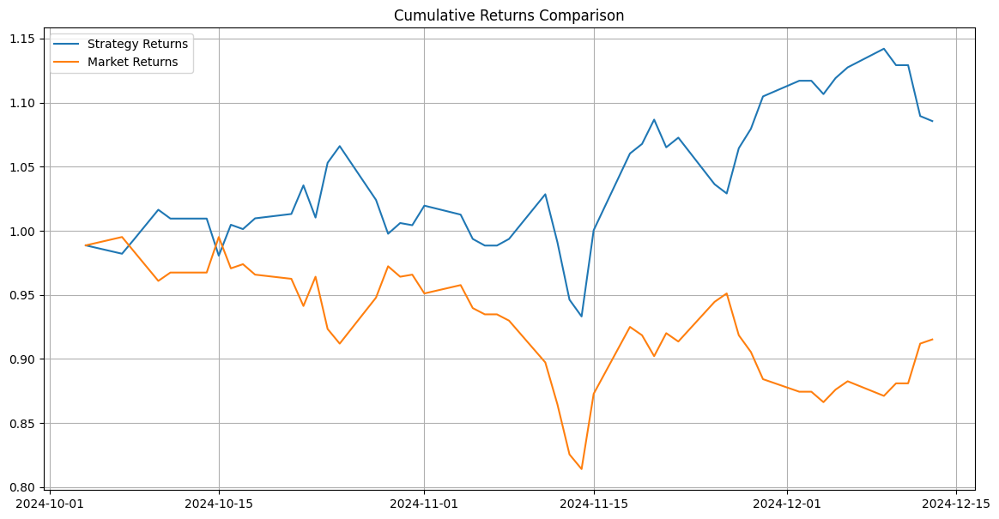

MSE: 8333568.133426844
RMSE: 2886.7920142308217
MAE: 2360.008529411765
R2: 0.579777509731035


In [26]:
import pandas as pd
import matplotlib.pyplot as plt

# 매수/매도 신호 생성
final_combined['Signal'] = 0
final_combined.loc[final_combined['Predicted_Price'] > final_combined['Close'], 'Signal'] = 1   # 매수 신호
final_combined.loc[final_combined['Predicted_Price'] < final_combined['Close'], 'Signal'] = -1  # 매도 신호

# 일일 수익률 계산
final_combined['Daily_Return'] = final_combined['Close'].pct_change()
final_combined['Strategy_Return'] = final_combined['Signal'].shift(1) * final_combined['Daily_Return']

# 누적 수익률 계산
final_combined['Cumulative_Strategy'] = (1 + final_combined['Signal'].shift(1) * final_combined['Daily_Return']).cumprod()
final_combined['Cumulative_Market'] = (1 + final_combined['Daily_Return']).cumprod()

# 결과 그래프 시각화
plt.figure(figsize=(14, 7))
plt.plot(final_combined.index, final_combined['Cumulative_Strategy'], label="Strategy Returns")
plt.plot(final_combined.index, final_combined['Cumulative_Market'], label="Market Returns")
plt.title('Cumulative Returns Comparison')
plt.legend(loc="best")
plt.grid(True)
plt.show()

# 수익률 성능 평가 지표 계산
mse = ((final_combined['Close'] - final_combined['Predicted_Price']) ** 2).mean()
rmse = mse ** 0.5
mae = abs(final_combined['Close'] - final_combined['Predicted_Price']).mean()
r2 = final_combined.corr().iloc[0, 1]  # R-squared 값 계산

print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R2: {r2}")

#!! Final+Selec:Interp(0) 피쳐 다시 re

In [20]:
seq_length = 90  # 예: 30_re일간의 데이터를 기반으로 예측
x_train, y_train = create_sequences(x_train_int0_re, y_train_int0_re, seq_length)
x_val, y_val = create_sequences(x_val_int0_re, y_val_int0_re, seq_length)
x_test, y_test = create_sequences(x_test_int0_re, y_test_int0_re, seq_length)

###re1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.2, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 37s - 677ms/step - loss: 0.1228 - mae: 0.2545 - val_loss: 0.0061 - val_mae: 0.0699
Epoch 2/100
54/54 - 18s - 329ms/step - loss: 0.0258 - mae: 0.1251 - val_loss: 0.0083 - val_mae: 0.0668
Epoch 3/100
54/54 - 1s - 22ms/step - loss: 0.0230 - mae: 0.1190 - val_loss: 0.0089 - val_mae: 0.0675
Epoch 4/100
54/54 - 1s - 24ms/step - loss: 0.0218 - mae: 0.1157 - val_loss: 0.0145 - val_mae: 0.0868
Epoch 5/100
54/54 - 1s - 17ms/step - loss: 0.0219 - mae: 0.1151 - val_loss: 0.0224 - val_mae: 0.1058
Epoch 6/100
54/54 - 1s - 23ms/step - loss: 0.0202 - mae: 0.1111 - val_loss: 0.0222 - val_mae: 0.1001
Epoch 7/100
54/54 - 1s - 23ms/step - loss: 0.0188 - mae: 0.1065 - val_loss: 0.0293 - val_mae: 0.1136
Epoch 8/100
54/54 - 1s - 17ms/step - loss: 0.0170 - mae: 0.1017 - val_loss: 0.0299 - val_mae: 0.1155
Epoch 9/100
54/54 - 1s - 18ms/step - loss: 0.0173 - mae: 0.1017 - val_loss: 0.0254 - val_mae: 0.1117
Epoch 10/100
54/54 - 1s - 22ms/step - loss: 0.0170 - mae: 0.1005 - val_loss: 0.0300 - v

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.006059773524419407
Root Mean Squared Error (RMSE): 0.07784454717203644
Mean Absolute Error (MAE): 0.0699031922737598
R^2 Score: 0.5283449160744211

### After Inverse Transform
Mean Squared Error (MSE): 56316532.96393115
Root Mean Squared Error (RMSE): 7504.434220108212
Mean Absolute Error (MAE): 6710.961873485111
R^2 Score: 0.4275616106974153


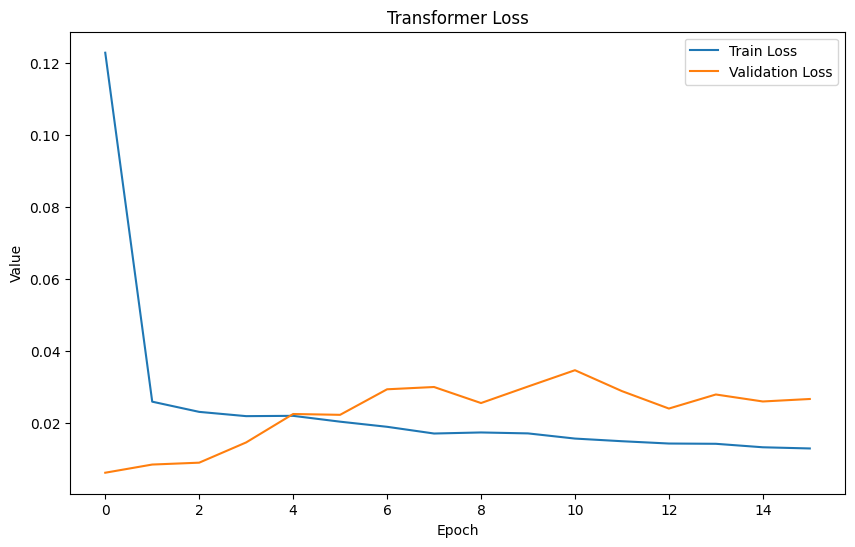

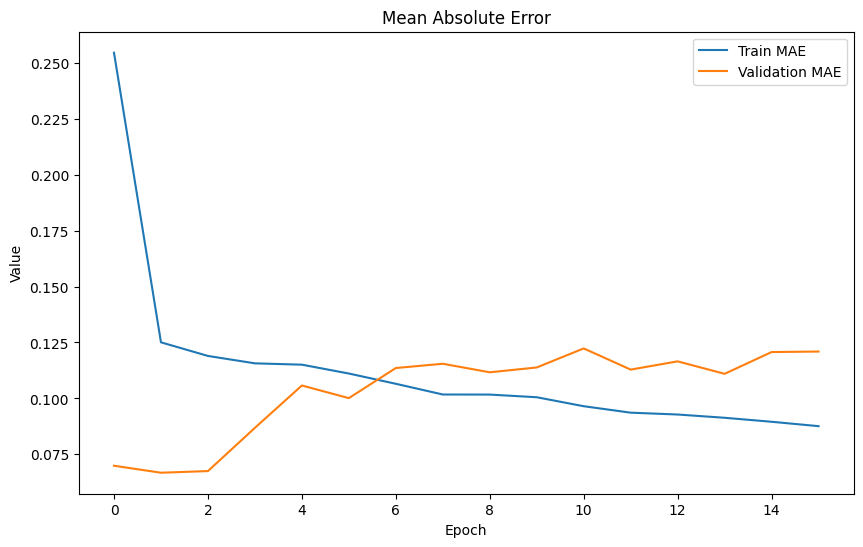

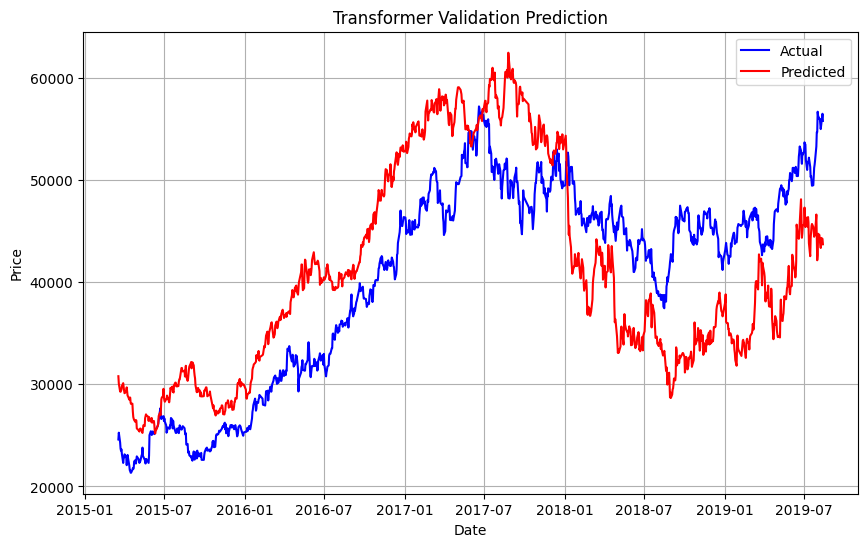

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step
Mean Absolute Error (MAE): 24034.653083405687
Root Mean Squared Error (RMSE): 25436.437174809624


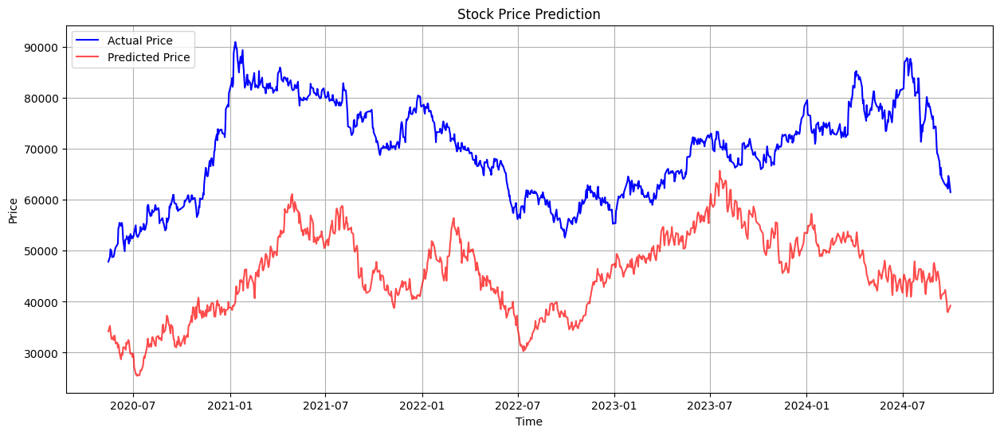

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###re2

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=256, num_blocks=4, dropout_rate=0.2, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 39s - 715ms/step - loss: 0.4260 - mae: 0.4646 - val_loss: 0.0736 - val_mae: 0.1965
Epoch 2/100
54/54 - 16s - 298ms/step - loss: 0.0394 - mae: 0.1577 - val_loss: 0.1235 - val_mae: 0.2404
Epoch 3/100
54/54 - 1s - 24ms/step - loss: 0.0280 - mae: 0.1326 - val_loss: 0.1576 - val_mae: 0.2675
Epoch 4/100
54/54 - 1s - 24ms/step - loss: 0.0252 - mae: 0.1259 - val_loss: 0.1946 - val_mae: 0.2905
Epoch 5/100
54/54 - 2s - 45ms/step - loss: 0.0225 - mae: 0.1195 - val_loss: 0.2381 - val_mae: 0.3226
Epoch 6/100
54/54 - 1s - 23ms/step - loss: 0.0196 - mae: 0.1108 - val_loss: 0.2438 - val_mae: 0.3214
Epoch 7/100
54/54 - 1s - 22ms/step - loss: 0.0188 - mae: 0.1087 - val_loss: 0.2321 - val_mae: 0.3142
Epoch 8/100
54/54 - 1s - 22ms/step - loss: 0.0172 - mae: 0.1033 - val_loss: 0.2050 - val_mae: 0.2975
Epoch 9/100
54/54 - 1s - 22ms/step - loss: 0.0154 - mae: 0.0975 - val_loss: 0.1959 - val_mae: 0.2905
Epoch 10/100
54/54 - 1s - 24ms/step - loss: 0.0157 - mae: 0.0998 - val_loss: 0.2014 - v

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.07357279969148253
Root Mean Squared Error (RMSE): 0.27124306385875113
Mean Absolute Error (MAE): 0.1964567727899495
R^2 Score: -4.726449160730102

### After Inverse Transform
Mean Squared Error (MSE): 350966131.5021016
Root Mean Squared Error (RMSE): 18734.090090049787
Mean Absolute Error (MAE): 14277.747072115939
R^2 Score: -2.5674512695143368


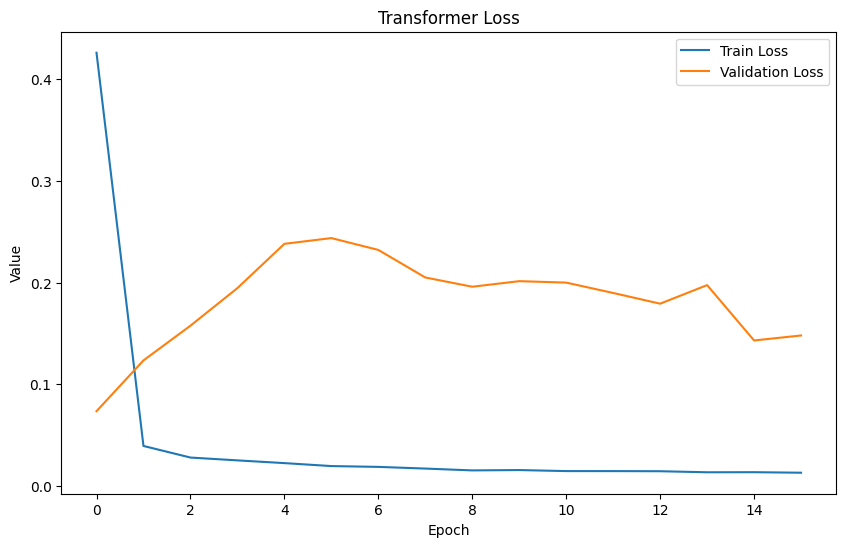

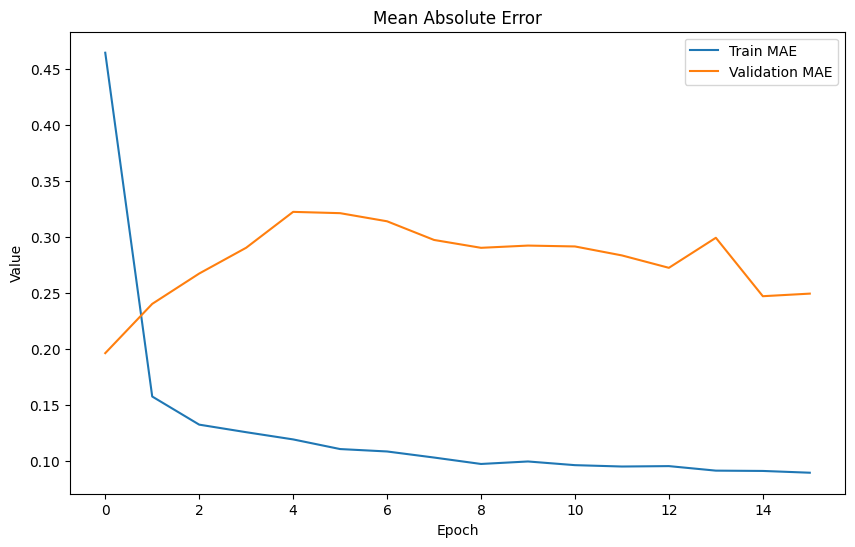

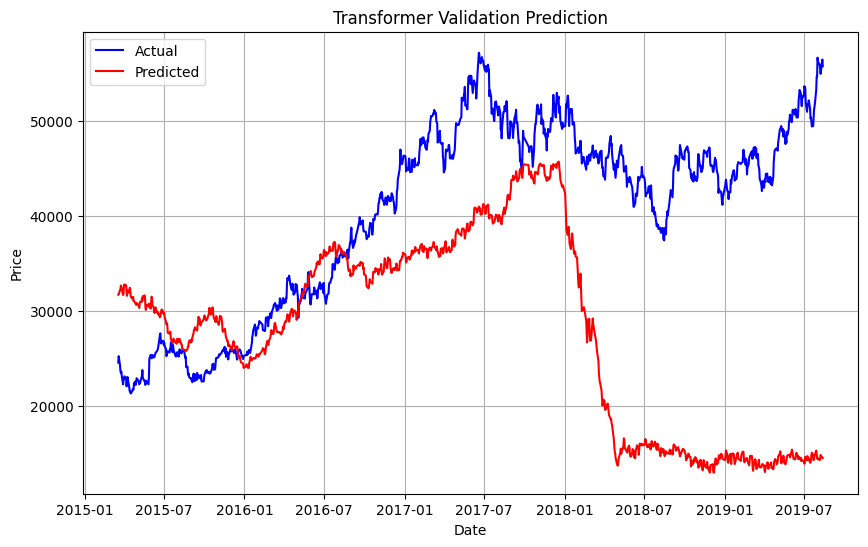

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

###re2

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=128, ff_dim=256, num_blocks=4, dropout_rate=0.2, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 34s - 637ms/step - loss: 0.7820 - mae: 0.6573 - val_loss: 0.5003 - val_mae: 0.4610
Epoch 2/100
54/54 - 1s - 19ms/step - loss: 0.0956 - mae: 0.2357 - val_loss: 0.4243 - val_mae: 0.4453
Epoch 3/100
54/54 - 1s - 19ms/step - loss: 0.0415 - mae: 0.1575 - val_loss: 0.2998 - val_mae: 0.3760
Epoch 4/100
54/54 - 1s - 23ms/step - loss: 0.0336 - mae: 0.1424 - val_loss: 0.2047 - val_mae: 0.3148
Epoch 5/100
54/54 - 1s - 25ms/step - loss: 0.0278 - mae: 0.1288 - val_loss: 0.1579 - val_mae: 0.2629
Epoch 6/100
54/54 - 1s - 24ms/step - loss: 0.0241 - mae: 0.1213 - val_loss: 0.1067 - val_mae: 0.2195
Epoch 7/100
54/54 - 1s - 23ms/step - loss: 0.0211 - mae: 0.1142 - val_loss: 0.0720 - val_mae: 0.1892
Epoch 8/100
54/54 - 1s - 22ms/step - loss: 0.0195 - mae: 0.1099 - val_loss: 0.0569 - val_mae: 0.1532
Epoch 9/100
54/54 - 1s - 18ms/step - loss: 0.0192 - mae: 0.1089 - val_loss: 0.0352 - val_mae: 0.1307
Epoch 10/100
54/54 - 1s - 24ms/step - loss: 0.0177 - mae: 0.1047 - val_loss: 0.0312 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.0006089762326604139
Root Mean Squared Error (RMSE): 0.02467744380320648
Mean Absolute Error (MAE): 0.01904101813622105
R^2 Score: 0.9526010774220065

### After Inverse Transform
Mean Squared Error (MSE): 6610000.886109191
Root Mean Squared Error (RMSE): 2570.9921987647476
Mean Absolute Error (MAE): 1891.8824572224146
R^2 Score: 0.9328115908172754


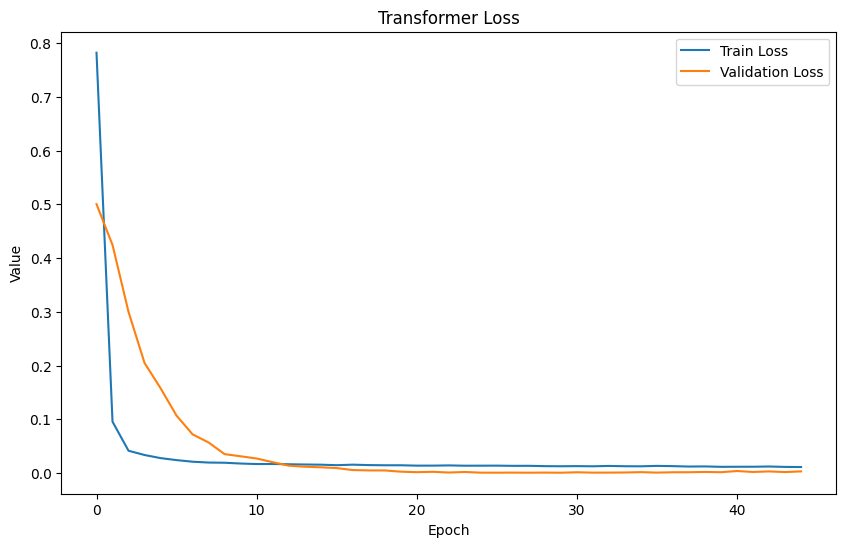

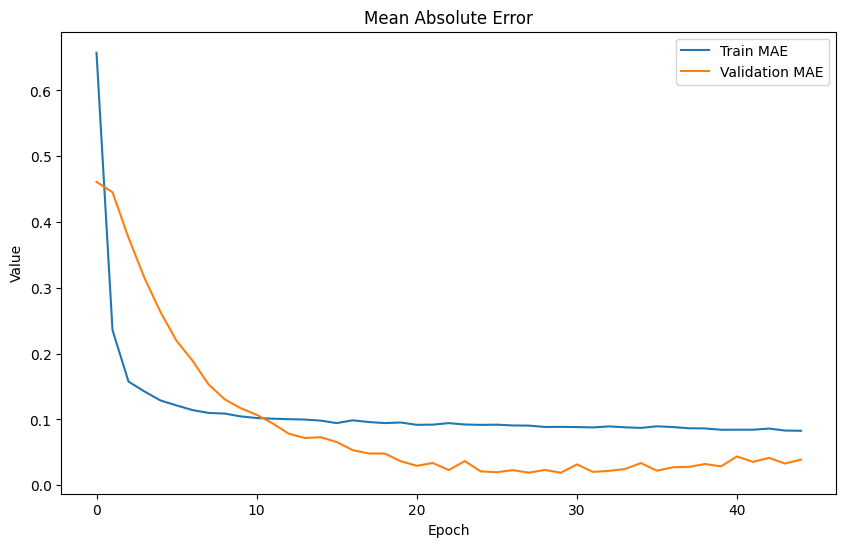

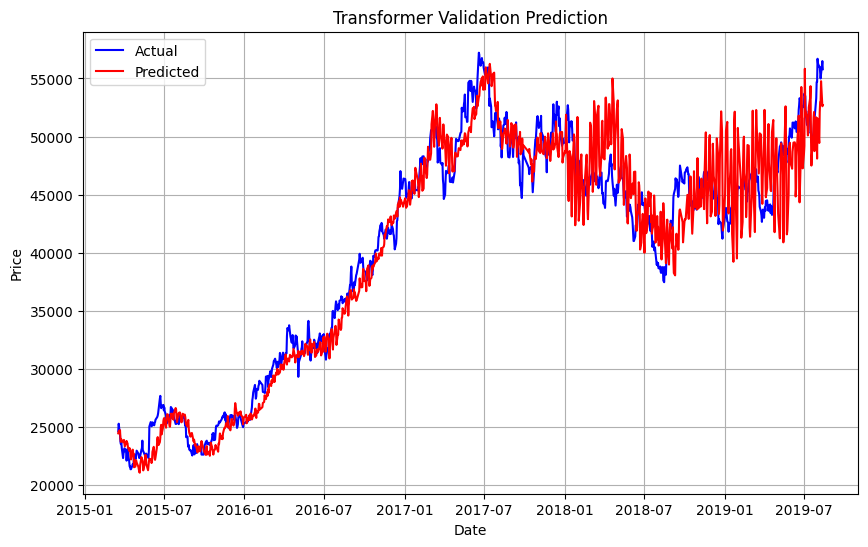

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

###re2

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=128, ff_dim=256, num_blocks=4, dropout_rate=0.1, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 33s - 613ms/step - loss: 0.0659 - mae: 0.1837 - val_loss: 0.2053 - val_mae: 0.3099
Epoch 2/100
54/54 - 1s - 20ms/step - loss: 0.0157 - mae: 0.0958 - val_loss: 0.1632 - val_mae: 0.2641
Epoch 3/100
54/54 - 1s - 20ms/step - loss: 0.0121 - mae: 0.0853 - val_loss: 0.1158 - val_mae: 0.2287
Epoch 4/100
54/54 - 1s - 23ms/step - loss: 0.0101 - mae: 0.0790 - val_loss: 0.0764 - val_mae: 0.1848
Epoch 5/100
54/54 - 1s - 21ms/step - loss: 0.0095 - mae: 0.0771 - val_loss: 0.0518 - val_mae: 0.1539
Epoch 6/100
54/54 - 1s - 20ms/step - loss: 0.0089 - mae: 0.0741 - val_loss: 0.0394 - val_mae: 0.1390
Epoch 7/100
54/54 - 1s - 22ms/step - loss: 0.0086 - mae: 0.0724 - val_loss: 0.0281 - val_mae: 0.1154
Epoch 8/100
54/54 - 1s - 23ms/step - loss: 0.0084 - mae: 0.0727 - val_loss: 0.0216 - val_mae: 0.1014
Epoch 9/100
54/54 - 1s - 23ms/step - loss: 0.0082 - mae: 0.0710 - val_loss: 0.0219 - val_mae: 0.1074
Epoch 10/100
54/54 - 1s - 18ms/step - loss: 0.0080 - mae: 0.0700 - val_loss: 0.0163 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.0007943150259771062
Root Mean Squared Error (RMSE): 0.028183594979652723
Mean Absolute Error (MAE): 0.022088570628480214
R^2 Score: 0.9381754584175692

### After Inverse Transform
Mean Squared Error (MSE): 8512059.315858832
Root Mean Squared Error (RMSE): 2917.543370004777
Mean Absolute Error (MAE): 2170.469797798361
R^2 Score: 0.9134778142763326


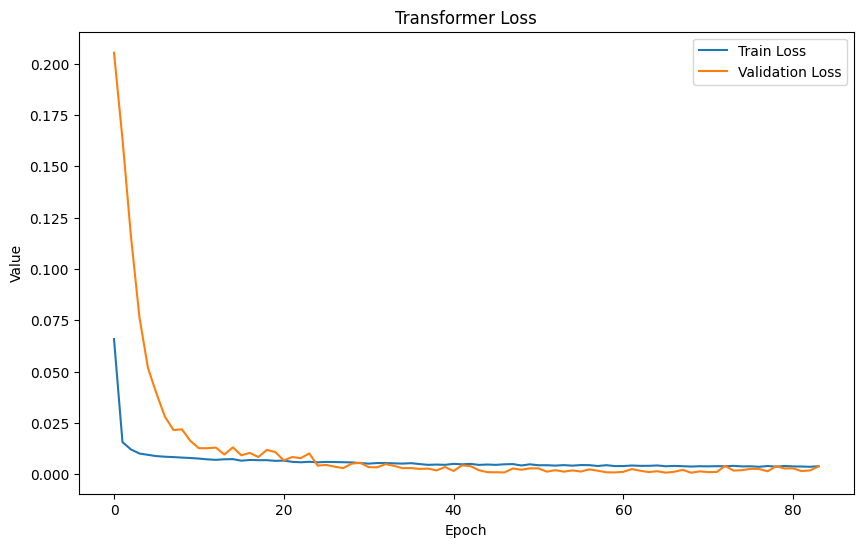

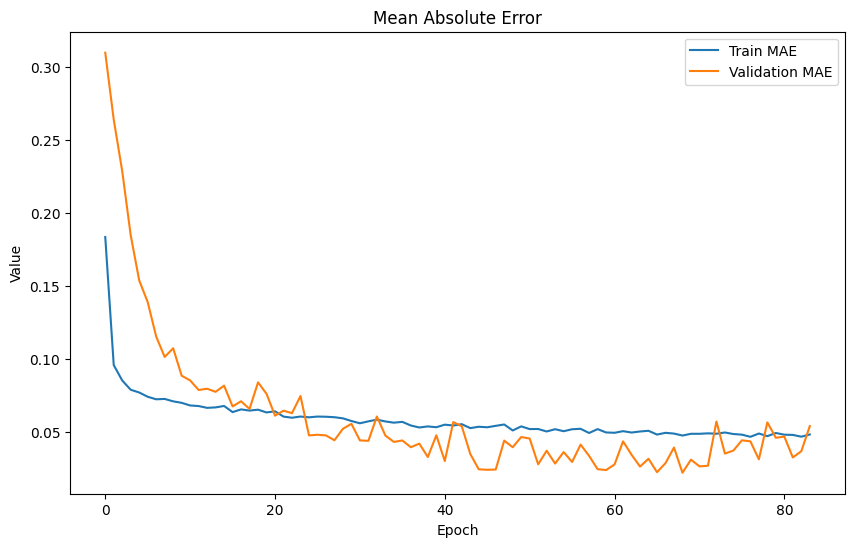

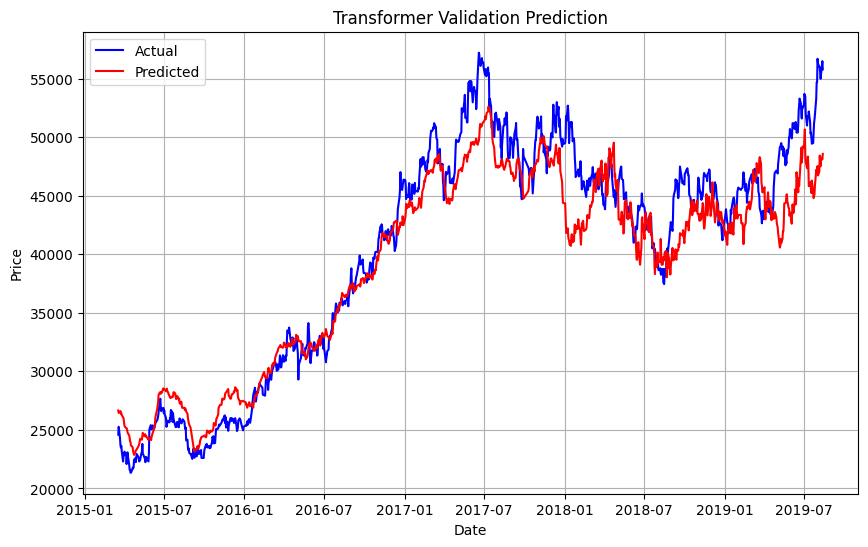

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.008889059820928547
Root Mean Squared Error (RMSE): 0.09428181065788112
Mean Absolute Error (MAE): 0.08629305911357879
R^2 Score: -1.8126207860033694

Mean Absolute Error (MAE): 13461.050817418993
Mean Squared Error (MSE): 226446386.2055777
Root Mean Squared Error (RMSE): 15048.135638861637
R-squared (R2): -1.6296841892283833


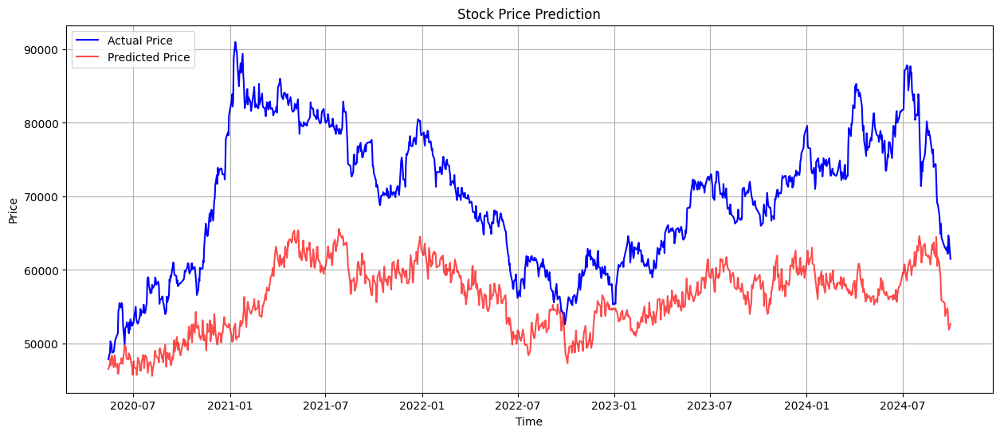

(0.008889059820928547,
 0.08629305911357879,
 0.09428181065788112,
 -1.8126207860033694)

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

###re2

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=64, ff_dim=256, num_blocks=4, dropout_rate=0.1, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 37s - 689ms/step - loss: 0.2786 - mae: 0.3711 - val_loss: 0.0432 - val_mae: 0.1801
Epoch 2/100
54/54 - 17s - 319ms/step - loss: 0.0339 - mae: 0.1428 - val_loss: 0.0399 - val_mae: 0.1489
Epoch 3/100
54/54 - 1s - 16ms/step - loss: 0.0243 - mae: 0.1221 - val_loss: 0.0360 - val_mae: 0.1414
Epoch 4/100
54/54 - 1s - 22ms/step - loss: 0.0211 - mae: 0.1130 - val_loss: 0.0325 - val_mae: 0.1317
Epoch 5/100
54/54 - 1s - 16ms/step - loss: 0.0182 - mae: 0.1041 - val_loss: 0.0332 - val_mae: 0.1343
Epoch 6/100
54/54 - 1s - 22ms/step - loss: 0.0165 - mae: 0.0989 - val_loss: 0.0299 - val_mae: 0.1285
Epoch 7/100
54/54 - 1s - 14ms/step - loss: 0.0157 - mae: 0.0965 - val_loss: 0.0289 - val_mae: 0.1241
Epoch 8/100
54/54 - 1s - 23ms/step - loss: 0.0141 - mae: 0.0918 - val_loss: 0.0290 - val_mae: 0.1289
Epoch 9/100
54/54 - 1s - 24ms/step - loss: 0.0140 - mae: 0.0917 - val_loss: 0.0206 - val_mae: 0.1039
Epoch 10/100
54/54 - 1s - 15ms/step - loss: 0.0127 - mae: 0.0861 - val_loss: 0.0212 - v

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.007963173883899069
Root Mean Squared Error (RMSE): 0.08923661739386511
Mean Absolute Error (MAE): 0.06321592384096225
R^2 Score: 0.38019606980538967

### After Inverse Transform
Mean Squared Error (MSE): 70749468.26651162
Root Mean Squared Error (RMSE): 8411.270312295974
Mean Absolute Error (MAE): 5924.856767226454
R^2 Score: 0.28085573583808965


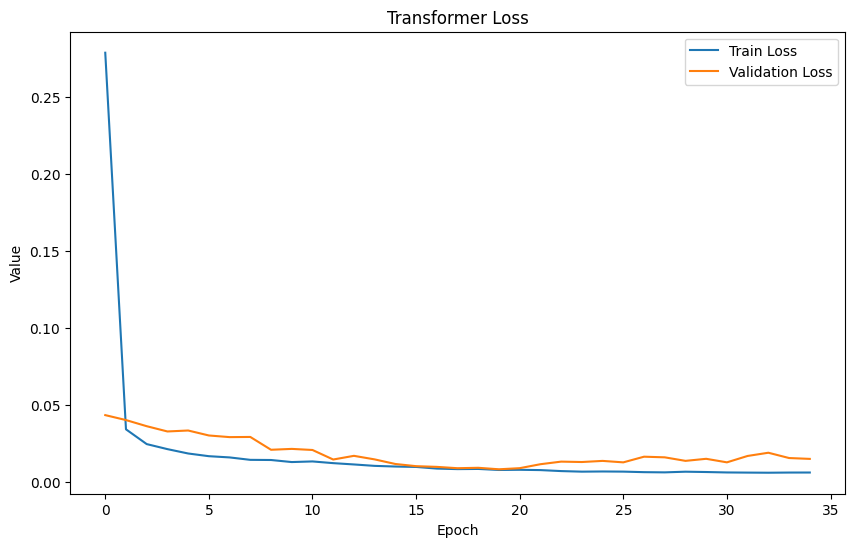

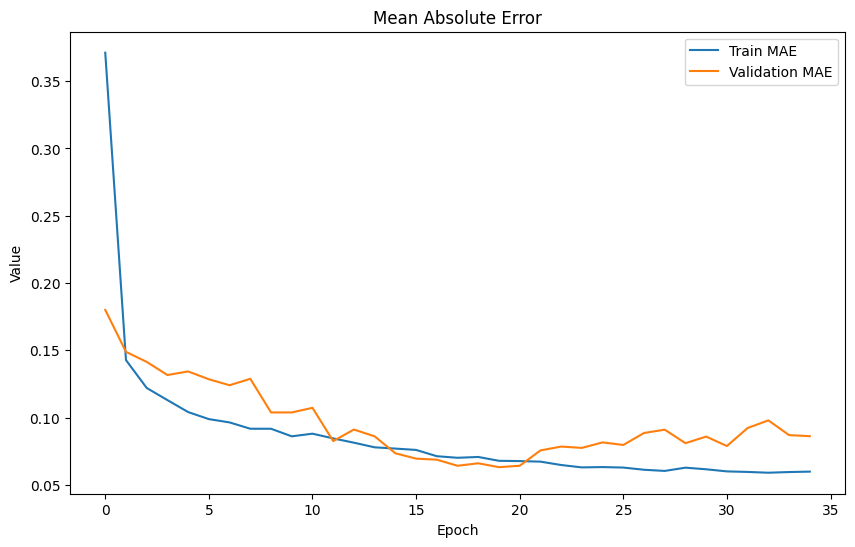

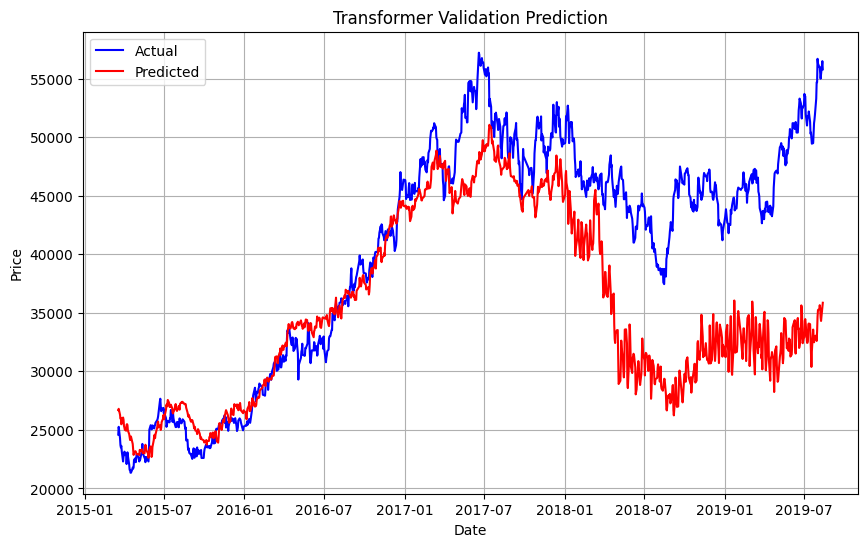

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.06386599981075917
Root Mean Squared Error (RMSE): 0.25271723291212095
Mean Absolute Error (MAE): 0.24845414781620218
R^2 Score: -19.208080742544084

Mean Absolute Error (MAE): 31666.610503472235
Mean Squared Error (MSE): 1065283031.0092713
Root Mean Squared Error (RMSE): 32638.67385494195
R-squared (R2): -11.370954514395198


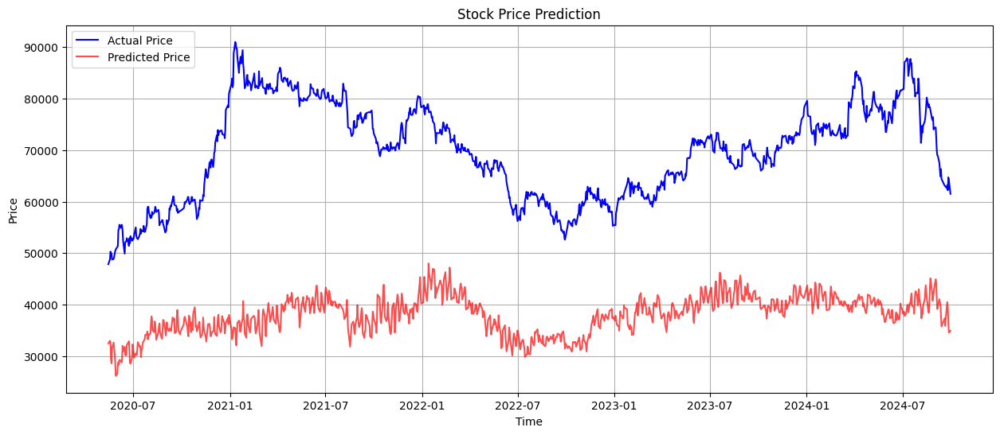

(0.06386599981075917,
 0.24845414781620218,
 0.25271723291212095,
 -19.208080742544084)

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

###re2

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=128, ff_dim=128, num_blocks=4, dropout_rate=0.2, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 40s - 740ms/step - loss: 0.1405 - mae: 0.2657 - val_loss: 0.4655 - val_mae: 0.4755
Epoch 2/100
54/54 - 1s - 19ms/step - loss: 0.0270 - mae: 0.1281 - val_loss: 0.3298 - val_mae: 0.3968
Epoch 3/100
54/54 - 1s - 19ms/step - loss: 0.0217 - mae: 0.1166 - val_loss: 0.2050 - val_mae: 0.3207
Epoch 4/100
54/54 - 1s - 23ms/step - loss: 0.0207 - mae: 0.1131 - val_loss: 0.1527 - val_mae: 0.2734
Epoch 5/100
54/54 - 1s - 22ms/step - loss: 0.0186 - mae: 0.1072 - val_loss: 0.1177 - val_mae: 0.2403
Epoch 6/100
54/54 - 1s - 26ms/step - loss: 0.0170 - mae: 0.1025 - val_loss: 0.0886 - val_mae: 0.2087
Epoch 7/100
54/54 - 1s - 23ms/step - loss: 0.0166 - mae: 0.1027 - val_loss: 0.0543 - val_mae: 0.1948
Epoch 8/100
54/54 - 1s - 20ms/step - loss: 0.0170 - mae: 0.1033 - val_loss: 0.0510 - val_mae: 0.1636
Epoch 9/100
54/54 - 1s - 22ms/step - loss: 0.0155 - mae: 0.0984 - val_loss: 0.0458 - val_mae: 0.1571
Epoch 10/100
54/54 - 1s - 18ms/step - loss: 0.0143 - mae: 0.0946 - val_loss: 0.0384 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.012326638003154058
Root Mean Squared Error (RMSE): 0.11102539350596358
Mean Absolute Error (MAE): 0.09655915473261127
R^2 Score: 0.040571160214292745

### After Inverse Transform
Mean Squared Error (MSE): 105972514.74519989
Root Mean Squared Error (RMSE): 10294.295252478427
Mean Absolute Error (MAE): 8962.229669826293
R^2 Score: -0.07717454286362191


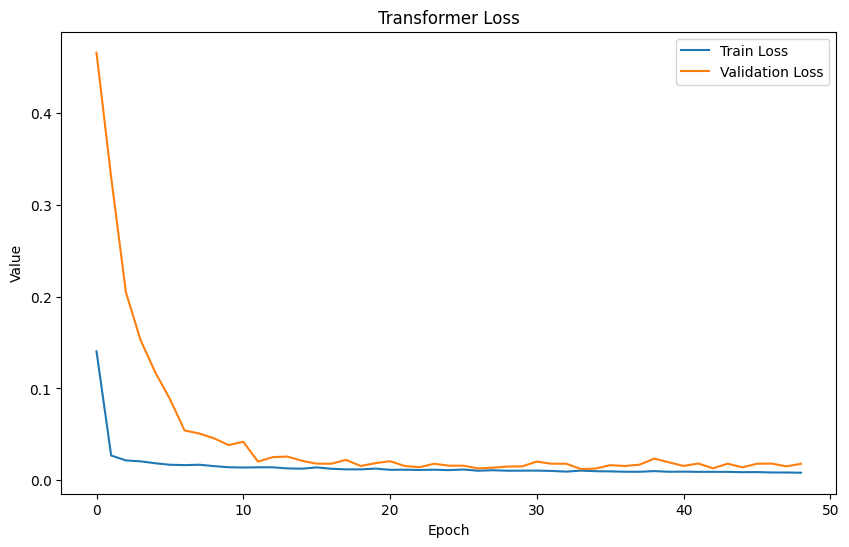

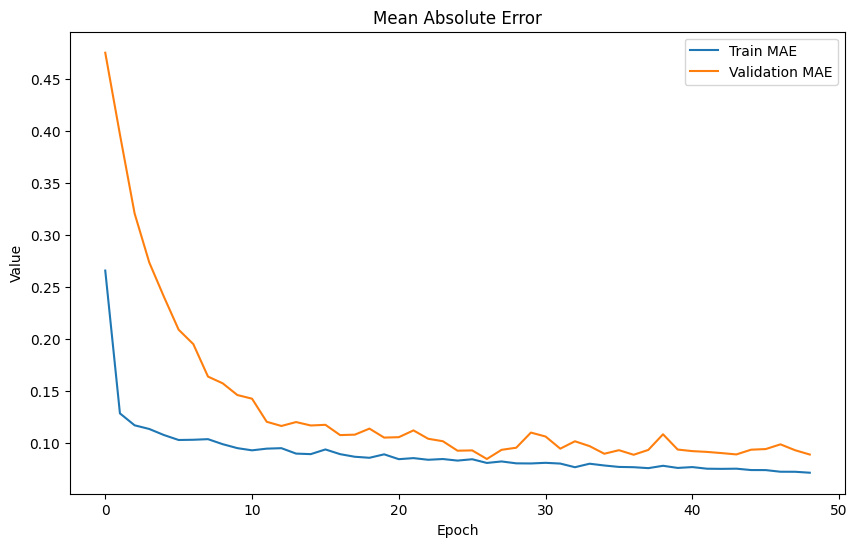

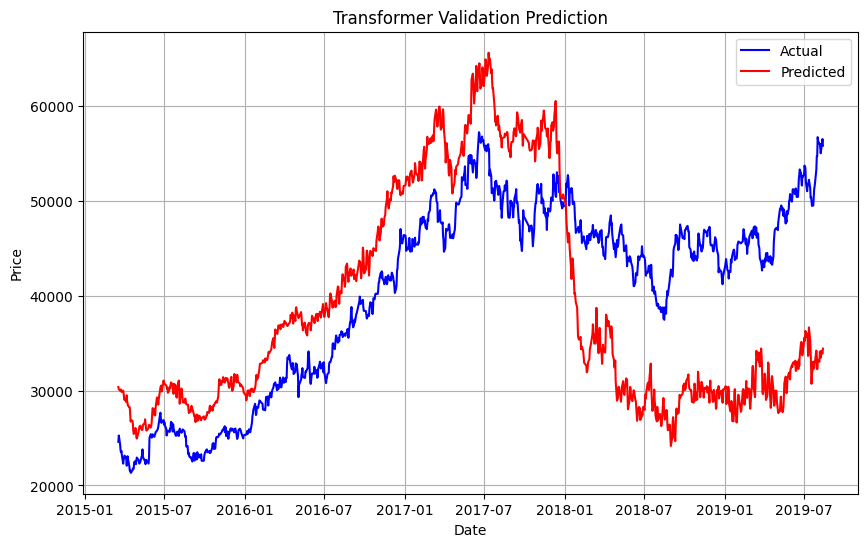

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.06575552169609582
Root Mean Squared Error (RMSE): 0.2564283948709577
Mean Absolute Error (MAE): 0.2516937188709787
R^2 Score: -19.80595145523673

Mean Absolute Error (MAE): 31824.32445927374
Mean Squared Error (MSE): 1071748961.9619362
Root Mean Squared Error (RMSE): 32737.577215822435
R-squared (R2): -11.446042294243577


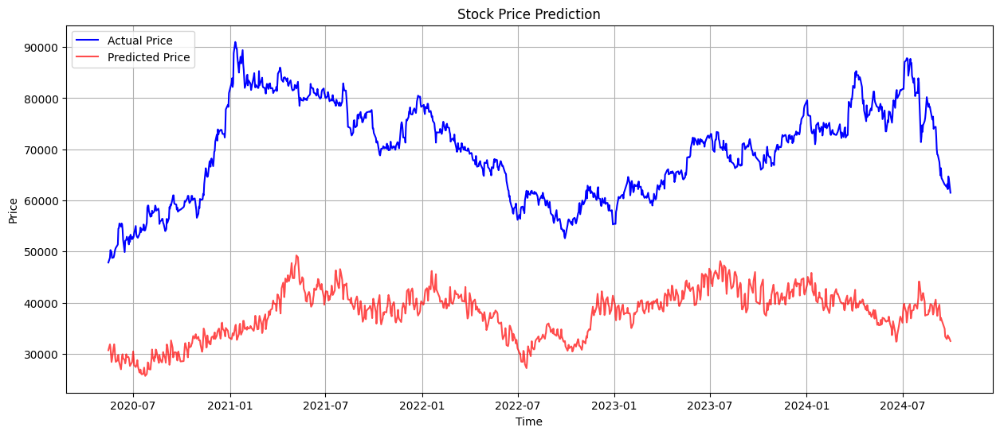

(0.06575552169609582,
 0.2516937188709787,
 0.2564283948709577,
 -19.80595145523673)

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

###re2

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=256, num_blocks=4, dropout_rate=0.1, lr=0.0002,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 32s - 602ms/step - loss: 0.0697 - mae: 0.1821 - val_loss: 0.1895 - val_mae: 0.2941
Epoch 2/100
54/54 - 1s - 23ms/step - loss: 0.0160 - mae: 0.0986 - val_loss: 0.1622 - val_mae: 0.2618
Epoch 3/100
54/54 - 1s - 23ms/step - loss: 0.0119 - mae: 0.0854 - val_loss: 0.1279 - val_mae: 0.2284
Epoch 4/100
54/54 - 1s - 24ms/step - loss: 0.0096 - mae: 0.0773 - val_loss: 0.0867 - val_mae: 0.1913
Epoch 5/100
54/54 - 1s - 24ms/step - loss: 0.0082 - mae: 0.0714 - val_loss: 0.0603 - val_mae: 0.1771
Epoch 6/100
54/54 - 2s - 45ms/step - loss: 0.0081 - mae: 0.0708 - val_loss: 0.0602 - val_mae: 0.1607
Epoch 7/100
54/54 - 1s - 22ms/step - loss: 0.0074 - mae: 0.0678 - val_loss: 0.0492 - val_mae: 0.1459
Epoch 8/100
54/54 - 1s - 23ms/step - loss: 0.0071 - mae: 0.0658 - val_loss: 0.0412 - val_mae: 0.1346
Epoch 9/100
54/54 - 1s - 22ms/step - loss: 0.0070 - mae: 0.0649 - val_loss: 0.0374 - val_mae: 0.1293
Epoch 10/100
54/54 - 1s - 22ms/step - loss: 0.0071 - mae: 0.0661 - val_loss: 0.0448 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.011912860926193682
Root Mean Squared Error (RMSE): 0.10914605318651555
Mean Absolute Error (MAE): 0.07606366878079031
R^2 Score: 0.07277699450393726

### After Inverse Transform
Mean Squared Error (MSE): 97520715.84795907
Root Mean Squared Error (RMSE): 9875.257761089533
Mean Absolute Error (MAE): 6779.849668888504
R^2 Score: 0.008735116215436767


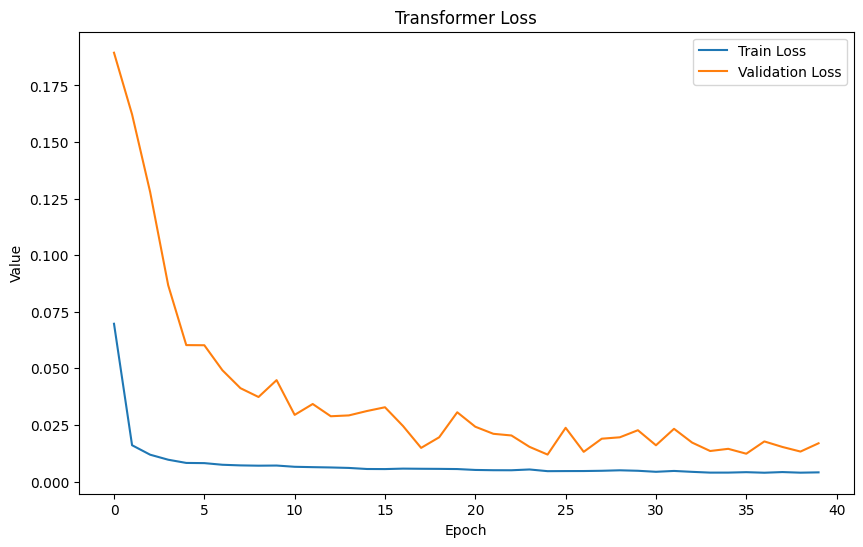

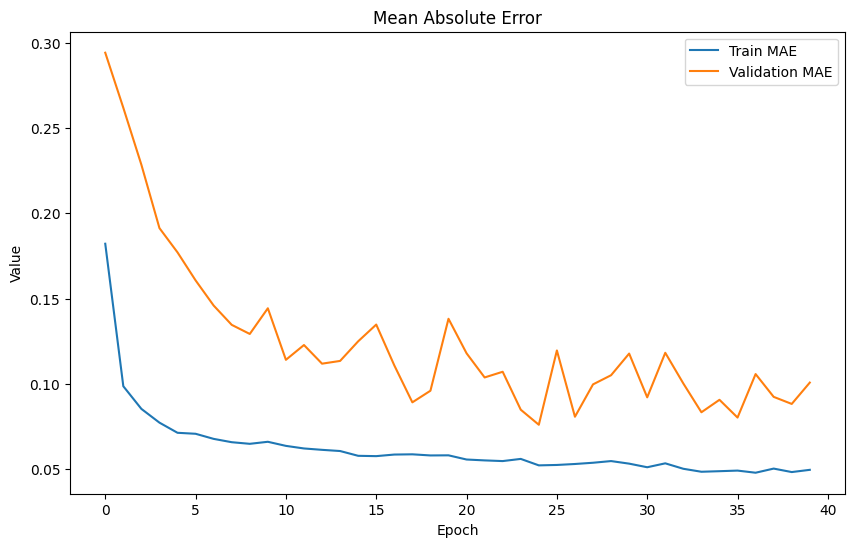

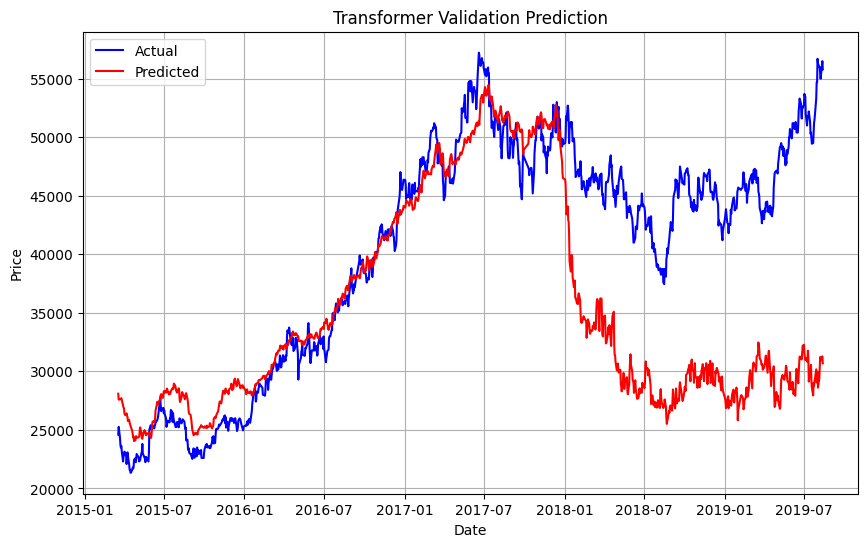

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.08327702034127371
Root Mean Squared Error (RMSE): 0.2885775811480748
Mean Absolute Error (MAE): 0.2804959890648734
R^2 Score: -25.349994614371337

Mean Absolute Error (MAE): 34288.00891927085
Mean Squared Error (MSE): 1259068047.7094069
Root Mean Squared Error (RMSE): 35483.348879571764
R-squared (R2): -13.621347656298


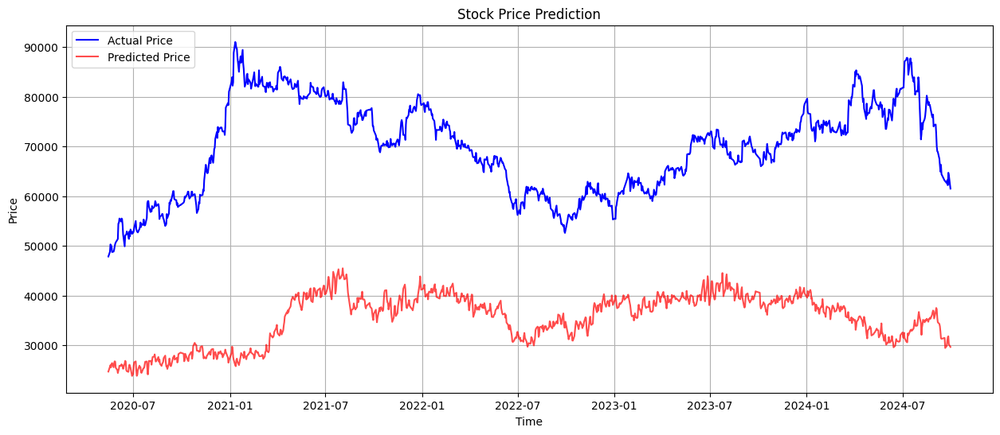

(0.08327702034127371,
 0.2804959890648734,
 0.2885775811480748,
 -25.349994614371337)

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

###re2

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0, lr=0.0002,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 18s - 341ms/step - loss: 0.0206 - mae: 0.0833 - val_loss: 0.0532 - val_mae: 0.1491
Epoch 2/100
54/54 - 1s - 18ms/step - loss: 0.0018 - mae: 0.0337 - val_loss: 0.0665 - val_mae: 0.1700
Epoch 3/100
54/54 - 1s - 17ms/step - loss: 0.0015 - mae: 0.0309 - val_loss: 0.0844 - val_mae: 0.1978
Epoch 4/100
54/54 - 1s - 24ms/step - loss: 0.0015 - mae: 0.0309 - val_loss: 0.0794 - val_mae: 0.1917
Epoch 5/100
54/54 - 1s - 24ms/step - loss: 0.0013 - mae: 0.0277 - val_loss: 0.0648 - val_mae: 0.1682
Epoch 6/100
54/54 - 1s - 19ms/step - loss: 0.0012 - mae: 0.0272 - val_loss: 0.0629 - val_mae: 0.1676
Epoch 7/100
54/54 - 1s - 17ms/step - loss: 0.0012 - mae: 0.0277 - val_loss: 0.0573 - val_mae: 0.1639
Epoch 8/100
54/54 - 1s - 17ms/step - loss: 0.0011 - mae: 0.0251 - val_loss: 0.0558 - val_mae: 0.1620
Epoch 9/100
54/54 - 1s - 17ms/step - loss: 0.0010 - mae: 0.0247 - val_loss: 0.0523 - val_mae: 0.1608
Epoch 10/100
54/54 - 1s - 17ms/step - loss: 8.5500e-04 - mae: 0.0226 - val_loss: 0.0451 -

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.020799239547762687
Root Mean Squared Error (RMSE): 0.1442194146006795
Mean Absolute Error (MAE): 0.09878349963368566
R^2 Score: -0.6188834508345993

### After Inverse Transform
Mean Squared Error (MSE): 148812986.75429237
Root Mean Squared Error (RMSE): 12198.892849529107
Mean Absolute Error (MAE): 8523.684253808864
R^2 Score: -0.512633359363456


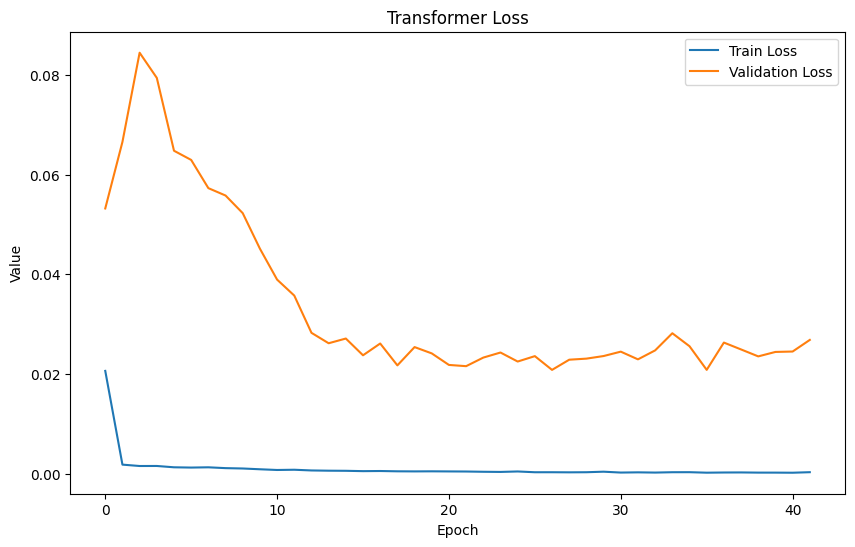

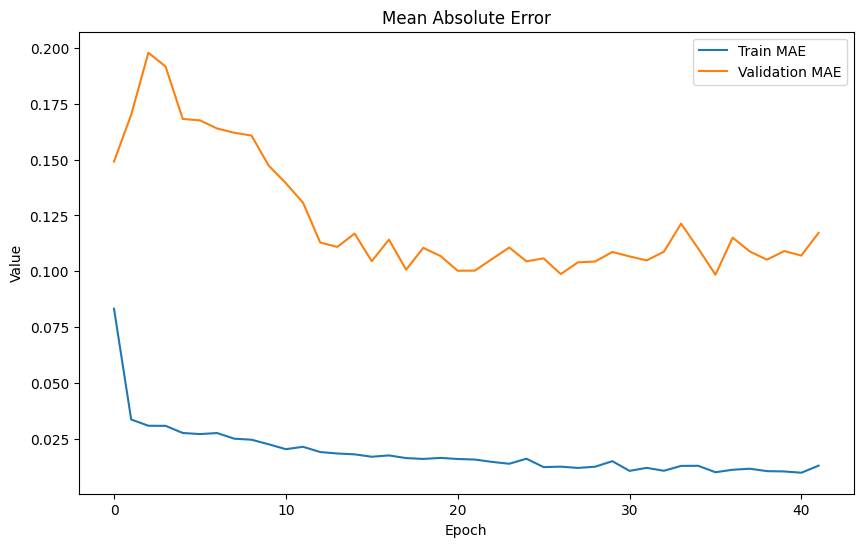

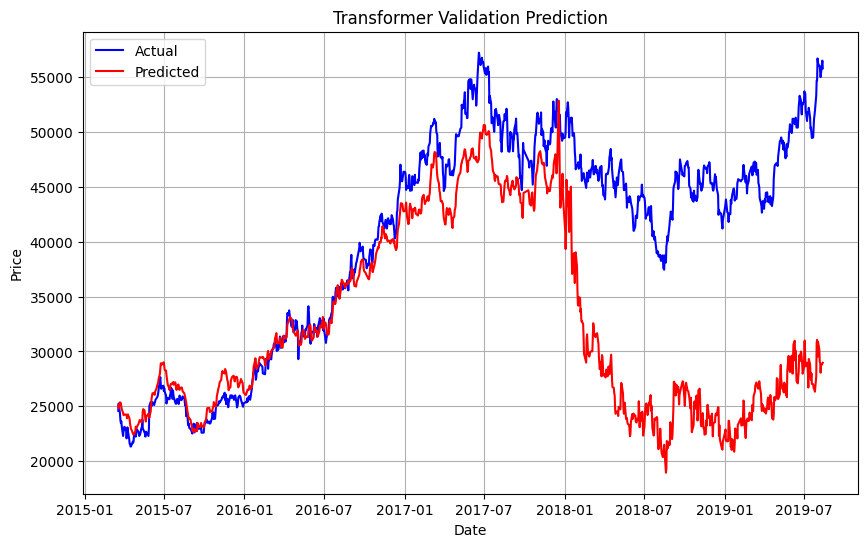

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.11879948719941509
Root Mean Squared Error (RMSE): 0.34467301489878066
Mean Absolute Error (MAE): 0.34119914954067493
R^2 Score: -36.58979169843321

Mean Absolute Error (MAE): 39184.84831452548
Mean Squared Error (MSE): 1594038509.5112386
Root Mean Squared Error (RMSE): 39925.41182644505
R-squared (R2): -17.511303870742147


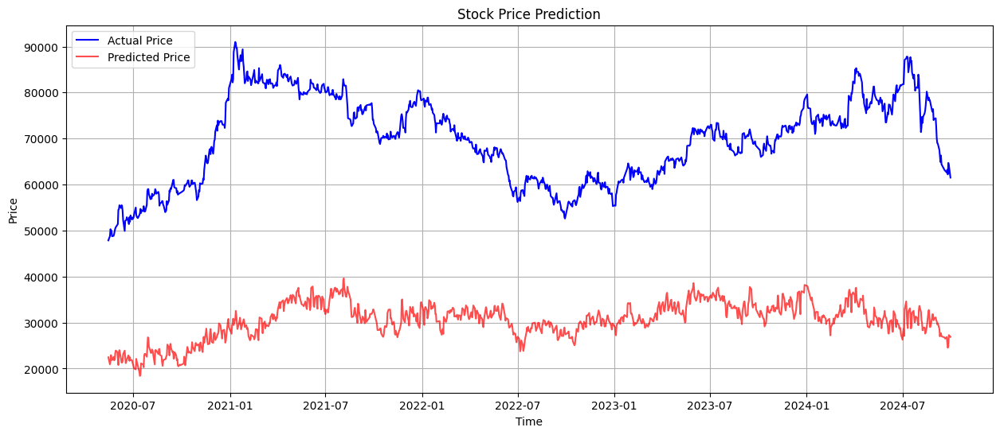

(0.11879948719941509,
 0.34119914954067493,
 0.34467301489878066,
 -36.58979169843321)

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

###re2

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.3, lr=0.0002,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 27s - 499ms/step - loss: 0.3002 - mae: 0.3969 - val_loss: 0.0980 - val_mae: 0.2328
Epoch 2/100
54/54 - 1s - 20ms/step - loss: 0.0483 - mae: 0.1746 - val_loss: 0.0610 - val_mae: 0.1684
Epoch 3/100
54/54 - 1s - 19ms/step - loss: 0.0311 - mae: 0.1396 - val_loss: 0.0457 - val_mae: 0.1461
Epoch 4/100
54/54 - 1s - 23ms/step - loss: 0.0275 - mae: 0.1303 - val_loss: 0.0350 - val_mae: 0.1265
Epoch 5/100
54/54 - 1s - 22ms/step - loss: 0.0252 - mae: 0.1254 - val_loss: 0.0303 - val_mae: 0.1183
Epoch 6/100
54/54 - 1s - 23ms/step - loss: 0.0242 - mae: 0.1230 - val_loss: 0.0185 - val_mae: 0.0967
Epoch 7/100
54/54 - 1s - 18ms/step - loss: 0.0237 - mae: 0.1214 - val_loss: 0.0145 - val_mae: 0.0843
Epoch 8/100
54/54 - 1s - 22ms/step - loss: 0.0225 - mae: 0.1179 - val_loss: 0.0067 - val_mae: 0.0615
Epoch 9/100
54/54 - 1s - 23ms/step - loss: 0.0213 - mae: 0.1143 - val_loss: 0.0028 - val_mae: 0.0443
Epoch 10/100
54/54 - 1s - 17ms/step - loss: 0.0206 - mae: 0.1126 - val_loss: 0.0019 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.0009010930056393213
Root Mean Squared Error (RMSE): 0.030018211233171794
Mean Absolute Error (MAE): 0.023237068793048783
R^2 Score: 0.9298645245590615

### After Inverse Transform
Mean Squared Error (MSE): 9626789.209906496
Root Mean Squared Error (RMSE): 3102.706755384159
Mean Absolute Error (MAE): 2291.5438091528163
R^2 Score: 0.9021469643203387


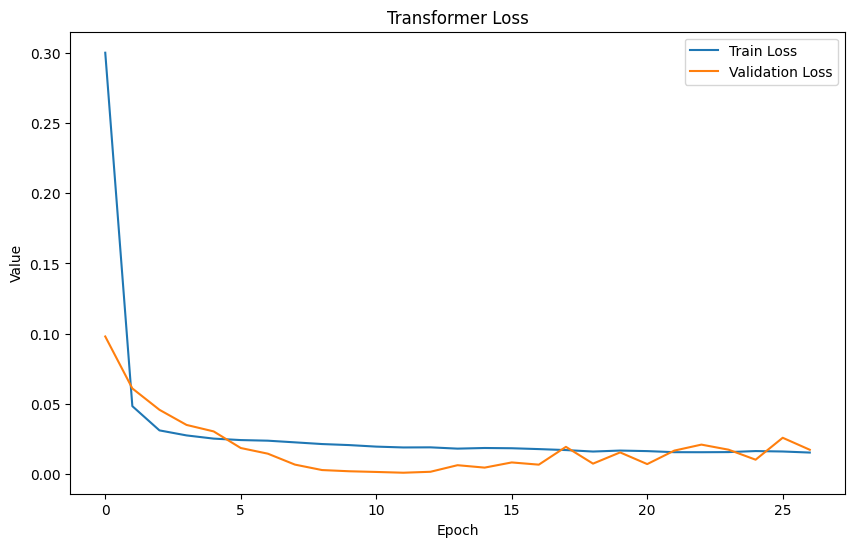

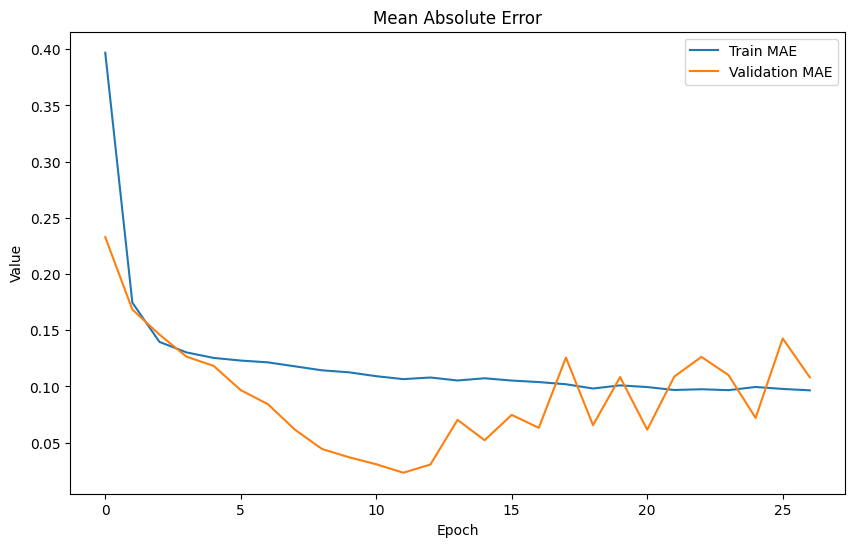

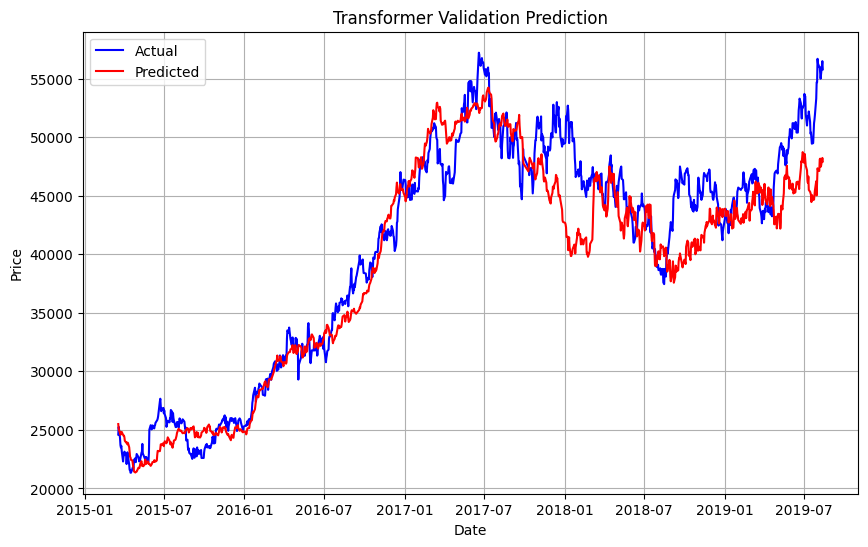

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.01006249960120191
Root Mean Squared Error (RMSE): 0.1003120112509061
Mean Absolute Error (MAE): 0.08718787450089614
R^2 Score: -2.1839132717789154

Mean Absolute Error (MAE): 13353.861360677096
Mean Squared Error (MSE): 243193259.29150707
Root Mean Squared Error (RMSE): 15594.654830790807
R-squared (R2): -1.8241628387269109


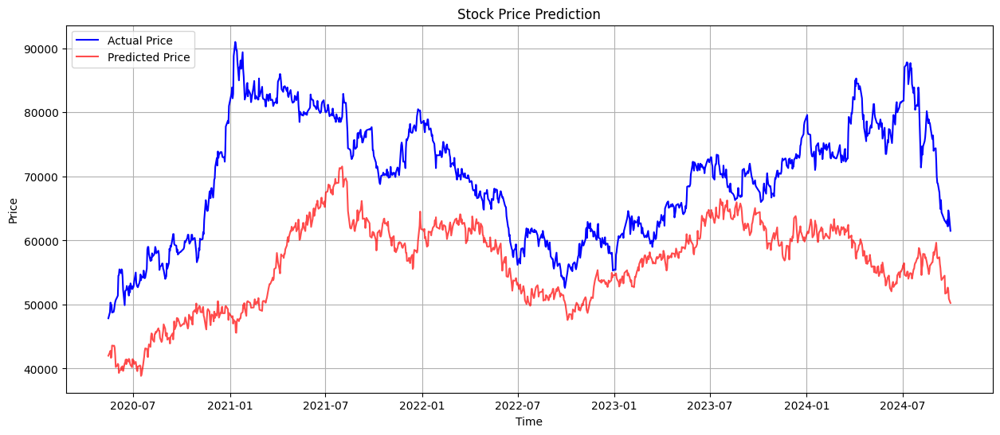

(0.01006249960120191,
 0.08718787450089614,
 0.1003120112509061,
 -2.1839132717789154)

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

###re2

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.4, lr=0.0002,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 30s - 552ms/step - loss: 0.1638 - mae: 0.2987 - val_loss: 0.0273 - val_mae: 0.1235
Epoch 2/100
54/54 - 3s - 54ms/step - loss: 0.0486 - mae: 0.1747 - val_loss: 0.0033 - val_mae: 0.0493
Epoch 3/100
54/54 - 1s - 23ms/step - loss: 0.0424 - mae: 0.1647 - val_loss: 0.0069 - val_mae: 0.0664
Epoch 4/100
54/54 - 1s - 22ms/step - loss: 0.0398 - mae: 0.1577 - val_loss: 0.0310 - val_mae: 0.1382
Epoch 5/100
54/54 - 1s - 17ms/step - loss: 0.0341 - mae: 0.1450 - val_loss: 0.0582 - val_mae: 0.1885
Epoch 6/100
54/54 - 1s - 17ms/step - loss: 0.0351 - mae: 0.1469 - val_loss: 0.0446 - val_mae: 0.1586
Epoch 7/100
54/54 - 1s - 18ms/step - loss: 0.0305 - mae: 0.1387 - val_loss: 0.0533 - val_mae: 0.1815
Epoch 8/100
54/54 - 1s - 19ms/step - loss: 0.0311 - mae: 0.1379 - val_loss: 0.0337 - val_mae: 0.1322
Epoch 9/100
54/54 - 1s - 19ms/step - loss: 0.0301 - mae: 0.1353 - val_loss: 0.0487 - val_mae: 0.1713
Epoch 10/100
54/54 - 1s - 24ms/step - loss: 0.0289 - mae: 0.1330 - val_loss: 0.0471 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.0033306083445817304
Root Mean Squared Error (RMSE): 0.05771142299910591
Mean Absolute Error (MAE): 0.0493445137859467
R^2 Score: 0.7407661603265216

### After Inverse Transform
Mean Squared Error (MSE): 34125527.11446783
Root Mean Squared Error (RMSE): 5841.70583943319
Mean Absolute Error (MAE): 4839.632341802286
R^2 Score: 0.6531256320764809


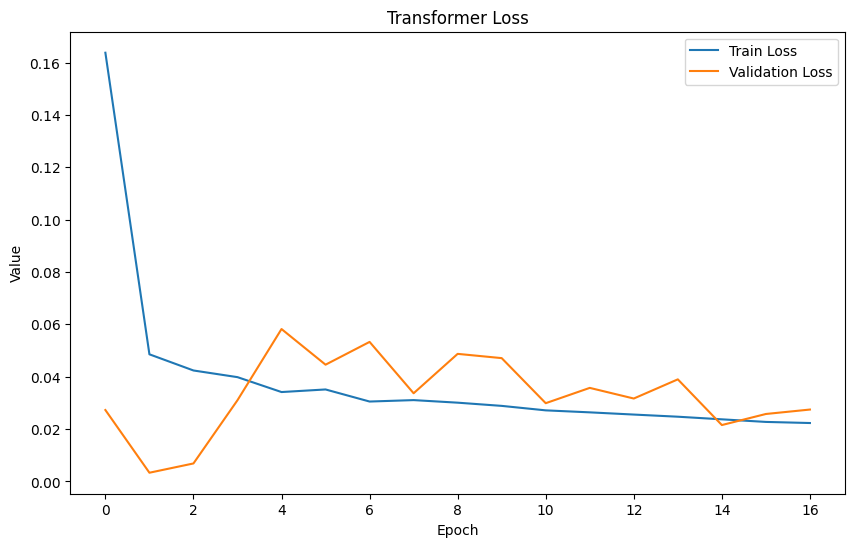

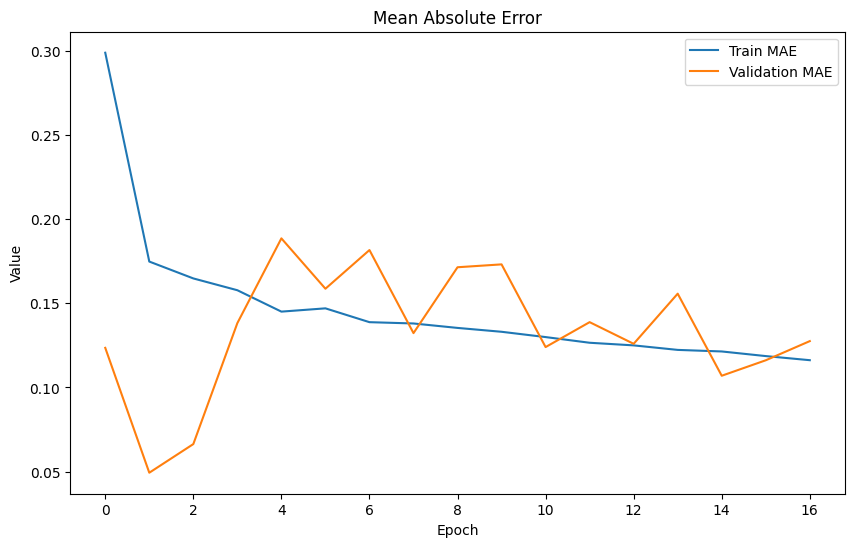

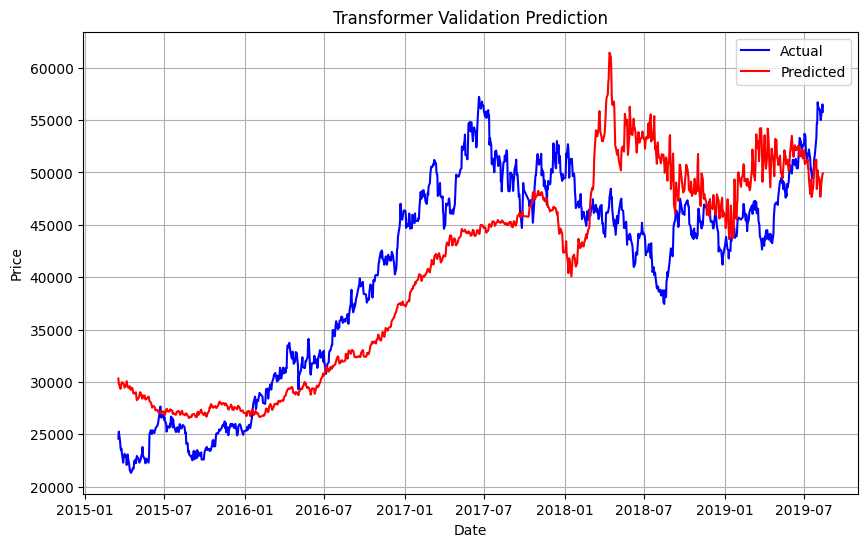

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.012376105939679144
Root Mean Squared Error (RMSE): 0.11124794802457771
Mean Absolute Error (MAE): 0.08579987270441178
R^2 Score: -2.9159701382328147

Mean Absolute Error (MAE): 12960.38756148728
Mean Squared Error (MSE): 280463476.52833533
Root Mean Squared Error (RMSE): 16747.043814606066
R-squared (R2): -2.25697566757823


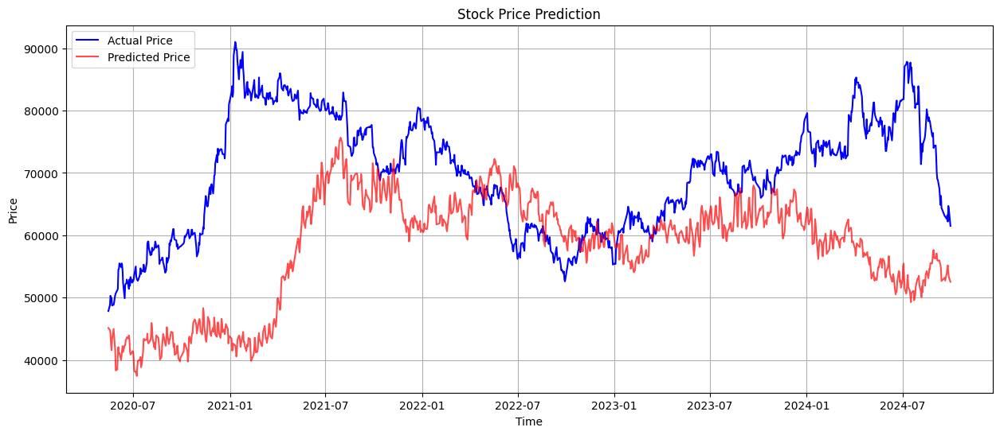

(0.012376105939679144,
 0.08579987270441178,
 0.11124794802457771,
 -2.9159701382328147)

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

###re2

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.3, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 26s - 480ms/step - loss: 0.3512 - mae: 0.4546 - val_loss: 0.4180 - val_mae: 0.4437
Epoch 2/100
54/54 - 5s - 94ms/step - loss: 0.0823 - mae: 0.2287 - val_loss: 0.3898 - val_mae: 0.4095
Epoch 3/100
54/54 - 1s - 17ms/step - loss: 0.0425 - mae: 0.1619 - val_loss: 0.3064 - val_mae: 0.3809
Epoch 4/100
54/54 - 1s - 23ms/step - loss: 0.0337 - mae: 0.1450 - val_loss: 0.2754 - val_mae: 0.3710
Epoch 5/100
54/54 - 1s - 18ms/step - loss: 0.0298 - mae: 0.1355 - val_loss: 0.2542 - val_mae: 0.3579
Epoch 6/100
54/54 - 1s - 18ms/step - loss: 0.0286 - mae: 0.1350 - val_loss: 0.2627 - val_mae: 0.3324
Epoch 7/100
54/54 - 1s - 24ms/step - loss: 0.0264 - mae: 0.1291 - val_loss: 0.2204 - val_mae: 0.3083
Epoch 8/100
54/54 - 1s - 20ms/step - loss: 0.0271 - mae: 0.1299 - val_loss: 0.2163 - val_mae: 0.3012
Epoch 9/100
54/54 - 1s - 18ms/step - loss: 0.0256 - mae: 0.1263 - val_loss: 0.1796 - val_mae: 0.2931
Epoch 10/100
54/54 - 1s - 18ms/step - loss: 0.0246 - mae: 0.1229 - val_loss: 0.1772 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.0022607844816495792
Root Mean Squared Error (RMSE): 0.047547707427904234
Mean Absolute Error (MAE): 0.04046776360988404
R^2 Score: 0.8240345963206203

### After Inverse Transform
Mean Squared Error (MSE): 22410450.680135623
Root Mean Squared Error (RMSE): 4733.967752333725
Mean Absolute Error (MAE): 3922.4626633916205
R^2 Score: 0.7722053966088761


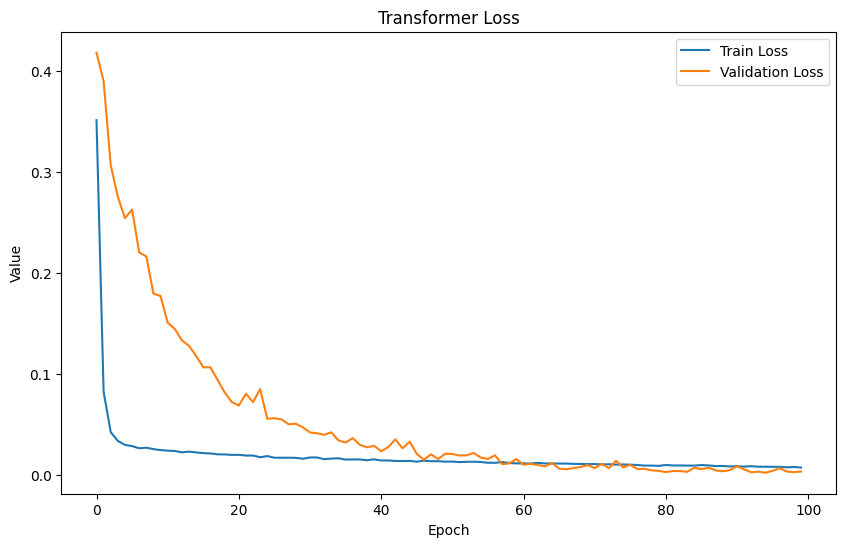

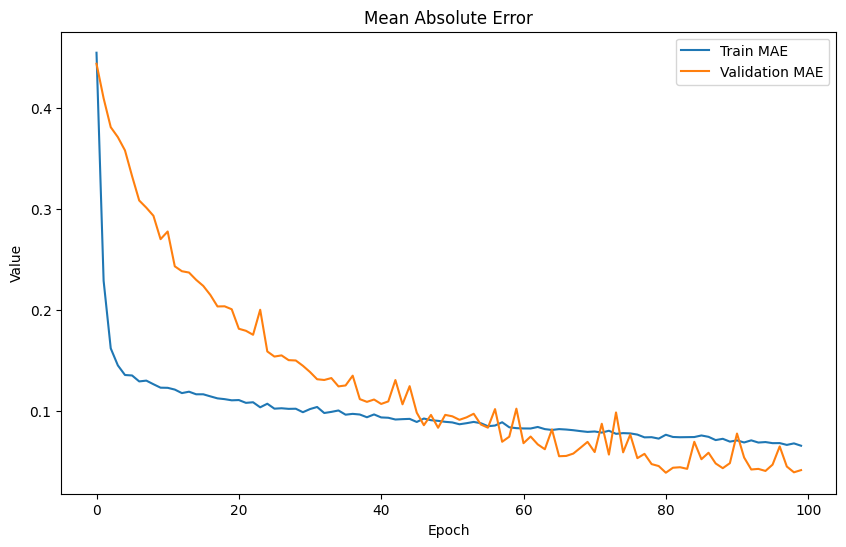

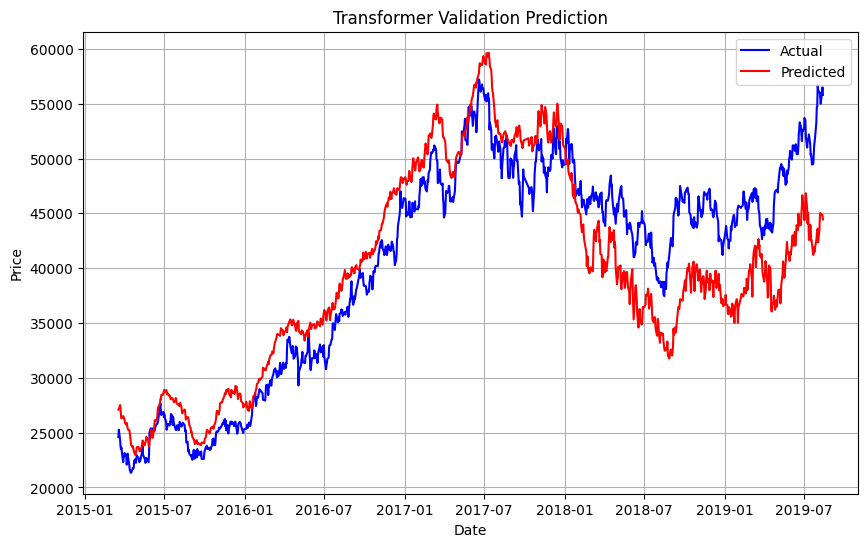

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.014153139159851901
Root Mean Squared Error (RMSE): 0.11896696667500563
Mean Absolute Error (MAE): 0.11210119400471565
R^2 Score: -3.478247890117075

Mean Absolute Error (MAE): 16553.575658275477
Mean Squared Error (MSE): 315254850.95017564
Root Mean Squared Error (RMSE): 17755.41750988063
R-squared (R2): -2.6610021074419223


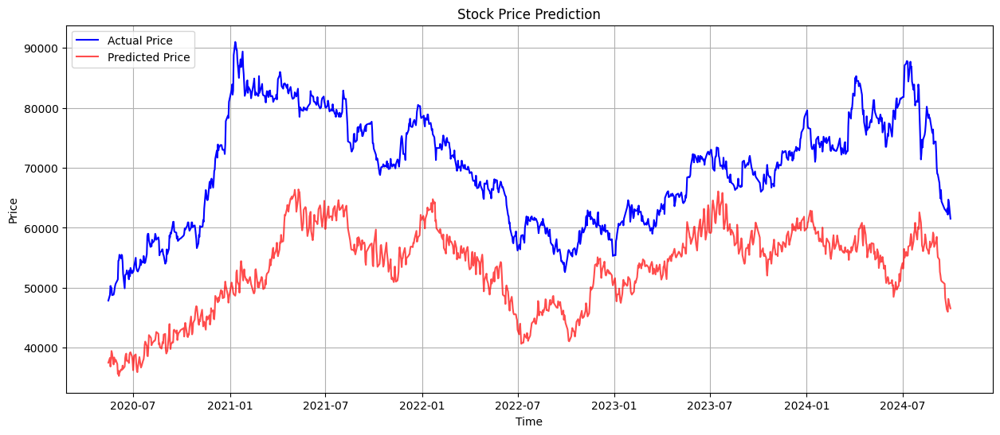

(0.014153139159851901,
 0.11210119400471565,
 0.11896696667500563,
 -3.478247890117075)

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

###re2

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=5, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.3, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 31s - 581ms/step - loss: 0.1234 - mae: 0.2668 - val_loss: 0.3522 - val_mae: 0.3855
Epoch 2/100
54/54 - 3s - 49ms/step - loss: 0.0369 - mae: 0.1512 - val_loss: 0.4102 - val_mae: 0.4104
Epoch 3/100
54/54 - 1s - 22ms/step - loss: 0.0306 - mae: 0.1387 - val_loss: 0.3973 - val_mae: 0.4061
Epoch 4/100
54/54 - 1s - 25ms/step - loss: 0.0276 - mae: 0.1323 - val_loss: 0.3851 - val_mae: 0.4000
Epoch 5/100
54/54 - 1s - 22ms/step - loss: 0.0256 - mae: 0.1272 - val_loss: 0.3484 - val_mae: 0.3804
Epoch 6/100
54/54 - 1s - 22ms/step - loss: 0.0250 - mae: 0.1246 - val_loss: 0.3379 - val_mae: 0.3749
Epoch 7/100
54/54 - 1s - 21ms/step - loss: 0.0229 - mae: 0.1197 - val_loss: 0.3096 - val_mae: 0.3625
Epoch 8/100
54/54 - 1s - 20ms/step - loss: 0.0223 - mae: 0.1180 - val_loss: 0.3059 - val_mae: 0.3592
Epoch 9/100
54/54 - 1s - 23ms/step - loss: 0.0220 - mae: 0.1168 - val_loss: 0.2604 - val_mae: 0.3333
Epoch 10/100
54/54 - 1s - 23ms/step - loss: 0.0218 - mae: 0.1173 - val_loss: 0.2395 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.0017321204871427562
Root Mean Squared Error (RMSE): 0.04161875162883621
Mean Absolute Error (MAE): 0.03297251439160216
R^2 Score: 0.865182513762211

### After Inverse Transform
Mean Squared Error (MSE): 19052948.5709459
Root Mean Squared Error (RMSE): 4364.968335617786
Mean Absolute Error (MAE): 3316.483507545591
R^2 Score: 0.8063332627666802


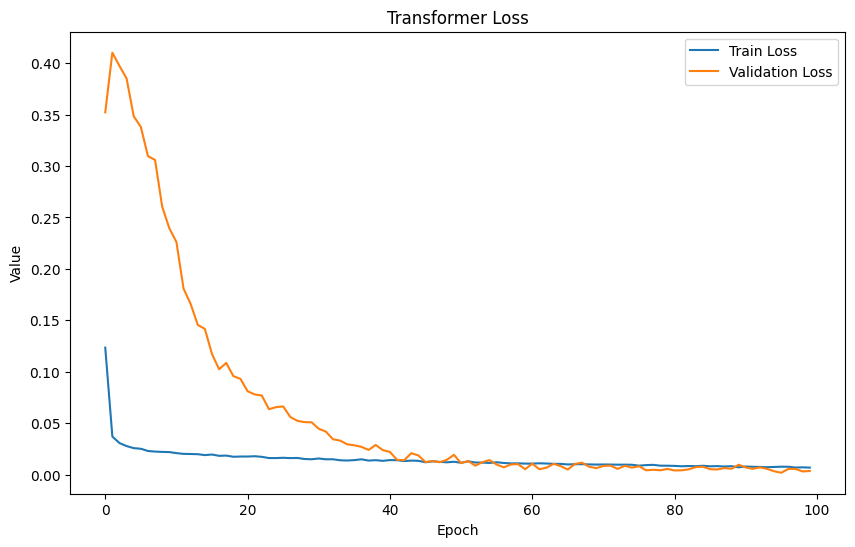

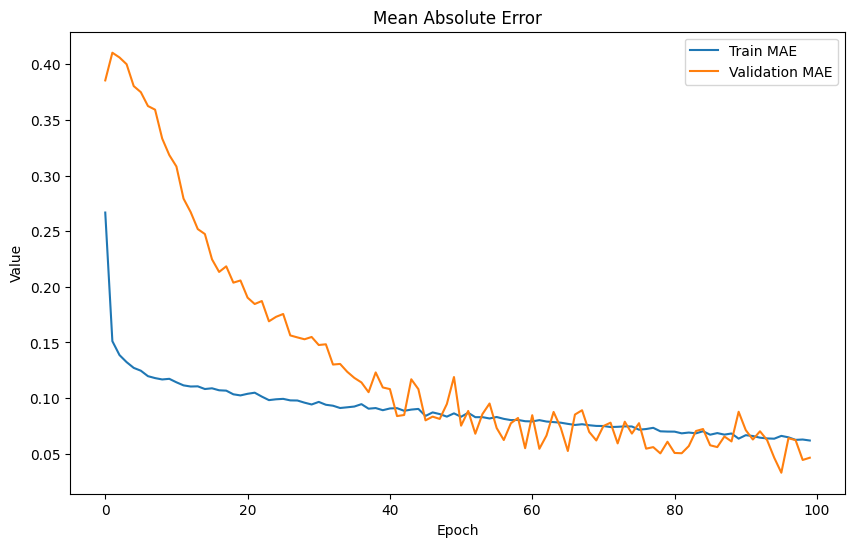

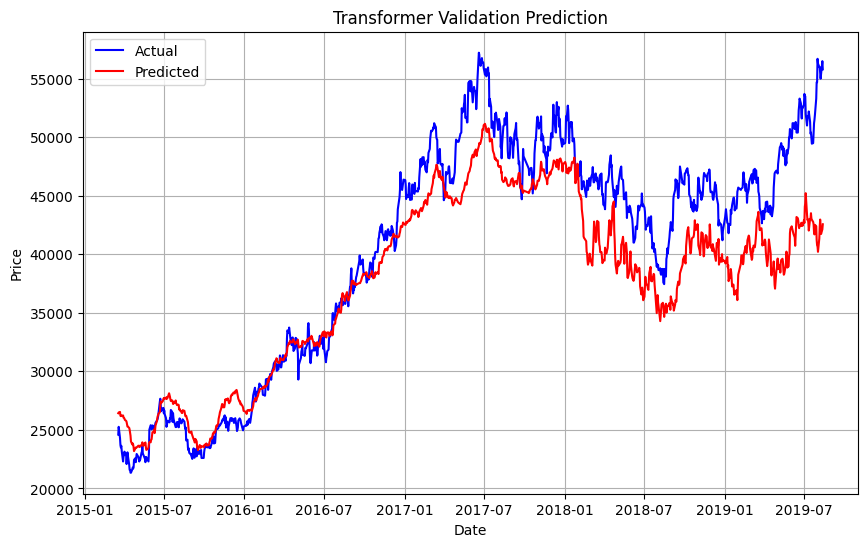

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.020739100240499086
Root Mean Squared Error (RMSE): 0.14401076432162663
Mean Absolute Error (MAE): 0.13723207851963026
R^2 Score: -5.56213655825549

Mean Absolute Error (MAE): 19960.249023437515
Mean Squared Error (MSE): 455517011.22723025
Root Mean Squared Error (RMSE): 21342.844497096215
R-squared (R2): -4.289843227002711


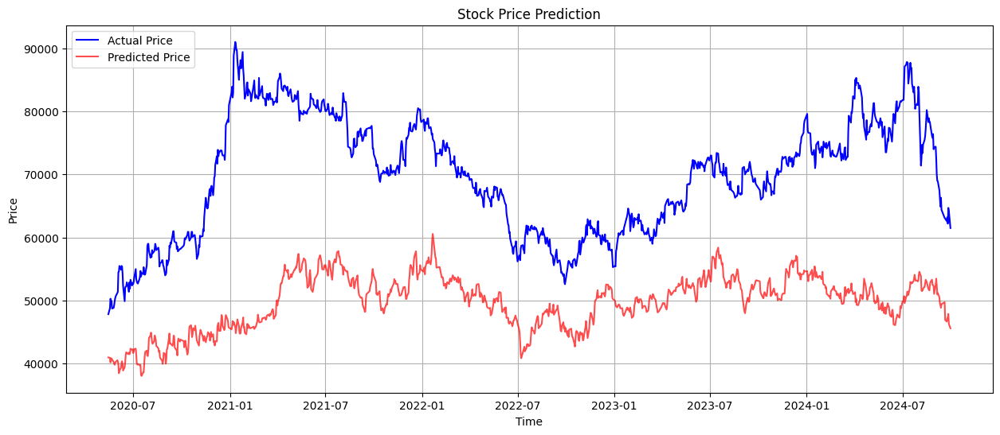

(0.020739100240499086,
 0.13723207851963026,
 0.14401076432162663,
 -5.56213655825549)

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Day 1 Prediction: [[45610.832]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Day 2 Prediction: [[44572.914]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Day 3 Prediction: [[43733.48]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Day 4 Prediction: [[44322.906]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Day 5 Prediction: [[45013.25]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Day 6 Prediction: [[45992.766]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Day 7 Prediction: [[45764.99]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Day 8 Prediction: [[44994.75]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Day 9 Prediction: [[45399.92]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Day 10 Prediction: [[45942.926]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Day 11 Prediction: [[46481.55]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Day 12 Prediction: [[47756.727]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Day 13 Prediction: [[48324.918]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Day 14 Prediction: [[48599.03]]
1/1 ━━━━━━━━━━━━━━━━━━

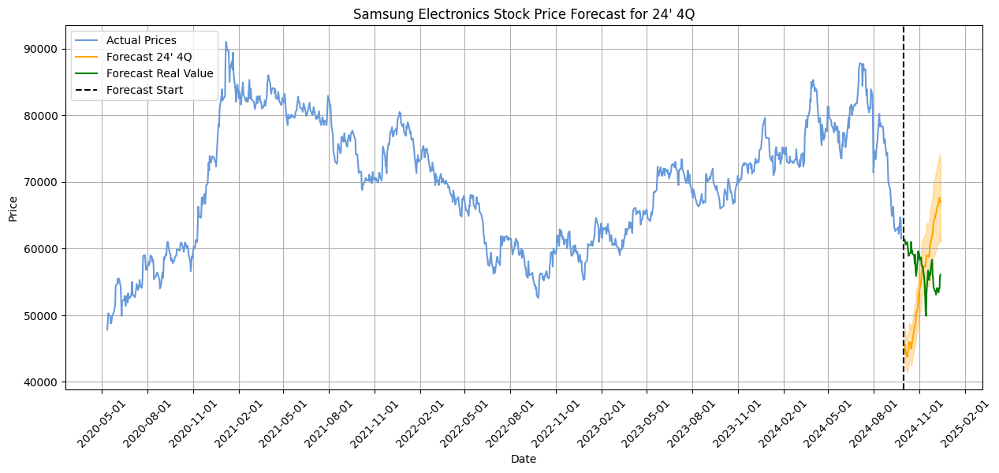

In [ ]:
future_90_days, upper_90_days, lower_90_days = predict_future_dynamic(model, x_test, y_scaler_int0, steps=51, feature_generator=feature_generator)
y_test_rever = y_scaler_int0.inverse_transform(y_test[:len(test_dates)])
y_test_rever = np.exp(y_test_rever)

future_90_days_rever = y_scaler_int0.inverse_transform(future_90_days.reshape(-1, 1))
future_90_days_rever = np.exp(future_90_days_rever)

upper_90_days_rever = y_scaler_int0.inverse_transform(upper_90_days.reshape(-1, 1))
upper_90_days_rever = np.exp(upper_90_days_rever)

lower_90_days_rever = y_scaler_int0.inverse_transform(lower_90_days.reshape(-1, 1))
lower_90_days_rever = np.exp(lower_90_days_rever)

plt.figure(figsize=(15, 6))
plt.plot(test_dates[:len(y_test_rever)], y_test_rever, label='Actual Prices', color='#689ADB')
plt.plot(future_dates[:len(future_90_days_rever)], future_90_days_rever[:len(future_dates)], label='Forecast 24\' 4Q', color='orange')
plt.plot(real_close.index, real_close.values, label='Forecast Real Value', color='green')
plt.fill_between(
    future_dates[:len(future_90_days_rever)],
    upper_90_days_rever.ravel(),
    lower_90_days_rever.ravel(),
    color='orange', alpha=0.3
)
forecast_start_date = test_dates.iloc[-1]
plt.axvline(x=forecast_start_date, color='black', linestyle='--', label='Forecast Start')

plt.title('Samsung Electronics Stock Price Forecast for 24\' 4Q')
plt.xlabel('Date')
plt.ylabel('Price')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))
plt.xticks(rotation=45)
plt.legend(loc='best')
plt.grid(True)
plt.show()

###re2 ---

In [21]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=5, key_dim=128, ff_dim=256, num_blocks=4, dropout_rate=0.3, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 41s - 762ms/step - loss: 0.2938 - mae: 0.4044 - val_loss: 0.0846 - val_mae: 0.2118
Epoch 2/100
54/54 - 17s - 309ms/step - loss: 0.0638 - mae: 0.2014 - val_loss: 0.0793 - val_mae: 0.2005
Epoch 3/100
54/54 - 2s - 43ms/step - loss: 0.0566 - mae: 0.1904 - val_loss: 0.1104 - val_mae: 0.2377
Epoch 4/100
54/54 - 3s - 49ms/step - loss: 0.0444 - mae: 0.1669 - val_loss: 0.1524 - val_mae: 0.2548
Epoch 5/100
54/54 - 1s - 27ms/step - loss: 0.0363 - mae: 0.1513 - val_loss: 0.1521 - val_mae: 0.2622
Epoch 6/100
54/54 - 1s - 25ms/step - loss: 0.0331 - mae: 0.1446 - val_loss: 0.1596 - val_mae: 0.2676
Epoch 7/100
54/54 - 1s - 25ms/step - loss: 0.0302 - mae: 0.1385 - val_loss: 0.1321 - val_mae: 0.2570
Epoch 8/100
54/54 - 3s - 47ms/step - loss: 0.0273 - mae: 0.1303 - val_loss: 0.1285 - val_mae: 0.2451
Epoch 9/100
54/54 - 3s - 47ms/step - loss: 0.0252 - mae: 0.1249 - val_loss: 0.1344 - val_mae: 0.2337
Epoch 10/100
54/54 - 1s - 25ms/step - loss: 0.0245 - mae: 0.1239 - val_loss: 0.0985 - v

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.07931936561082367
Root Mean Squared Error (RMSE): 0.28163693935779033
Mean Absolute Error (MAE): 0.2004983600384404
R^2 Score: -5.1737261125911695

### After Inverse Transform
Mean Squared Error (MSE): 374162991.5459138
Root Mean Squared Error (RMSE): 19343.293192885067
Mean Absolute Error (MAE): 14455.784950657895
R^2 Score: -2.803239456419627


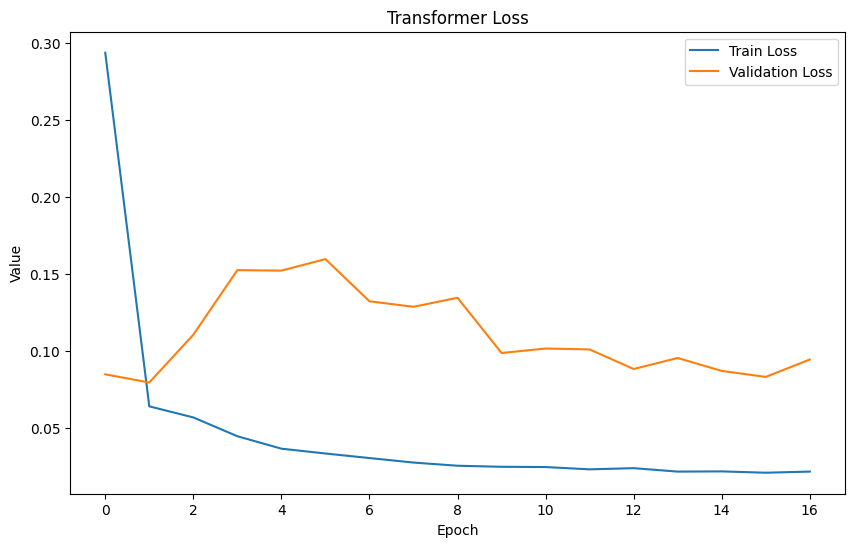

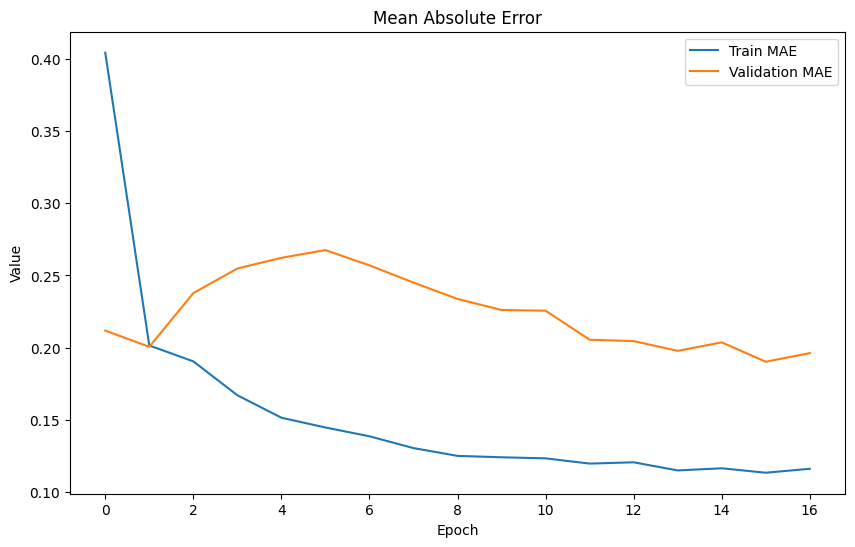

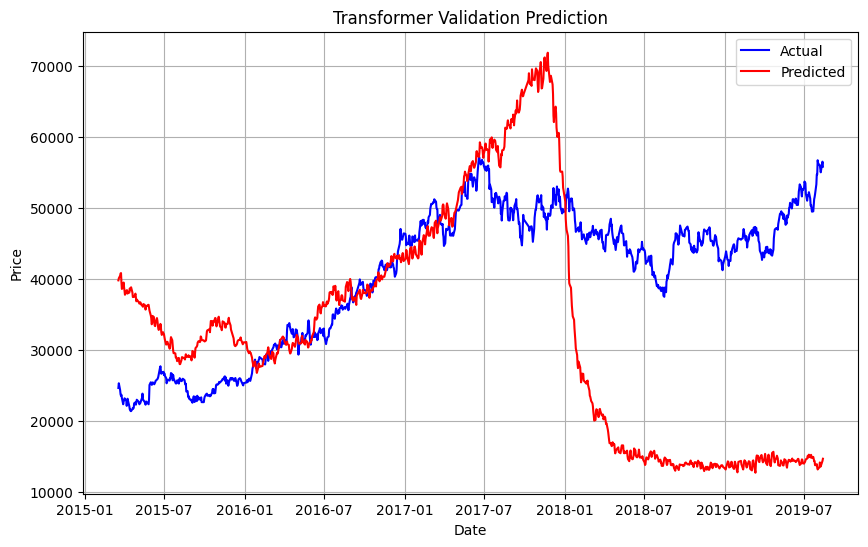

In [22]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.3503608925286358
Root Mean Squared Error (RMSE): 0.5919129095809922
Mean Absolute Error (MAE): 0.589069820958653
R^2 Score: -109.85900520194674

Mean Absolute Error (MAE): 52977.96336443867
Mean Squared Error (MSE): 2882992916.2788143
Root Mean Squared Error (RMSE): 53693.509070266715
R-squared (R2): -32.4797168399638


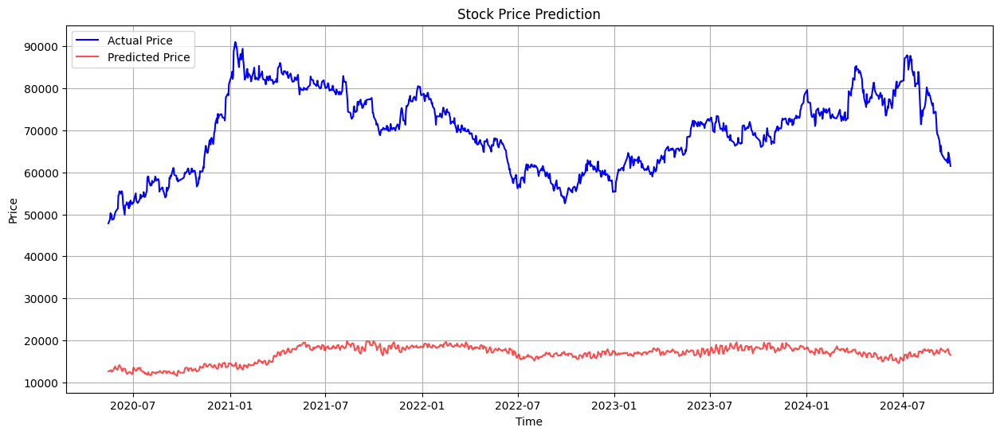

(0.3503608925286358,
 0.589069820958653,
 0.5919129095809922,
 -109.85900520194674)

In [23]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 639ms/step
Day 1 Prediction: [[16538.57]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Day 2 Prediction: [[16290.752]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Day 3 Prediction: [[16357.162]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Day 4 Prediction: [[16573.73]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Day 5 Prediction: [[15898.889]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Day 6 Prediction: [[14838.656]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Day 7 Prediction: [[14031.738]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Day 8 Prediction: [[13770.619]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Day 9 Prediction: [[13982.046]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Day 10 Prediction: [[14545.976]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Day 11 Prediction: [[14759.058]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Day 12 Prediction: [[14083.555]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Day 13 Prediction: [[13017.161]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Day 14 Prediction: [[12643.706]]
1/1 ━━━━━━━━━━━━

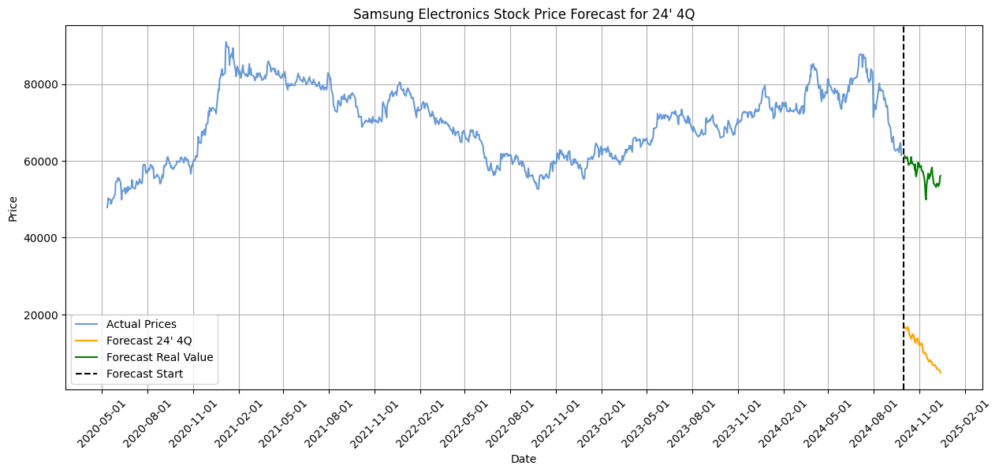

In [24]:
future_90_days, upper_90_days, lower_90_days = predict_future_dynamic(model, x_test, y_scaler_int0, steps=51, feature_generator=feature_generator)
y_test_rever = y_scaler_int0.inverse_transform(y_test[:len(test_dates)])
y_test_rever = np.exp(y_test_rever)

future_90_days_rever = y_scaler_int0.inverse_transform(future_90_days.reshape(-1, 1))
future_90_days_rever = np.exp(future_90_days_rever)

upper_90_days_rever = y_scaler_int0.inverse_transform(upper_90_days.reshape(-1, 1))
upper_90_days_rever = np.exp(upper_90_days_rever)

lower_90_days_rever = y_scaler_int0.inverse_transform(lower_90_days.reshape(-1, 1))
lower_90_days_rever = np.exp(lower_90_days_rever)

plt.figure(figsize=(15, 6))
plt.plot(test_dates[:len(y_test_rever)], y_test_rever, label='Actual Prices', color='#689ADB')
plt.plot(future_dates[:len(future_90_days_rever)], future_90_days_rever[:len(future_dates)], label='Forecast 24\' 4Q', color='orange')
plt.plot(real_close.index, real_close.values, label='Forecast Real Value', color='green')
plt.fill_between(
    future_dates[:len(future_90_days_rever)],
    upper_90_days_rever.ravel(),
    lower_90_days_rever.ravel(),
    color='orange', alpha=0.3
)
forecast_start_date = test_dates.iloc[-1]
plt.axvline(x=forecast_start_date, color='black', linestyle='--', label='Forecast Start')

plt.title('Samsung Electronics Stock Price Forecast for 24\' 4Q')
plt.xlabel('Date')
plt.ylabel('Price')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))
plt.xticks(rotation=45)
plt.legend(loc='best')
plt.grid(True)
plt.show()

###re2 ---

In [25]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.2, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 30s - 549ms/step - loss: 0.0753 - mae: 0.2001 - val_loss: 0.0356 - val_mae: 0.1583
Epoch 2/100
54/54 - 1s - 18ms/step - loss: 0.0232 - mae: 0.1200 - val_loss: 0.0112 - val_mae: 0.0733
Epoch 3/100
54/54 - 1s - 17ms/step - loss: 0.0176 - mae: 0.1043 - val_loss: 0.0038 - val_mae: 0.0441
Epoch 4/100
54/54 - 1s - 17ms/step - loss: 0.0157 - mae: 0.0983 - val_loss: 0.0012 - val_mae: 0.0259
Epoch 5/100
54/54 - 1s - 23ms/step - loss: 0.0149 - mae: 0.0964 - val_loss: 0.0010 - val_mae: 0.0251
Epoch 6/100
54/54 - 1s - 18ms/step - loss: 0.0142 - mae: 0.0936 - val_loss: 0.0022 - val_mae: 0.0388
Epoch 7/100
54/54 - 1s - 22ms/step - loss: 0.0134 - mae: 0.0912 - val_loss: 0.0027 - val_mae: 0.0454
Epoch 8/100
54/54 - 1s - 17ms/step - loss: 0.0135 - mae: 0.0909 - val_loss: 0.0012 - val_mae: 0.0240
Epoch 9/100
54/54 - 1s - 24ms/step - loss: 0.0127 - mae: 0.0880 - val_loss: 0.0011 - val_mae: 0.0228
Epoch 10/100
54/54 - 1s - 23ms/step - loss: 0.0125 - mae: 0.0870 - val_loss: 0.0106 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.0005986005214739914
Root Mean Squared Error (RMSE): 0.024466314014865244
Mean Absolute Error (MAE): 0.018541156948852375
R^2 Score: 0.9534086582516693

### After Inverse Transform
Mean Squared Error (MSE): 7052669.040643275
Root Mean Squared Error (RMSE): 2655.6861713393914
Mean Absolute Error (MAE): 1911.3040761340028
R^2 Score: 0.9283120196959613


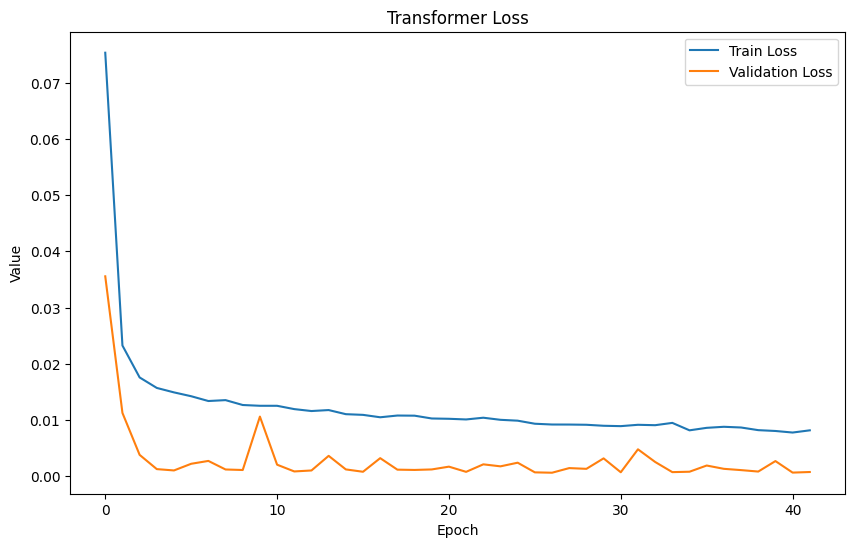

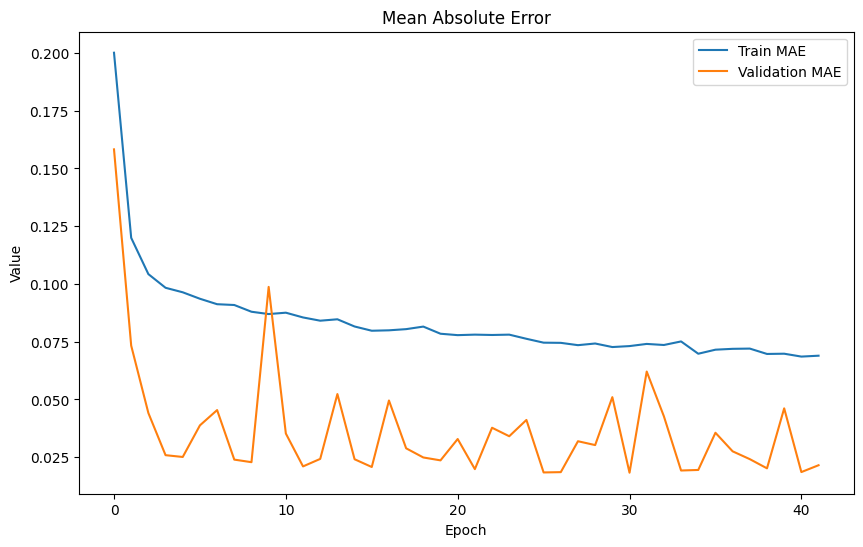

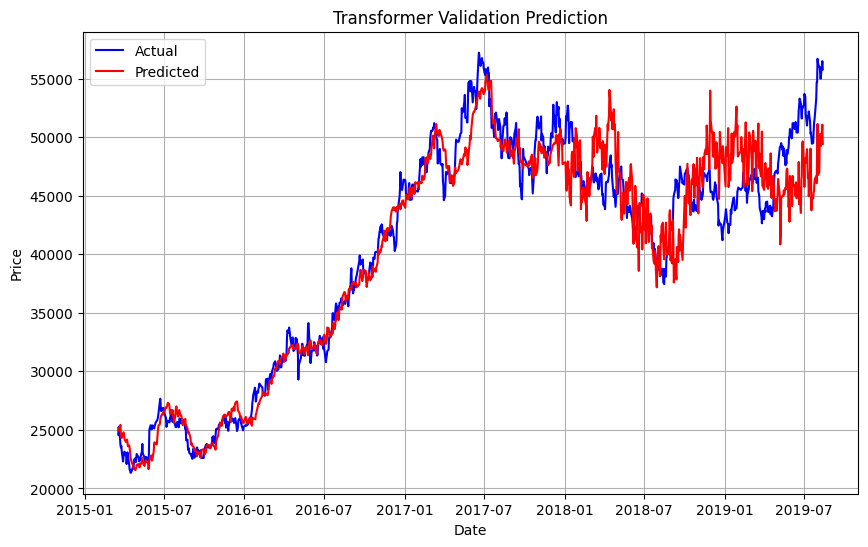

In [26]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.003757487446912721
Root Mean Squared Error (RMSE): 0.061298347831835735
Mean Absolute Error (MAE): 0.04573560000127877
R^2 Score: -0.188920708065331

Mean Absolute Error (MAE): 7539.756785300936
Mean Squared Error (MSE): 105896631.47497275
Root Mean Squared Error (RMSE): 10290.608897192273
R-squared (R2): -0.22975995399400806


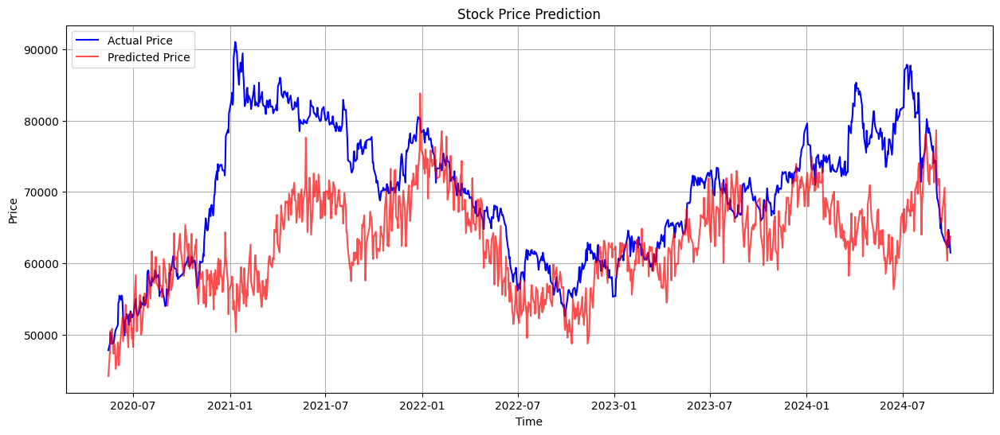

(0.003757487446912721,
 0.04573560000127877,
 0.061298347831835735,
 -0.188920708065331)

In [27]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

###re2 ---

In [29]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.3, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 26s - 484ms/step - loss: 0.7115 - mae: 0.5982 - val_loss: 0.0433 - val_mae: 0.1664
Epoch 2/100
54/54 - 1s - 18ms/step - loss: 0.1197 - mae: 0.2778 - val_loss: 0.0711 - val_mae: 0.2017
Epoch 3/100
54/54 - 1s - 23ms/step - loss: 0.0777 - mae: 0.2224 - val_loss: 0.0761 - val_mae: 0.2065
Epoch 4/100
54/54 - 1s - 24ms/step - loss: 0.0537 - mae: 0.1837 - val_loss: 0.0628 - val_mae: 0.1925
Epoch 5/100
54/54 - 1s - 22ms/step - loss: 0.0430 - mae: 0.1648 - val_loss: 0.0665 - val_mae: 0.1925
Epoch 6/100
54/54 - 1s - 23ms/step - loss: 0.0388 - mae: 0.1571 - val_loss: 0.0753 - val_mae: 0.2005
Epoch 7/100
54/54 - 1s - 19ms/step - loss: 0.0339 - mae: 0.1457 - val_loss: 0.0753 - val_mae: 0.1984
Epoch 8/100
54/54 - 1s - 19ms/step - loss: 0.0340 - mae: 0.1467 - val_loss: 0.0725 - val_mae: 0.1931
Epoch 9/100
54/54 - 1s - 23ms/step - loss: 0.0309 - mae: 0.1397 - val_loss: 0.0715 - val_mae: 0.1920
Epoch 10/100
54/54 - 1s - 22ms/step - loss: 0.0294 - mae: 0.1356 - val_loss: 0.0656 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.043328609057951224
Root Mean Squared Error (RMSE): 0.2081552522948946
Mean Absolute Error (MAE): 0.1663938330823834
R^2 Score: -2.3724294578425837

### After Inverse Transform
Mean Squared Error (MSE): 271330338.5150152
Root Mean Squared Error (RMSE): 16472.107895318535
Mean Absolute Error (MAE): 13566.45421067059
R^2 Score: -1.757980539177323


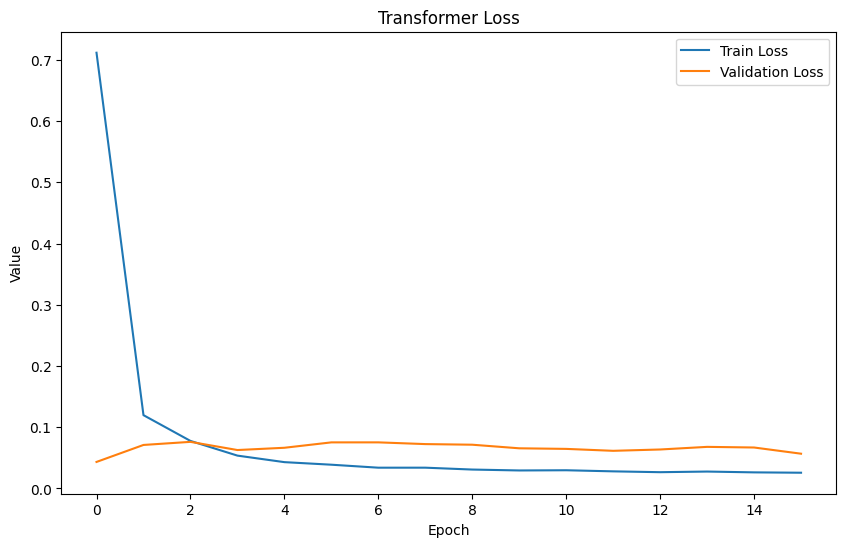

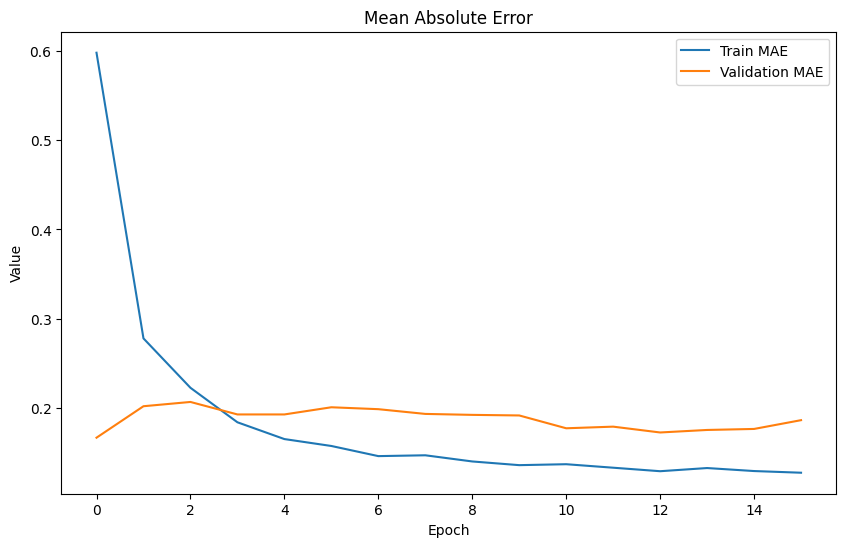

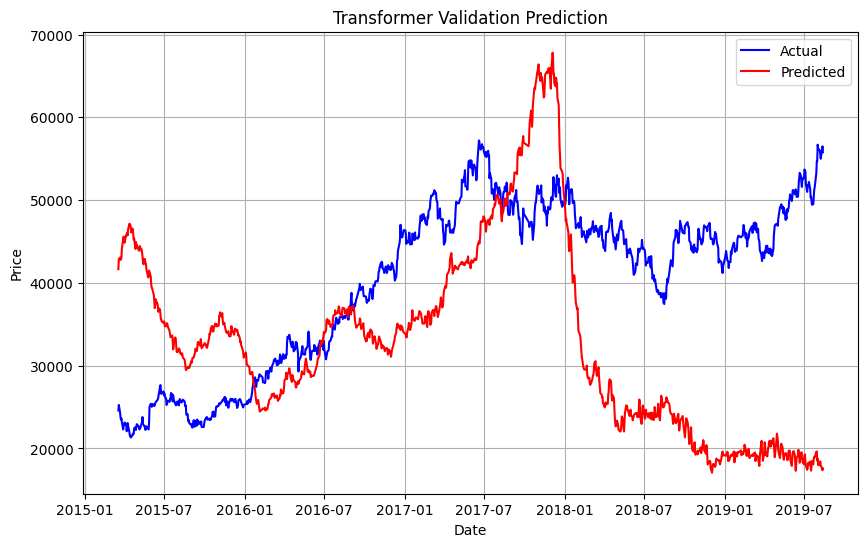

In [30]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.2228819324195419
Root Mean Squared Error (RMSE): 0.4721037305715153
Mean Absolute Error (MAE): 0.46368980928311865
R^2 Score: -69.52290889885337

Mean Absolute Error (MAE): 46900.69916449654
Mean Squared Error (MSE): 2302051329.437708
Root Mean Squared Error (RMSE): 47979.69705445948
R-squared (R2): -25.733338894261454


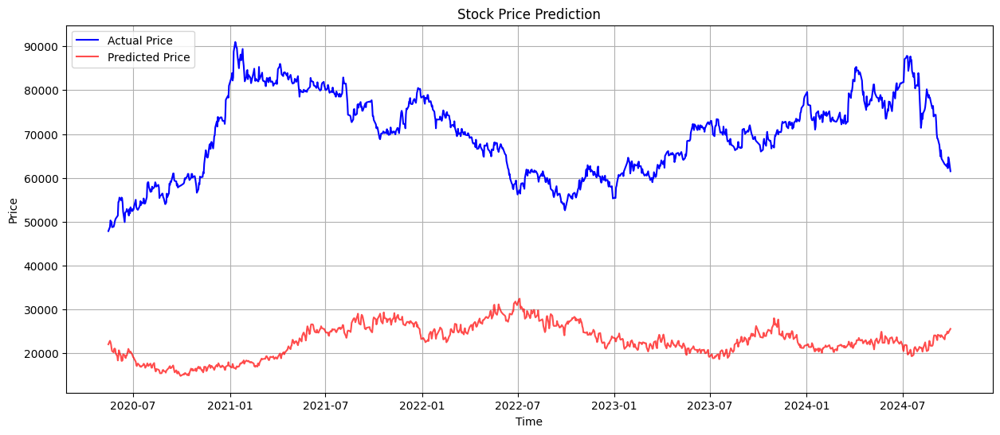

(0.2228819324195419,
 0.46368980928311865,
 0.4721037305715153,
 -69.52290889885337)

In [31]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

###re2 ---

In [32]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=5, key_dim=128, ff_dim=256, num_blocks=5, dropout_rate=0.4, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 44s - 819ms/step - loss: 0.6293 - mae: 0.5799 - val_loss: 0.1085 - val_mae: 0.2133
Epoch 2/100
54/54 - 14s - 267ms/step - loss: 0.0849 - mae: 0.2322 - val_loss: 0.0624 - val_mae: 0.1659
Epoch 3/100
54/54 - 2s - 33ms/step - loss: 0.0553 - mae: 0.1866 - val_loss: 0.0584 - val_mae: 0.1723
Epoch 4/100
54/54 - 2s - 34ms/step - loss: 0.0460 - mae: 0.1704 - val_loss: 0.0275 - val_mae: 0.1155
Epoch 5/100
54/54 - 2s - 37ms/step - loss: 0.0448 - mae: 0.1678 - val_loss: 0.0195 - val_mae: 0.0986
Epoch 6/100
54/54 - 2s - 43ms/step - loss: 0.0413 - mae: 0.1599 - val_loss: 0.0222 - val_mae: 0.1019
Epoch 7/100
54/54 - 3s - 47ms/step - loss: 0.0388 - mae: 0.1552 - val_loss: 0.0182 - val_mae: 0.0970
Epoch 8/100
54/54 - 3s - 47ms/step - loss: 0.0376 - mae: 0.1524 - val_loss: 0.0131 - val_mae: 0.1105
Epoch 9/100
54/54 - 2s - 35ms/step - loss: 0.0370 - mae: 0.1526 - val_loss: 0.0099 - val_mae: 0.0798
Epoch 10/100
54/54 - 3s - 48ms/step - loss: 0.0354 - mae: 0.1482 - val_loss: 0.0080 - v

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.00284738495084937
Root Mean Squared Error (RMSE): 0.05336089345999905
Mean Absolute Error (MAE): 0.04495467026098849
R^2 Score: 0.7783772640100501

### After Inverse Transform
Mean Squared Error (MSE): 31385259.972841155
Root Mean Squared Error (RMSE): 5602.254900737841
Mean Absolute Error (MAE): 4541.158830721953
R^2 Score: 0.6809795148752715


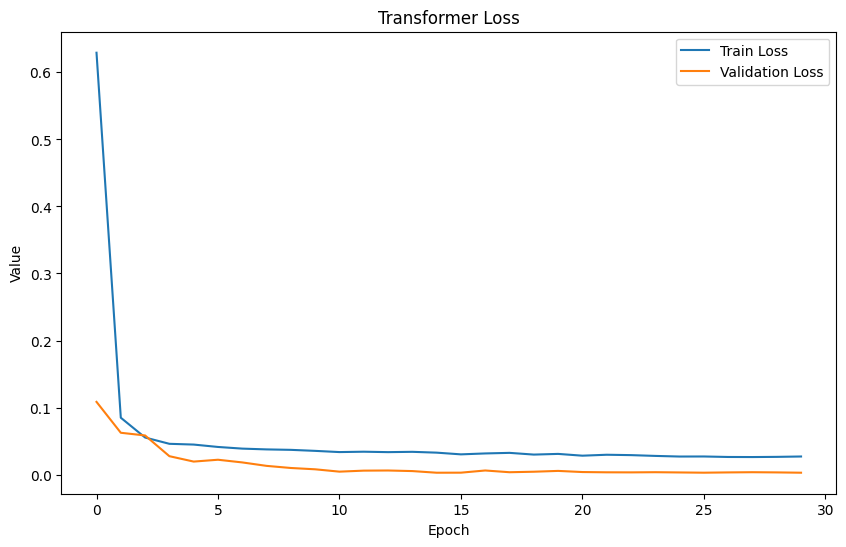

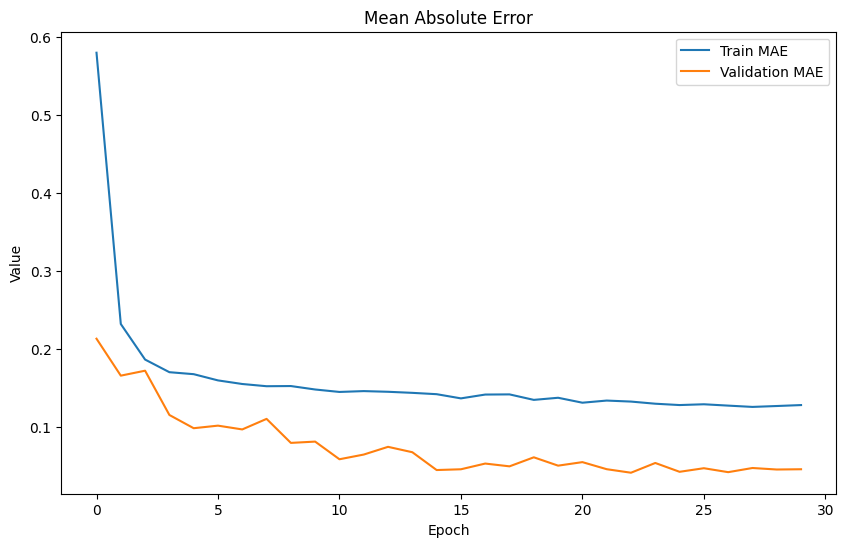

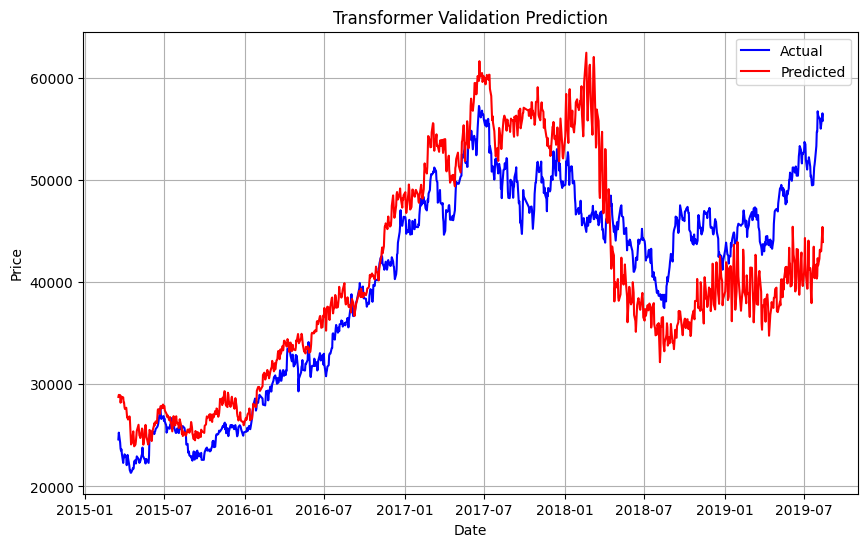

In [33]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.014991747051427771
Root Mean Squared Error (RMSE): 0.12244078998204712
Mean Absolute Error (MAE): 0.11406754659993897
R^2 Score: -3.7435949610862025

Mean Absolute Error (MAE): 16852.99401041668
Mean Squared Error (MSE): 336570081.57997155
Root Mean Squared Error (RMSE): 18345.84643945249
R-squared (R2): -2.90853233265843


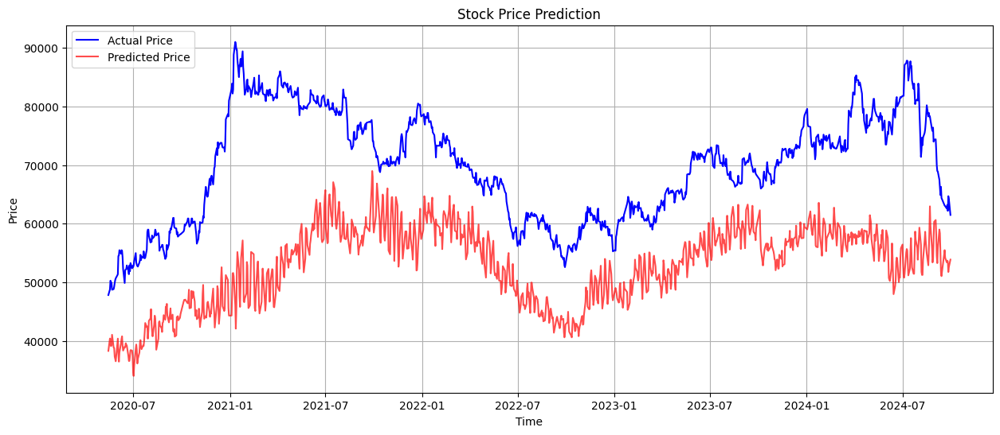

(0.014991747051427771,
 0.11406754659993897,
 0.12244078998204712,
 -3.7435949610862025)

In [34]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

###re2 ---

In [35]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.2, lr=0.0002,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 29s - 531ms/step - loss: 0.1338 - mae: 0.2741 - val_loss: 0.0361 - val_mae: 0.1421
Epoch 2/100
54/54 - 1s - 18ms/step - loss: 0.0258 - mae: 0.1261 - val_loss: 0.0563 - val_mae: 0.1727
Epoch 3/100
54/54 - 1s - 24ms/step - loss: 0.0188 - mae: 0.1076 - val_loss: 0.0411 - val_mae: 0.1375
Epoch 4/100
54/54 - 1s - 22ms/step - loss: 0.0159 - mae: 0.0995 - val_loss: 0.0362 - val_mae: 0.1327
Epoch 5/100
54/54 - 1s - 17ms/step - loss: 0.0159 - mae: 0.1004 - val_loss: 0.0282 - val_mae: 0.1129
Epoch 6/100
54/54 - 1s - 23ms/step - loss: 0.0151 - mae: 0.0969 - val_loss: 0.0316 - val_mae: 0.1157
Epoch 7/100
54/54 - 1s - 17ms/step - loss: 0.0144 - mae: 0.0940 - val_loss: 0.0304 - val_mae: 0.1132
Epoch 8/100
54/54 - 1s - 23ms/step - loss: 0.0139 - mae: 0.0920 - val_loss: 0.0221 - val_mae: 0.0968
Epoch 9/100
54/54 - 1s - 18ms/step - loss: 0.0131 - mae: 0.0893 - val_loss: 0.0224 - val_mae: 0.1203
Epoch 10/100
54/54 - 1s - 24ms/step - loss: 0.0133 - mae: 0.0908 - val_loss: 0.0262 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.006132905005203787
Root Mean Squared Error (RMSE): 0.07831286615367737
Mean Absolute Error (MAE): 0.05600020546712966
R^2 Score: 0.5226528164327495

### After Inverse Transform
Mean Squared Error (MSE): 57025507.312759824
Root Mean Squared Error (RMSE): 7551.523509382714
Mean Absolute Error (MAE): 5289.9213357715835
R^2 Score: 0.42035512775287287


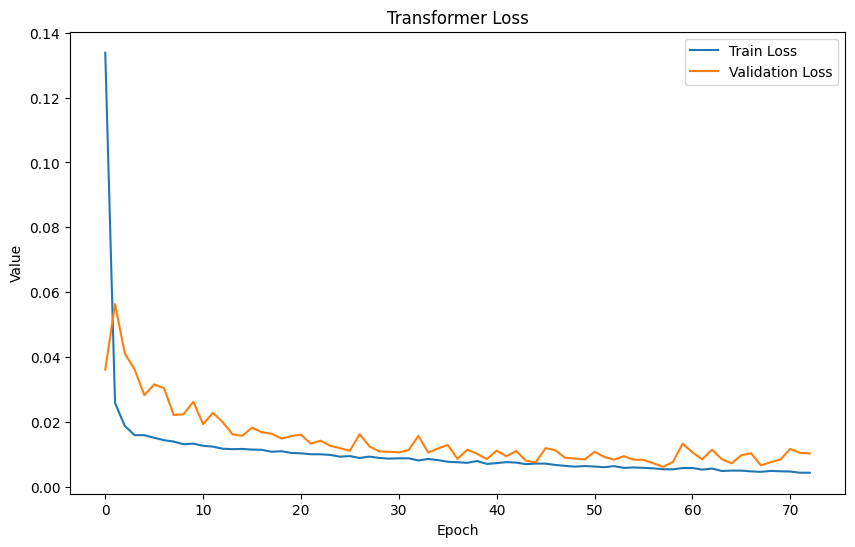

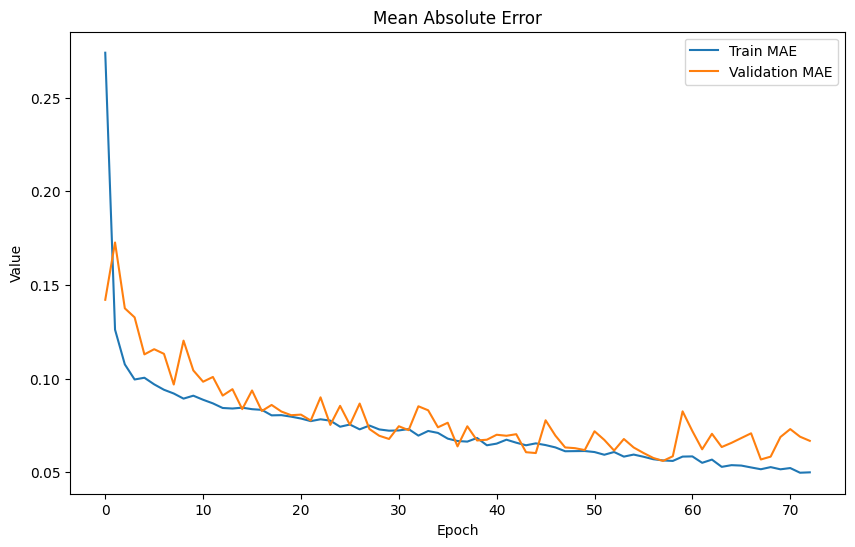

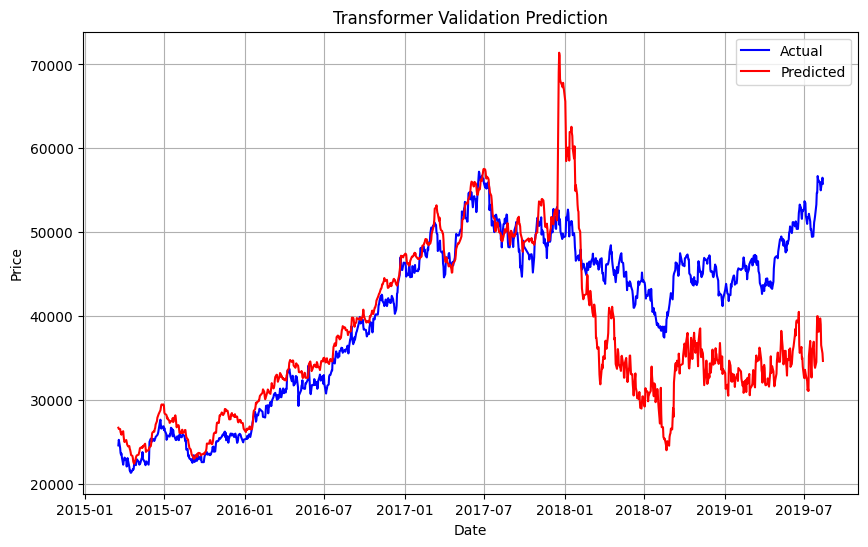

In [36]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.04611730853834339
Root Mean Squared Error (RMSE): 0.21474940870312867
Mean Absolute Error (MAE): 0.20853038404435031
R^2 Score: -13.592150711381512

Mean Absolute Error (MAE): 27742.51472981772
Mean Squared Error (MSE): 836831433.2690525
Root Mean Squared Error (RMSE): 28928.038876997045
R-squared (R2): -8.717984137398215


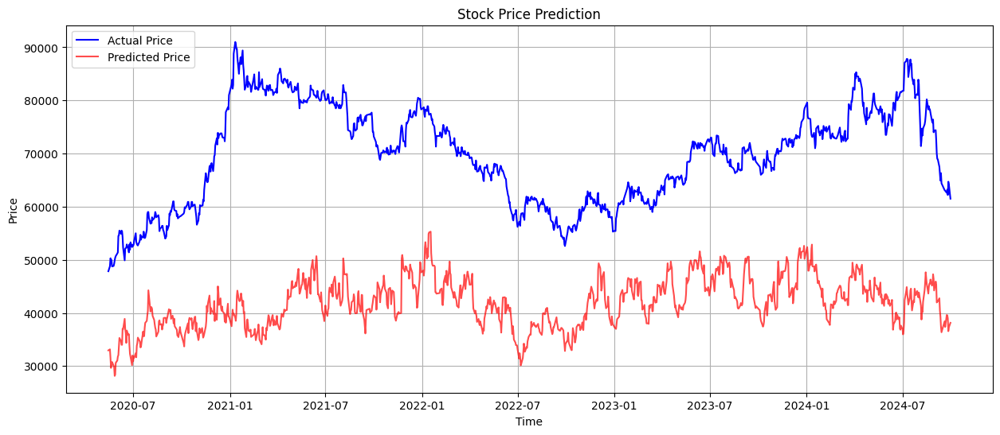

(0.04611730853834339,
 0.20853038404435031,
 0.21474940870312867,
 -13.592150711381512)

In [37]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

###re2 ---

In [38]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=256, num_blocks=4, dropout_rate=0.3, lr=0.0002,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 35s - 640ms/step - loss: 0.3180 - mae: 0.3972 - val_loss: 0.0070 - val_mae: 0.0580
Epoch 2/100
54/54 - 1s - 23ms/step - loss: 0.0360 - mae: 0.1492 - val_loss: 0.0112 - val_mae: 0.0755
Epoch 3/100
54/54 - 1s - 23ms/step - loss: 0.0264 - mae: 0.1282 - val_loss: 0.0081 - val_mae: 0.0625
Epoch 4/100
54/54 - 1s - 23ms/step - loss: 0.0238 - mae: 0.1222 - val_loss: 0.0104 - val_mae: 0.0769
Epoch 5/100
54/54 - 1s - 24ms/step - loss: 0.0223 - mae: 0.1173 - val_loss: 0.0157 - val_mae: 0.0853
Epoch 6/100
54/54 - 1s - 24ms/step - loss: 0.0222 - mae: 0.1181 - val_loss: 0.0178 - val_mae: 0.0983
Epoch 7/100
54/54 - 1s - 23ms/step - loss: 0.0214 - mae: 0.1157 - val_loss: 0.0171 - val_mae: 0.0988
Epoch 8/100
54/54 - 1s - 23ms/step - loss: 0.0204 - mae: 0.1129 - val_loss: 0.0161 - val_mae: 0.0931
Epoch 9/100
54/54 - 1s - 23ms/step - loss: 0.0206 - mae: 0.1135 - val_loss: 0.0230 - val_mae: 0.1013
Epoch 10/100
54/54 - 1s - 23ms/step - loss: 0.0204 - mae: 0.1125 - val_loss: 0.0161 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.007007517578758773
Root Mean Squared Error (RMSE): 0.08371091672391823
Mean Absolute Error (MAE): 0.05804397556698136
R^2 Score: 0.454578413136965

### After Inverse Transform
Mean Squared Error (MSE): 62378656.552644625
Root Mean Squared Error (RMSE): 7898.015988376108
Mean Absolute Error (MAE): 5400.8596202677745
R^2 Score: 0.3659421877634984


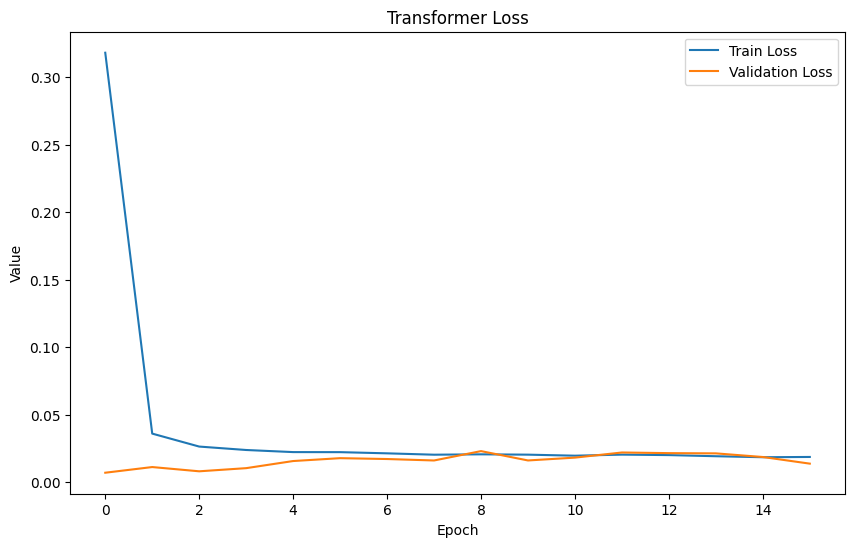

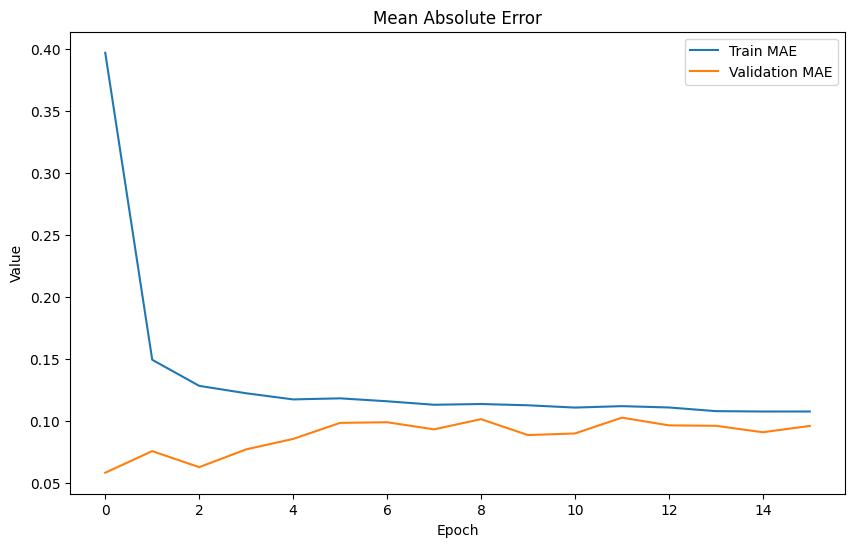

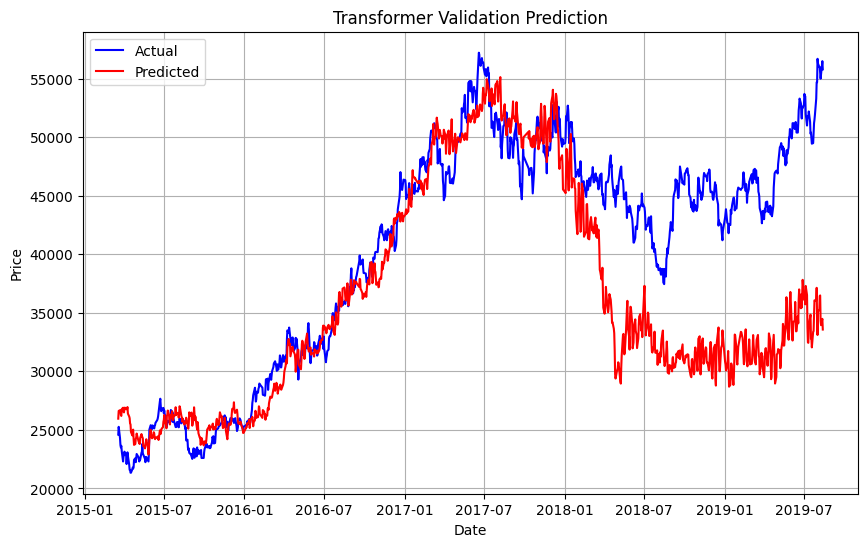

In [39]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.05822561423279303
Root Mean Squared Error (RMSE): 0.2412998430020066
Mean Absolute Error (MAE): 0.2348635461776908
R^2 Score: -17.42338516874334

Mean Absolute Error (MAE): 30266.248860677097
Mean Squared Error (MSE): 985604200.8841646
Root Mean Squared Error (RMSE): 31394.333897761942
R-squared (R2): -10.445657523318525


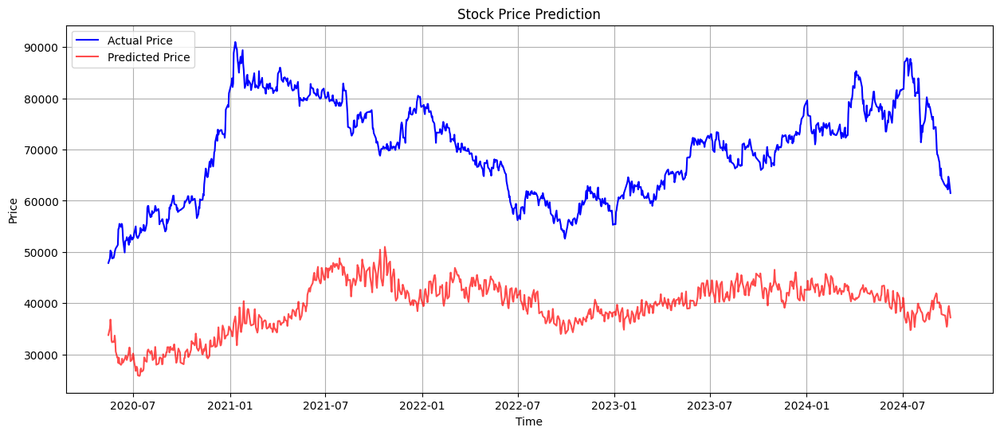

(0.05822561423279303,
 0.2348635461776908,
 0.2412998430020066,
 -17.42338516874334)

In [40]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

###re2 ---

In [45]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=5, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.3, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 31s - 579ms/step - loss: 0.2102 - mae: 0.3391 - val_loss: 0.5847 - val_mae: 0.4816
Epoch 2/100
54/54 - 1s - 24ms/step - loss: 0.0513 - mae: 0.1801 - val_loss: 0.6243 - val_mae: 0.5213
Epoch 3/100
54/54 - 1s - 20ms/step - loss: 0.0355 - mae: 0.1502 - val_loss: 0.6140 - val_mae: 0.5045
Epoch 4/100
54/54 - 1s - 21ms/step - loss: 0.0299 - mae: 0.1371 - val_loss: 0.5188 - val_mae: 0.4754
Epoch 5/100
54/54 - 1s - 23ms/step - loss: 0.0259 - mae: 0.1283 - val_loss: 0.4258 - val_mae: 0.4397
Epoch 6/100
54/54 - 1s - 21ms/step - loss: 0.0258 - mae: 0.1267 - val_loss: 0.3443 - val_mae: 0.3949
Epoch 7/100
54/54 - 1s - 20ms/step - loss: 0.0229 - mae: 0.1186 - val_loss: 0.2826 - val_mae: 0.3574
Epoch 8/100
54/54 - 1s - 23ms/step - loss: 0.0230 - mae: 0.1194 - val_loss: 0.2367 - val_mae: 0.3152
Epoch 9/100
54/54 - 1s - 20ms/step - loss: 0.0216 - mae: 0.1151 - val_loss: 0.2148 - val_mae: 0.2972
Epoch 10/100
54/54 - 1s - 25ms/step - loss: 0.0210 - mae: 0.1137 - val_loss: 0.1930 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.009029995691870166
Root Mean Squared Error (RMSE): 0.09502628947754493
Mean Absolute Error (MAE): 0.07620020881367698
R^2 Score: 0.29716129509894473

### After Inverse Transform
Mean Squared Error (MSE): 83967787.33625703
Root Mean Squared Error (RMSE): 9163.393876520699
Mean Absolute Error (MAE): 7280.771493392198
R^2 Score: 0.1464960215705423


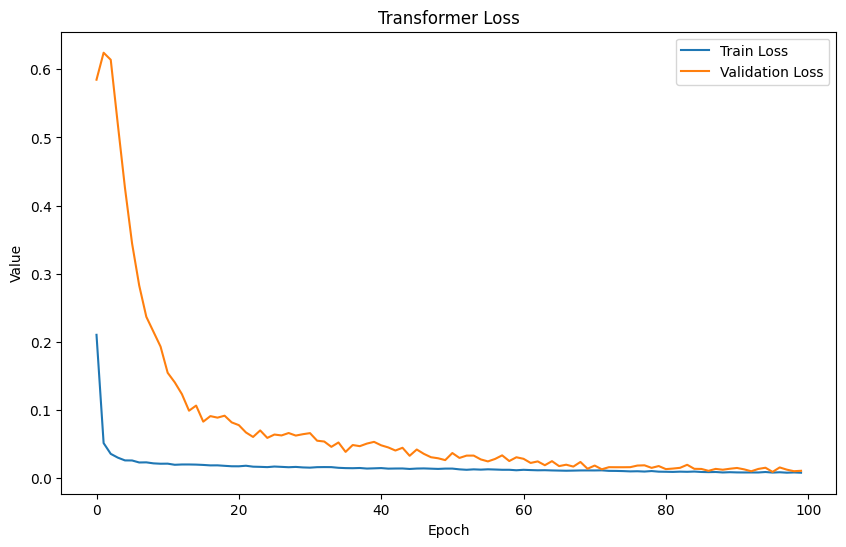

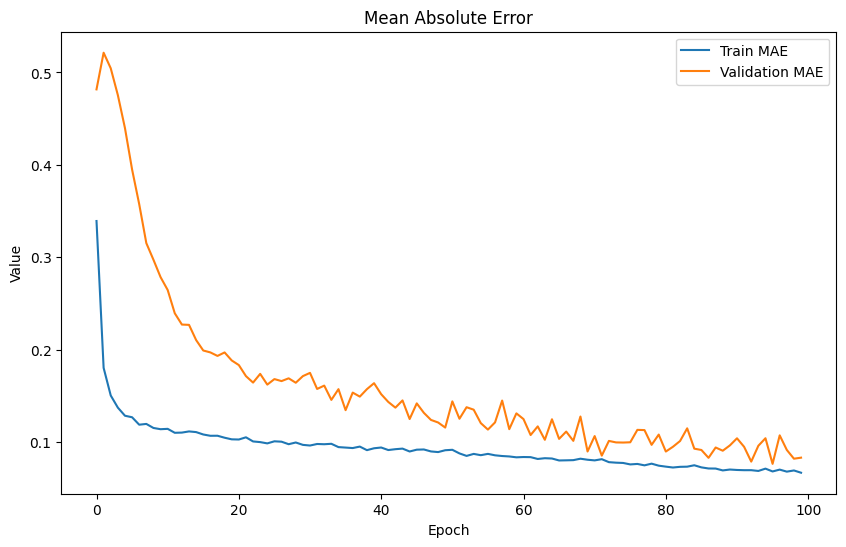

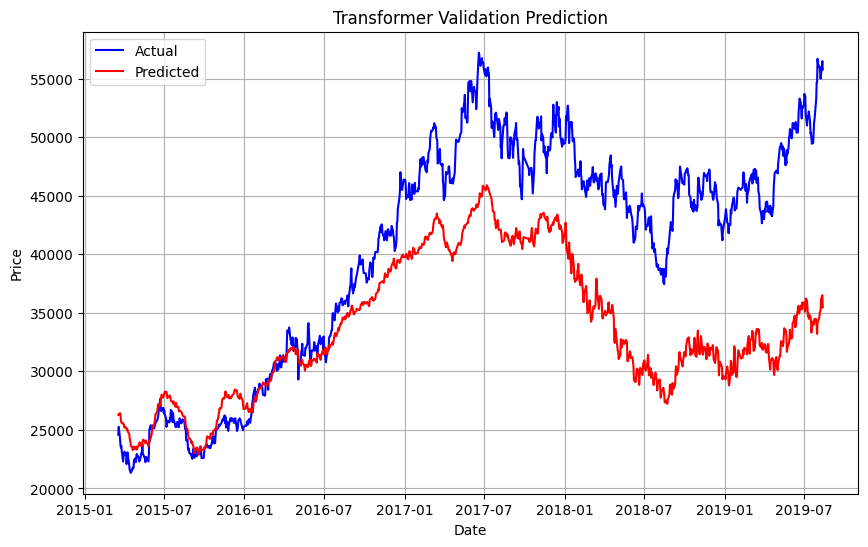

In [46]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.0564433654389667
Root Mean Squared Error (RMSE): 0.23757812491676647
Mean Absolute Error (MAE): 0.23459364757101958
R^2 Score: -16.85945713762095

Mean Absolute Error (MAE): 30420.650112123858
Mean Squared Error (MSE): 978546425.8240474
Root Mean Squared Error (RMSE): 31281.726707840913
R-squared (R2): -10.363696756367398


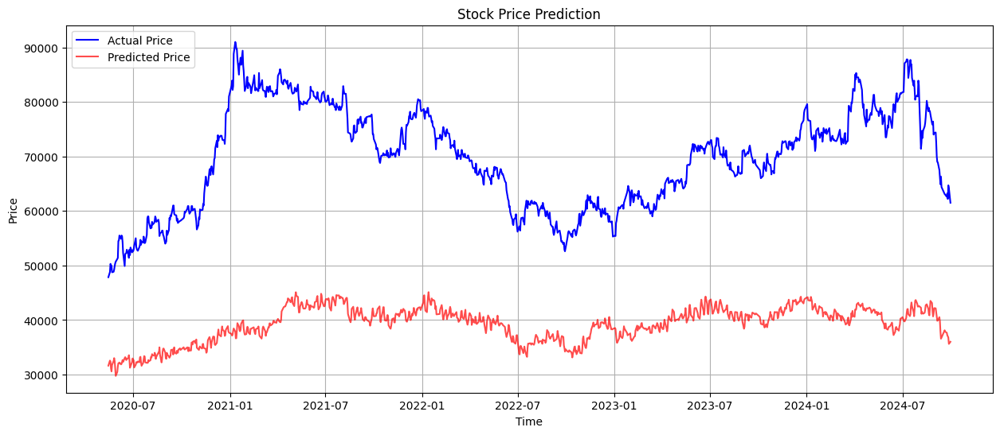

(0.0564433654389667,
 0.23459364757101958,
 0.23757812491676647,
 -16.85945713762095)

In [47]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

###re2 ---

In [48]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=6, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.4, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 35s - 640ms/step - loss: 0.9988 - mae: 0.7305 - val_loss: 0.0047 - val_mae: 0.0576
Epoch 2/100
54/54 - 2s - 34ms/step - loss: 0.1485 - mae: 0.3091 - val_loss: 0.0034 - val_mae: 0.0485
Epoch 3/100
54/54 - 1s - 24ms/step - loss: 0.1046 - mae: 0.2593 - val_loss: 0.0021 - val_mae: 0.0369
Epoch 4/100
54/54 - 3s - 47ms/step - loss: 0.0768 - mae: 0.2224 - val_loss: 0.0196 - val_mae: 0.1293
Epoch 5/100
54/54 - 1s - 24ms/step - loss: 0.0593 - mae: 0.1943 - val_loss: 0.0131 - val_mae: 0.0905
Epoch 6/100
54/54 - 1s - 23ms/step - loss: 0.0508 - mae: 0.1793 - val_loss: 0.0181 - val_mae: 0.0994
Epoch 7/100
54/54 - 1s - 23ms/step - loss: 0.0459 - mae: 0.1700 - val_loss: 0.0106 - val_mae: 0.0758
Epoch 8/100
54/54 - 1s - 23ms/step - loss: 0.0444 - mae: 0.1656 - val_loss: 0.0126 - val_mae: 0.0826
Epoch 9/100
54/54 - 1s - 23ms/step - loss: 0.0422 - mae: 0.1630 - val_loss: 0.0073 - val_mae: 0.0621
Epoch 10/100
54/54 - 1s - 24ms/step - loss: 0.0429 - mae: 0.1638 - val_loss: 0.0069 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.001160463513097429
Root Mean Squared Error (RMSE): 0.03406557665881247
Mean Absolute Error (MAE): 0.026492367195333804
R^2 Score: 0.9096767373472128

### After Inverse Transform
Mean Squared Error (MSE): 13884595.743213773
Root Mean Squared Error (RMSE): 3726.2039320485096
Mean Absolute Error (MAE): 2720.5535567434213
R^2 Score: 0.8588678101250784


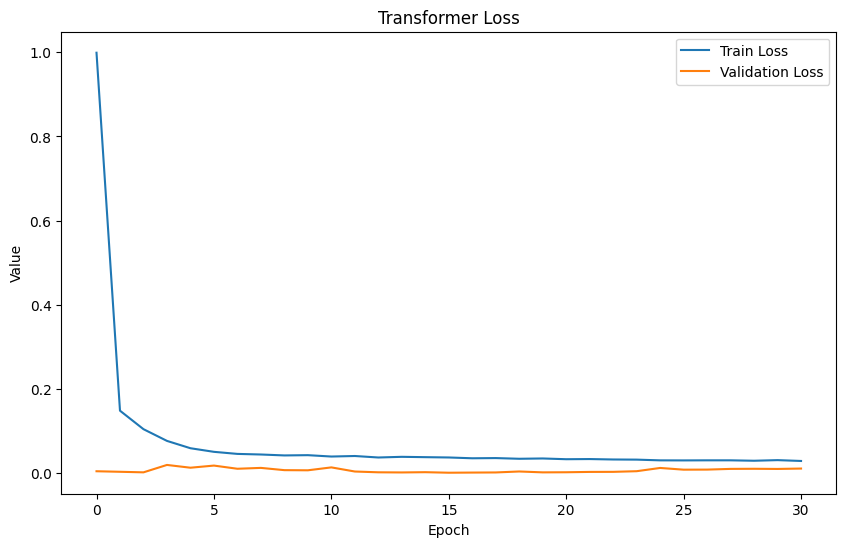

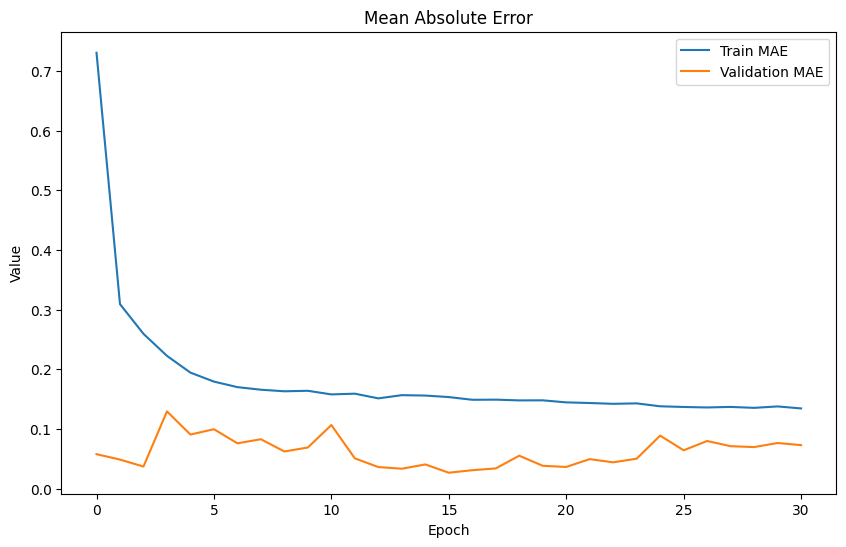

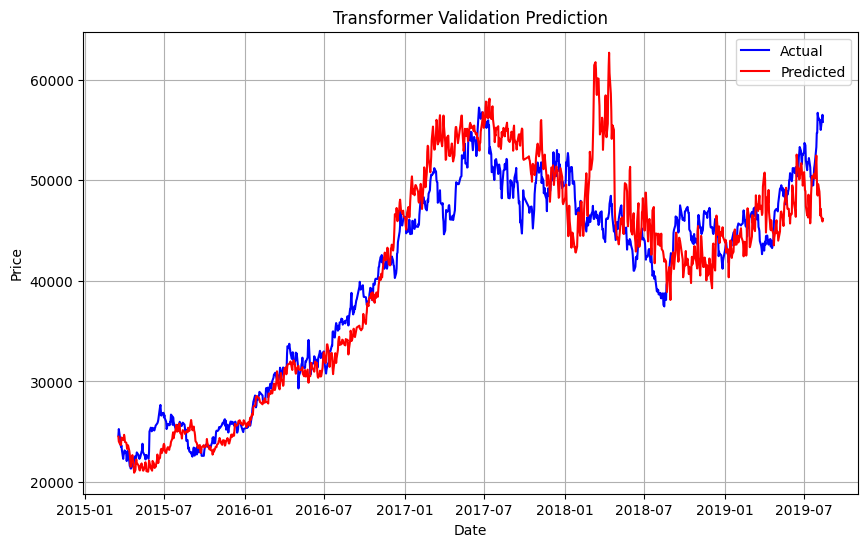

In [49]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.012157629037633252
Root Mean Squared Error (RMSE): 0.11026163901209365
Mean Absolute Error (MAE): 0.09326208411916548
R^2 Score: -2.8468410415302454

Mean Absolute Error (MAE): 14054.168102575244
Mean Squared Error (MSE): 279955621.98265797
Root Mean Squared Error (RMSE): 16731.87443123627
R-squared (R2): -2.2510780372756516


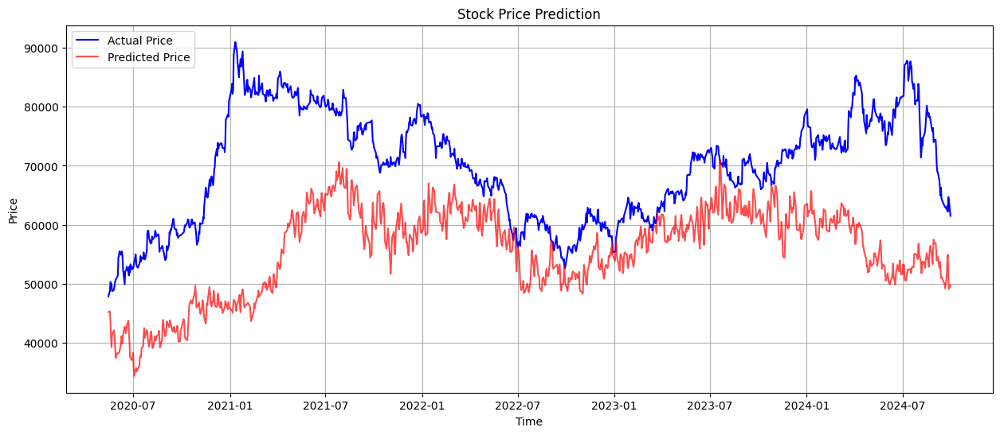

(0.012157629037633252,
 0.09326208411916548,
 0.11026163901209365,
 -2.8468410415302454)

In [50]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

###re2 ---

In [54]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=7, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.5, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 31s - 572ms/step - loss: 0.2235 - mae: 0.3550 - val_loss: 0.0420 - val_mae: 0.1954
Epoch 2/100
54/54 - 2s - 30ms/step - loss: 0.0813 - mae: 0.2280 - val_loss: 0.0511 - val_mae: 0.2167
Epoch 3/100
54/54 - 3s - 48ms/step - loss: 0.0676 - mae: 0.2071 - val_loss: 0.0261 - val_mae: 0.1560
Epoch 4/100
54/54 - 1s - 27ms/step - loss: 0.0567 - mae: 0.1896 - val_loss: 0.0173 - val_mae: 0.1252
Epoch 5/100
54/54 - 3s - 47ms/step - loss: 0.0495 - mae: 0.1759 - val_loss: 0.0117 - val_mae: 0.0947
Epoch 6/100
54/54 - 1s - 27ms/step - loss: 0.0510 - mae: 0.1801 - val_loss: 0.0055 - val_mae: 0.0572
Epoch 7/100
54/54 - 1s - 27ms/step - loss: 0.0452 - mae: 0.1684 - val_loss: 0.0093 - val_mae: 0.0724
Epoch 8/100
54/54 - 2s - 30ms/step - loss: 0.0448 - mae: 0.1688 - val_loss: 0.0139 - val_mae: 0.0864
Epoch 9/100
54/54 - 1s - 27ms/step - loss: 0.0438 - mae: 0.1655 - val_loss: 0.0184 - val_mae: 0.0971
Epoch 10/100
54/54 - 2s - 31ms/step - loss: 0.0415 - mae: 0.1615 - val_loss: 0.0199 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.005536357446010311
Root Mean Squared Error (RMSE): 0.07440670296425121
Mean Absolute Error (MAE): 0.05722404680284888
R^2 Score: 0.56908436836504

### After Inverse Transform
Mean Squared Error (MSE): 49485912.8629688
Root Mean Squared Error (RMSE): 7034.622439262025
Mean Absolute Error (MAE): 5289.560600978186
R^2 Score: 0.49699253910767516


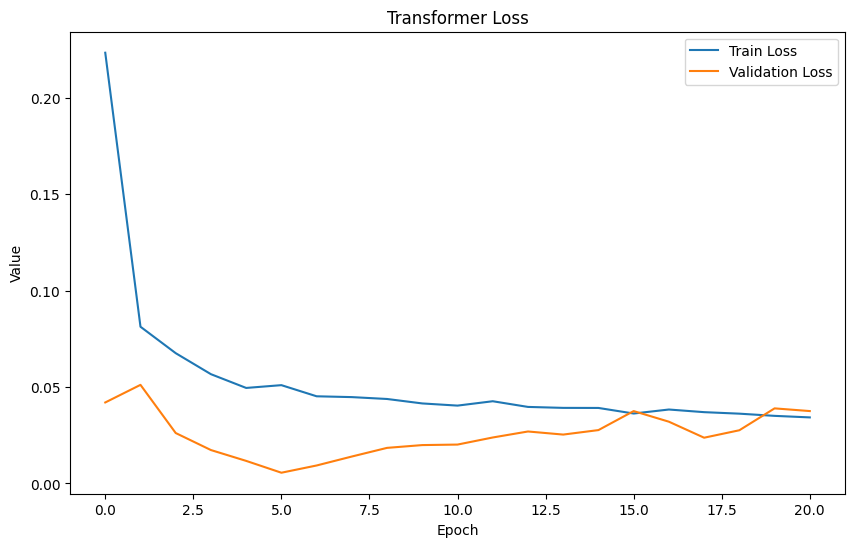

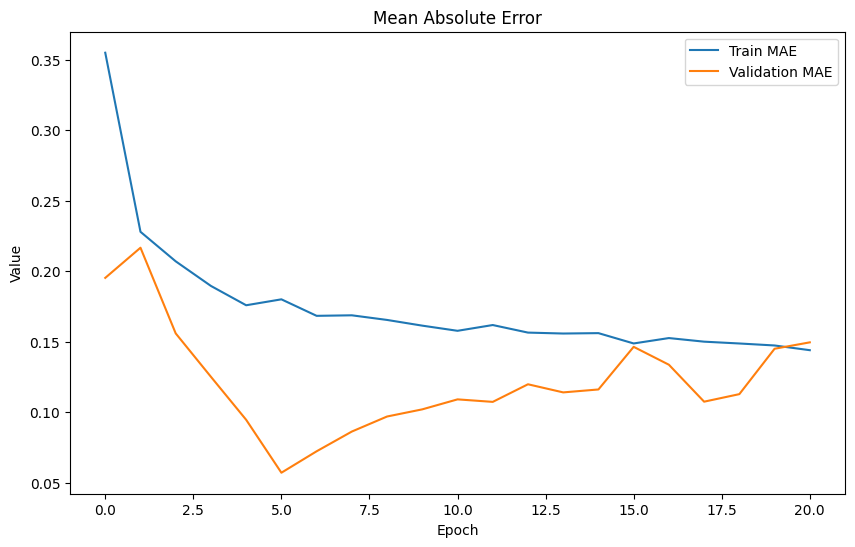

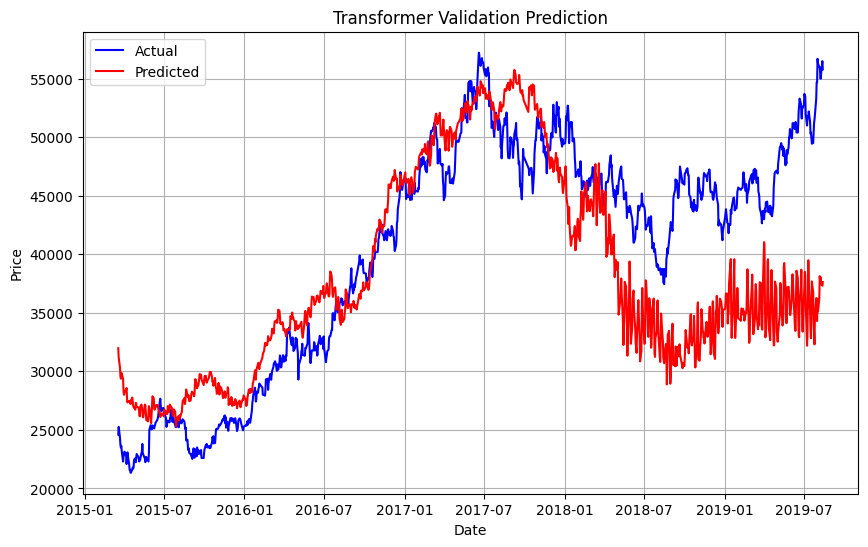

In [55]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.03843053924654646
Root Mean Squared Error (RMSE): 0.196037086405982
Mean Absolute Error (MAE): 0.18740975643357857
R^2 Score: -11.159951184900873

Mean Absolute Error (MAE): 25415.644581886587
Mean Squared Error (MSE): 719099435.5820779
Root Mean Squared Error (RMSE): 26816.02945221529
R-squared (R2): -7.350782045673759


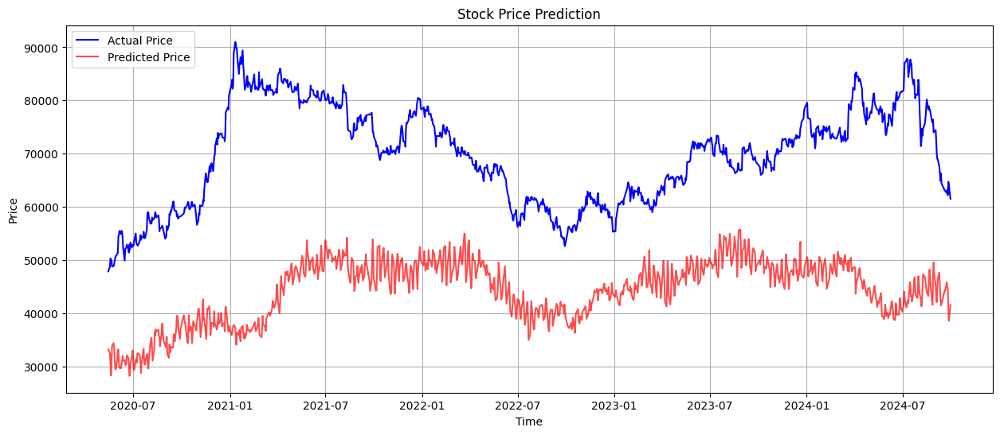

(0.03843053924654646,
 0.18740975643357857,
 0.196037086405982,
 -11.159951184900873)

In [56]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

###re2 ---

In [57]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=6, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.4, lr=0.00008,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 28s - 524ms/step - loss: 0.7665 - mae: 0.6706 - val_loss: 0.1755 - val_mae: 0.4097
Epoch 2/100
54/54 - 5s - 96ms/step - loss: 0.1190 - mae: 0.2725 - val_loss: 0.0144 - val_mae: 0.1066
Epoch 3/100
54/54 - 2s - 46ms/step - loss: 0.0753 - mae: 0.2203 - val_loss: 0.0026 - val_mae: 0.0418
Epoch 4/100
54/54 - 1s - 24ms/step - loss: 0.0607 - mae: 0.1950 - val_loss: 0.0021 - val_mae: 0.0359
Epoch 5/100
54/54 - 3s - 48ms/step - loss: 0.0502 - mae: 0.1759 - val_loss: 0.0022 - val_mae: 0.0395
Epoch 6/100
54/54 - 2s - 28ms/step - loss: 0.0427 - mae: 0.1617 - val_loss: 0.0021 - val_mae: 0.0377
Epoch 7/100
54/54 - 1s - 23ms/step - loss: 0.0389 - mae: 0.1555 - val_loss: 0.0033 - val_mae: 0.0488
Epoch 8/100
54/54 - 1s - 23ms/step - loss: 0.0357 - mae: 0.1487 - val_loss: 0.0044 - val_mae: 0.0575
Epoch 9/100
54/54 - 1s - 23ms/step - loss: 0.0340 - mae: 0.1430 - val_loss: 0.0069 - val_mae: 0.0698
Epoch 10/100
54/54 - 1s - 23ms/step - loss: 0.0333 - mae: 0.1437 - val_loss: 0.0065 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.0020511810208652193
Root Mean Squared Error (RMSE): 0.045289966006448044
Mean Absolute Error (MAE): 0.03589126750388799
R^2 Score: 0.8403488261328327

### After Inverse Transform
Mean Squared Error (MSE): 16649008.02117648
Root Mean Squared Error (RMSE): 4080.3195979207903
Mean Absolute Error (MAE): 3268.5280002019854
R^2 Score: 0.8307685002336337


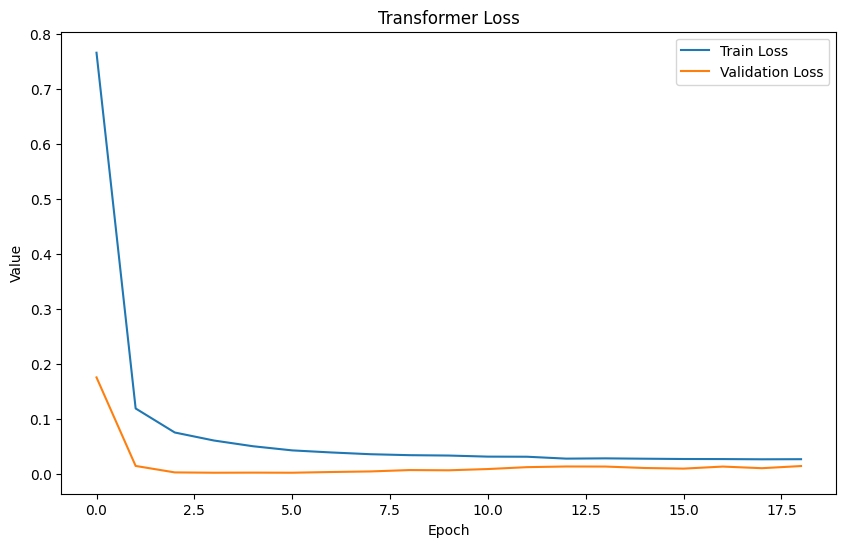

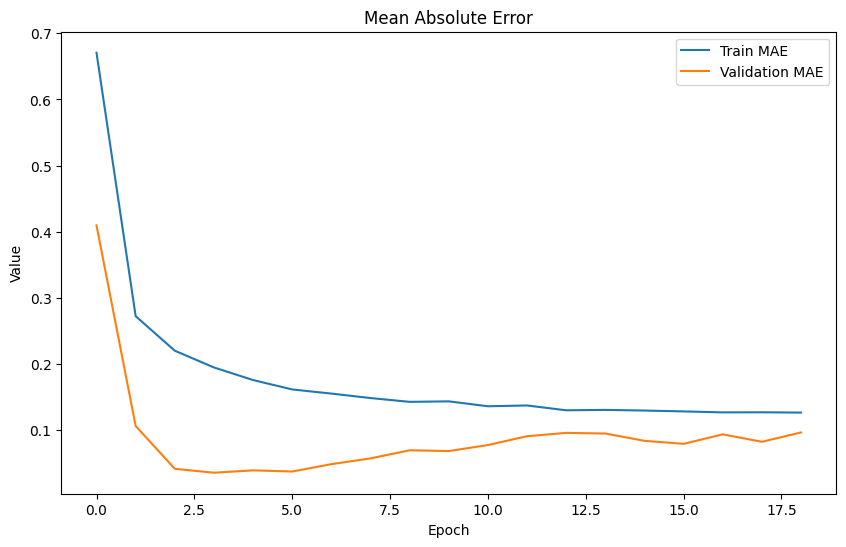

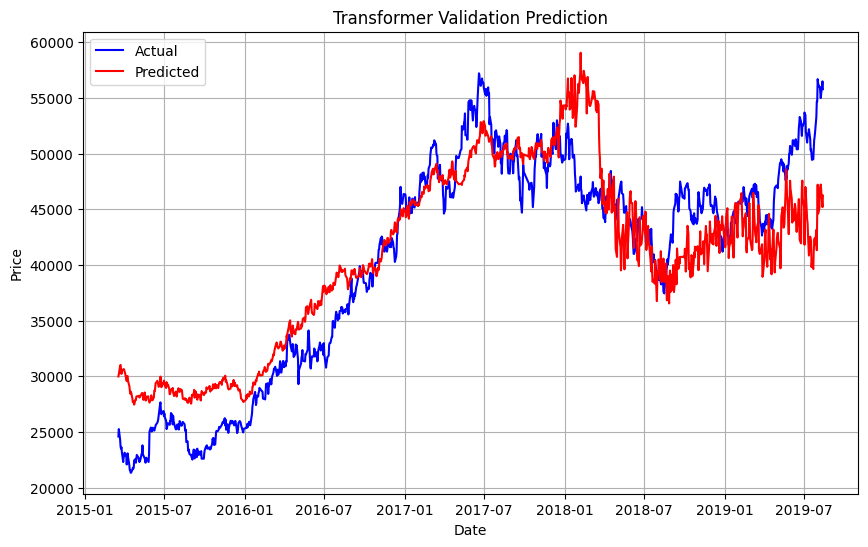

In [58]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.012183212912894328
Root Mean Squared Error (RMSE): 0.11037759244019743
Mean Absolute Error (MAE): 0.0948563485052446
R^2 Score: -2.854936131539247

Mean Absolute Error (MAE): 14288.02631293404
Mean Squared Error (MSE): 281818330.0662336
Root Mean Squared Error (RMSE): 16787.445608734928
R-squared (R2): -2.2727093561878453


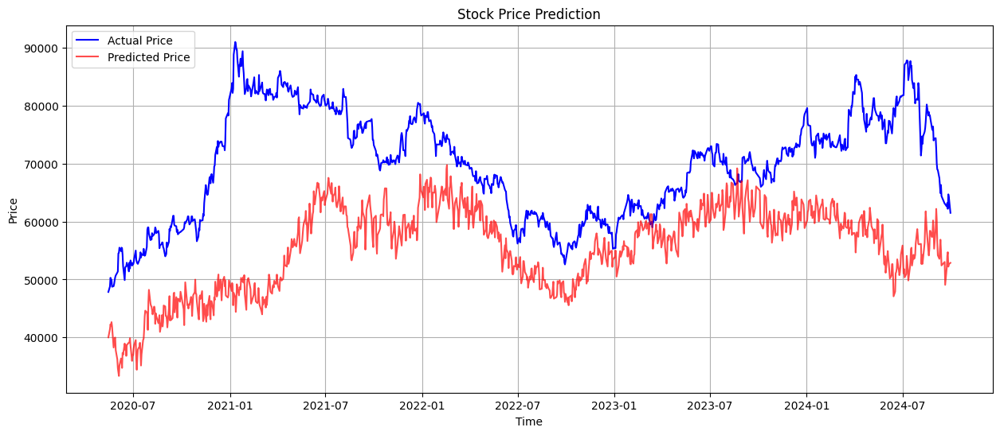

(0.012183212912894328,
 0.0948563485052446,
 0.11037759244019743,
 -2.854936131539247)

In [59]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

###re2 그나마

In [63]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=5, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.4, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 30s - 563ms/step - loss: 0.4745 - mae: 0.5208 - val_loss: 0.0365 - val_mae: 0.1695
Epoch 2/100
54/54 - 3s - 63ms/step - loss: 0.1134 - mae: 0.2685 - val_loss: 0.0104 - val_mae: 0.0869
Epoch 3/100
54/54 - 1s - 21ms/step - loss: 0.0925 - mae: 0.2427 - val_loss: 0.0075 - val_mae: 0.0748
Epoch 4/100
54/54 - 1s - 22ms/step - loss: 0.0817 - mae: 0.2279 - val_loss: 0.0089 - val_mae: 0.0752
Epoch 5/100
54/54 - 1s - 22ms/step - loss: 0.0719 - mae: 0.2143 - val_loss: 0.0067 - val_mae: 0.0684
Epoch 6/100
54/54 - 1s - 23ms/step - loss: 0.0641 - mae: 0.2023 - val_loss: 0.0055 - val_mae: 0.0614
Epoch 7/100
54/54 - 1s - 21ms/step - loss: 0.0564 - mae: 0.1902 - val_loss: 0.0160 - val_mae: 0.1010
Epoch 8/100
54/54 - 1s - 24ms/step - loss: 0.0513 - mae: 0.1805 - val_loss: 0.0171 - val_mae: 0.0939
Epoch 9/100
54/54 - 1s - 23ms/step - loss: 0.0427 - mae: 0.1656 - val_loss: 0.0249 - val_mae: 0.1102
Epoch 10/100
54/54 - 1s - 23ms/step - loss: 0.0398 - mae: 0.1592 - val_loss: 0.0318 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.005467876626729263
Root Mean Squared Error (RMSE): 0.07394509197187642
Mean Absolute Error (MAE): 0.06138933545156003
R^2 Score: 0.5744144894388947

### After Inverse Transform
Mean Squared Error (MSE): 48025769.85304899
Root Mean Squared Error (RMSE): 6930.062759676061
Mean Absolute Error (MAE): 5646.1157916378115
R^2 Score: 0.511834395819367


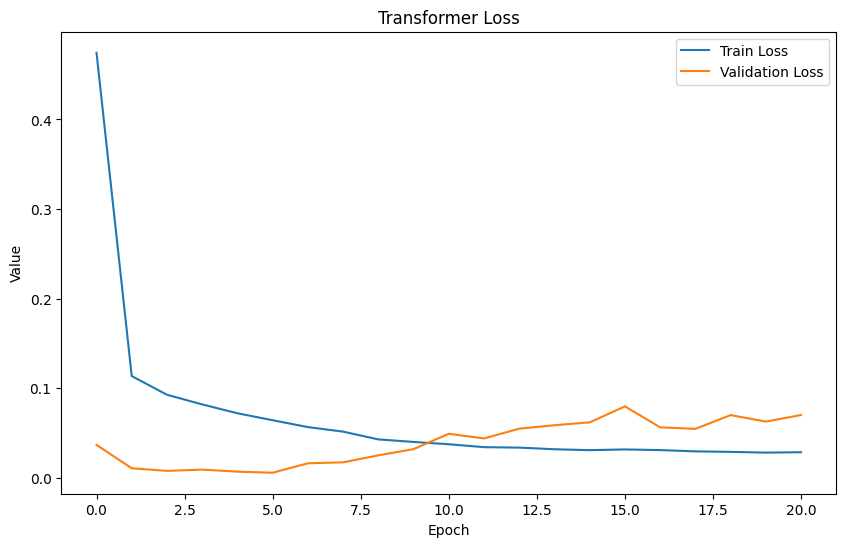

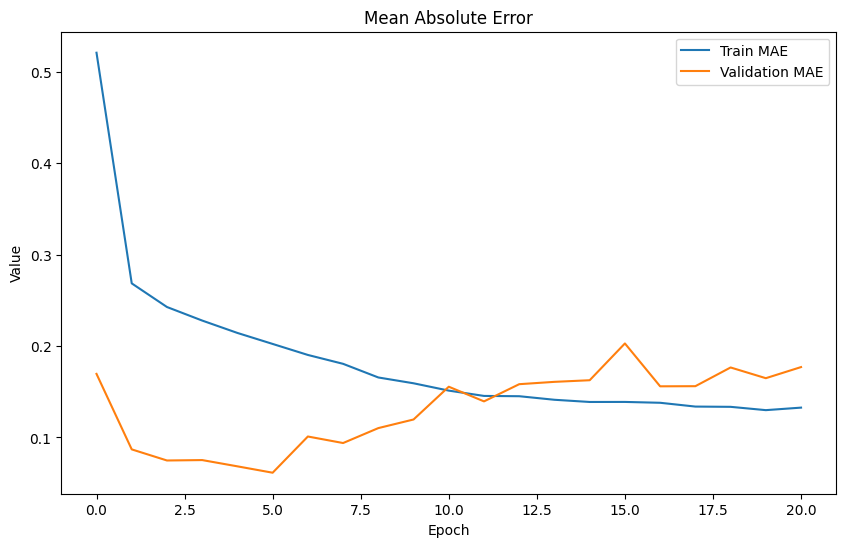

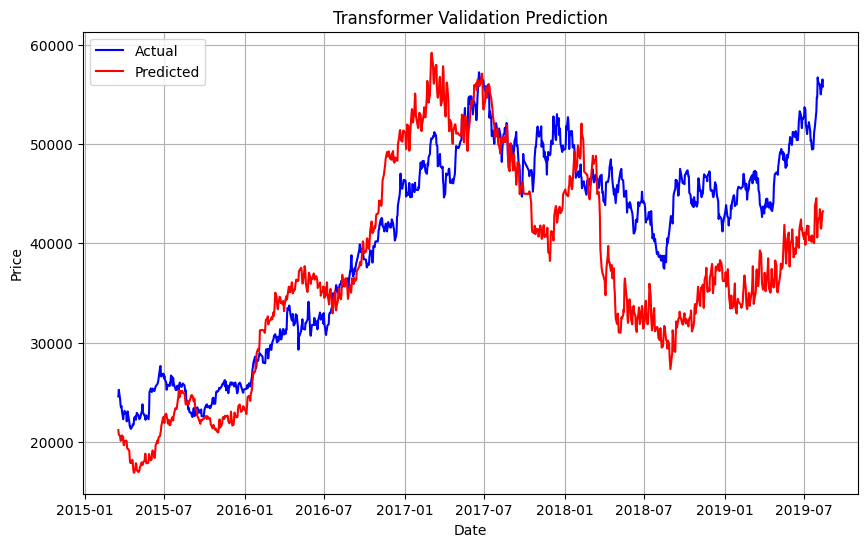

In [64]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.0790102940438206
Root Mean Squared Error (RMSE): 0.28108769813675694
Mean Absolute Error (MAE): 0.2751571134466275
R^2 Score: -23.999943730007928

Mean Absolute Error (MAE): 33908.80466037328
Mean Squared Error (MSE): 1222774736.7508364
Root Mean Squared Error (RMSE): 34968.19607516002
R-squared (R2): -13.199879477442375


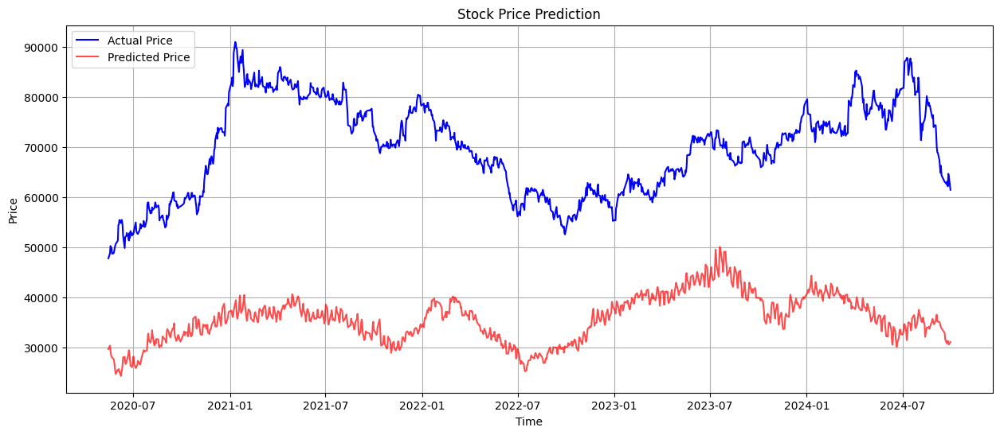

(0.0790102940438206,
 0.2751571134466275,
 0.28108769813675694,
 -23.999943730007928)

In [65]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

###re2 ---

In [66]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=5, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.4, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 34s - 627ms/step - loss: 0.2381 - mae: 0.3621 - val_loss: 0.0278 - val_mae: 0.1121
Epoch 2/100
54/54 - 19s - 360ms/step - loss: 0.0730 - mae: 0.2151 - val_loss: 0.0358 - val_mae: 0.1280
Epoch 3/100
54/54 - 1s - 22ms/step - loss: 0.0495 - mae: 0.1780 - val_loss: 0.0301 - val_mae: 0.1161
Epoch 4/100
54/54 - 1s - 24ms/step - loss: 0.0383 - mae: 0.1549 - val_loss: 0.0248 - val_mae: 0.1107
Epoch 5/100
54/54 - 1s - 21ms/step - loss: 0.0351 - mae: 0.1477 - val_loss: 0.0204 - val_mae: 0.1017
Epoch 6/100
54/54 - 1s - 22ms/step - loss: 0.0357 - mae: 0.1478 - val_loss: 0.0199 - val_mae: 0.1041
Epoch 7/100
54/54 - 1s - 22ms/step - loss: 0.0316 - mae: 0.1420 - val_loss: 0.0230 - val_mae: 0.1066
Epoch 8/100
54/54 - 1s - 24ms/step - loss: 0.0308 - mae: 0.1382 - val_loss: 0.0173 - val_mae: 0.0963
Epoch 9/100
54/54 - 1s - 20ms/step - loss: 0.0311 - mae: 0.1401 - val_loss: 0.0185 - val_mae: 0.0959
Epoch 10/100
54/54 - 1s - 24ms/step - loss: 0.0291 - mae: 0.1340 - val_loss: 0.0155 - v

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.009435278891970395
Root Mean Squared Error (RMSE): 0.09713536375579387
Mean Absolute Error (MAE): 0.06993118861706187
R^2 Score: 0.2656165713585942

### After Inverse Transform
Mean Squared Error (MSE): 80087105.69779137
Root Mean Squared Error (RMSE): 8949.139941792808
Mean Absolute Error (MAE): 6324.573980695984
R^2 Score: 0.18594182957051553


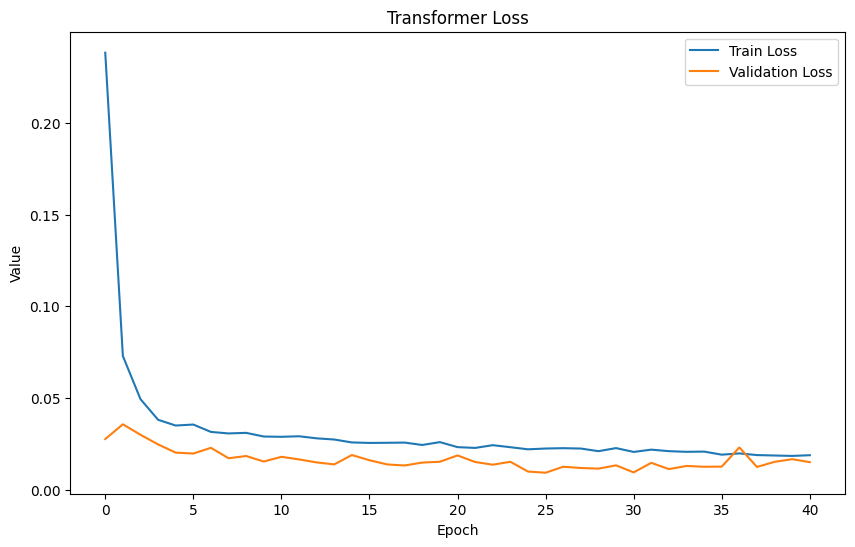

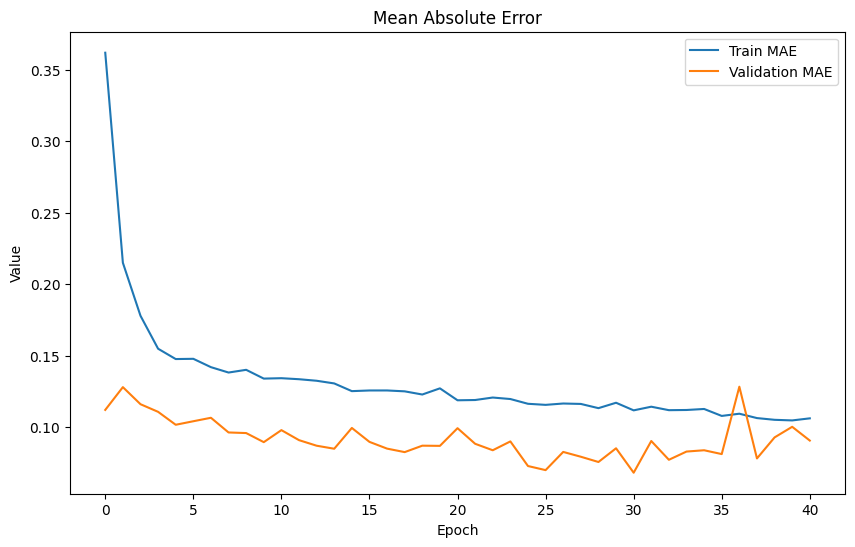

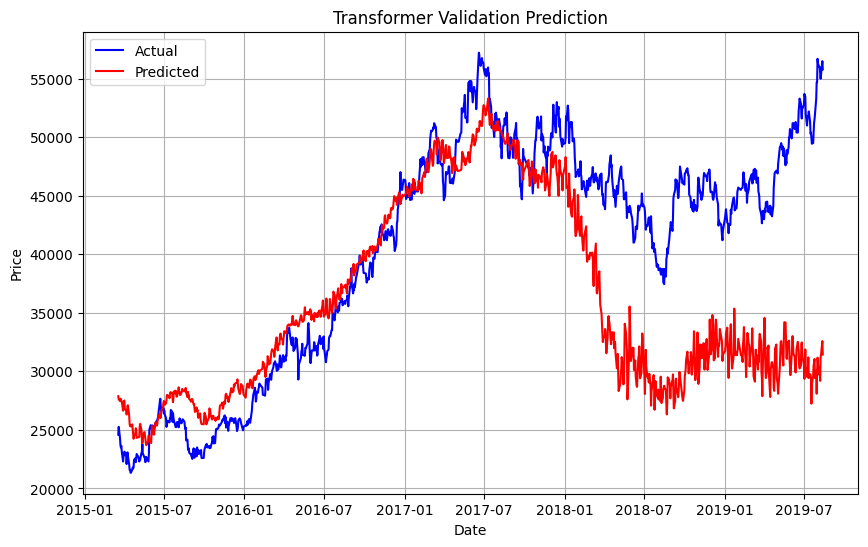

In [67]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.07256890483768409
Root Mean Squared Error (RMSE): 0.26938616304050234
Mean Absolute Error (MAE): 0.26255020318919975
R^2 Score: -21.96179959138239

Mean Absolute Error (MAE): 32899.531324146425
Mean Squared Error (MSE): 1165051373.706028
Root Mean Squared Error (RMSE): 34132.84889525086
R-squared (R2): -12.529547670909515


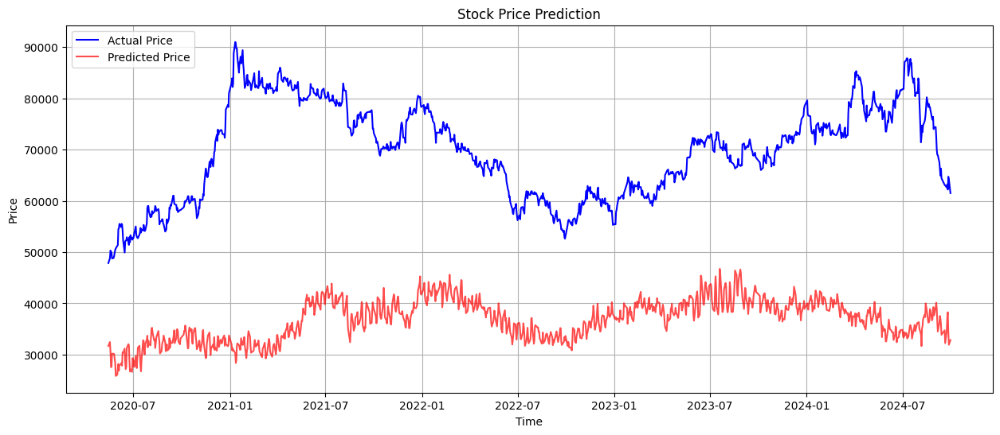

(0.07256890483768409,
 0.26255020318919975,
 0.26938616304050234,
 -21.96179959138239)

In [68]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

###re2 ---

In [69]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=5, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.4, lr=0.00009,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 29s - 532ms/step - loss: 0.1906 - mae: 0.3288 - val_loss: 0.0231 - val_mae: 0.1155
Epoch 2/100
54/54 - 1s - 22ms/step - loss: 0.0618 - mae: 0.1977 - val_loss: 0.0035 - val_mae: 0.0494
Epoch 3/100
54/54 - 1s - 23ms/step - loss: 0.0498 - mae: 0.1786 - val_loss: 0.0059 - val_mae: 0.0652
Epoch 4/100
54/54 - 1s - 24ms/step - loss: 0.0445 - mae: 0.1679 - val_loss: 0.0172 - val_mae: 0.1047
Epoch 5/100
54/54 - 1s - 22ms/step - loss: 0.0385 - mae: 0.1556 - val_loss: 0.0185 - val_mae: 0.0979
Epoch 6/100
54/54 - 1s - 21ms/step - loss: 0.0333 - mae: 0.1453 - val_loss: 0.0289 - val_mae: 0.1166
Epoch 7/100
54/54 - 1s - 24ms/step - loss: 0.0334 - mae: 0.1439 - val_loss: 0.0330 - val_mae: 0.1257
Epoch 8/100
54/54 - 1s - 20ms/step - loss: 0.0313 - mae: 0.1389 - val_loss: 0.0449 - val_mae: 0.1445
Epoch 9/100
54/54 - 1s - 21ms/step - loss: 0.0307 - mae: 0.1376 - val_loss: 0.0493 - val_mae: 0.1514
Epoch 10/100
54/54 - 1s - 23ms/step - loss: 0.0295 - mae: 0.1346 - val_loss: 0.0574 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.0035231668939813164
Root Mean Squared Error (RMSE): 0.05935627089012008
Mean Absolute Error (MAE): 0.04936499582407114
R^2 Score: 0.7257786004100227

### After Inverse Transform
Mean Squared Error (MSE): 38215383.89588676
Root Mean Squared Error (RMSE): 6181.859258822281
Mean Absolute Error (MAE): 4923.499740304709
R^2 Score: 0.611553629944653


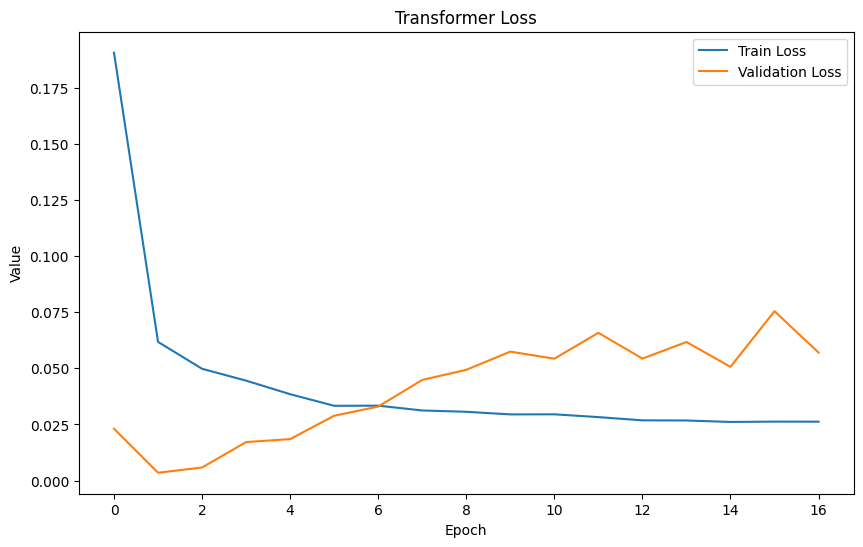

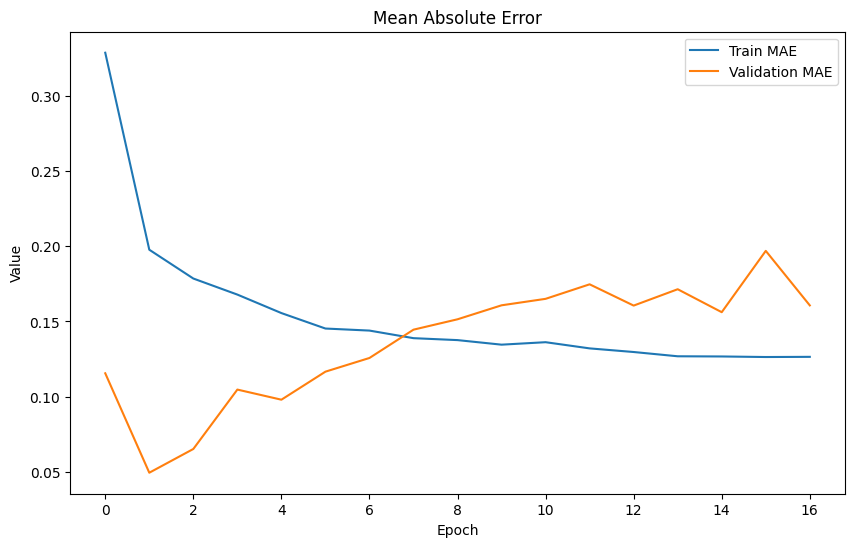

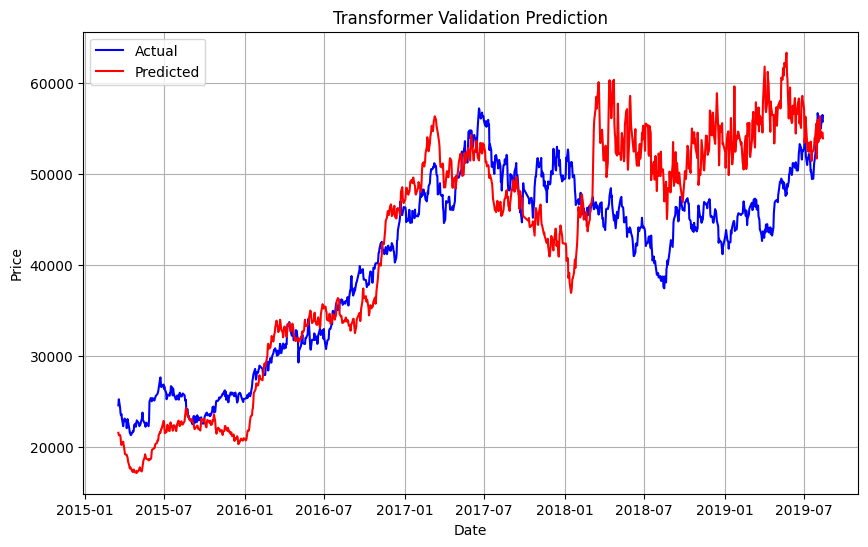

In [70]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.018428478938725013
Root Mean Squared Error (RMSE): 0.13575153383562563
Mean Absolute Error (MAE): 0.10830003691314628
R^2 Score: -4.831024198470172

Mean Absolute Error (MAE): 15850.972538700824
Mean Squared Error (MSE): 393563585.9429692
Root Mean Squared Error (RMSE): 19838.437084180023
R-squared (R2): -3.5703884118101232


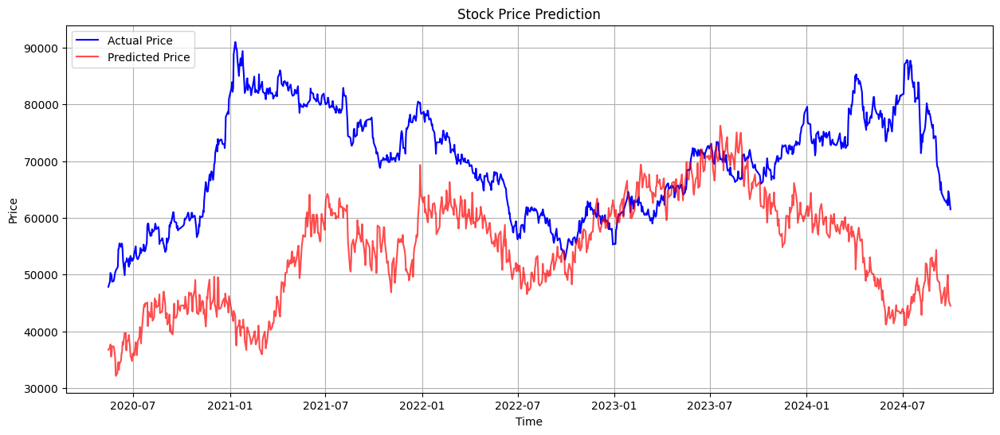

(0.018428478938725013,
 0.10830003691314628,
 0.13575153383562563,
 -4.831024198470172)

In [71]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

###re2 ---

In [72]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.4, lr=0.00009,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)

Epoch 1/100
54/54 - 32s - 593ms/step - loss: 0.2958 - mae: 0.4099 - val_loss: 0.4601 - val_mae: 0.4497
Epoch 2/100
54/54 - 2s - 35ms/step - loss: 0.0742 - mae: 0.2150 - val_loss: 0.4062 - val_mae: 0.4294
Epoch 3/100
54/54 - 1s - 19ms/step - loss: 0.0563 - mae: 0.1894 - val_loss: 0.3925 - val_mae: 0.4309
Epoch 4/100
54/54 - 1s - 24ms/step - loss: 0.0481 - mae: 0.1741 - val_loss: 0.3612 - val_mae: 0.4112
Epoch 5/100
54/54 - 1s - 21ms/step - loss: 0.0439 - mae: 0.1650 - val_loss: 0.3444 - val_mae: 0.3848
Epoch 6/100
54/54 - 1s - 23ms/step - loss: 0.0414 - mae: 0.1606 - val_loss: 0.3013 - val_mae: 0.3610
Epoch 7/100
54/54 - 1s - 18ms/step - loss: 0.0378 - mae: 0.1549 - val_loss: 0.2642 - val_mae: 0.3390
Epoch 8/100
54/54 - 1s - 18ms/step - loss: 0.0376 - mae: 0.1552 - val_loss: 0.2488 - val_mae: 0.3310
Epoch 9/100
54/54 - 1s - 17ms/step - loss: 0.0362 - mae: 0.1504 - val_loss: 0.2256 - val_mae: 0.3116
Epoch 10/100
54/54 - 1s - 18ms/step - loss: 0.0361 - mae: 0.1500 - val_loss: 0.1823 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.0043339346878669815
Root Mean Squared Error (RMSE): 0.06583262631755611
Mean Absolute Error (MAE): 0.05280379265309306
R^2 Score: 0.6626734776973817

### After Inverse Transform
Mean Squared Error (MSE): 43349056.736958034
Root Mean Squared Error (RMSE): 6584.000055965828
Mean Absolute Error (MAE): 5146.827044739727
R^2 Score: 0.5593715928467476


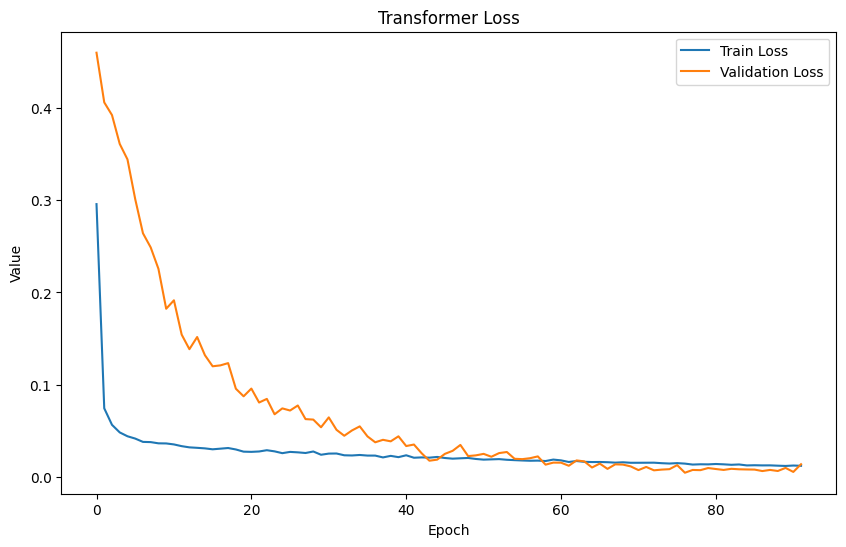

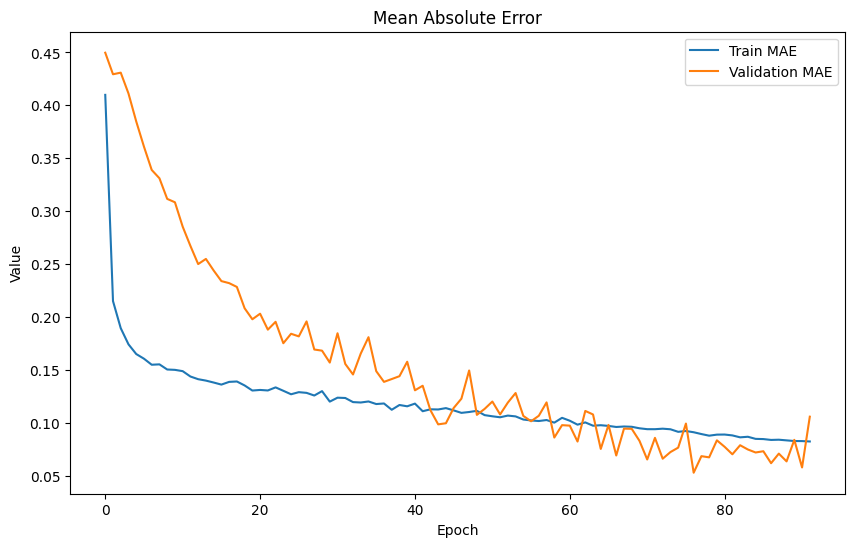

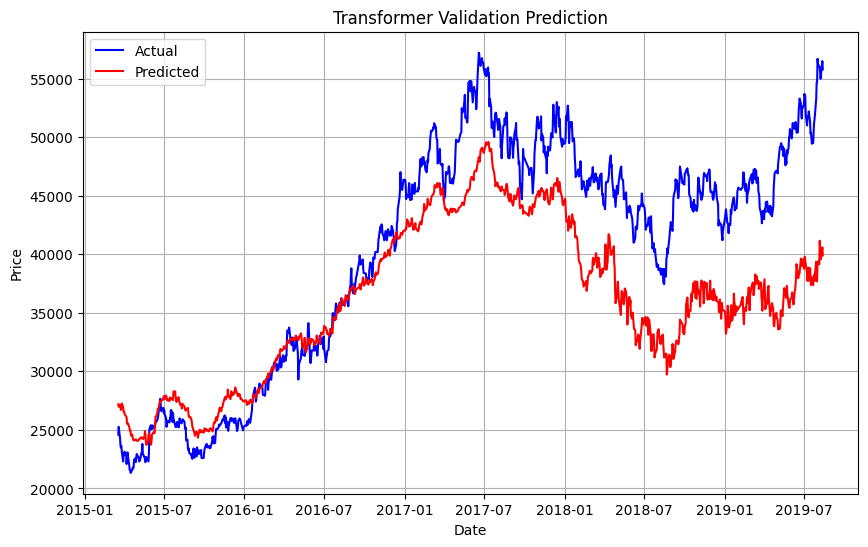

In [73]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.026258634710661036
Root Mean Squared Error (RMSE): 0.16204516256482646
Mean Absolute Error (MAE): 0.15881790647512348
R^2 Score: -7.308593179380797

Mean Absolute Error (MAE): 22493.90410879631
Mean Squared Error (MSE): 546476611.271406
Root Mean Squared Error (RMSE): 23376.839206175973
R-squared (R2): -5.346141921376906


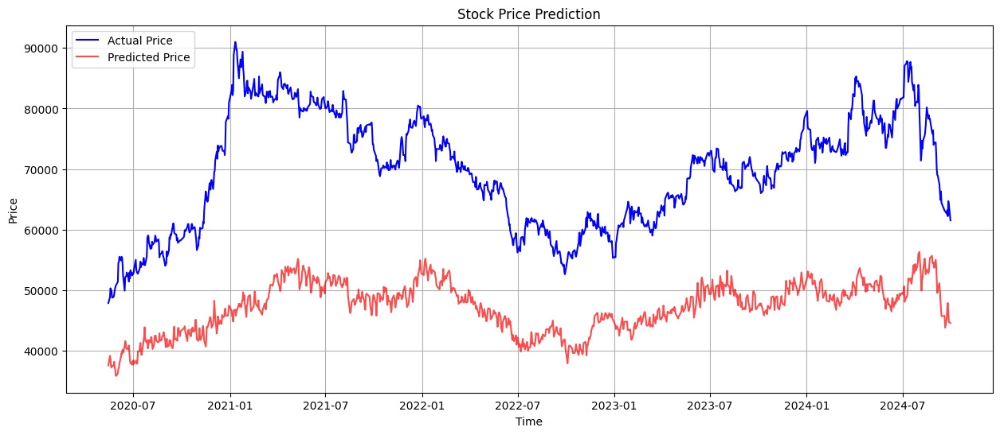

(0.026258634710661036,
 0.15881790647512348,
 0.16204516256482646,
 -7.308593179380797)

In [74]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거

#!! Final+Selec: Interp (0)

In [ ]:
seq_length = 90  # 예: 30일간의 데이터를 기반으로 예측
x_train, y_train = create_sequences(x_train_int0, y_train_int0, seq_length)
x_val, y_val = create_sequences(x_val_int0, y_val_int0, seq_length)
x_test, y_test = create_sequences(x_test_int0, y_test_int0, seq_length)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.2, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 33s - 616ms/step - loss: 0.2069 - mae: 0.3450 - val_loss: 0.0444 - val_mae: 0.1757
Epoch 2/100
54/54 - 1s - 18ms/step - loss: 0.0572 - mae: 0.1912 - val_loss: 0.0267 - val_mae: 0.1299
Epoch 3/100
54/54 - 1s - 23ms/step - loss: 0.0349 - mae: 0.1490 - val_loss: 0.0140 - val_mae: 0.0998
Epoch 4/100
54/54 - 2s - 30ms/step - loss: 0.0243 - mae: 0.1239 - val_loss: 0.0081 - val_mae: 0.0779
Epoch 5/100
54/54 - 3s - 46ms/step - loss: 0.0178 - mae: 0.1063 - val_loss: 0.0053 - val_mae: 0.0639
Epoch 6/100
54/54 - 2s - 32ms/step - loss: 0.0164 - mae: 0.1013 - val_loss: 0.0047 - val_mae: 0.0590
Epoch 7/100
54/54 - 2s - 33ms/step - loss: 0.0147 - mae: 0.0966 - val_loss: 0.0043 - val_mae: 0.0547
Epoch 8/100
54/54 - 2s - 34ms/step - loss: 0.0130 - mae: 0.0898 - val_loss: 0.0029 - val_mae: 0.0464
Epoch 9/100
54/54 - 1s - 19ms/step - loss: 0.0122 - mae: 0.0877 - val_loss: 0.0049 - val_mae: 0.0537
Epoch 10/100
54/54 - 1s - 24ms/step - loss: 0.0119 - mae: 0.0859 - val_loss: 0.0044 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.0017718603549642911
Root Mean Squared Error (RMSE): 0.04209347164305043
Mean Absolute Error (MAE): 0.035323906585039484
R^2 Score: 0.8620894096029507

### After Inverse Transform
Mean Squared Error (MSE): 17333765.774785277
Root Mean Squared Error (RMSE): 4163.383933146843
Mean Absolute Error (MAE): 3393.2999047783933
R^2 Score: 0.8238081707369772


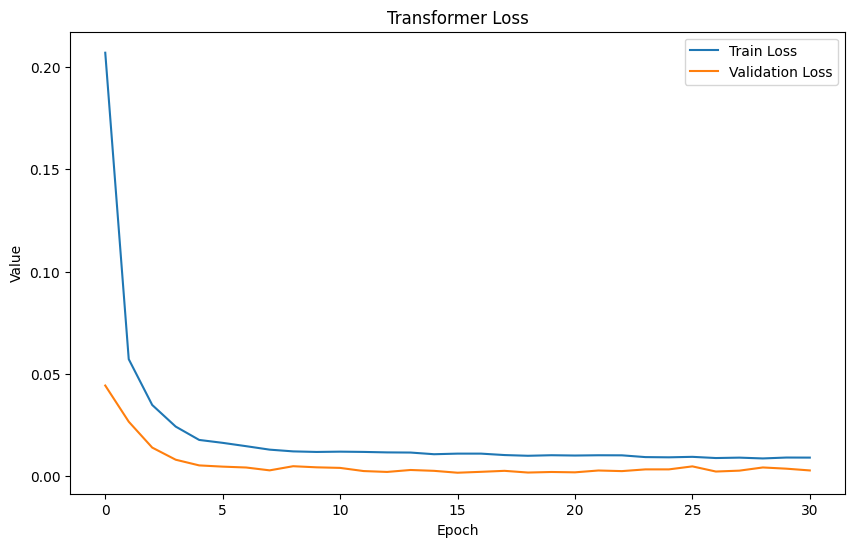

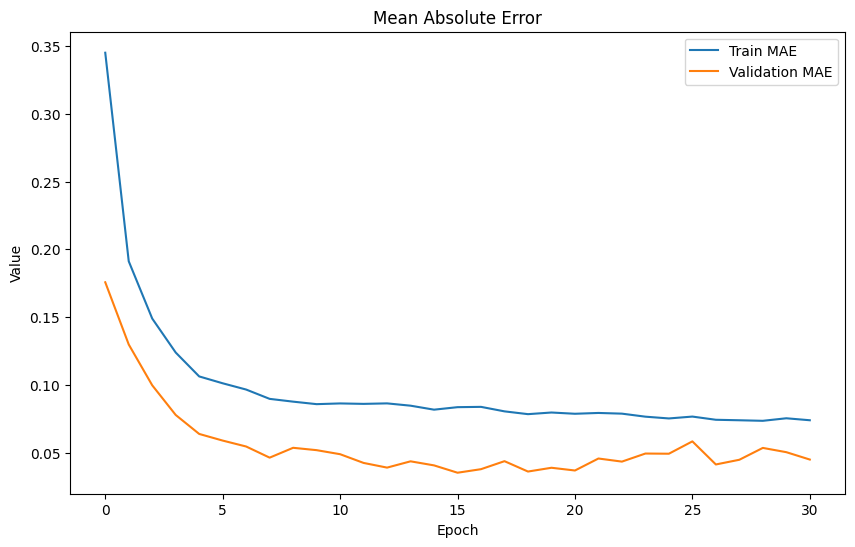

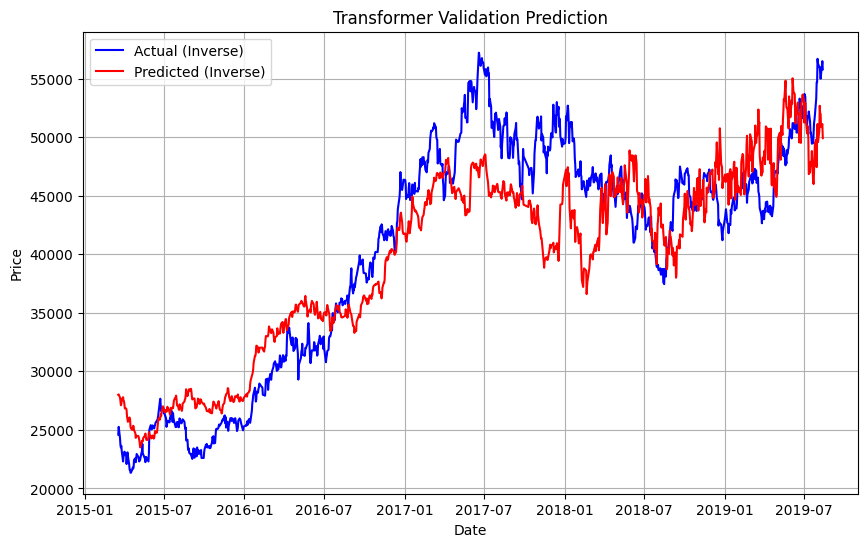

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step
Mean Absolute Error (MAE): 19570.8316659433
Root Mean Squared Error (RMSE): 22256.997035394517


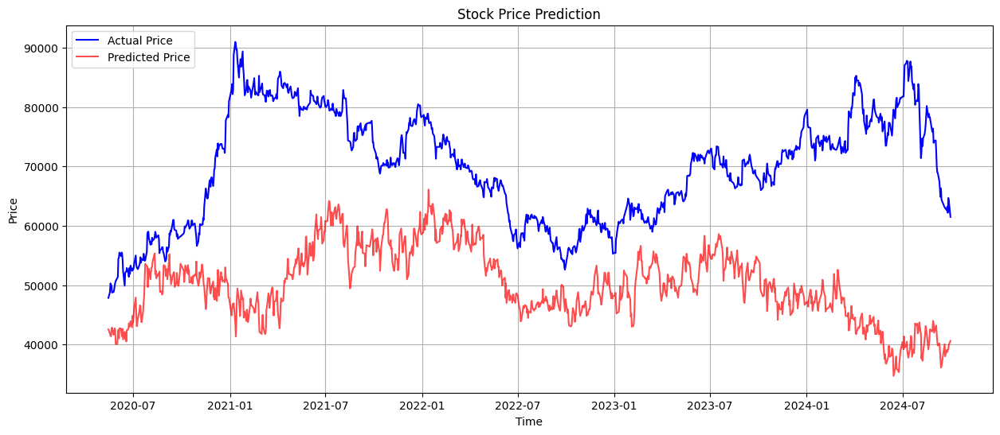

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Day 1 Prediction: [[40607.406]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Day 2 Prediction: [[41215.742]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Day 3 Prediction: [[41469.137]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Day 4 Prediction: [[42516.2]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Day 5 Prediction: [[43499.793]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Day 6 Prediction: [[47359.418]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Day 7 Prediction: [[51254.45]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Day 8 Prediction: [[52415.152]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Day 9 Prediction: [[55481.305]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
Day 10 Prediction: [[55782.387]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
Day 11 Prediction: [[55922.957]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Day 12 Prediction: [[57237.996]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Day 13 Prediction: [[59298.273]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Day 14 Prediction: [[63490.656]]
1/1 ━━━━━━━━━━━━━━

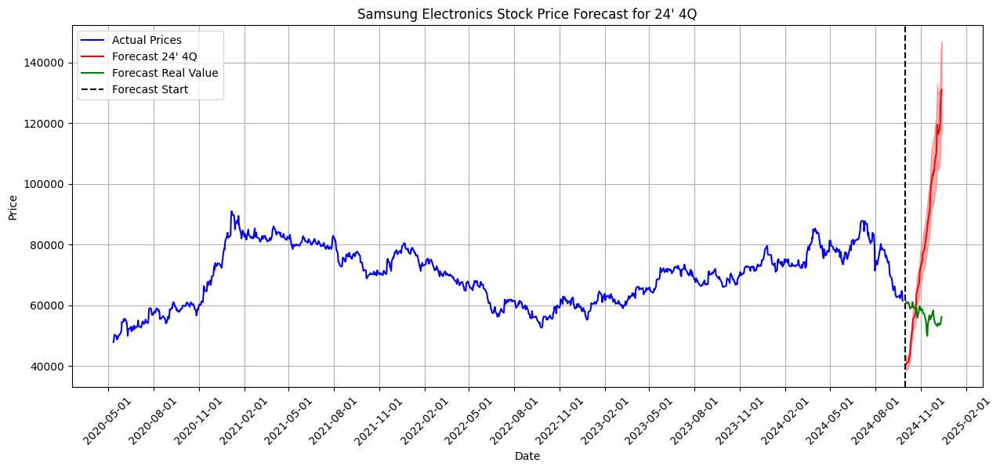

In [ ]:
future_90_days, upper_90_days, lower_90_days = predict_future_dynamic(model, x_test, y_scaler_int0, steps=51, feature_generator=feature_generator)
y_test_rever = y_scaler_int0.inverse_transform(y_test[:len(test_dates)])
y_test_rever = np.exp(y_test_rever)

future_90_days_rever = y_scaler_int0.inverse_transform(future_90_days.reshape(-1, 1))
future_90_days_rever = np.exp(future_90_days_rever)

upper_90_days_rever = y_scaler_int0.inverse_transform(upper_90_days.reshape(-1, 1))
upper_90_days_rever = np.exp(upper_90_days_rever)

lower_90_days_rever = y_scaler_int0.inverse_transform(lower_90_days.reshape(-1, 1))
lower_90_days_rever = np.exp(lower_90_days_rever)

plt.figure(figsize=(15, 6))
plt.plot(test_dates[:len(y_test_rever)], y_test_rever, label='Actual Prices', color='blue')
plt.plot(future_dates[:len(future_90_days_rever)], future_90_days_rever[:len(future_dates)], label='Forecast 24\' 4Q', color='red')
plt.plot(real_close.index, real_close.values, label='Forecast Real Value', color='green')
plt.fill_between(
    future_dates[:len(future_90_days_rever)],
    upper_90_days_rever.ravel(),
    lower_90_days_rever.ravel(),
    color='red', alpha=0.3
)
forecast_start_date = test_dates.iloc[-1]
plt.axvline(x=forecast_start_date, color='black', linestyle='--', label='Forecast Start')

plt.title('Samsung Electronics Stock Price Forecast for 24\' 4Q')
plt.xlabel('Date')
plt.ylabel('Price')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))
plt.xticks(rotation=45)
plt.legend(loc='best')
plt.grid(True)
plt.show()

In [ ]:
plt.figure(figsize=(15, 6))
plt.plot(test_dates[-20:], y_test_rever[-20:], label='Actual Prices', color='blue')
plt.plot(future_dates[:len(future_90_days_rever)], future_90_days_rever[:len(future_dates)], label='Forecast 24\' 4Q', color='red')
plt.plot(real_close.index, real_close.values, label='Forecast Real Value', color='green')
plt.fill_between(
    future_dates[:len(future_90_days_rever)],
    upper_90_days_rever.ravel(),
    lower_90_days_rever.ravel(),
    color='red', alpha=0.3
)
forecast_start_date = test_dates.iloc[-1]
plt.axvline(x=forecast_start_date, color='black', linestyle='--', label='Forecast Start')

plt.title('Samsung Electronics Stock Price Forecast for 24\' 4Q')
plt.xlabel('Date')
plt.ylabel('Price')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=5))
plt.xticks(rotation=45)
plt.legend(loc='best')
#plt.grid(True)
plt.show()

###2

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.1, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 36s - 673ms/step - loss: 0.0806 - mae: 0.2083 - val_loss: 0.2731 - val_mae: 0.3322
Epoch 2/100
54/54 - 1s - 15ms/step - loss: 0.0203 - mae: 0.1101 - val_loss: 0.1214 - val_mae: 0.2379
Epoch 3/100
54/54 - 1s - 15ms/step - loss: 0.0123 - mae: 0.0872 - val_loss: 0.0524 - val_mae: 0.1636
Epoch 4/100
54/54 - 1s - 24ms/step - loss: 0.0099 - mae: 0.0782 - val_loss: 0.0218 - val_mae: 0.1163
Epoch 5/100
54/54 - 1s - 16ms/step - loss: 0.0089 - mae: 0.0740 - val_loss: 0.0089 - val_mae: 0.0795
Epoch 6/100
54/54 - 1s - 19ms/step - loss: 0.0081 - mae: 0.0705 - val_loss: 0.0051 - val_mae: 0.0609
Epoch 7/100
54/54 - 2s - 31ms/step - loss: 0.0073 - mae: 0.0670 - val_loss: 0.0031 - val_mae: 0.0414
Epoch 8/100
54/54 - 2s - 40ms/step - loss: 0.0070 - mae: 0.0656 - val_loss: 0.0029 - val_mae: 0.0423
Epoch 9/100
54/54 - 1s - 25ms/step - loss: 0.0062 - mae: 0.0619 - val_loss: 0.0036 - val_mae: 0.0501
Epoch 10/100
54/54 - 1s - 18ms/step - loss: 0.0058 - mae: 0.0600 - val_loss: 0.0032 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.002194215035556384
Root Mean Squared Error (RMSE): 0.04684244907726734
Mean Absolute Error (MAE): 0.039510160430454785
R^2 Score: 0.8292159479928304

### After Inverse Transform
Mean Squared Error (MSE): 23298195.565007597
Root Mean Squared Error (RMSE): 4826.820440518541
Mean Absolute Error (MAE): 3882.6252741228072
R^2 Score: 0.7631817720130014


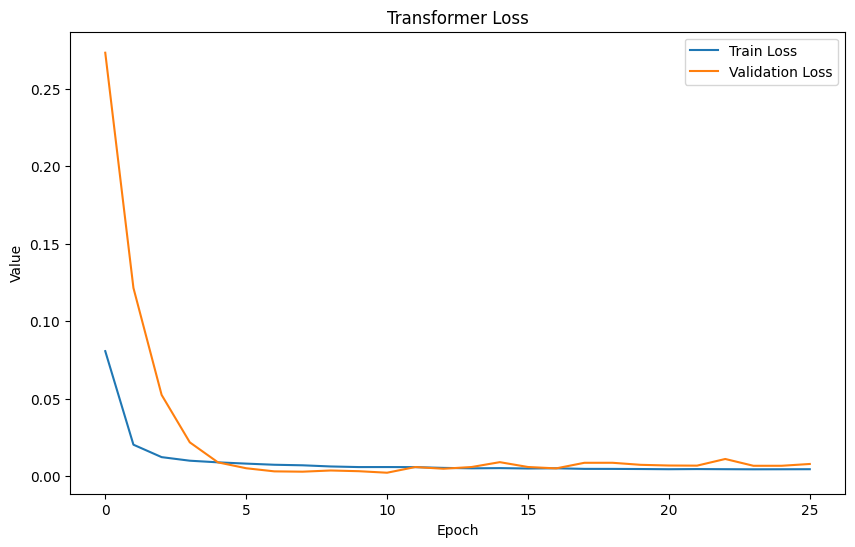

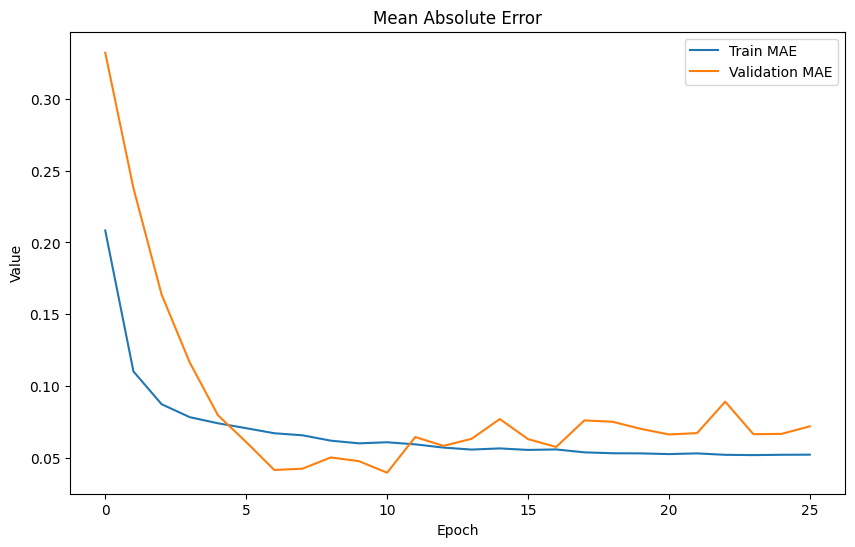

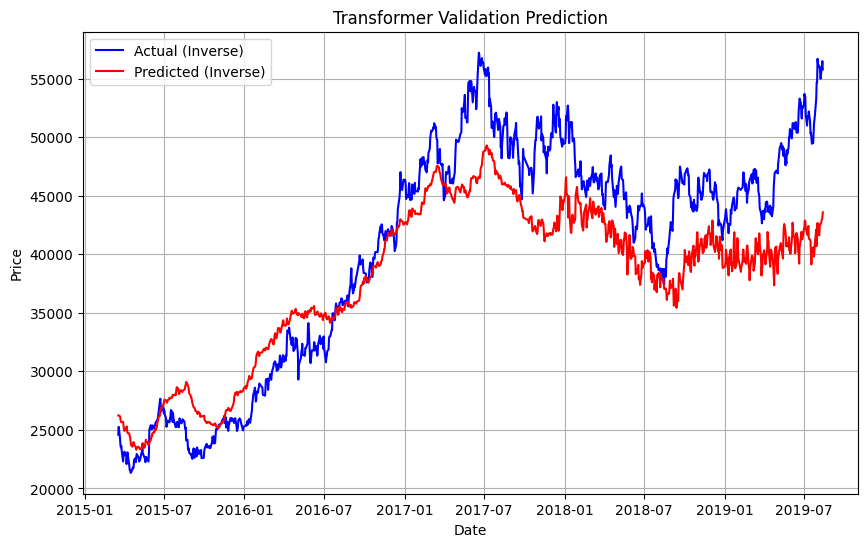

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step
Mean Absolute Error (MAE): 26214.019560185196
Root Mean Squared Error (RMSE): 27502.998452133088


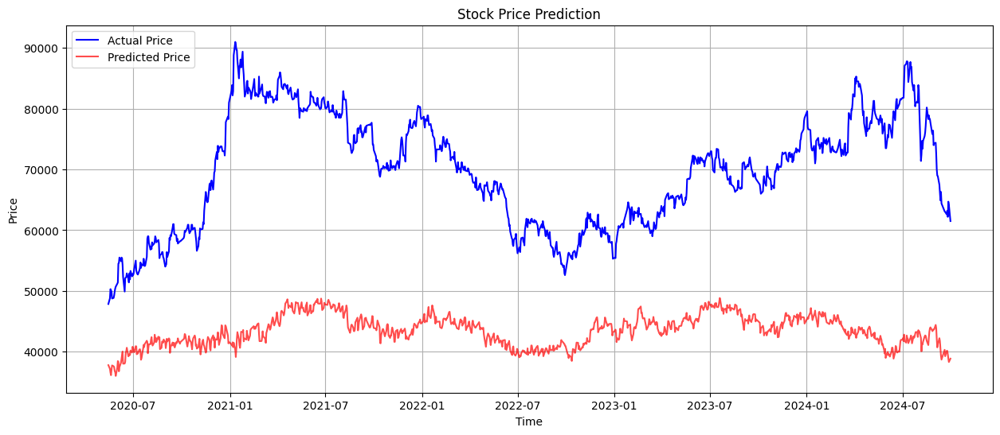

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###3

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.1, lr=0.00005,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 27s - 494ms/step - loss: 0.0665 - mae: 0.1926 - val_loss: 0.2094 - val_mae: 0.3285
Epoch 2/100
54/54 - 1s - 16ms/step - loss: 0.0165 - mae: 0.0999 - val_loss: 0.1879 - val_mae: 0.3178
Epoch 3/100
54/54 - 1s - 23ms/step - loss: 0.0114 - mae: 0.0826 - val_loss: 0.1399 - val_mae: 0.2741
Epoch 4/100
54/54 - 1s - 23ms/step - loss: 0.0092 - mae: 0.0746 - val_loss: 0.1093 - val_mae: 0.2434
Epoch 5/100
54/54 - 1s - 25ms/step - loss: 0.0077 - mae: 0.0689 - val_loss: 0.0864 - val_mae: 0.2173
Epoch 6/100
54/54 - 1s - 21ms/step - loss: 0.0070 - mae: 0.0661 - val_loss: 0.0637 - val_mae: 0.1884
Epoch 7/100
54/54 - 1s - 24ms/step - loss: 0.0069 - mae: 0.0652 - val_loss: 0.0560 - val_mae: 0.1782
Epoch 8/100
54/54 - 1s - 15ms/step - loss: 0.0066 - mae: 0.0634 - val_loss: 0.0436 - val_mae: 0.1591
Epoch 9/100
54/54 - 1s - 15ms/step - loss: 0.0064 - mae: 0.0625 - val_loss: 0.0350 - val_mae: 0.1442
Epoch 10/100
54/54 - 1s - 15ms/step - loss: 0.0058 - mae: 0.0601 - val_loss: 0.0285 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.0066228000184726495
Root Mean Squared Error (RMSE): 0.08138058747927941
Mean Absolute Error (MAE): 0.06808051258813336
R^2 Score: 0.48452243537693507

### After Inverse Transform
Mean Squared Error (MSE): 60497998.63007649
Root Mean Squared Error (RMSE): 7778.045939056705
Mean Absolute Error (MAE): 6335.856262263389
R^2 Score: 0.3850584354329626


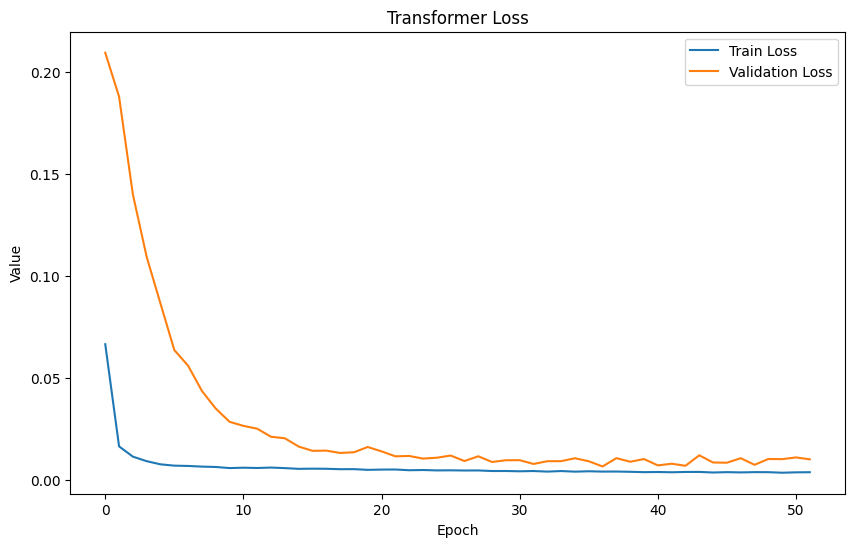

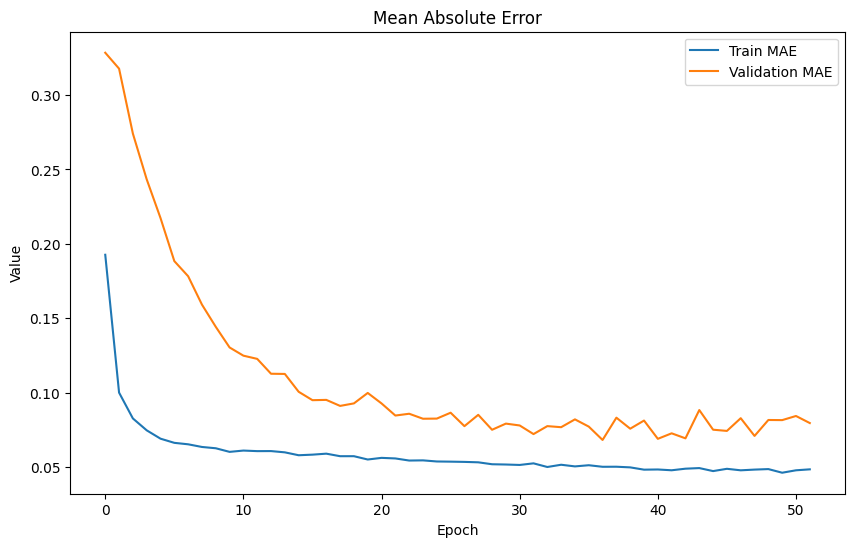

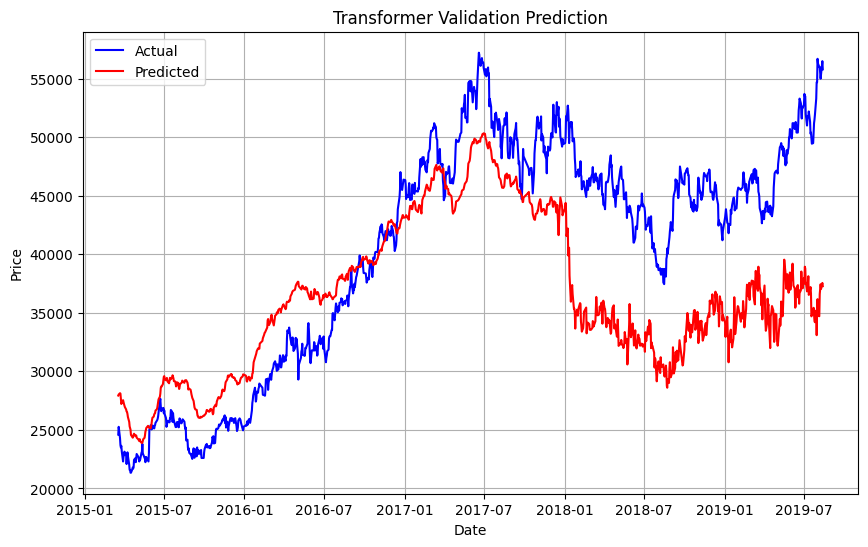

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step
Mean Absolute Error (MAE): 29724.93118127895
Root Mean Squared Error (RMSE): 31036.695376315198


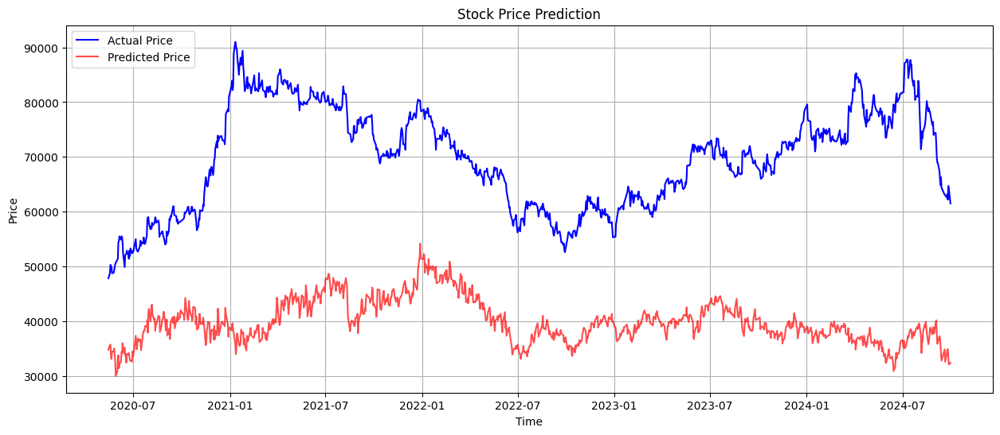

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###4

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=128, ff_dim=256, num_blocks=4, dropout_rate=0.2, lr=0.00005,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 37s - 691ms/step - loss: 0.8321 - mae: 0.6874 - val_loss: 0.1797 - val_mae: 0.3826
Epoch 2/100
54/54 - 17s - 316ms/step - loss: 0.1802 - mae: 0.3303 - val_loss: 0.0791 - val_mae: 0.2444
Epoch 3/100
54/54 - 1s - 22ms/step - loss: 0.0896 - mae: 0.2358 - val_loss: 0.0385 - val_mae: 0.1696
Epoch 4/100
54/54 - 1s - 20ms/step - loss: 0.0514 - mae: 0.1756 - val_loss: 0.0161 - val_mae: 0.1105
Epoch 5/100
54/54 - 1s - 20ms/step - loss: 0.0380 - mae: 0.1526 - val_loss: 0.0118 - val_mae: 0.0940
Epoch 6/100
54/54 - 1s - 20ms/step - loss: 0.0288 - mae: 0.1326 - val_loss: 0.0094 - val_mae: 0.0812
Epoch 7/100
54/54 - 1s - 20ms/step - loss: 0.0248 - mae: 0.1221 - val_loss: 0.0129 - val_mae: 0.0944
Epoch 8/100
54/54 - 1s - 23ms/step - loss: 0.0224 - mae: 0.1157 - val_loss: 0.0130 - val_mae: 0.0938
Epoch 9/100
54/54 - 1s - 23ms/step - loss: 0.0205 - mae: 0.1127 - val_loss: 0.0159 - val_mae: 0.1022
Epoch 10/100
54/54 - 1s - 20ms/step - loss: 0.0199 - mae: 0.1102 - val_loss: 0.0202 - v

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.009377472992837164
Root Mean Squared Error (RMSE): 0.0968373532932265
Mean Absolute Error (MAE): 0.08119136004240525
R^2 Score: 0.2701158230380849

### After Inverse Transform
Mean Squared Error (MSE): 73787418.65571897
Root Mean Squared Error (RMSE): 8589.960340753558
Mean Absolute Error (MAE): 7214.619324575831
R^2 Score: 0.24997600414912335


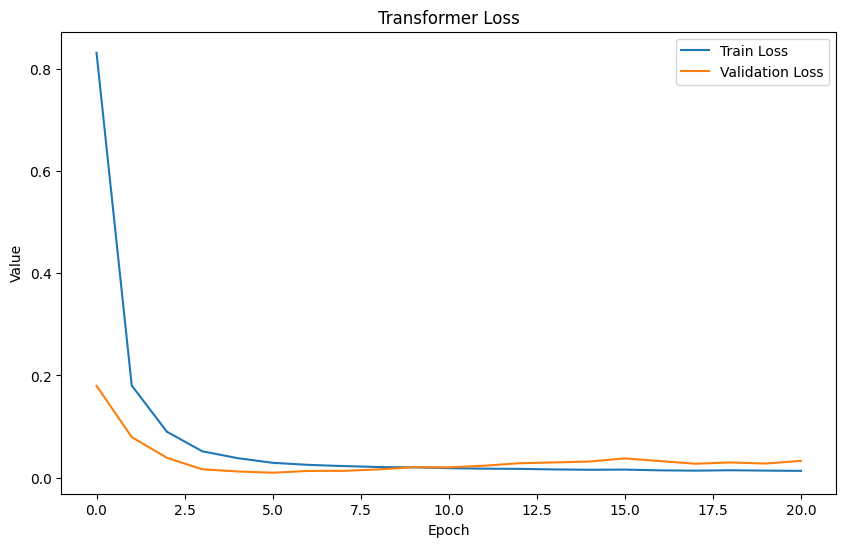

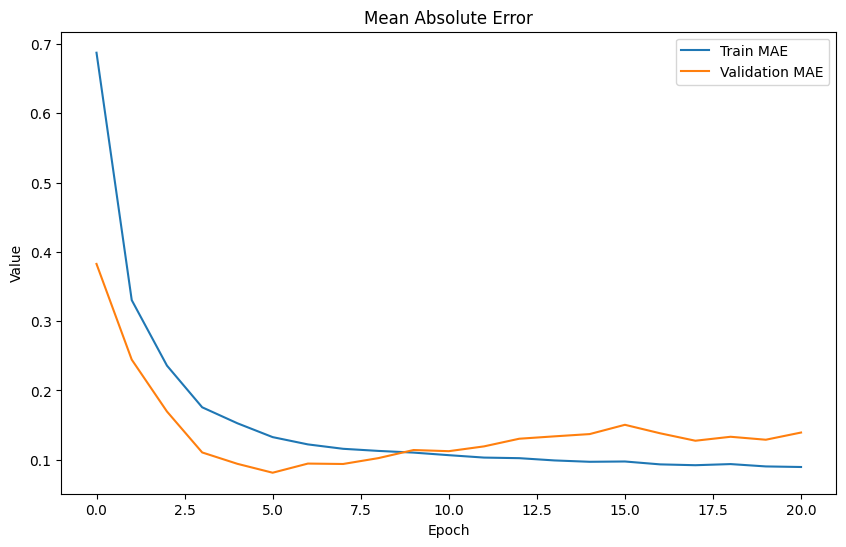

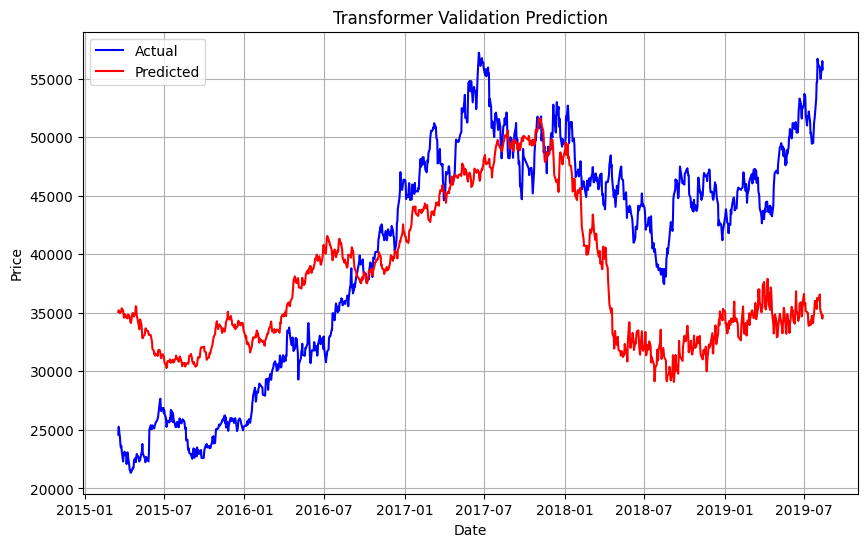

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step
Mean Absolute Error (MAE): 32619.57367983219
Root Mean Squared Error (RMSE): 34135.72066592685


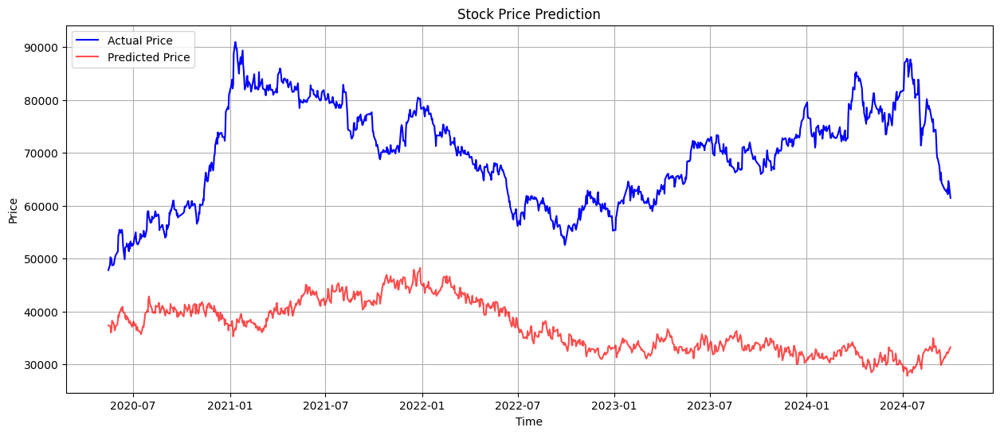

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###5

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=256, num_blocks=4, dropout_rate=0.2, lr=0.00005,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 34s - 622ms/step - loss: 0.1658 - mae: 0.3148 - val_loss: 0.4127 - val_mae: 0.5063
Epoch 2/100
54/54 - 20s - 377ms/step - loss: 0.0534 - mae: 0.1821 - val_loss: 0.1958 - val_mae: 0.3265
Epoch 3/100
54/54 - 2s - 46ms/step - loss: 0.0358 - mae: 0.1480 - val_loss: 0.1320 - val_mae: 0.2847
Epoch 4/100
54/54 - 1s - 24ms/step - loss: 0.0274 - mae: 0.1303 - val_loss: 0.0642 - val_mae: 0.1988
Epoch 5/100
54/54 - 1s - 24ms/step - loss: 0.0230 - mae: 0.1197 - val_loss: 0.0207 - val_mae: 0.1095
Epoch 6/100
54/54 - 3s - 48ms/step - loss: 0.0227 - mae: 0.1196 - val_loss: 0.0174 - val_mae: 0.1095
Epoch 7/100
54/54 - 1s - 25ms/step - loss: 0.0208 - mae: 0.1137 - val_loss: 0.0061 - val_mae: 0.0618
Epoch 8/100
54/54 - 2s - 28ms/step - loss: 0.0192 - mae: 0.1094 - val_loss: 0.0032 - val_mae: 0.0451
Epoch 9/100
54/54 - 1s - 27ms/step - loss: 0.0186 - mae: 0.1069 - val_loss: 0.0034 - val_mae: 0.0469
Epoch 10/100
54/54 - 1s - 26ms/step - loss: 0.0177 - mae: 0.1055 - val_loss: 0.0073 - v

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.0007425762140143866
Root Mean Squared Error (RMSE): 0.027250251632129685
Mean Absolute Error (MAE): 0.022128552035616793
R^2 Score: 0.942202485764408

### After Inverse Transform
Mean Squared Error (MSE): 6308999.885965624
Root Mean Squared Error (RMSE): 2511.772259972154
Mean Absolute Error (MAE): 2047.1237411992151
R^2 Score: 0.935871163533


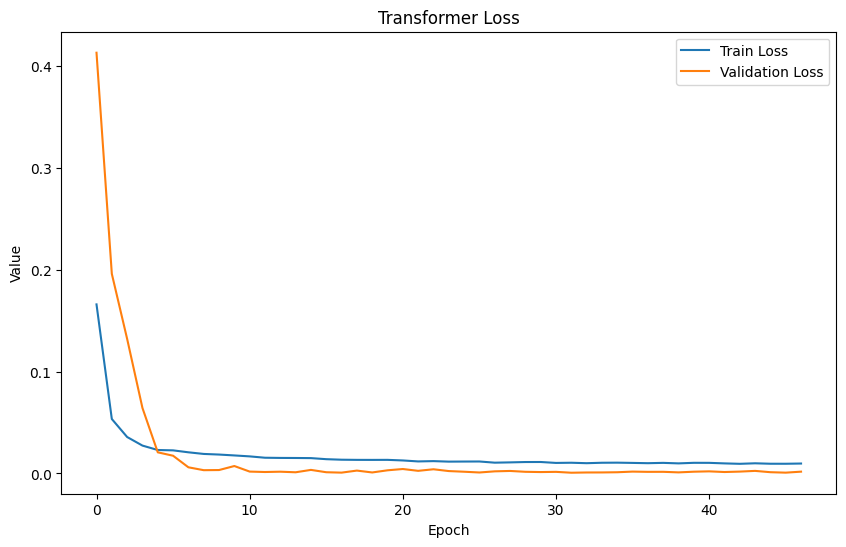

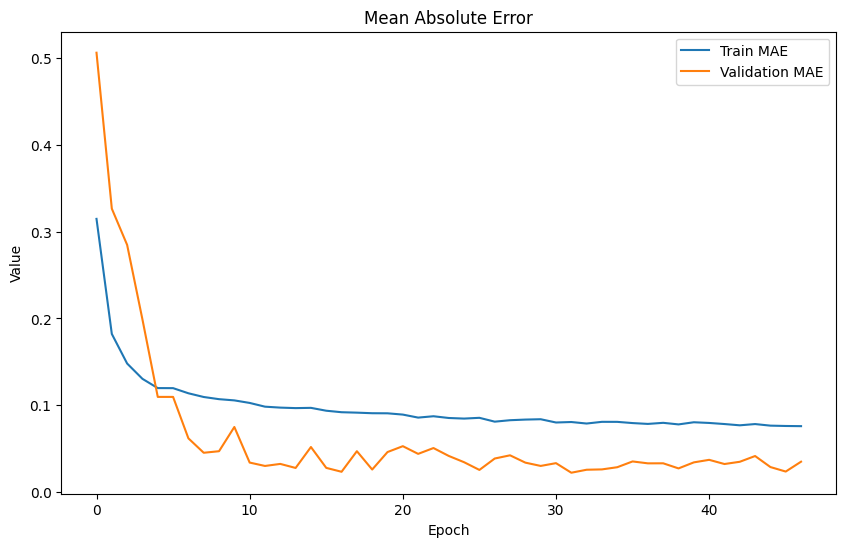

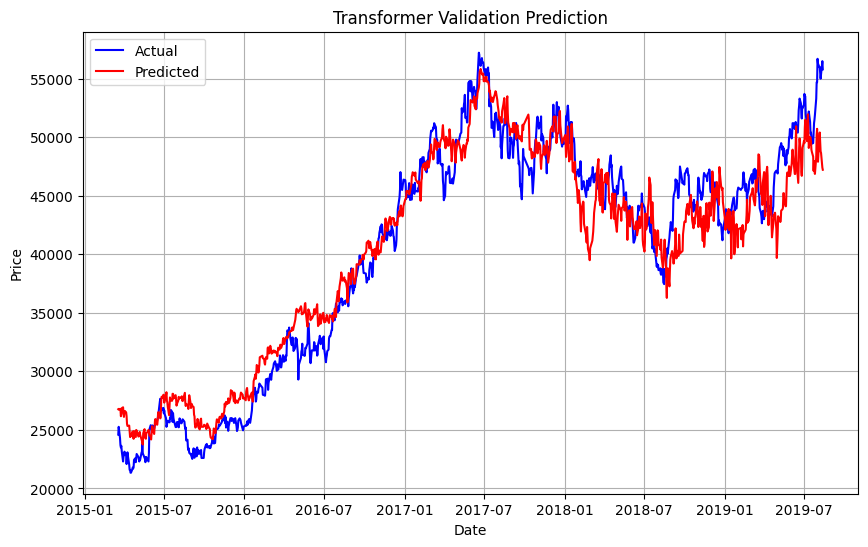

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Mean Absolute Error (MAE): 12837.002955005797
Root Mean Squared Error (RMSE): 14969.836213207791


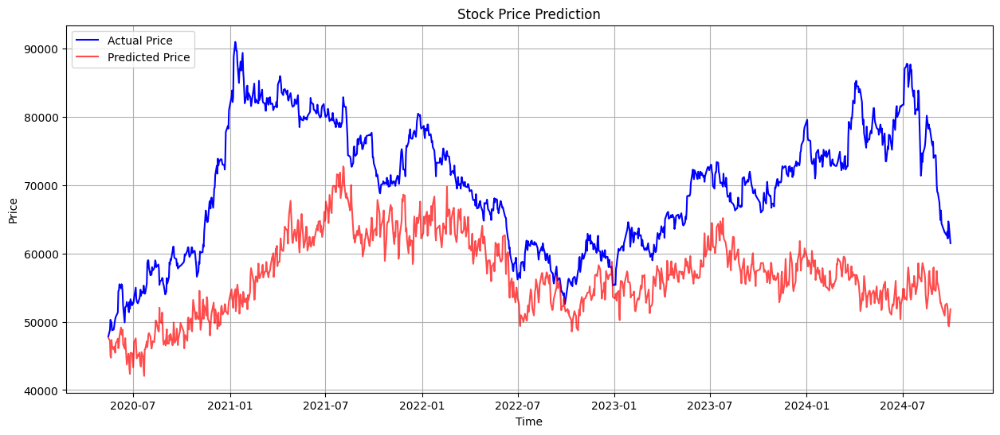

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###6 개구림

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=256, num_blocks=4, dropout_rate=0.3, lr=0.000001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 33s - 614ms/step - loss: 0.3450 - mae: 0.4774 - val_loss: 0.9426 - val_mae: 0.8653
Epoch 2/100
54/54 - 19s - 358ms/step - loss: 0.3178 - mae: 0.4600 - val_loss: 1.0157 - val_mae: 0.9053
Epoch 3/100
54/54 - 1s - 23ms/step - loss: 0.2849 - mae: 0.4314 - val_loss: 0.9983 - val_mae: 0.8940
Epoch 4/100
54/54 - 1s - 23ms/step - loss: 0.2732 - mae: 0.4216 - val_loss: 0.9972 - val_mae: 0.8919
Epoch 5/100
54/54 - 3s - 47ms/step - loss: 0.2513 - mae: 0.4034 - val_loss: 0.9600 - val_mae: 0.8691
Epoch 6/100
54/54 - 1s - 24ms/step - loss: 0.2184 - mae: 0.3755 - val_loss: 0.9273 - val_mae: 0.8485
Epoch 7/100
54/54 - 1s - 24ms/step - loss: 0.2086 - mae: 0.3668 - val_loss: 0.8835 - val_mae: 0.8208
Epoch 8/100
54/54 - 3s - 48ms/step - loss: 0.1975 - mae: 0.3561 - val_loss: 0.8660 - val_mae: 0.8084
Epoch 9/100
54/54 - 3s - 47ms/step - loss: 0.1905 - mae: 0.3507 - val_loss: 0.8407 - val_mae: 0.7912
Epoch 10/100
54/54 - 1s - 24ms/step - loss: 0.1711 - mae: 0.3297 - val_loss: 0.8155 - v

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.20225681031254275
Root Mean Squared Error (RMSE): 0.44972970806090046
Mean Absolute Error (MAE): 0.32829909083953696
R^2 Score: -14.74241223010429

### After Inverse Transform
Mean Squared Error (MSE): 612821502.5869511
Root Mean Squared Error (RMSE): 24755.231822524933
Mean Absolute Error (MAE): 19617.476499379616
R^2 Score: -5.229121989727978


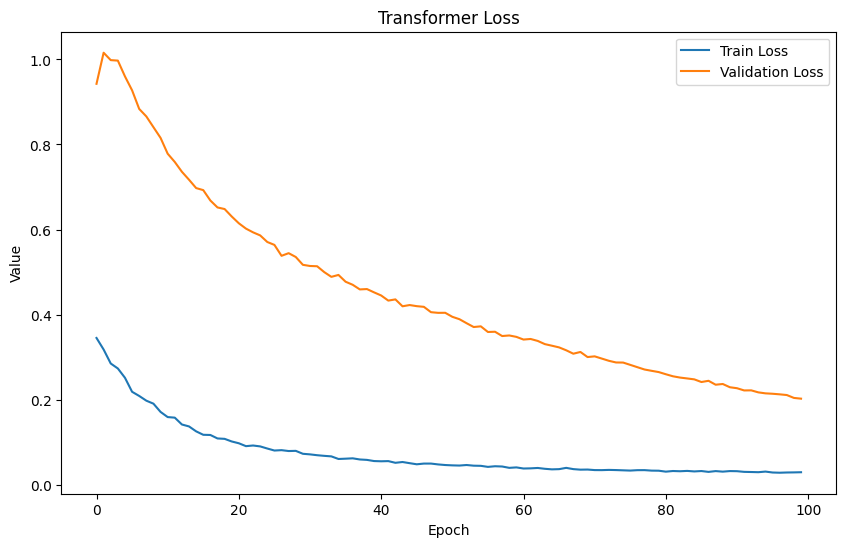

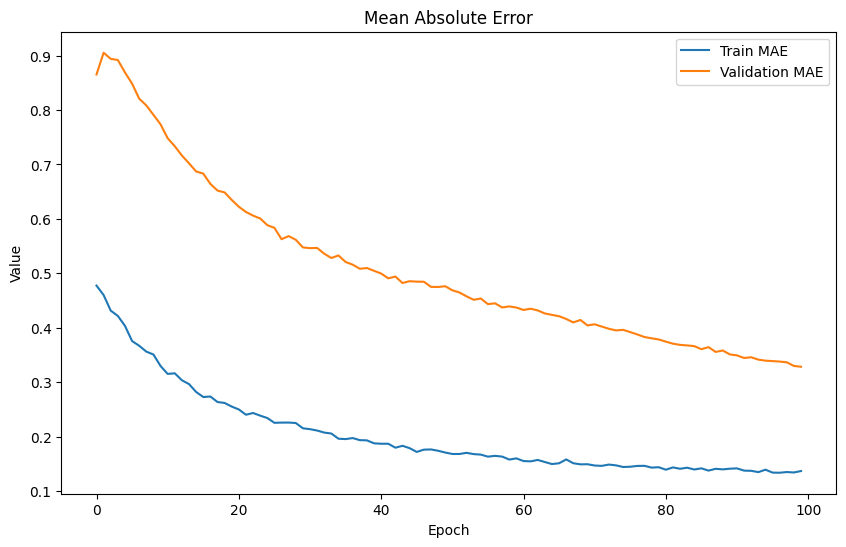

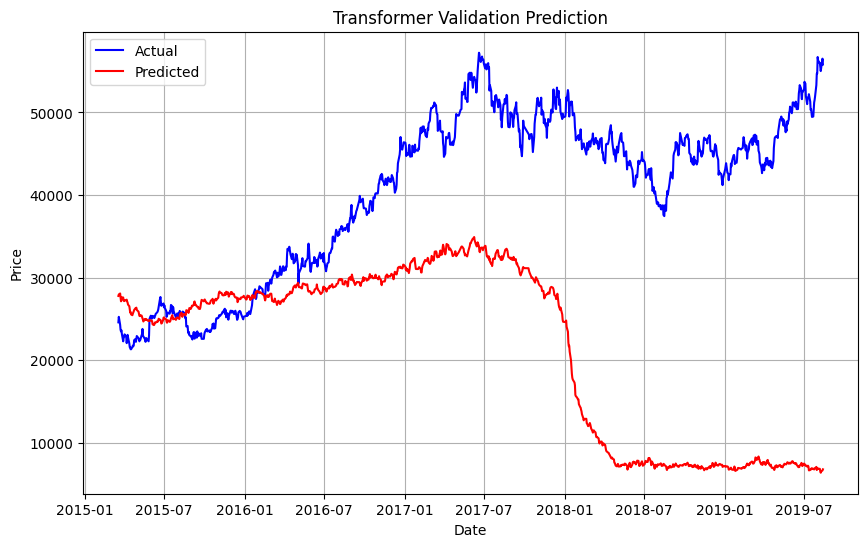

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step
Mean Absolute Error (MAE): 64594.63826587818
Root Mean Squared Error (RMSE): 65291.59116339688


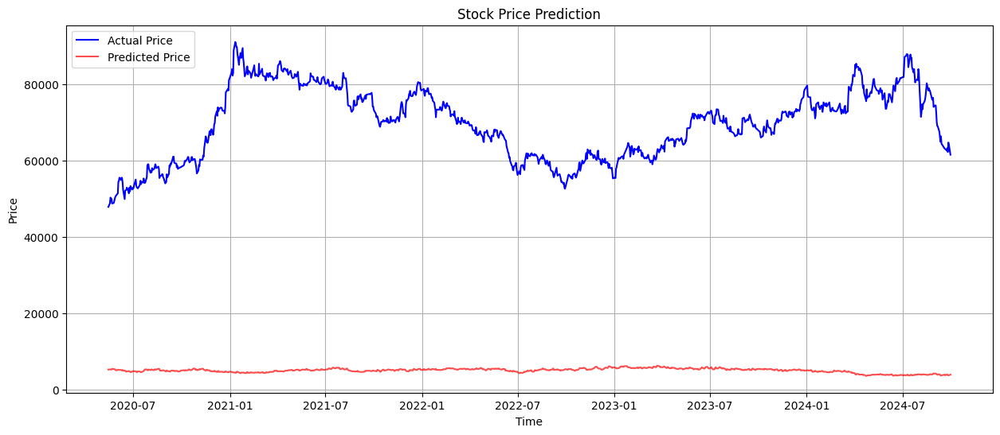

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###7

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=256, num_blocks=4, dropout_rate=0.3, lr=0.00001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 32s - 598ms/step - loss: 1.1782 - mae: 0.9247 - val_loss: 0.0454 - val_mae: 0.1928
Epoch 2/100
54/54 - 2s - 41ms/step - loss: 0.2836 - mae: 0.4268 - val_loss: 0.0243 - val_mae: 0.1256
Epoch 3/100
54/54 - 1s - 25ms/step - loss: 0.2070 - mae: 0.3655 - val_loss: 0.0173 - val_mae: 0.1041
Epoch 4/100
54/54 - 1s - 24ms/step - loss: 0.1562 - mae: 0.3171 - val_loss: 0.0134 - val_mae: 0.0920
Epoch 5/100
54/54 - 1s - 24ms/step - loss: 0.1086 - mae: 0.2652 - val_loss: 0.0134 - val_mae: 0.0919
Epoch 6/100
54/54 - 3s - 47ms/step - loss: 0.0919 - mae: 0.2444 - val_loss: 0.0109 - val_mae: 0.0888
Epoch 7/100
54/54 - 3s - 47ms/step - loss: 0.0703 - mae: 0.2107 - val_loss: 0.0113 - val_mae: 0.0917
Epoch 8/100
54/54 - 1s - 24ms/step - loss: 0.0631 - mae: 0.2002 - val_loss: 0.0112 - val_mae: 0.0911
Epoch 9/100
54/54 - 3s - 48ms/step - loss: 0.0571 - mae: 0.1900 - val_loss: 0.0115 - val_mae: 0.0908
Epoch 10/100
54/54 - 3s - 46ms/step - loss: 0.0498 - mae: 0.1770 - val_loss: 0.0116 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.006353876347528614
Root Mean Squared Error (RMSE): 0.0797112059093865
Mean Absolute Error (MAE): 0.07050330425091497
R^2 Score: 0.5054537814210657

### After Inverse Transform
Mean Squared Error (MSE): 52582084.210511185
Root Mean Squared Error (RMSE): 7251.350509423137
Mean Absolute Error (MAE): 6410.946071748038
R^2 Score: 0.46552101119371225


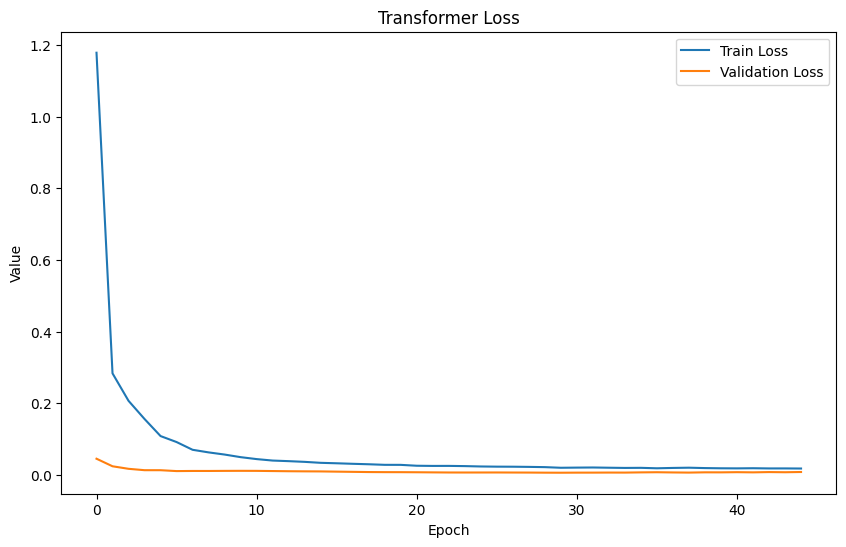

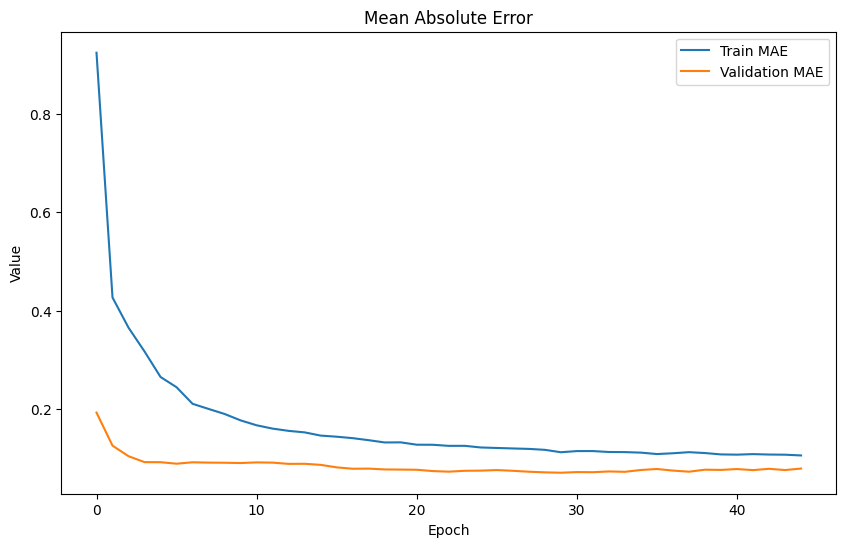

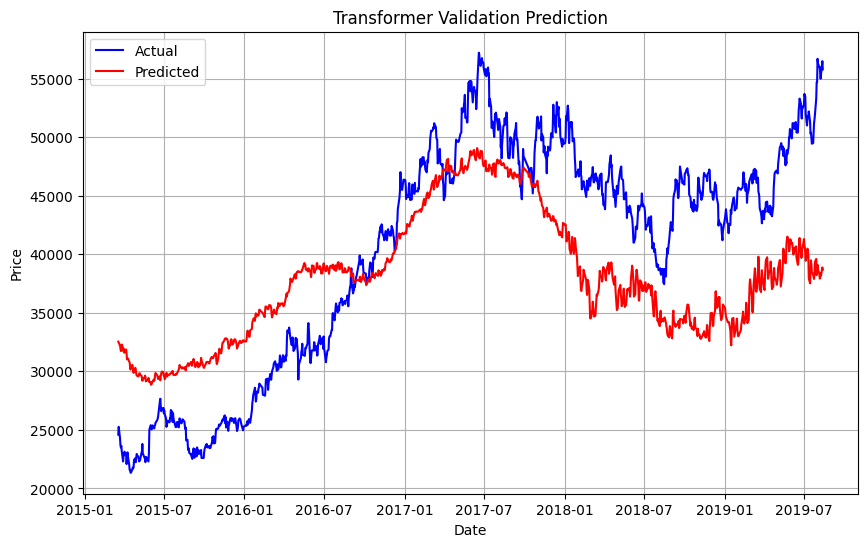

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step
Mean Absolute Error (MAE): 31447.521095558463
Root Mean Squared Error (RMSE): 33110.0930843948


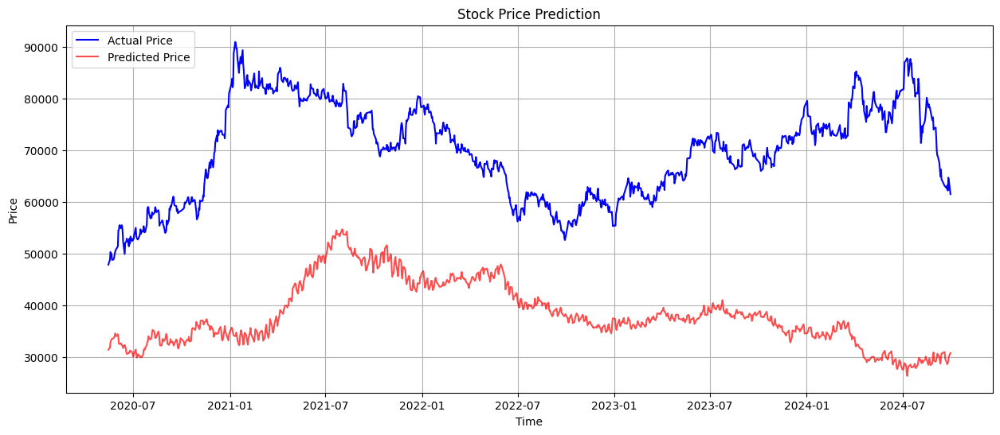

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###8

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=64, ff_dim=256, num_blocks=4, dropout_rate=0.3, lr=0.00001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 38s - 698ms/step - loss: 0.6160 - mae: 0.6301 - val_loss: 0.4263 - val_mae: 0.5194
Epoch 2/100
54/54 - 1s - 19ms/step - loss: 0.3515 - mae: 0.4706 - val_loss: 0.3217 - val_mae: 0.3804
Epoch 3/100
54/54 - 1s - 19ms/step - loss: 0.2600 - mae: 0.4067 - val_loss: 0.2866 - val_mae: 0.3679
Epoch 4/100
54/54 - 1s - 19ms/step - loss: 0.1783 - mae: 0.3344 - val_loss: 0.2764 - val_mae: 0.3963
Epoch 5/100
54/54 - 1s - 17ms/step - loss: 0.1407 - mae: 0.2971 - val_loss: 0.2802 - val_mae: 0.4191
Epoch 6/100
54/54 - 1s - 23ms/step - loss: 0.1135 - mae: 0.2671 - val_loss: 0.2800 - val_mae: 0.4182
Epoch 7/100
54/54 - 1s - 23ms/step - loss: 0.1015 - mae: 0.2509 - val_loss: 0.2710 - val_mae: 0.4156
Epoch 8/100
54/54 - 1s - 17ms/step - loss: 0.0890 - mae: 0.2354 - val_loss: 0.2732 - val_mae: 0.4094
Epoch 9/100
54/54 - 1s - 18ms/step - loss: 0.0727 - mae: 0.2108 - val_loss: 0.2647 - val_mae: 0.4034
Epoch 10/100
54/54 - 1s - 18ms/step - loss: 0.0722 - mae: 0.2109 - val_loss: 0.2547 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.020980716558776844
Root Mean Squared Error (RMSE): 0.14484721798770195
Mean Absolute Error (MAE): 0.12009112084707375
R^2 Score: -0.6330084927219768

### After Inverse Transform
Mean Squared Error (MSE): 153741414.7338204
Root Mean Squared Error (RMSE): 12399.25057145876
Mean Absolute Error (MAE): 10404.487628404893
R^2 Score: -0.5627291523023028


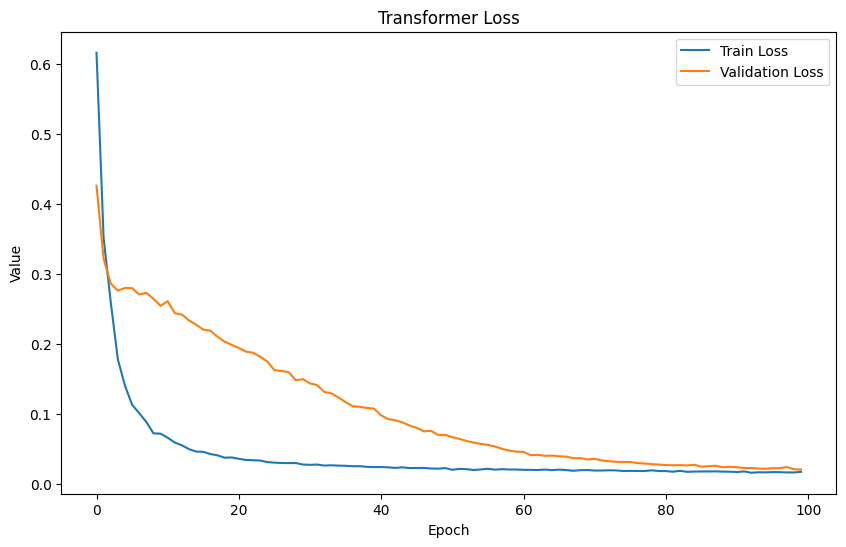

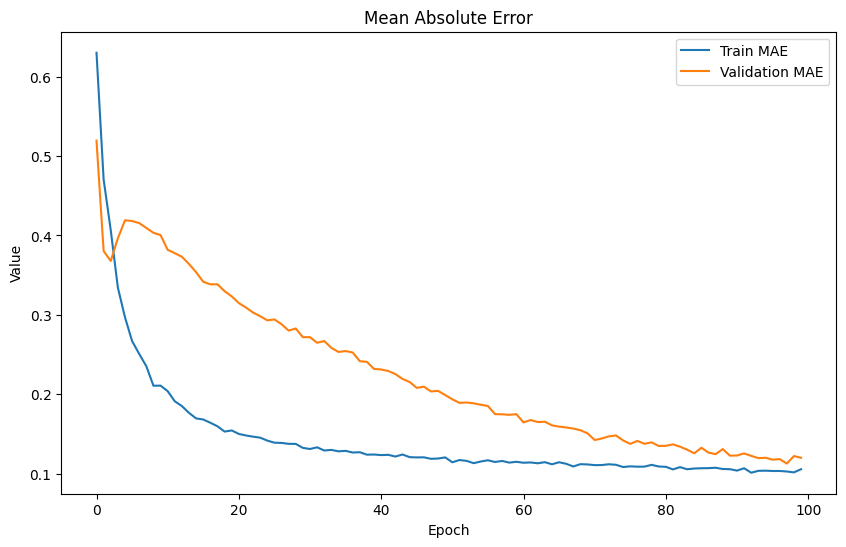

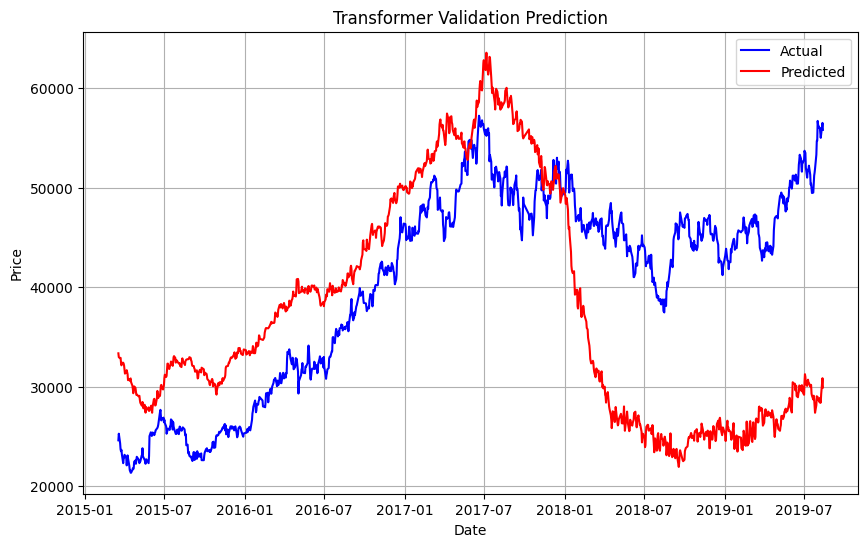

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
Mean Absolute Error (MAE): 38757.86201533566
Root Mean Squared Error (RMSE): 39684.70683416668


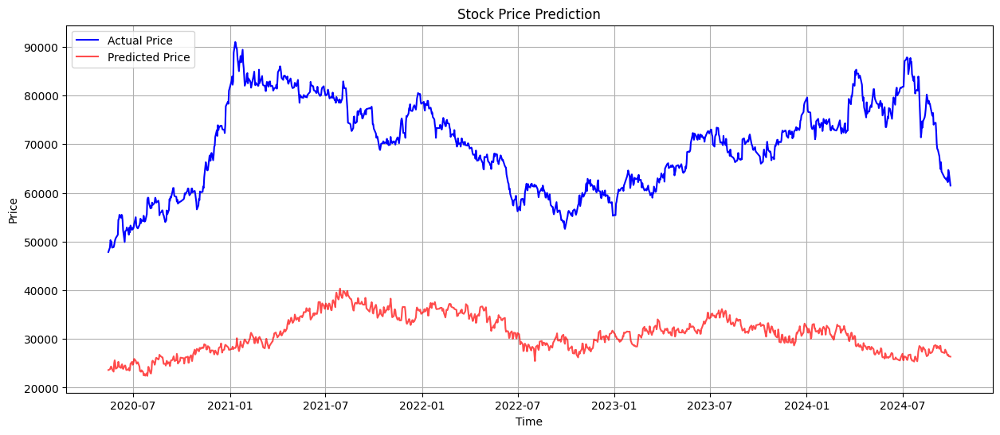

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###9

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=64, ff_dim=128, num_blocks=4, dropout_rate=0.1, lr=0.00001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 37s - 682ms/step - loss: 1.8219 - mae: 1.1993 - val_loss: 0.1505 - val_mae: 0.3032
Epoch 2/100
54/54 - 1s - 16ms/step - loss: 0.2592 - mae: 0.3956 - val_loss: 0.6243 - val_mae: 0.7464
Epoch 3/100
54/54 - 1s - 16ms/step - loss: 0.1975 - mae: 0.3401 - val_loss: 0.4982 - val_mae: 0.6637
Epoch 4/100
54/54 - 1s - 15ms/step - loss: 0.1885 - mae: 0.3351 - val_loss: 0.4245 - val_mae: 0.6111
Epoch 5/100
54/54 - 1s - 23ms/step - loss: 0.1676 - mae: 0.3175 - val_loss: 0.3967 - val_mae: 0.5917
Epoch 6/100
54/54 - 1s - 15ms/step - loss: 0.1511 - mae: 0.3031 - val_loss: 0.3532 - val_mae: 0.5569
Epoch 7/100
54/54 - 1s - 15ms/step - loss: 0.1368 - mae: 0.2908 - val_loss: 0.3335 - val_mae: 0.5416
Epoch 8/100
54/54 - 1s - 16ms/step - loss: 0.1257 - mae: 0.2755 - val_loss: 0.3089 - val_mae: 0.5202
Epoch 9/100
54/54 - 1s - 16ms/step - loss: 0.1080 - mae: 0.2581 - val_loss: 0.2973 - val_mae: 0.5107
Epoch 10/100
54/54 - 1s - 22ms/step - loss: 0.0965 - mae: 0.2435 - val_loss: 0.2745 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.15047923281012668
Root Mean Squared Error (RMSE): 0.3879165281476502
Mean Absolute Error (MAE): 0.3032183168100996
R^2 Score: -10.71236761474797

### After Inverse Transform
Mean Squared Error (MSE): 579453834.2442093
Root Mean Squared Error (RMSE): 24071.84733758939
Mean Absolute Error (MAE): 19906.490243843058
R^2 Score: -4.88995099826912


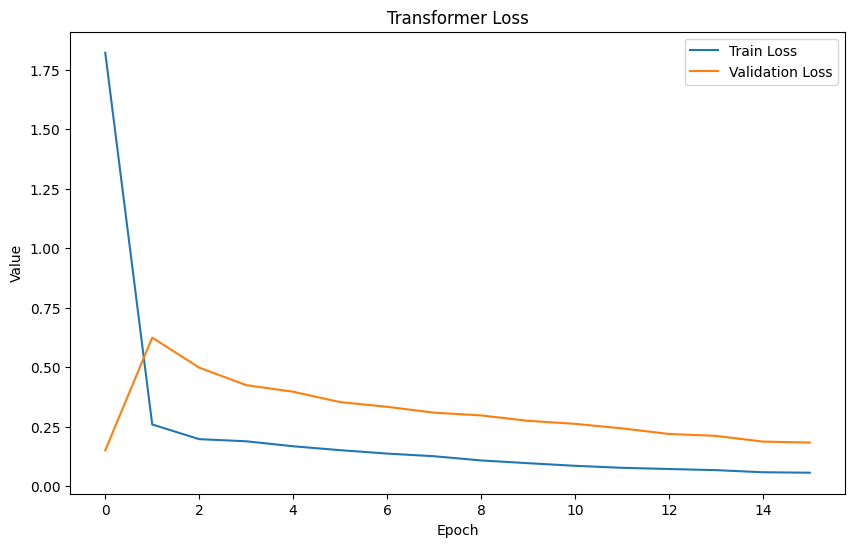

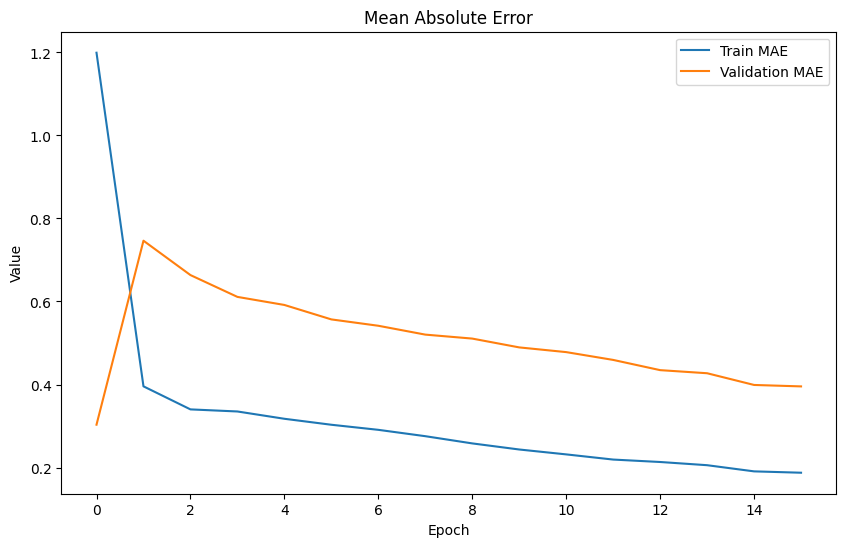

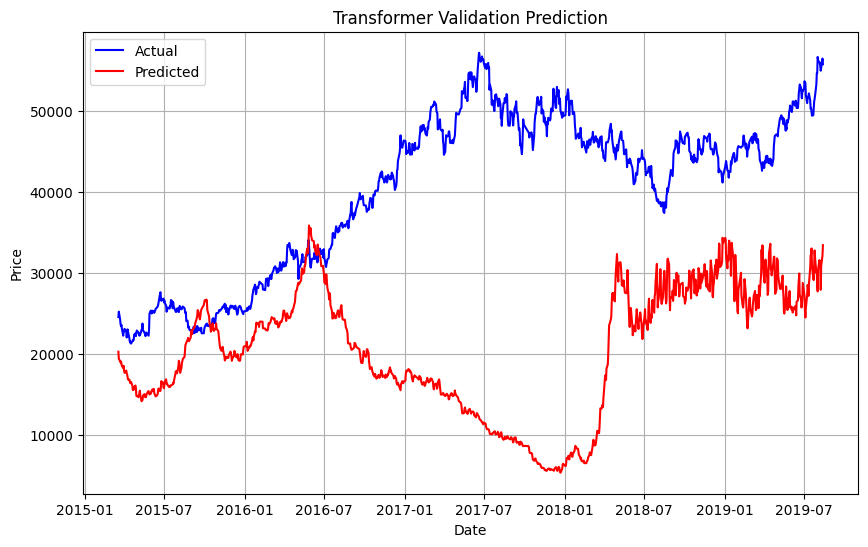

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step
Mean Absolute Error (MAE): 57886.04927368164
Root Mean Squared Error (RMSE): 59305.03379432623


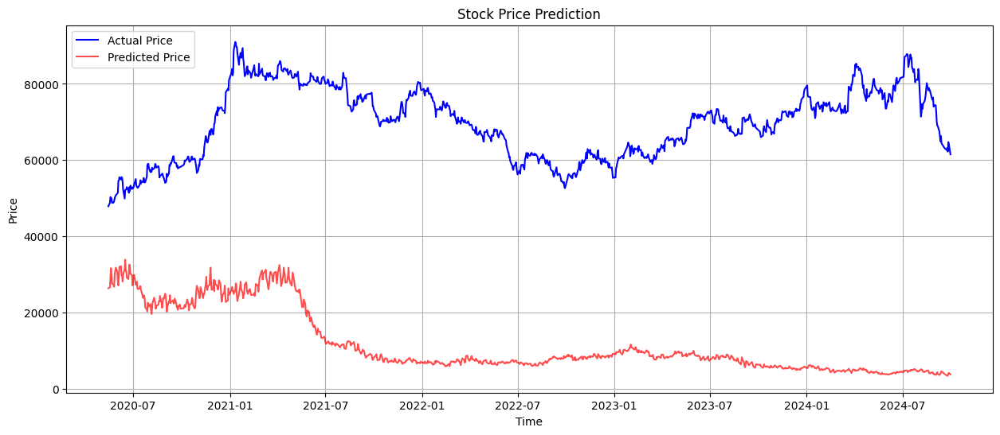

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###10

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=8, key_dim=128, ff_dim=264, num_blocks=4, dropout_rate=0.1, lr=0.00001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 39s - 730ms/step - loss: 0.1791 - mae: 0.3245 - val_loss: 0.0213 - val_mae: 0.1165
Epoch 2/100
54/54 - 17s - 310ms/step - loss: 0.0532 - mae: 0.1788 - val_loss: 0.0293 - val_mae: 0.1397
Epoch 3/100
54/54 - 2s - 46ms/step - loss: 0.0407 - mae: 0.1597 - val_loss: 0.0259 - val_mae: 0.1311
Epoch 4/100
54/54 - 3s - 49ms/step - loss: 0.0331 - mae: 0.1437 - val_loss: 0.0209 - val_mae: 0.1168
Epoch 5/100
54/54 - 2s - 46ms/step - loss: 0.0293 - mae: 0.1343 - val_loss: 0.0159 - val_mae: 0.1010
Epoch 6/100
54/54 - 3s - 48ms/step - loss: 0.0263 - mae: 0.1284 - val_loss: 0.0128 - val_mae: 0.0914
Epoch 7/100
54/54 - 3s - 48ms/step - loss: 0.0240 - mae: 0.1220 - val_loss: 0.0092 - val_mae: 0.0785
Epoch 8/100
54/54 - 5s - 93ms/step - loss: 0.0221 - mae: 0.1187 - val_loss: 0.0089 - val_mae: 0.0767
Epoch 9/100
54/54 - 2s - 44ms/step - loss: 0.0215 - mae: 0.1152 - val_loss: 0.0068 - val_mae: 0.0679
Epoch 10/100
54/54 - 2s - 44ms/step - loss: 0.0189 - mae: 0.1086 - val_loss: 0.0058 - v

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.003930040294023954
Root Mean Squared Error (RMSE): 0.06269003345049318
Mean Absolute Error (MAE): 0.052104488214056804
R^2 Score: 0.6941101053959979

### After Inverse Transform
Mean Squared Error (MSE): 41789657.77812526
Root Mean Squared Error (RMSE): 6464.492074256512
Mean Absolute Error (MAE): 5131.158358220799
R^2 Score: 0.5752223524957139


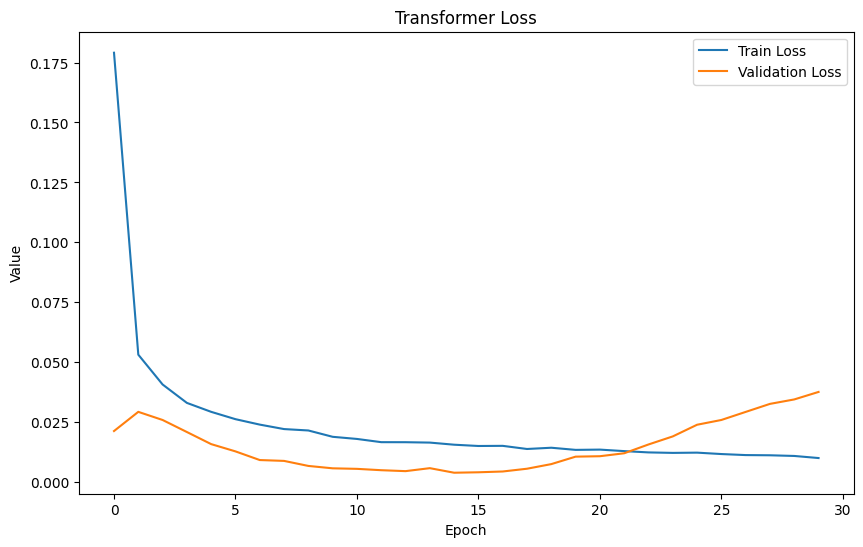

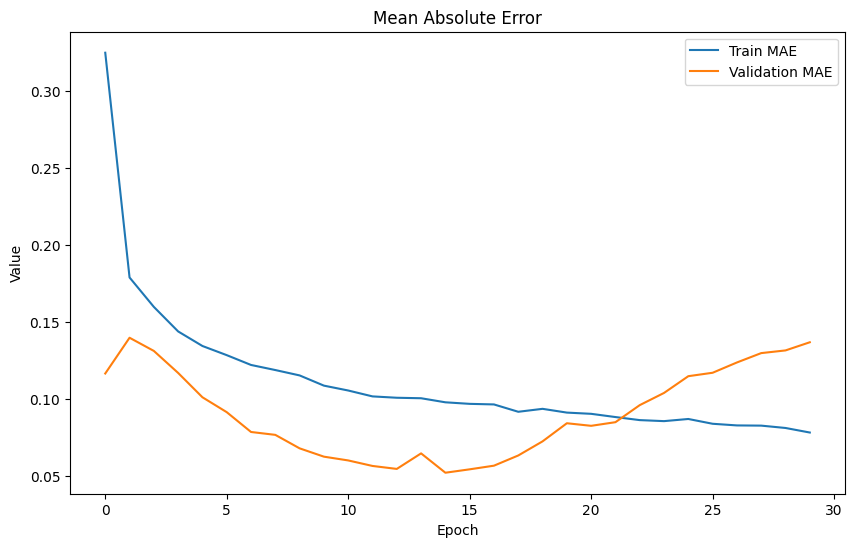

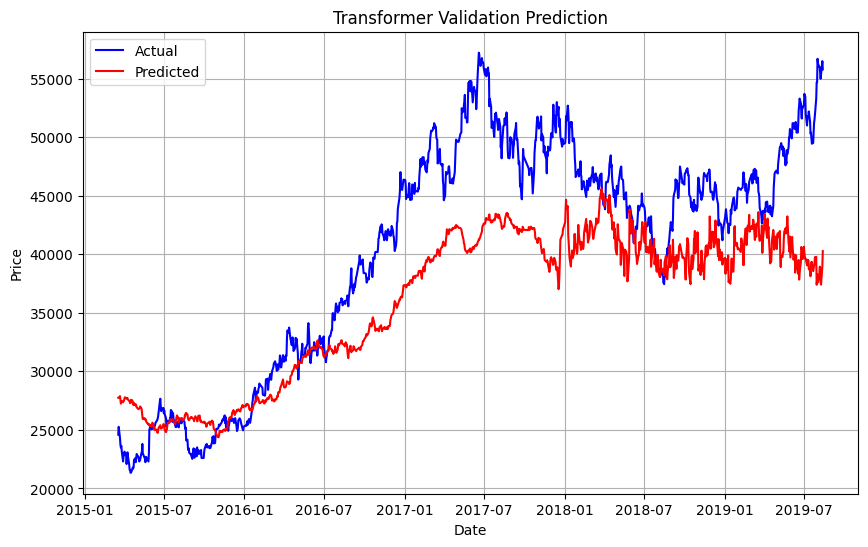

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step
Mean Absolute Error (MAE): 30426.786525245963
Root Mean Squared Error (RMSE): 32075.768072911487


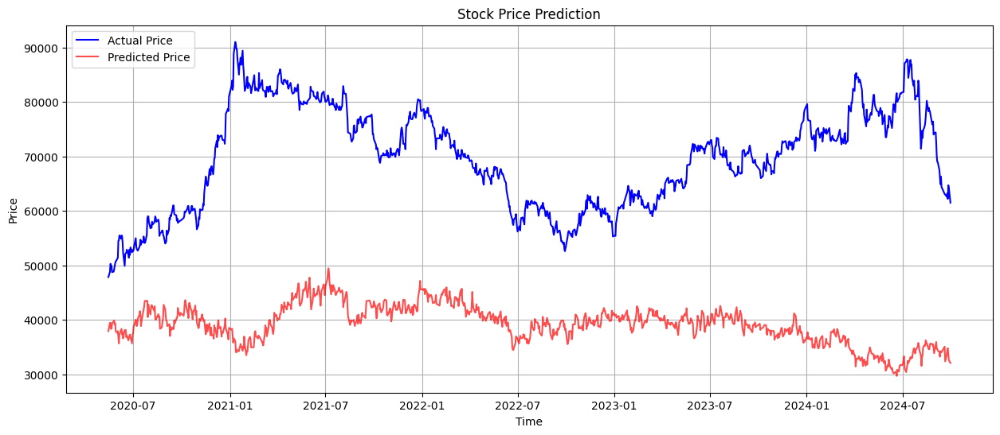

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###11

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=8, key_dim=128, ff_dim=264, num_blocks=8, dropout_rate=0.2, lr=0.00001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 69s - 1s/step - loss: 0.8080 - mae: 0.7004 - val_loss: 0.1254 - val_mae: 0.2552
Epoch 2/100
54/54 - 40s - 736ms/step - loss: 0.1453 - mae: 0.2993 - val_loss: 0.1091 - val_mae: 0.2300
Epoch 3/100
54/54 - 5s - 97ms/step - loss: 0.0938 - mae: 0.2409 - val_loss: 0.1329 - val_mae: 0.2489
Epoch 4/100
54/54 - 5s - 93ms/step - loss: 0.0759 - mae: 0.2166 - val_loss: 0.1365 - val_mae: 0.2556
Epoch 5/100
54/54 - 5s - 94ms/step - loss: 0.0572 - mae: 0.1882 - val_loss: 0.1377 - val_mae: 0.2600
Epoch 6/100
54/54 - 5s - 89ms/step - loss: 0.0479 - mae: 0.1741 - val_loss: 0.1399 - val_mae: 0.2623
Epoch 7/100
54/54 - 5s - 87ms/step - loss: 0.0394 - mae: 0.1561 - val_loss: 0.1301 - val_mae: 0.2545
Epoch 8/100
54/54 - 5s - 86ms/step - loss: 0.0335 - mae: 0.1439 - val_loss: 0.1346 - val_mae: 0.2579
Epoch 9/100
54/54 - 5s - 85ms/step - loss: 0.0309 - mae: 0.1394 - val_loss: 0.1270 - val_mae: 0.2516
Epoch 10/100
54/54 - 5s - 99ms/step - loss: 0.0297 - mae: 0.1351 - val_loss: 0.1272 - val_

34/34 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.010117827723720826
Root Mean Squared Error (RMSE): 0.10058741334640645
Mean Absolute Error (MAE): 0.08190063875673809
R^2 Score: 0.21249121523344106

### After Inverse Transform
Mean Squared Error (MSE): 83218745.23478235
Root Mean Squared Error (RMSE): 9122.430884078123
Mean Absolute Error (MAE): 7292.38690450427
R^2 Score: 0.1541097795830002


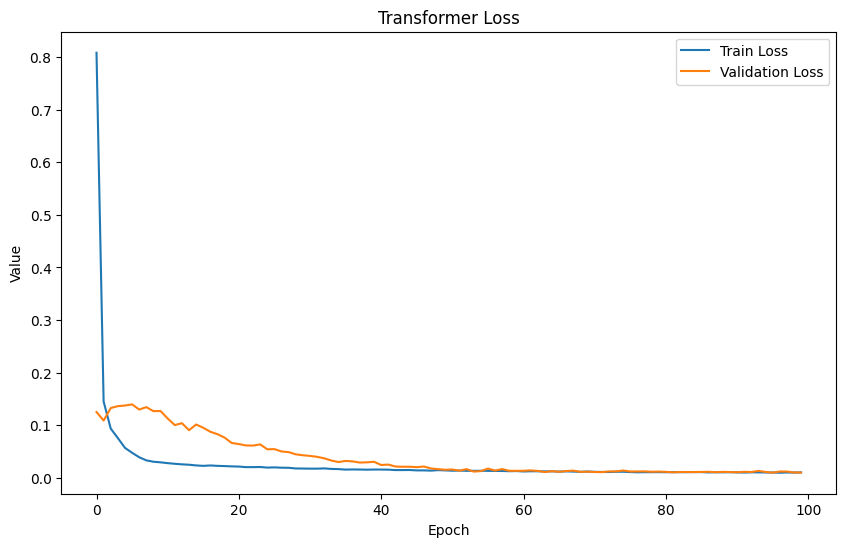

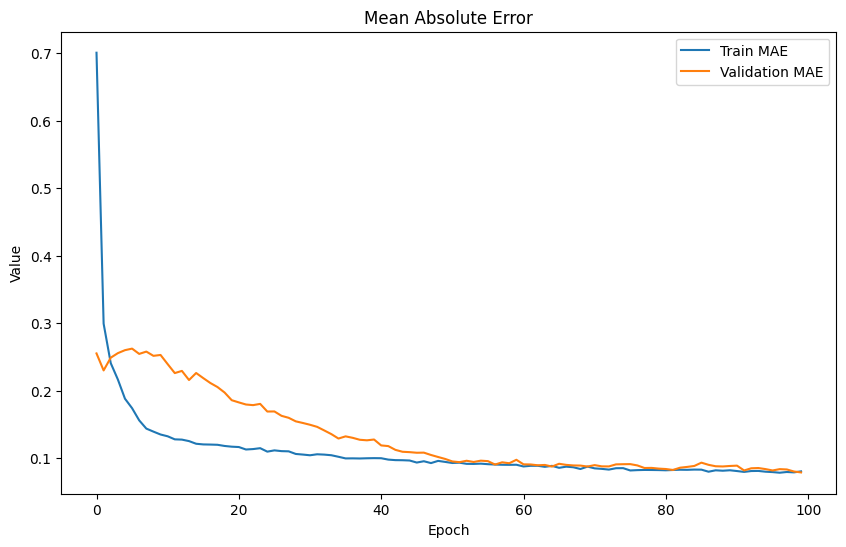

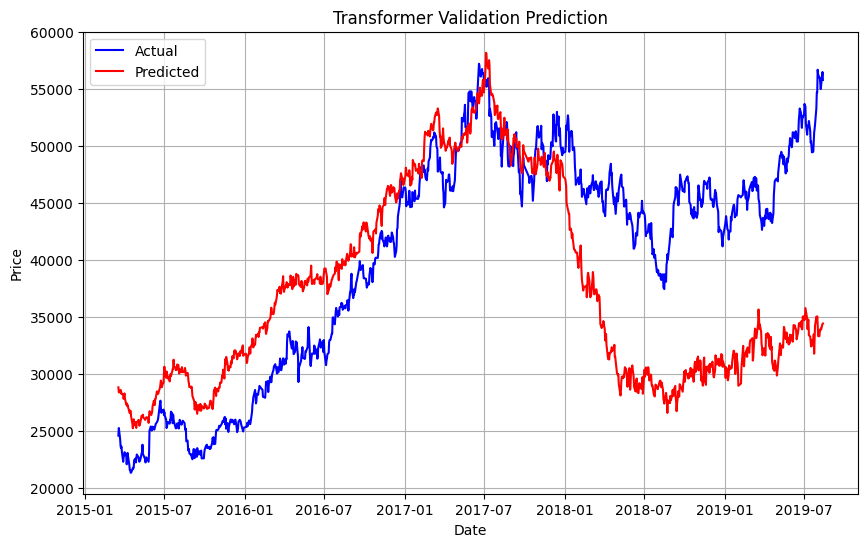

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step
Mean Absolute Error (MAE): 32882.00526620372
Root Mean Squared Error (RMSE): 33810.78650516298


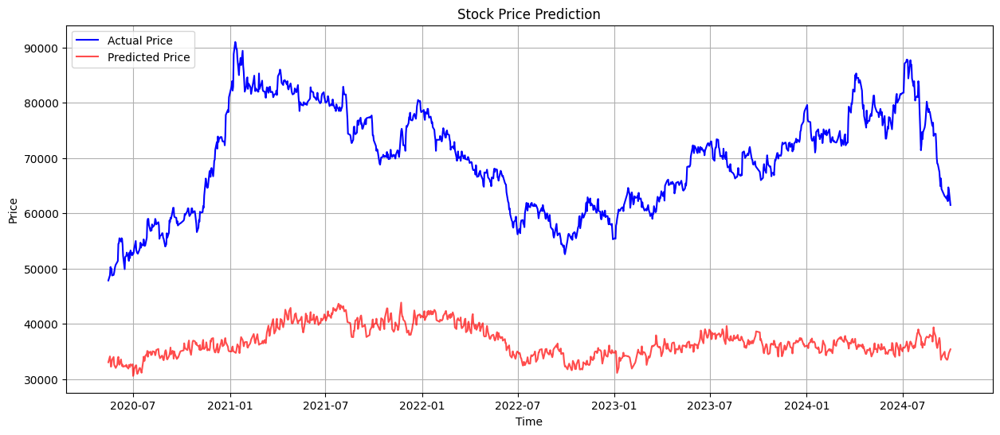

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###12

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=264, num_blocks=8, dropout_rate=0.3, lr=0.00001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 67s - 1s/step - loss: 0.2024 - mae: 0.3492 - val_loss: 0.2427 - val_mae: 0.3556
Epoch 2/100
54/54 - 39s - 713ms/step - loss: 0.0867 - mae: 0.2332 - val_loss: 0.2324 - val_mae: 0.3219
Epoch 3/100
54/54 - 3s - 51ms/step - loss: 0.0641 - mae: 0.2004 - val_loss: 0.2071 - val_mae: 0.3002
Epoch 4/100
54/54 - 3s - 49ms/step - loss: 0.0604 - mae: 0.1942 - val_loss: 0.1692 - val_mae: 0.2873
Epoch 5/100
54/54 - 5s - 95ms/step - loss: 0.0540 - mae: 0.1855 - val_loss: 0.1094 - val_mae: 0.2244
Epoch 6/100
54/54 - 3s - 48ms/step - loss: 0.0466 - mae: 0.1721 - val_loss: 0.0901 - val_mae: 0.2249
Epoch 7/100
54/54 - 5s - 98ms/step - loss: 0.0420 - mae: 0.1632 - val_loss: 0.0811 - val_mae: 0.2397
Epoch 8/100
54/54 - 5s - 92ms/step - loss: 0.0407 - mae: 0.1604 - val_loss: 0.0387 - val_mae: 0.1582
Epoch 9/100
54/54 - 5s - 97ms/step - loss: 0.0361 - mae: 0.1495 - val_loss: 0.0238 - val_mae: 0.1316
Epoch 10/100
54/54 - 3s - 49ms/step - loss: 0.0331 - mae: 0.1452 - val_loss: 0.0234 - val_

34/34 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.008546726503115522
Root Mean Squared Error (RMSE): 0.0924485073060432
Mean Absolute Error (MAE): 0.07939610758550135
R^2 Score: 0.33477596318219727

### After Inverse Transform
Mean Squared Error (MSE): 73702892.52074099
Root Mean Squared Error (RMSE): 8585.038877066369
Mean Absolute Error (MAE): 7639.310916580102
R^2 Score: 0.250835183541288


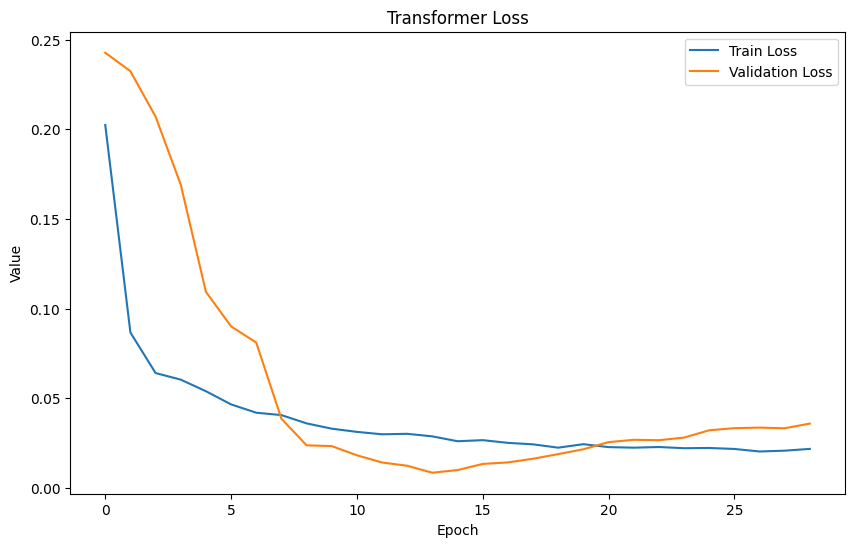

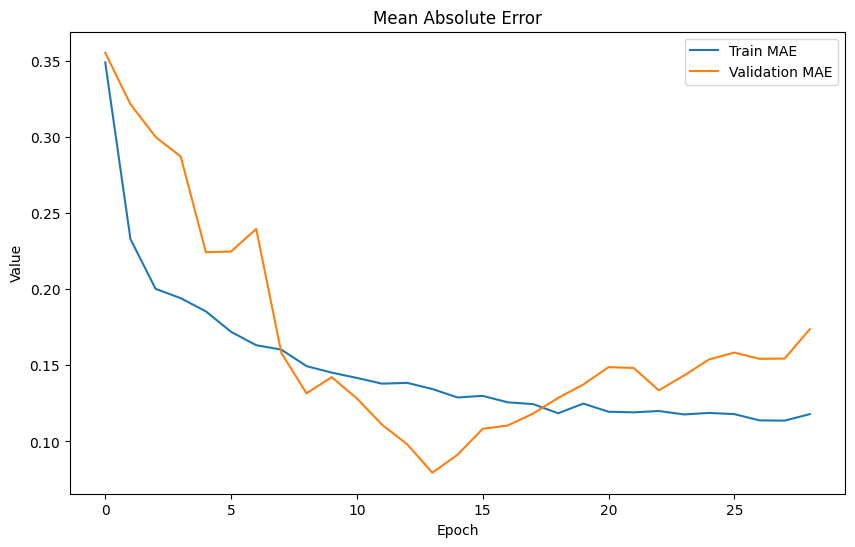

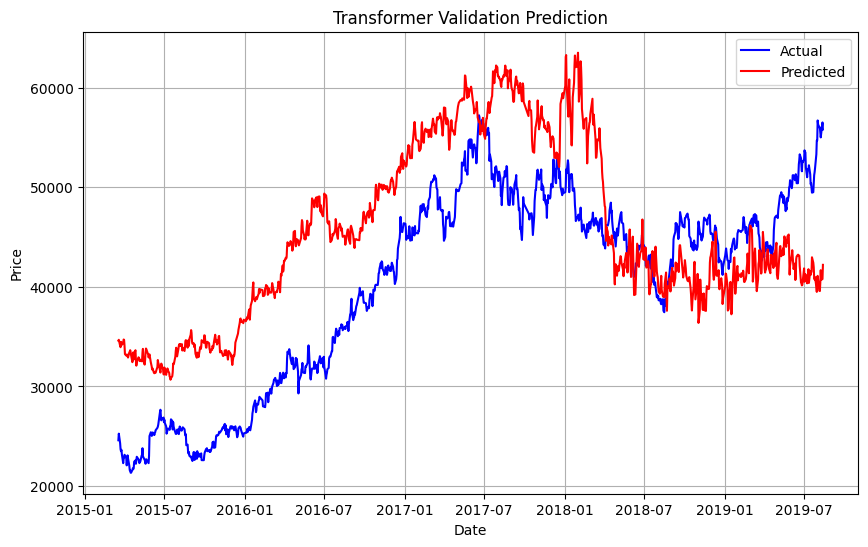

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step
Mean Absolute Error (MAE): 25096.071788194455
Root Mean Squared Error (RMSE): 27159.698454786452


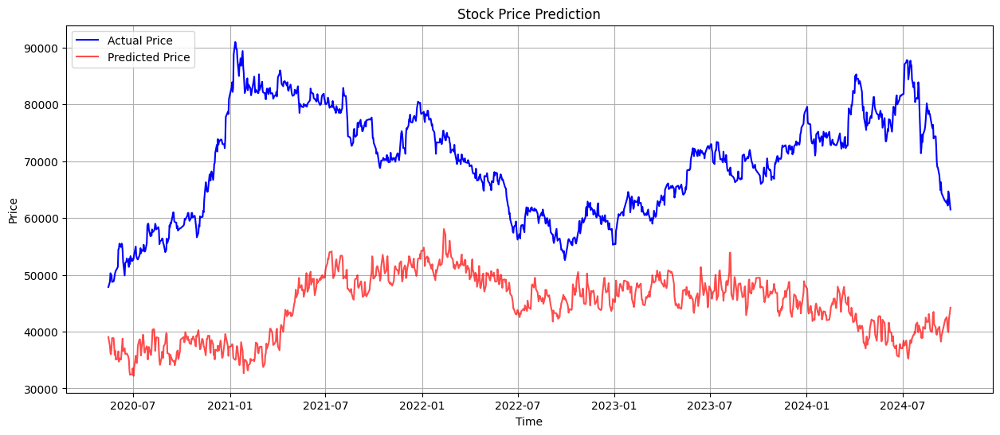

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###13 그나마3

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=264, num_blocks=6, dropout_rate=0.2, lr=0.00001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 53s - 977ms/step - loss: 0.3371 - mae: 0.4594 - val_loss: 0.1978 - val_mae: 0.4048
Epoch 2/100
54/54 - 8s - 153ms/step - loss: 0.1887 - mae: 0.3464 - val_loss: 0.2097 - val_mae: 0.3272
Epoch 3/100
54/54 - 3s - 50ms/step - loss: 0.1258 - mae: 0.2824 - val_loss: 0.1997 - val_mae: 0.3178
Epoch 4/100
54/54 - 2s - 39ms/step - loss: 0.0894 - mae: 0.2374 - val_loss: 0.1857 - val_mae: 0.3100
Epoch 5/100
54/54 - 2s - 45ms/step - loss: 0.0632 - mae: 0.2004 - val_loss: 0.1632 - val_mae: 0.2949
Epoch 6/100
54/54 - 3s - 48ms/step - loss: 0.0465 - mae: 0.1710 - val_loss: 0.1416 - val_mae: 0.2754
Epoch 7/100
54/54 - 3s - 47ms/step - loss: 0.0386 - mae: 0.1569 - val_loss: 0.1195 - val_mae: 0.2575
Epoch 8/100
54/54 - 2s - 37ms/step - loss: 0.0340 - mae: 0.1448 - val_loss: 0.1010 - val_mae: 0.2397
Epoch 9/100
54/54 - 2s - 40ms/step - loss: 0.0298 - mae: 0.1370 - val_loss: 0.0985 - val_mae: 0.2240
Epoch 10/100
54/54 - 2s - 45ms/step - loss: 0.0269 - mae: 0.1301 - val_loss: 0.0899 - va

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.0018435700085245453
Root Mean Squared Error (RMSE): 0.042936814140368464
Mean Absolute Error (MAE): 0.03501440058245912
R^2 Score: 0.8565079761497134

### After Inverse Transform
Mean Squared Error (MSE): 22169683.836769618
Root Mean Squared Error (RMSE): 4708.46937303086
Mean Absolute Error (MAE): 3635.318671370037
R^2 Score: 0.7746527096226615


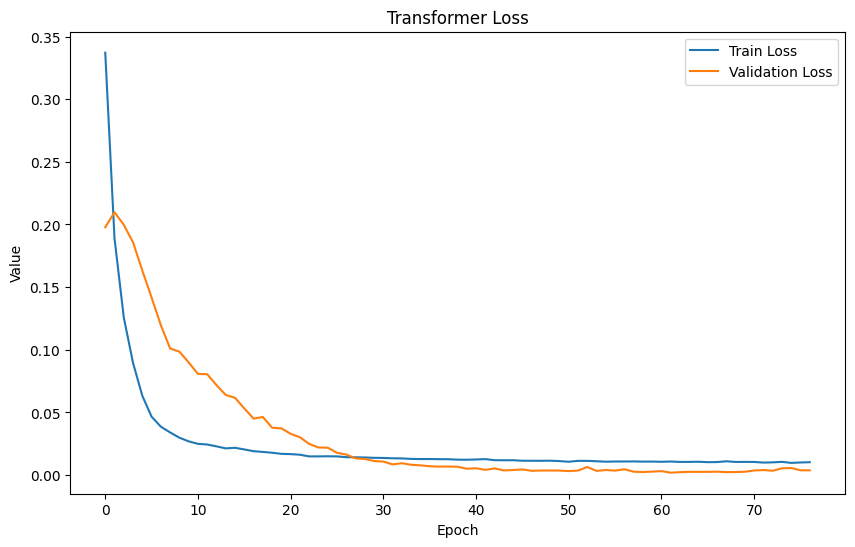

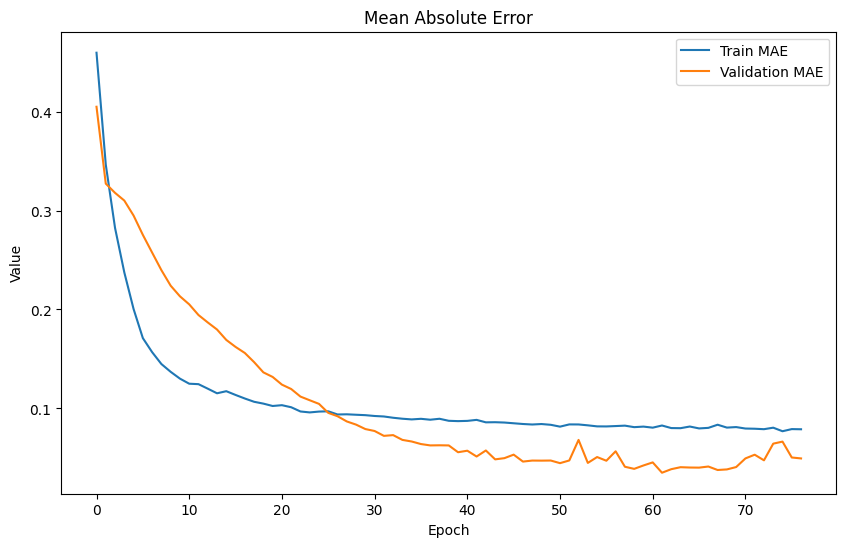

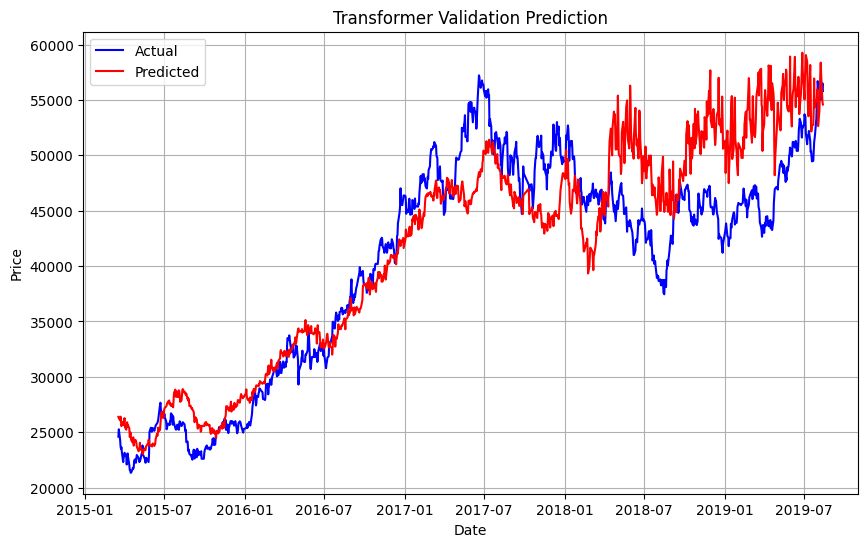

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step
Mean Absolute Error (MAE): 9051.992834924778
Root Mean Squared Error (RMSE): 12730.915038628222


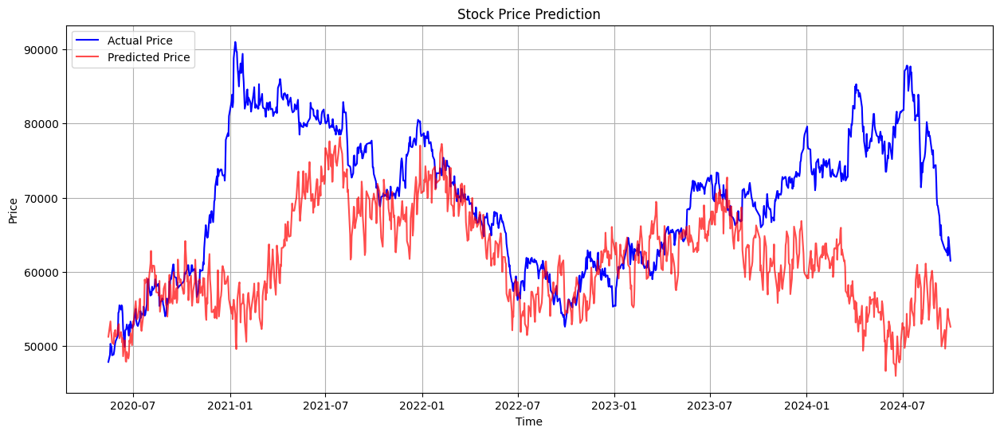

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###14 그나마2

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=264, num_blocks=5, dropout_rate=0.2, lr=0.00001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 44s - 821ms/step - loss: 0.4661 - mae: 0.5351 - val_loss: 0.2220 - val_mae: 0.4449
Epoch 2/100
54/54 - 2s - 32ms/step - loss: 0.1823 - mae: 0.3328 - val_loss: 0.1280 - val_mae: 0.2705
Epoch 3/100
54/54 - 2s - 45ms/step - loss: 0.0847 - mae: 0.2267 - val_loss: 0.1530 - val_mae: 0.2635
Epoch 4/100
54/54 - 3s - 47ms/step - loss: 0.0623 - mae: 0.1999 - val_loss: 0.1401 - val_mae: 0.2558
Epoch 5/100
54/54 - 3s - 48ms/step - loss: 0.0492 - mae: 0.1768 - val_loss: 0.1278 - val_mae: 0.2484
Epoch 6/100
54/54 - 3s - 50ms/step - loss: 0.0443 - mae: 0.1662 - val_loss: 0.1225 - val_mae: 0.2562
Epoch 7/100
54/54 - 2s - 33ms/step - loss: 0.0410 - mae: 0.1607 - val_loss: 0.0911 - val_mae: 0.2102
Epoch 8/100
54/54 - 2s - 32ms/step - loss: 0.0372 - mae: 0.1519 - val_loss: 0.0766 - val_mae: 0.1962
Epoch 9/100
54/54 - 2s - 46ms/step - loss: 0.0343 - mae: 0.1465 - val_loss: 0.0696 - val_mae: 0.1941
Epoch 10/100
54/54 - 2s - 31ms/step - loss: 0.0315 - mae: 0.1403 - val_loss: 0.0567 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.004061595761260507
Root Mean Squared Error (RMSE): 0.0637306500928753
Mean Absolute Error (MAE): 0.05487050646447693
R^2 Score: 0.6838706460019655

### After Inverse Transform
Mean Squared Error (MSE): 34825940.631451055
Root Mean Squared Error (RMSE): 5901.350746350454
Mean Absolute Error (MAE): 5140.617425554016
R^2 Score: 0.6460061670738249


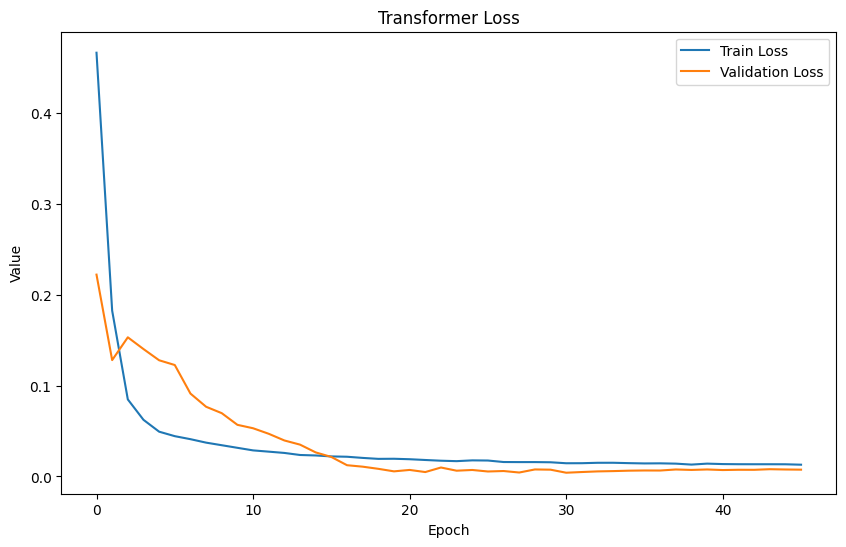

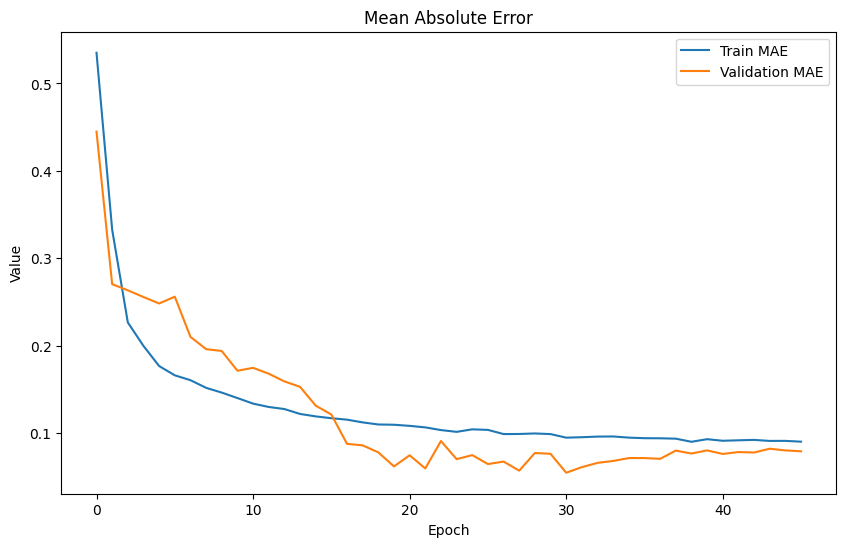

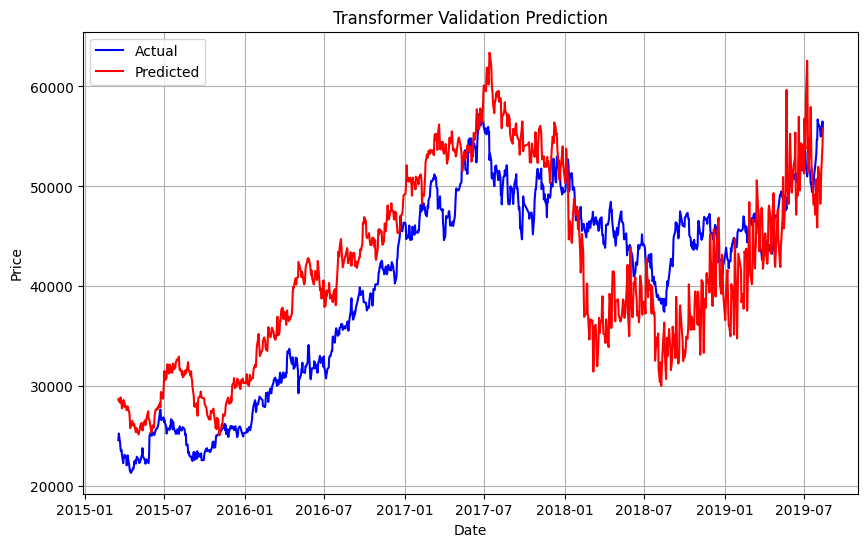

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step
Mean Absolute Error (MAE): 22099.040245225704
Root Mean Squared Error (RMSE): 24750.28687022314


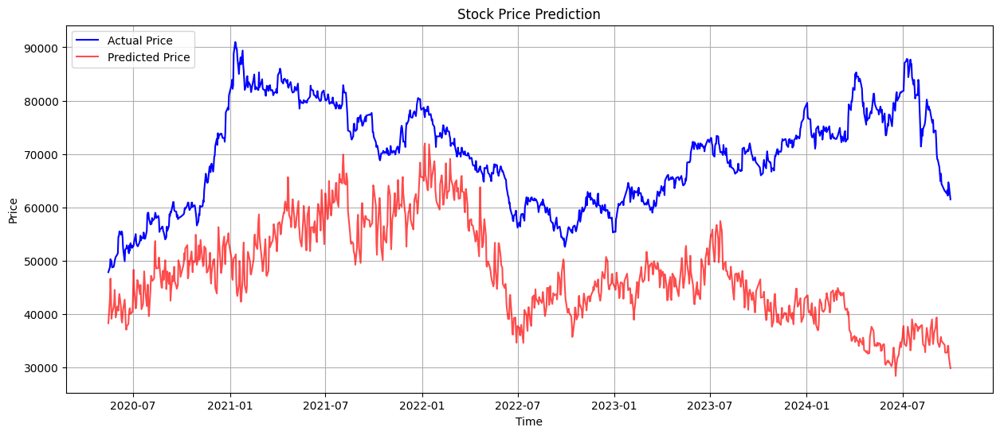

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###15

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=128, ff_dim=264, num_blocks=6, dropout_rate=0.2, lr=0.00001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 56s - 1s/step - loss: 0.3636 - mae: 0.4719 - val_loss: 0.0628 - val_mae: 0.2002
Epoch 2/100
54/54 - 6s - 106ms/step - loss: 0.1544 - mae: 0.2991 - val_loss: 0.0357 - val_mae: 0.1377
Epoch 3/100
54/54 - 2s - 29ms/step - loss: 0.0740 - mae: 0.2109 - val_loss: 0.0262 - val_mae: 0.1255
Epoch 4/100
54/54 - 2s - 30ms/step - loss: 0.0516 - mae: 0.1751 - val_loss: 0.0236 - val_mae: 0.1217
Epoch 5/100
54/54 - 2s - 29ms/step - loss: 0.0426 - mae: 0.1608 - val_loss: 0.0242 - val_mae: 0.1226
Epoch 6/100
54/54 - 2s - 29ms/step - loss: 0.0378 - mae: 0.1516 - val_loss: 0.0233 - val_mae: 0.1232
Epoch 7/100
54/54 - 3s - 47ms/step - loss: 0.0358 - mae: 0.1460 - val_loss: 0.0258 - val_mae: 0.1209
Epoch 8/100
54/54 - 2s - 30ms/step - loss: 0.0337 - mae: 0.1453 - val_loss: 0.0257 - val_mae: 0.1350
Epoch 9/100
54/54 - 2s - 33ms/step - loss: 0.0283 - mae: 0.1334 - val_loss: 0.0258 - val_mae: 0.1360
Epoch 10/100
54/54 - 2s - 43ms/step - loss: 0.0274 - mae: 0.1303 - val_loss: 0.0268 - val_m

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.023338874659335866
Root Mean Squared Error (RMSE): 0.15277066033547104
Mean Absolute Error (MAE): 0.12322128215262318
R^2 Score: -0.8165528533068904

### After Inverse Transform
Mean Squared Error (MSE): 180759566.63049296
Root Mean Squared Error (RMSE): 13444.685441857424
Mean Absolute Error (MAE): 10954.059105926824
R^2 Score: -0.8373594702511973


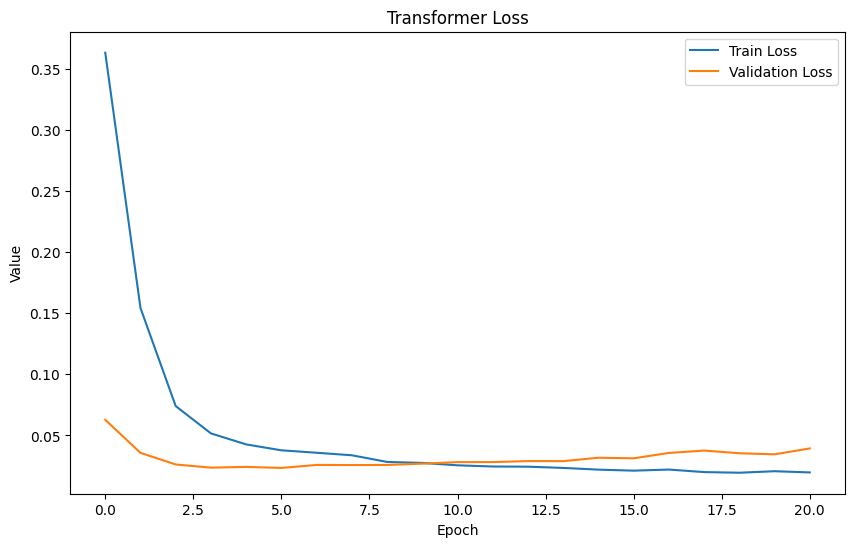

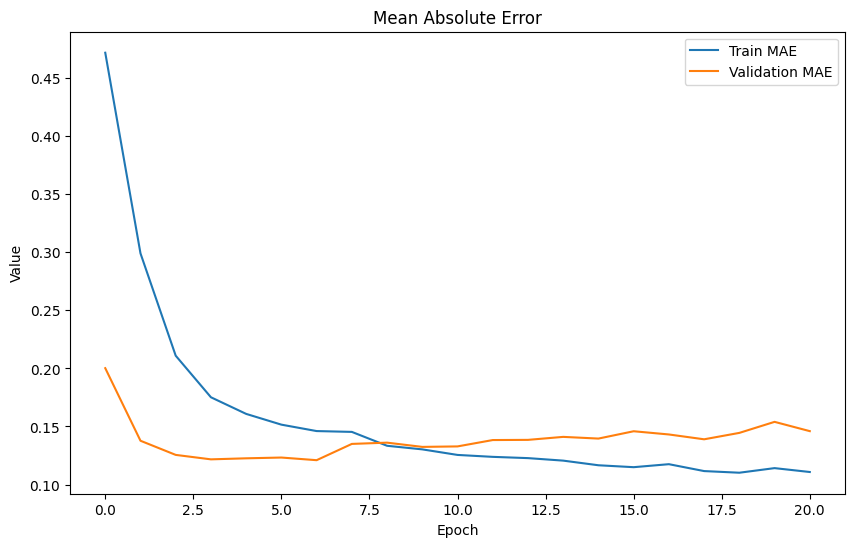

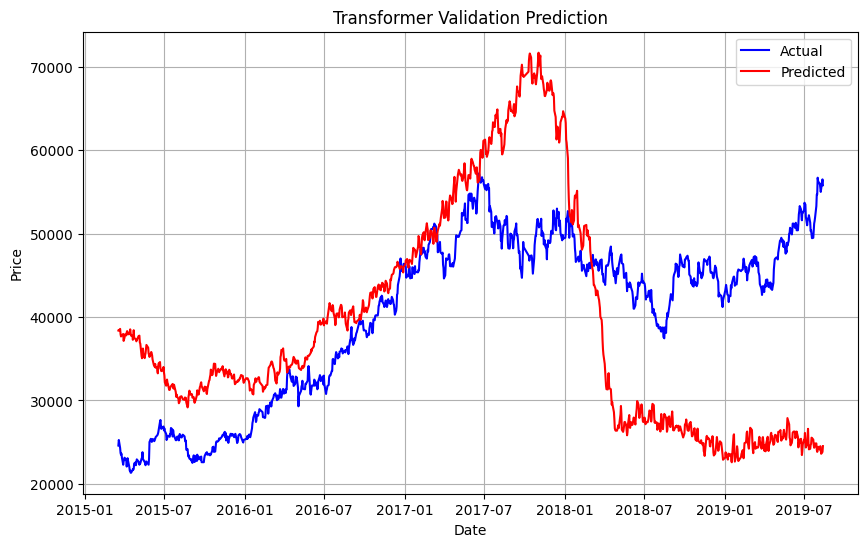

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step
Mean Absolute Error (MAE): 45341.45766420719
Root Mean Squared Error (RMSE): 46437.541942257776


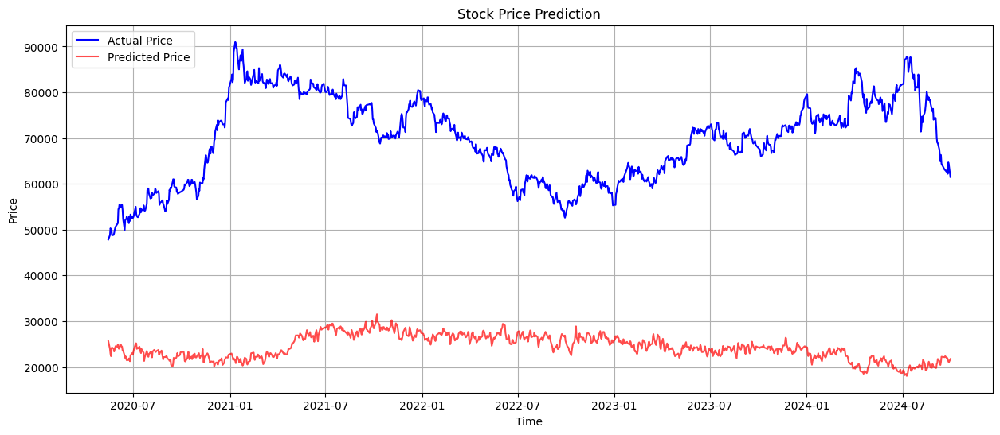

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###16 그나마

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=128, ff_dim=264, num_blocks=5, dropout_rate=0.2, lr=0.00001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 46s - 843ms/step - loss: 0.2388 - mae: 0.3870 - val_loss: 0.0349 - val_mae: 0.1632
Epoch 2/100
54/54 - 12s - 228ms/step - loss: 0.1417 - mae: 0.2970 - val_loss: 0.0334 - val_mae: 0.1587
Epoch 3/100
54/54 - 1s - 24ms/step - loss: 0.0998 - mae: 0.2470 - val_loss: 0.0339 - val_mae: 0.1575
Epoch 4/100
54/54 - 1s - 24ms/step - loss: 0.0694 - mae: 0.2073 - val_loss: 0.0337 - val_mae: 0.1573
Epoch 5/100
54/54 - 3s - 49ms/step - loss: 0.0537 - mae: 0.1799 - val_loss: 0.0382 - val_mae: 0.1647
Epoch 6/100
54/54 - 2s - 29ms/step - loss: 0.0439 - mae: 0.1636 - val_loss: 0.0418 - val_mae: 0.1672
Epoch 7/100
54/54 - 1s - 26ms/step - loss: 0.0347 - mae: 0.1452 - val_loss: 0.0446 - val_mae: 0.1706
Epoch 8/100
54/54 - 1s - 24ms/step - loss: 0.0334 - mae: 0.1423 - val_loss: 0.0399 - val_mae: 0.1598
Epoch 9/100
54/54 - 3s - 48ms/step - loss: 0.0304 - mae: 0.1357 - val_loss: 0.0381 - val_mae: 0.1550
Epoch 10/100
54/54 - 1s - 24ms/step - loss: 0.0268 - mae: 0.1294 - val_loss: 0.0441 - v

34/34 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.001521832836418442
Root Mean Squared Error (RMSE): 0.03901067592875625
Mean Absolute Error (MAE): 0.03310870140949545
R^2 Score: 0.8815499966642049

### After Inverse Transform
Mean Squared Error (MSE): 12851369.978086391
Root Mean Squared Error (RMSE): 3584.8807480983787
Mean Absolute Error (MAE): 3080.922614410203
R^2 Score: 0.8693701983518937


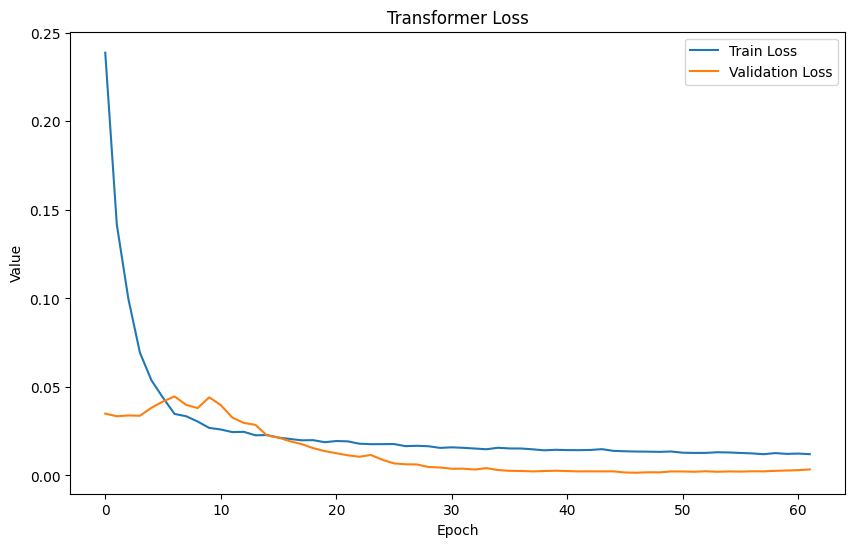

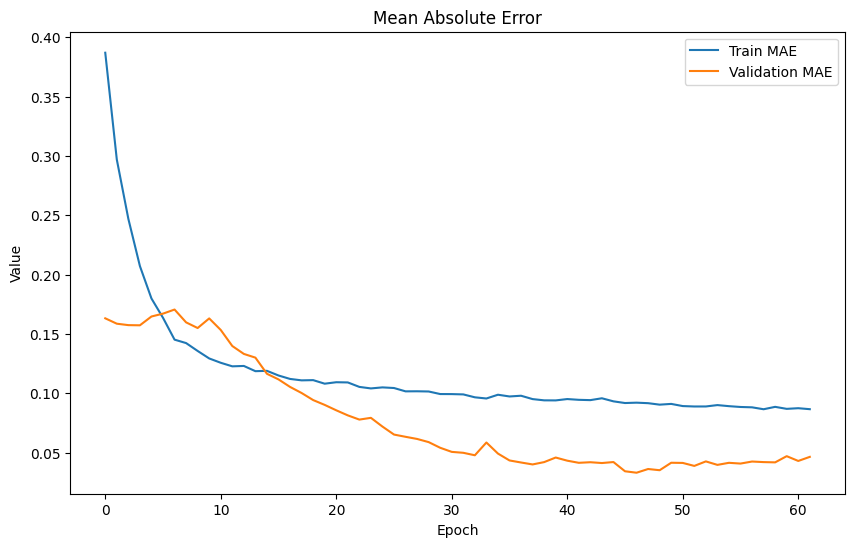

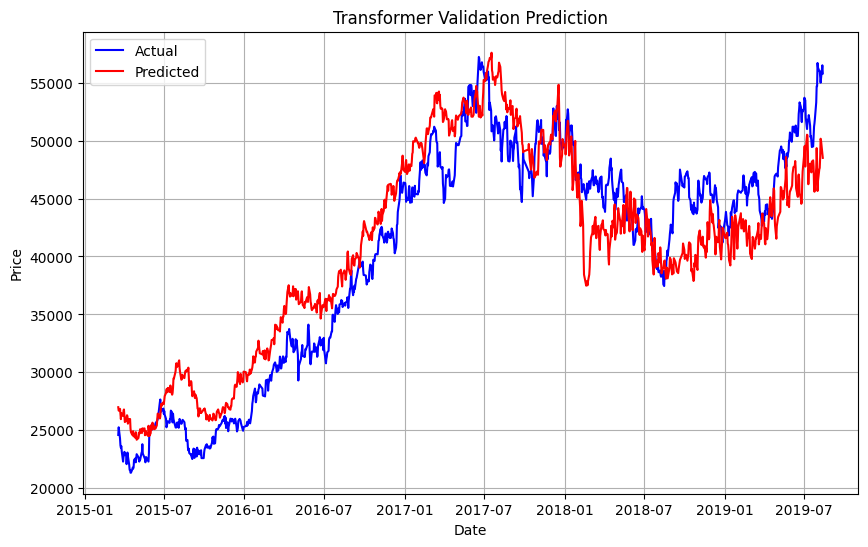

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step
Mean Absolute Error (MAE): 15385.715896267371
Root Mean Squared Error (RMSE): 17134.625915312467


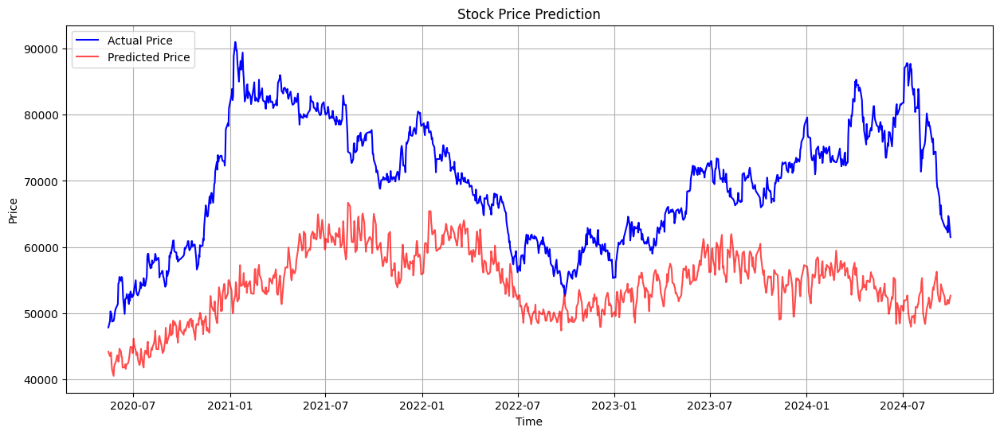

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###17 lrs사용

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=128, ff_dim=264, num_blocks=5, dropout_rate=0.2, lr=0.00001,
     initial_learning_rate=0.00001, decay_steps=1500, decay_rate=0.95, staircase=False,
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 43s - 794ms/step - loss: 0.7108 - mae: 0.6794 - val_loss: 0.9108 - val_mae: 0.6668
Epoch 2/100
54/54 - 13s - 241ms/step - loss: 0.2333 - mae: 0.3849 - val_loss: 0.9021 - val_mae: 0.6642
Epoch 3/100
54/54 - 2s - 45ms/step - loss: 0.1811 - mae: 0.3346 - val_loss: 0.9559 - val_mae: 0.7060
Epoch 4/100
54/54 - 1s - 24ms/step - loss: 0.1503 - mae: 0.3052 - val_loss: 0.9947 - val_mae: 0.7359
Epoch 5/100
54/54 - 3s - 47ms/step - loss: 0.1189 - mae: 0.2706 - val_loss: 0.9752 - val_mae: 0.7301
Epoch 6/100
54/54 - 3s - 51ms/step - loss: 0.1065 - mae: 0.2554 - val_loss: 0.9291 - val_mae: 0.7047
Epoch 7/100
54/54 - 3s - 48ms/step - loss: 0.0909 - mae: 0.2369 - val_loss: 0.8937 - val_mae: 0.6921
Epoch 8/100
54/54 - 1s - 25ms/step - loss: 0.0851 - mae: 0.2308 - val_loss: 0.8323 - val_mae: 0.6614
Epoch 9/100
54/54 - 3s - 47ms/step - loss: 0.0672 - mae: 0.2056 - val_loss: 0.8063 - val_mae: 0.6582
Epoch 10/100
54/54 - 1s - 25ms/step - loss: 0.0662 - mae: 0.2027 - val_loss: 0.7487 - v

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.022828033373433317
Root Mean Squared Error (RMSE): 0.15108948796469368
Mean Absolute Error (MAE): 0.11127669966731785
R^2 Score: -0.7767921446592678

### After Inverse Transform
Mean Squared Error (MSE): 159565405.36573273
Root Mean Squared Error (RMSE): 12631.920098137603
Mean Absolute Error (MAE): 9408.512611452563
R^2 Score: -0.6219280347828784


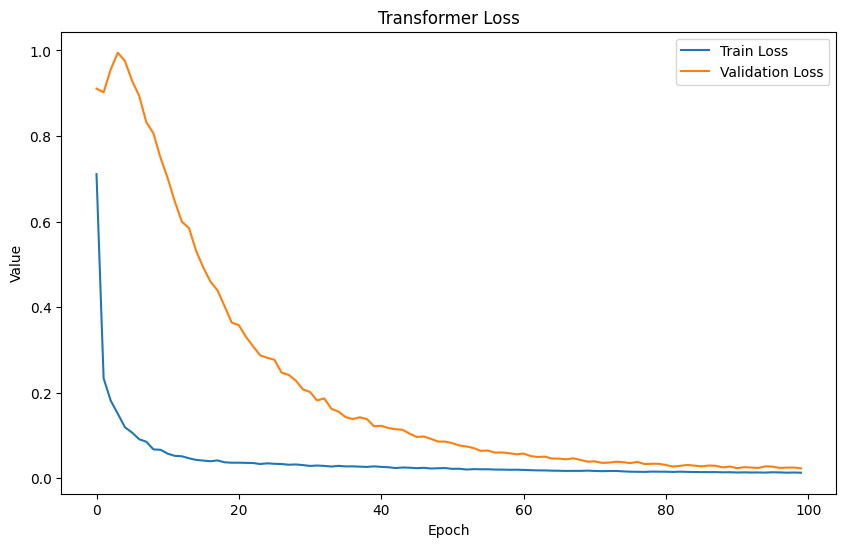

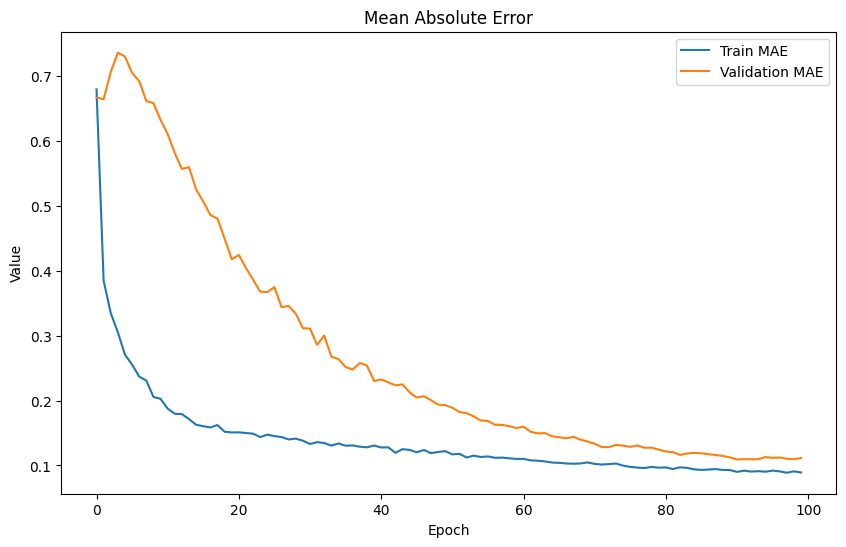

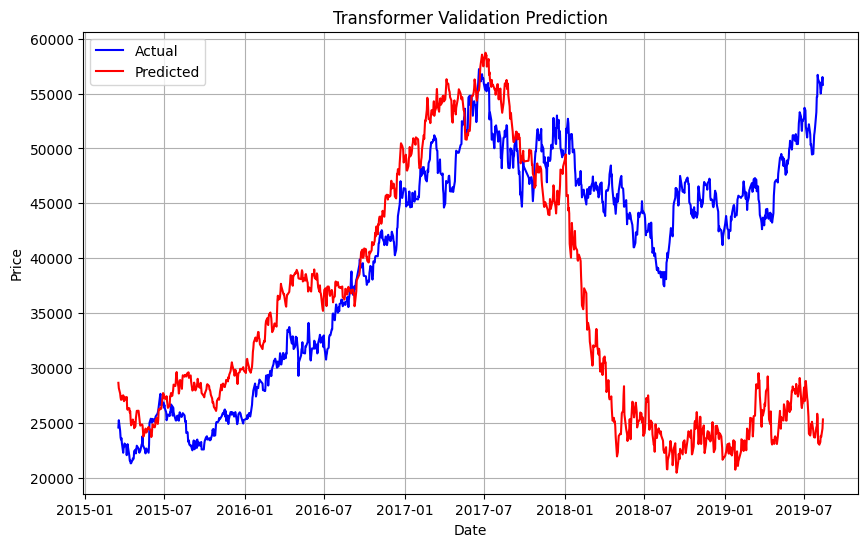

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
Mean Absolute Error (MAE): 45867.07108470777
Root Mean Squared Error (RMSE): 46963.312630556844


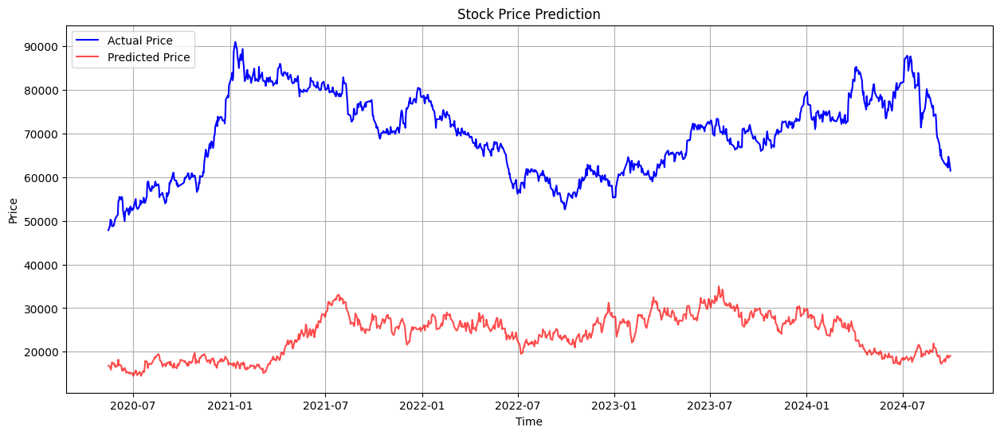

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###18

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=128, ff_dim=264, num_blocks=5, dropout_rate=0.2, lr=0.00001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 41s - 751ms/step - loss: 0.2339 - mae: 0.3792 - val_loss: 0.3557 - val_mae: 0.5466
Epoch 2/100
54/54 - 14s - 260ms/step - loss: 0.1291 - mae: 0.2860 - val_loss: 0.2195 - val_mae: 0.3544
Epoch 3/100
54/54 - 2s - 30ms/step - loss: 0.0951 - mae: 0.2450 - val_loss: 0.1986 - val_mae: 0.3112
Epoch 4/100
54/54 - 2s - 29ms/step - loss: 0.0750 - mae: 0.2186 - val_loss: 0.1958 - val_mae: 0.3186
Epoch 5/100
54/54 - 1s - 24ms/step - loss: 0.0591 - mae: 0.1932 - val_loss: 0.2118 - val_mae: 0.3204
Epoch 6/100
54/54 - 3s - 47ms/step - loss: 0.0474 - mae: 0.1725 - val_loss: 0.2194 - val_mae: 0.3198
Epoch 7/100
54/54 - 3s - 47ms/step - loss: 0.0380 - mae: 0.1530 - val_loss: 0.2150 - val_mae: 0.3187
Epoch 8/100
54/54 - 3s - 47ms/step - loss: 0.0333 - mae: 0.1439 - val_loss: 0.2302 - val_mae: 0.3230
Epoch 9/100
54/54 - 3s - 49ms/step - loss: 0.0274 - mae: 0.1323 - val_loss: 0.2221 - val_mae: 0.3180
Epoch 10/100
54/54 - 2s - 46ms/step - loss: 0.0249 - mae: 0.1248 - val_loss: 0.2141 - v

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.012510577026625717
Root Mean Squared Error (RMSE): 0.11185069077402122
Mean Absolute Error (MAE): 0.09130857034901409
R^2 Score: 0.02625449058908147

### After Inverse Transform
Mean Squared Error (MSE): 105451075.13213184
Root Mean Squared Error (RMSE): 10268.937390603365
Mean Absolute Error (MAE): 8267.233518366229
R^2 Score: -0.07187428667749596


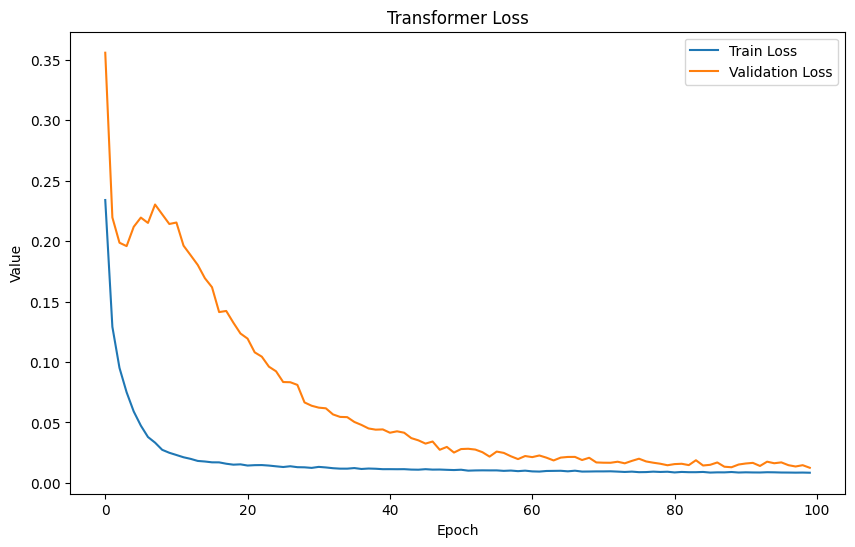

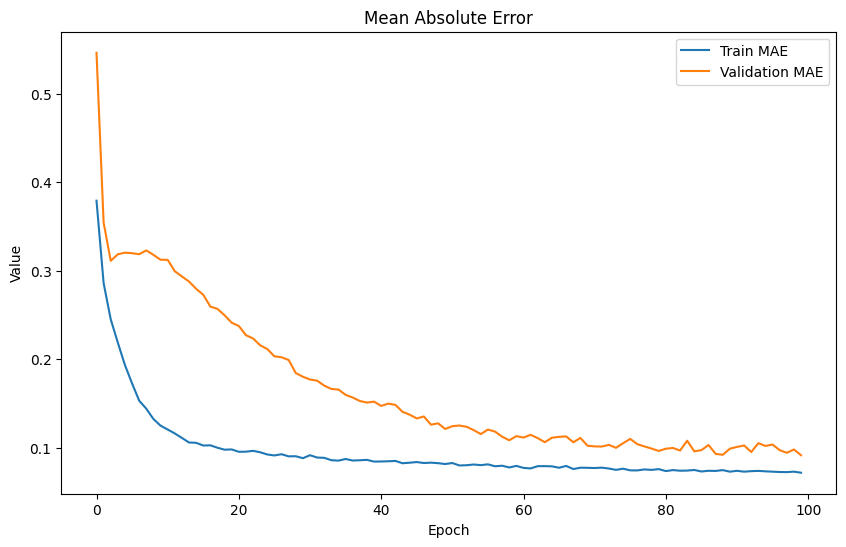

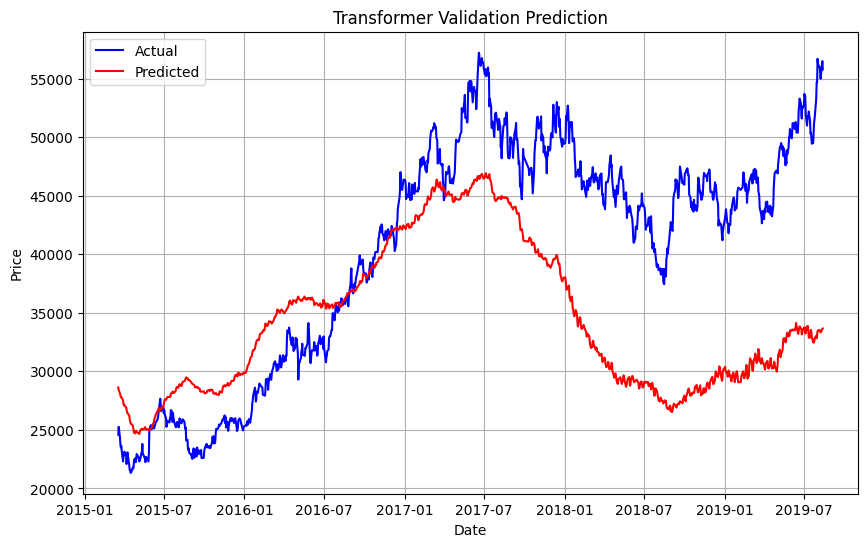

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
Mean Absolute Error (MAE): 35746.03750180846
Root Mean Squared Error (RMSE): 36676.405682056575


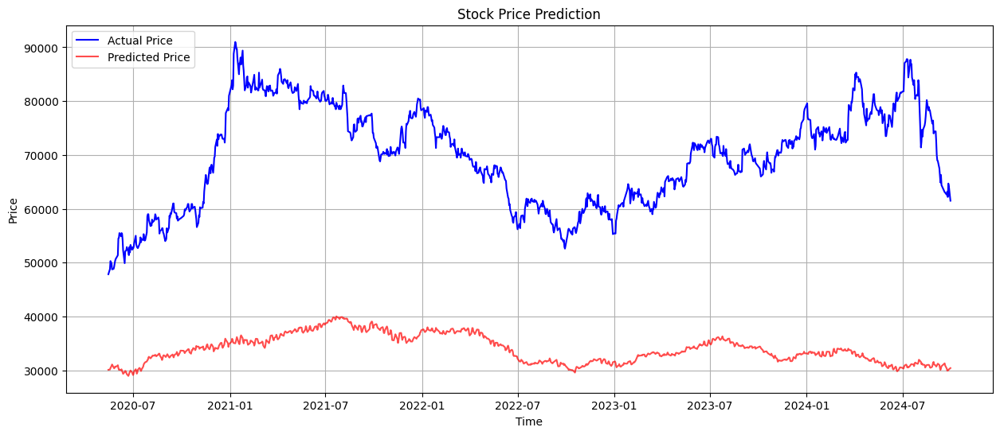

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###19

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=128, ff_dim=264, num_blocks=4, dropout_rate=0.2, lr=0.00001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 34s - 633ms/step - loss: 0.3228 - mae: 0.4397 - val_loss: 0.0687 - val_mae: 0.2317
Epoch 2/100
54/54 - 1s - 21ms/step - loss: 0.2157 - mae: 0.3655 - val_loss: 0.0998 - val_mae: 0.2754
Epoch 3/100
54/54 - 1s - 23ms/step - loss: 0.1524 - mae: 0.3105 - val_loss: 0.0907 - val_mae: 0.2640
Epoch 4/100
54/54 - 1s - 25ms/step - loss: 0.1118 - mae: 0.2679 - val_loss: 0.0654 - val_mae: 0.2320
Epoch 5/100
54/54 - 1s - 22ms/step - loss: 0.0914 - mae: 0.2404 - val_loss: 0.0713 - val_mae: 0.2432
Epoch 6/100
54/54 - 1s - 22ms/step - loss: 0.0767 - mae: 0.2202 - val_loss: 0.0565 - val_mae: 0.2254
Epoch 7/100
54/54 - 1s - 22ms/step - loss: 0.0687 - mae: 0.2051 - val_loss: 0.0406 - val_mae: 0.1936
Epoch 8/100
54/54 - 1s - 23ms/step - loss: 0.0618 - mae: 0.1971 - val_loss: 0.0418 - val_mae: 0.1947
Epoch 9/100
54/54 - 1s - 20ms/step - loss: 0.0543 - mae: 0.1852 - val_loss: 0.0441 - val_mae: 0.1914
Epoch 10/100
54/54 - 1s - 20ms/step - loss: 0.0504 - mae: 0.1783 - val_loss: 0.0443 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.040550484151902766
Root Mean Squared Error (RMSE): 0.20137150779567295
Mean Absolute Error (MAE): 0.1935570843369919
R^2 Score: -2.1561974929947607

### After Inverse Transform
Mean Squared Error (MSE): 412895852.7483874
Root Mean Squared Error (RMSE): 20319.838895729154
Mean Absolute Error (MAE): 19465.9604126991
R^2 Score: -3.1969458071643553


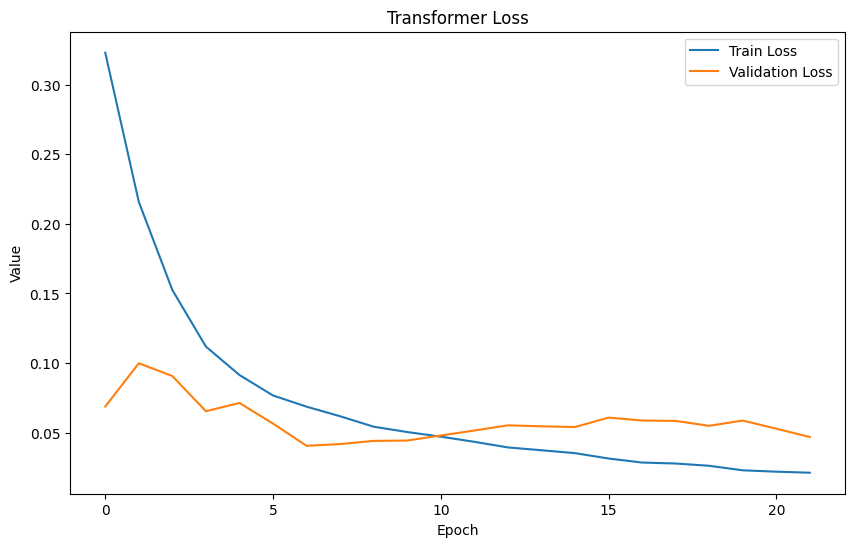

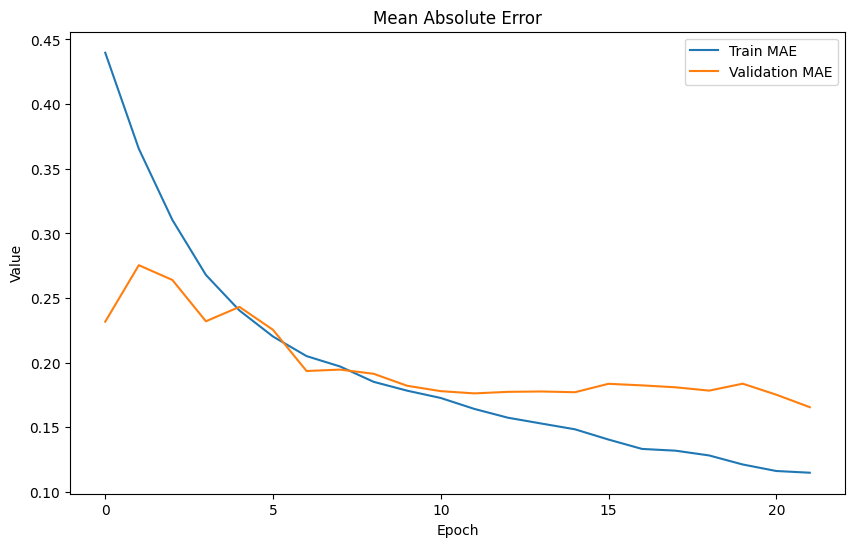

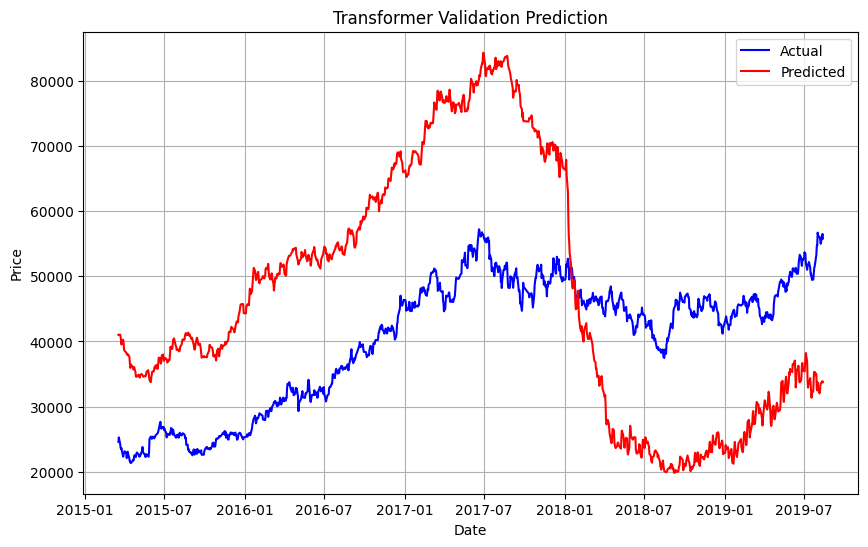

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
Mean Absolute Error (MAE): 30136.394706669573
Root Mean Squared Error (RMSE): 32332.831045149967


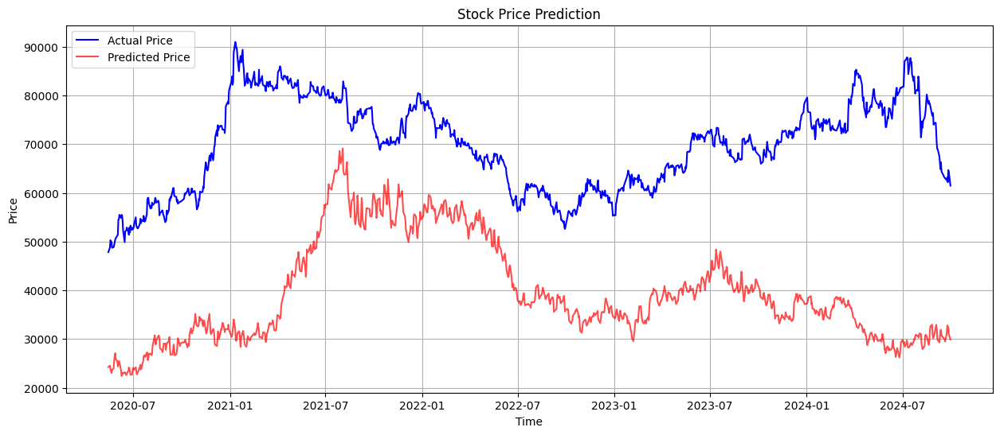

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###20

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=264, num_blocks=5, dropout_rate=0.2, lr=0.00001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100


In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###21 ver2

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=264, num_blocks=5, dropout_rate=0.2, lr=0.00001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 49s - 905ms/step - loss: 0.2247 - mae: 0.3745 - val_loss: 0.3301 - val_mae: 0.4371
Epoch 2/100
54/54 - 11s - 197ms/step - loss: 0.1281 - mae: 0.2818 - val_loss: 0.3302 - val_mae: 0.4083
Epoch 3/100
54/54 - 2s - 31ms/step - loss: 0.0950 - mae: 0.2430 - val_loss: 0.3151 - val_mae: 0.3844
Epoch 4/100
54/54 - 3s - 48ms/step - loss: 0.0725 - mae: 0.2133 - val_loss: 0.3577 - val_mae: 0.4161
Epoch 5/100
54/54 - 2s - 46ms/step - loss: 0.0596 - mae: 0.1928 - val_loss: 0.3483 - val_mae: 0.3962
Epoch 6/100
54/54 - 2s - 29ms/step - loss: 0.0487 - mae: 0.1732 - val_loss: 0.3650 - val_mae: 0.4078
Epoch 7/100
54/54 - 3s - 47ms/step - loss: 0.0444 - mae: 0.1641 - val_loss: 0.3700 - val_mae: 0.4180
Epoch 8/100
54/54 - 3s - 47ms/step - loss: 0.0396 - mae: 0.1541 - val_loss: 0.3579 - val_mae: 0.3999
Epoch 9/100
54/54 - 2s - 28ms/step - loss: 0.0349 - mae: 0.1464 - val_loss: 0.3589 - val_mae: 0.4068
Epoch 10/100
54/54 - 2s - 30ms/step - loss: 0.0304 - mae: 0.1369 - val_loss: 0.3310 - v

34/34 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.020892262935961897
Root Mean Squared Error (RMSE): 0.1445415612755096
Mean Absolute Error (MAE): 0.10080184794219761
R^2 Score: -0.6261238128367985

### After Inverse Transform
Mean Squared Error (MSE): 148364833.85237643
Root Mean Squared Error (RMSE): 12180.51041017479
Mean Absolute Error (MAE): 8467.56960194483
R^2 Score: -0.5080780376518312


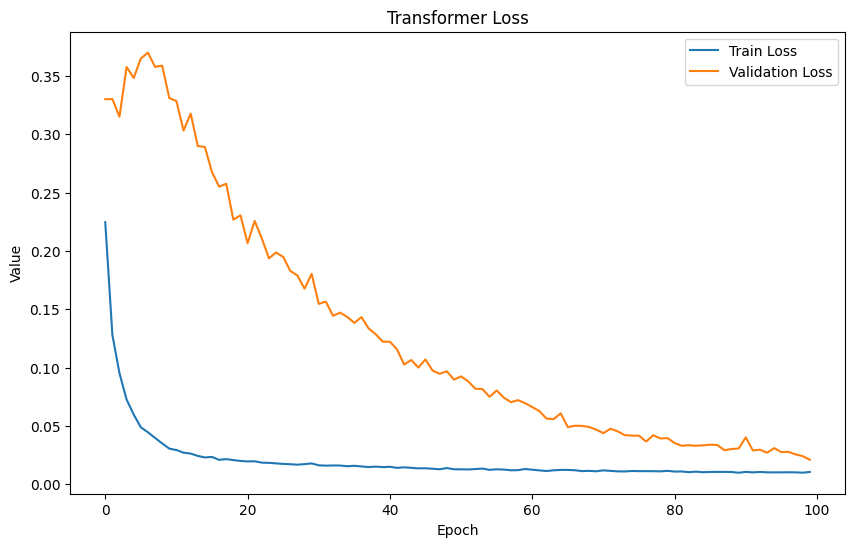

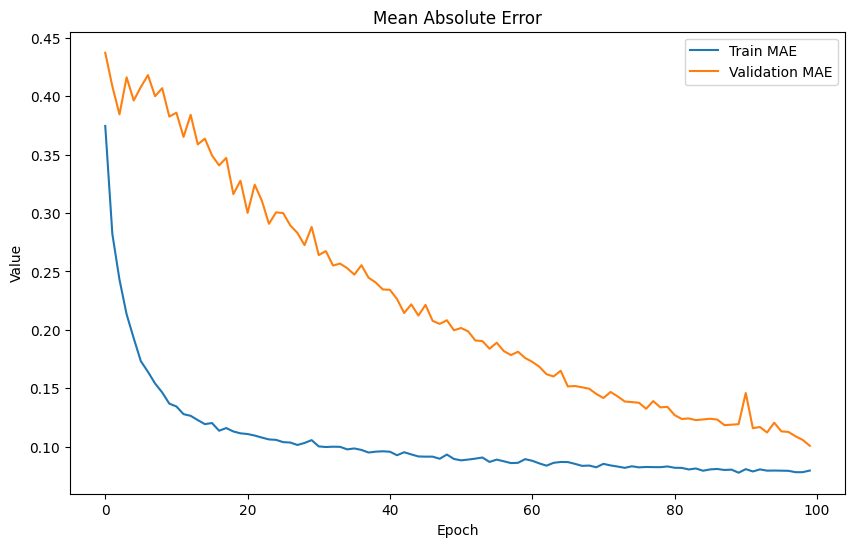

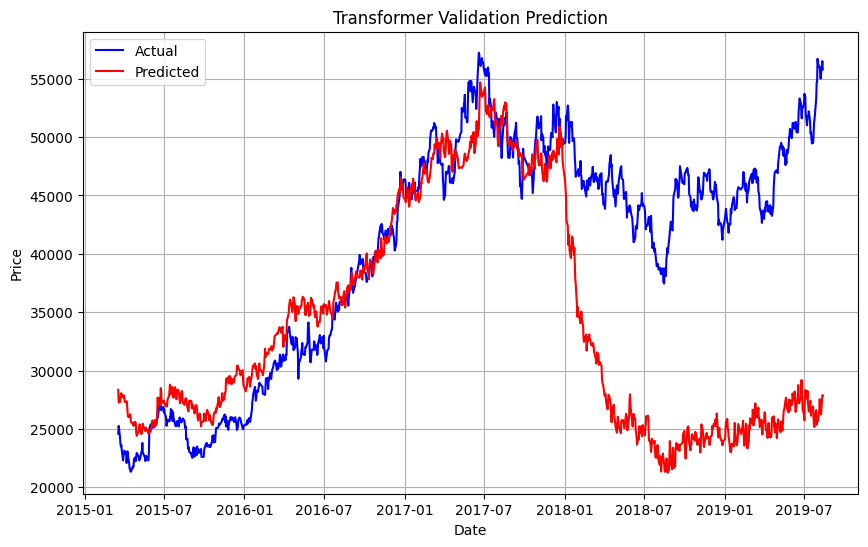

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step
Mean Absolute Error (MAE): 37293.71055230036
Root Mean Squared Error (RMSE): 38177.975080574564


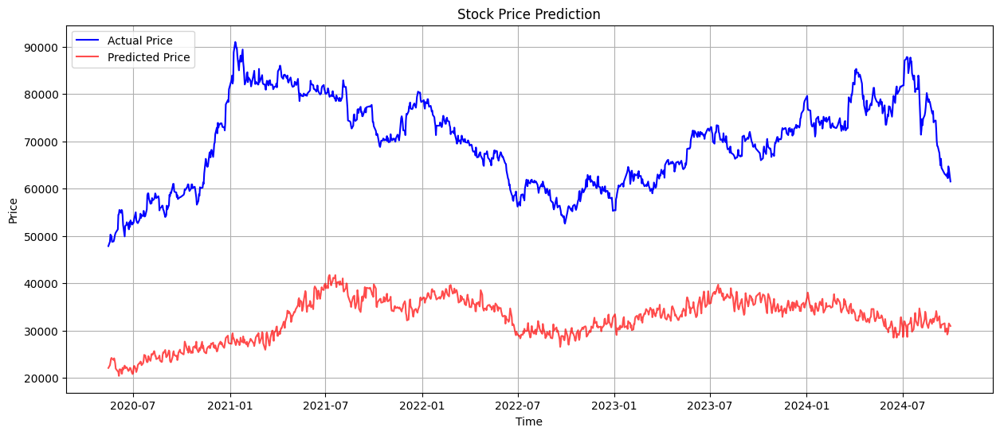

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###22 그나마

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=128, ff_dim=256, num_blocks=5, dropout_rate=0.2, lr=0.00001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 53s - 975ms/step - loss: 0.2245 - mae: 0.3777 - val_loss: 0.1620 - val_mae: 0.3748
Epoch 2/100
54/54 - 1s - 26ms/step - loss: 0.1357 - mae: 0.2904 - val_loss: 0.1507 - val_mae: 0.3607
Epoch 3/100
54/54 - 2s - 45ms/step - loss: 0.1046 - mae: 0.2591 - val_loss: 0.1334 - val_mae: 0.3370
Epoch 4/100
54/54 - 1s - 24ms/step - loss: 0.0676 - mae: 0.2091 - val_loss: 0.1313 - val_mae: 0.3347
Epoch 5/100
54/54 - 3s - 47ms/step - loss: 0.0536 - mae: 0.1875 - val_loss: 0.1203 - val_mae: 0.3182
Epoch 6/100
54/54 - 1s - 24ms/step - loss: 0.0402 - mae: 0.1608 - val_loss: 0.1177 - val_mae: 0.3137
Epoch 7/100
54/54 - 1s - 24ms/step - loss: 0.0325 - mae: 0.1428 - val_loss: 0.0988 - val_mae: 0.2806
Epoch 8/100
54/54 - 1s - 24ms/step - loss: 0.0288 - mae: 0.1347 - val_loss: 0.0797 - val_mae: 0.2427
Epoch 9/100
54/54 - 3s - 52ms/step - loss: 0.0254 - mae: 0.1274 - val_loss: 0.0735 - val_mae: 0.2283
Epoch 10/100
54/54 - 1s - 26ms/step - loss: 0.0225 - mae: 0.1186 - val_loss: 0.0610 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.004796665952028892
Root Mean Squared Error (RMSE): 0.06925796670440804
Mean Absolute Error (MAE): 0.055847772129895265
R^2 Score: 0.6266573539340459

### After Inverse Transform
Mean Squared Error (MSE): 45849650.163548306
Root Mean Squared Error (RMSE): 6771.236974404921
Mean Absolute Error (MAE): 5304.894920792936
R^2 Score: 0.5339539117843364


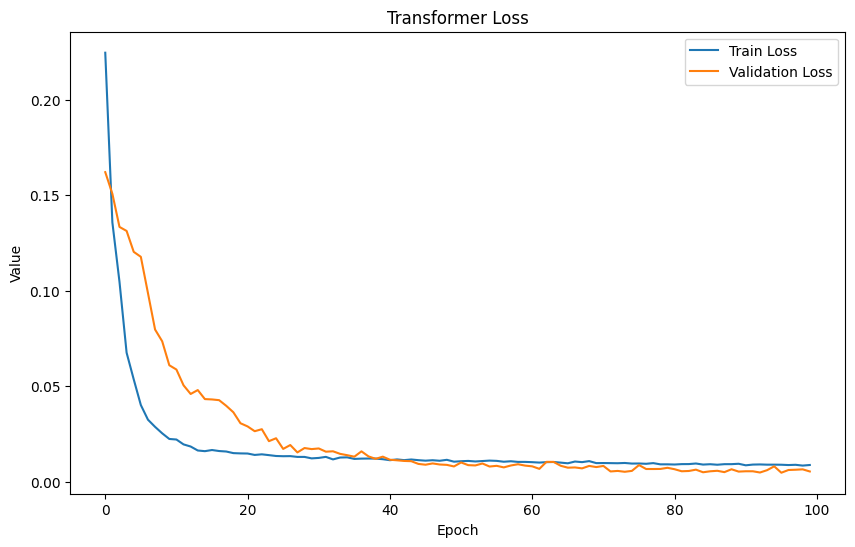

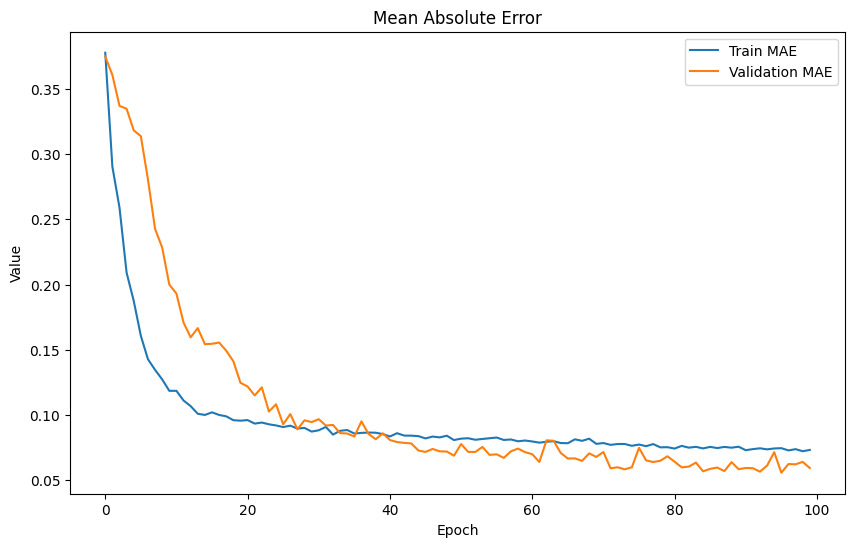

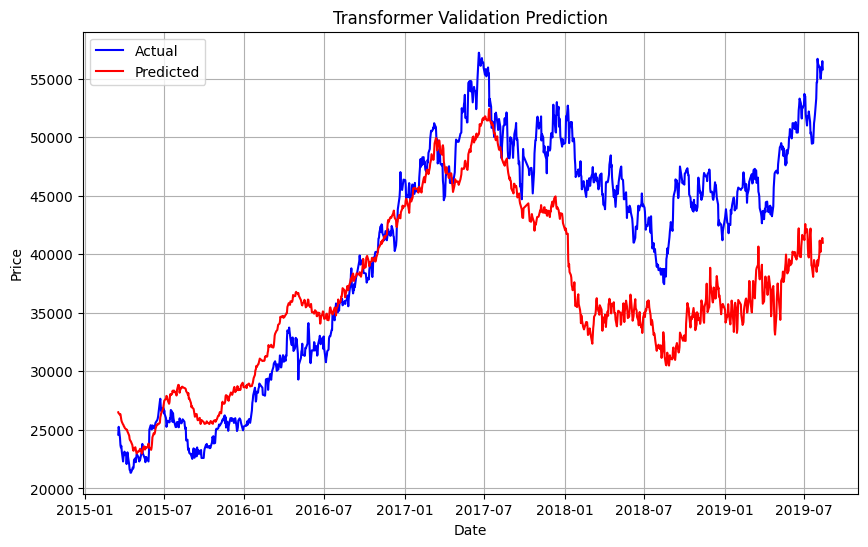

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step
Mean Absolute Error (MAE): 23312.07982675059
Root Mean Squared Error (RMSE): 24605.89986535849


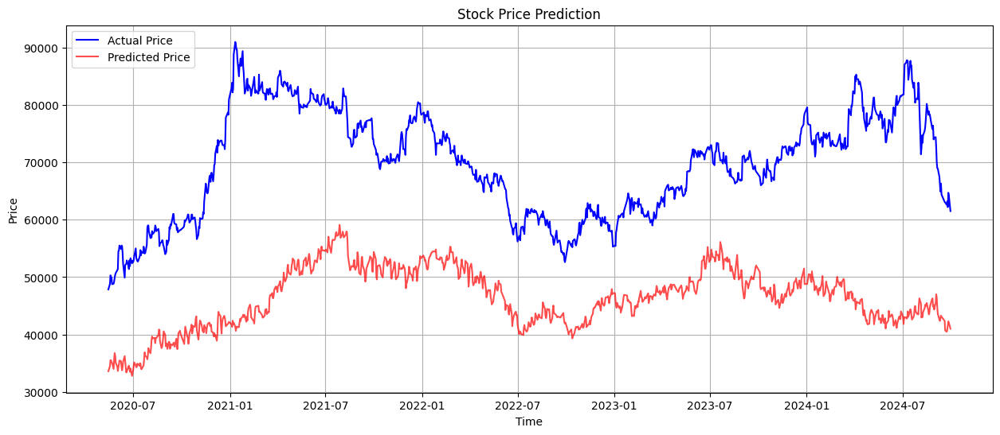

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###23

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=256, num_blocks=4, dropout_rate=0.2, lr=0.00001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 36s - 662ms/step - loss: 0.2727 - mae: 0.4126 - val_loss: 0.0554 - val_mae: 0.2066
Epoch 2/100
54/54 - 17s - 311ms/step - loss: 0.1493 - mae: 0.3045 - val_loss: 0.0157 - val_mae: 0.1052
Epoch 3/100
54/54 - 2s - 44ms/step - loss: 0.0860 - mae: 0.2319 - val_loss: 0.0114 - val_mae: 0.0924
Epoch 4/100
54/54 - 1s - 24ms/step - loss: 0.0609 - mae: 0.1934 - val_loss: 0.0097 - val_mae: 0.0871
Epoch 5/100
54/54 - 1s - 23ms/step - loss: 0.0471 - mae: 0.1689 - val_loss: 0.0064 - val_mae: 0.0688
Epoch 6/100
54/54 - 1s - 23ms/step - loss: 0.0397 - mae: 0.1547 - val_loss: 0.0094 - val_mae: 0.0833
Epoch 7/100
54/54 - 1s - 23ms/step - loss: 0.0329 - mae: 0.1400 - val_loss: 0.0076 - val_mae: 0.0648
Epoch 8/100
54/54 - 1s - 24ms/step - loss: 0.0307 - mae: 0.1349 - val_loss: 0.0128 - val_mae: 0.0873
Epoch 9/100
54/54 - 3s - 50ms/step - loss: 0.0277 - mae: 0.1295 - val_loss: 0.0169 - val_mae: 0.0971
Epoch 10/100
54/54 - 2s - 42ms/step - loss: 0.0243 - mae: 0.1205 - val_loss: 0.0133 - v

34/34 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.006409489507368026
Root Mean Squared Error (RMSE): 0.08005928745228767
Mean Absolute Error (MAE): 0.06876549605087065
R^2 Score: 0.5011251989310233

### After Inverse Transform
Mean Squared Error (MSE): 58712200.8839148
Root Mean Squared Error (RMSE): 7662.388719186387
Mean Absolute Error (MAE): 6349.205213382964
R^2 Score: 0.403210461696506


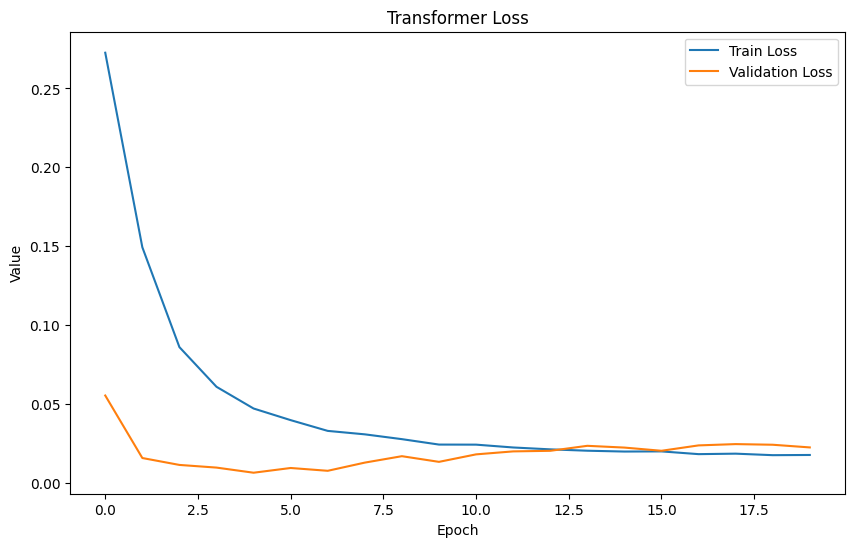

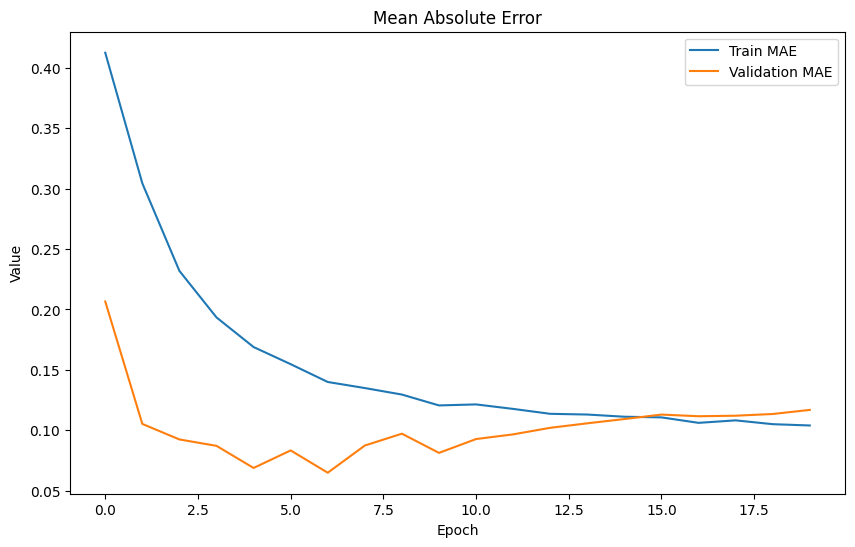

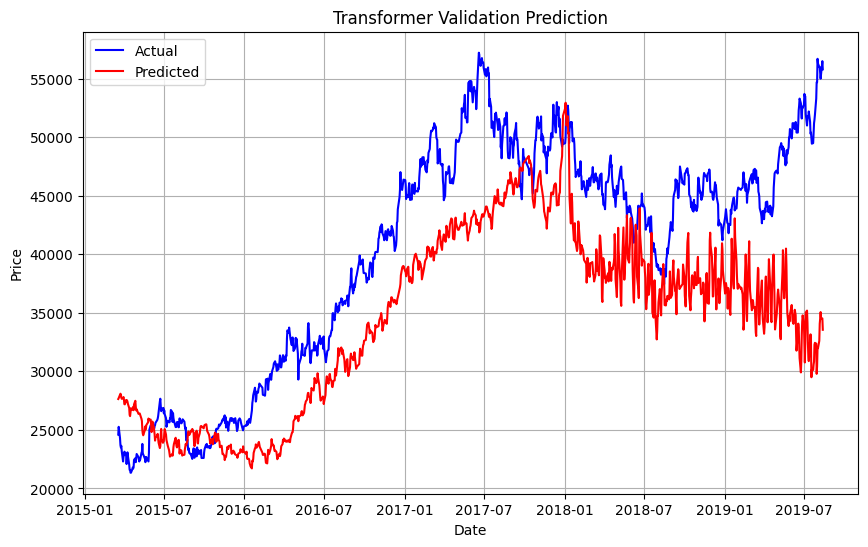

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step
Mean Absolute Error (MAE): 32495.663472945616
Root Mean Squared Error (RMSE): 34202.34038185972


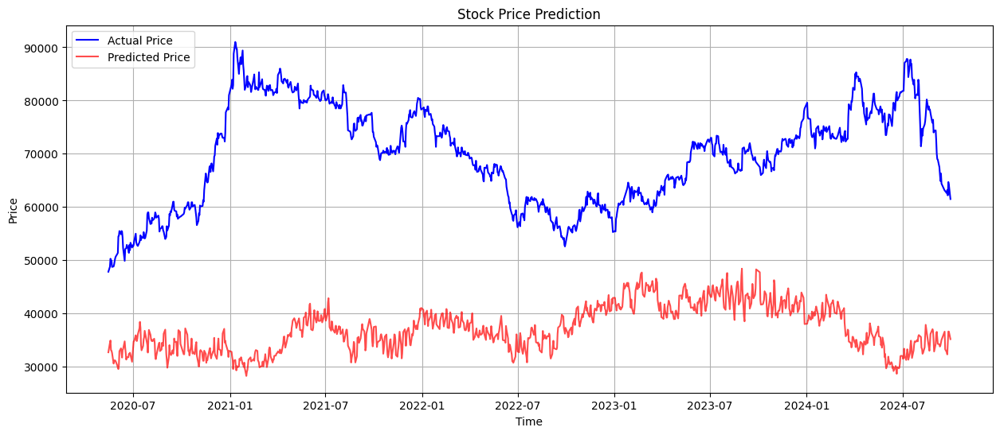

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###24

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.2, lr=0.00001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
54/54 - 32s - 601ms/step - loss: 0.9962 - mae: 0.8016 - val_loss: 1.7503 - val_mae: 1.2110
Epoch 2/100
54/54 - 1s - 19ms/step - loss: 0.4942 - mae: 0.5619 - val_loss: 1.3207 - val_mae: 1.0014
Epoch 3/100
54/54 - 1s - 23ms/step - loss: 0.3662 - mae: 0.4794 - val_loss: 1.0428 - val_mae: 0.8323
Epoch 4/100
54/54 - 1s - 18ms/step - loss: 0.2905 - mae: 0.4248 - val_loss: 0.9289 - val_mae: 0.7486
Epoch 5/100
54/54 - 1s - 20ms/step - loss: 0.2528 - mae: 0.3987 - val_loss: 0.8177 - val_mae: 0.6667
Epoch 6/100
54/54 - 1s - 24ms/step - loss: 0.2042 - mae: 0.3564 - val_loss: 0.8000 - val_mae: 0.6580
Epoch 7/100
54/54 - 1s - 22ms/step - loss: 0.1692 - mae: 0.3253 - val_loss: 0.7689 - val_mae: 0.6388
Epoch 8/100
54/54 - 1s - 19ms/step - loss: 0.1460 - mae: 0.3034 - val_loss: 0.7435 - val_mae: 0.6321
Epoch 9/100
54/54 - 1s - 22ms/step - loss: 0.1252 - mae: 0.2781 - val_loss: 0.6936 - val_mae: 0.6049
Epoch 10/100
54/54 - 1s - 18ms/step - loss: 0.1070 - mae: 0.2579 - val_loss: 0.6380 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.0034566378425501167
Root Mean Squared Error (RMSE): 0.05879317853756605
Mean Absolute Error (MAE): 0.046241262063865515
R^2 Score: 0.7309568080129675

### After Inverse Transform
Mean Squared Error (MSE): 34338850.87419327
Root Mean Squared Error (RMSE): 5859.936081067205
Mean Absolute Error (MAE): 4460.5807868767315
R^2 Score: 0.6509572686671884


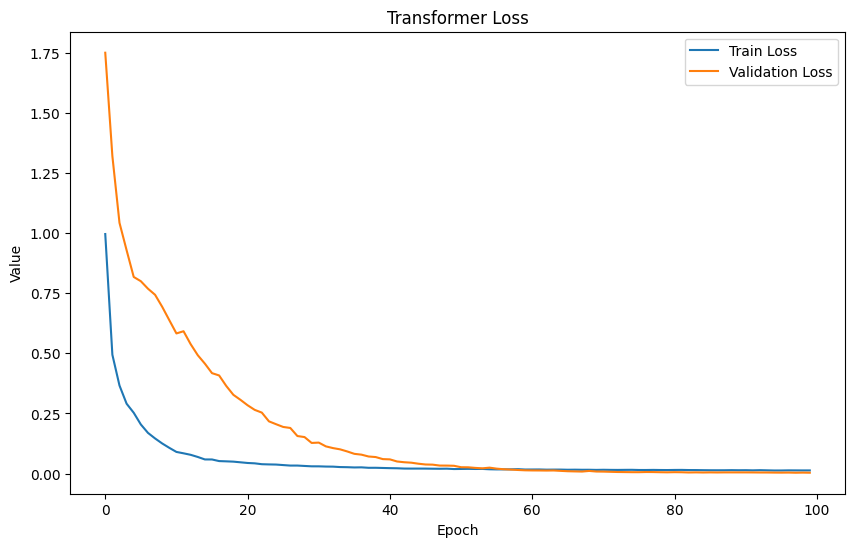

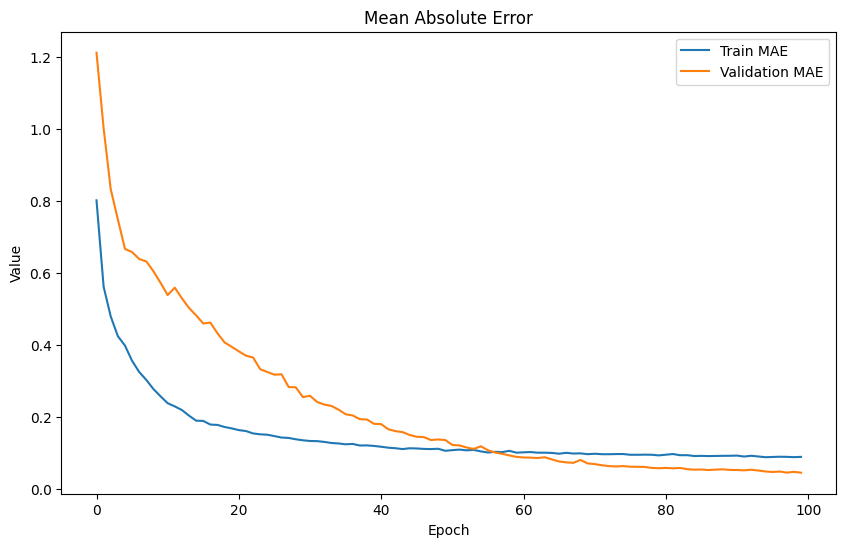

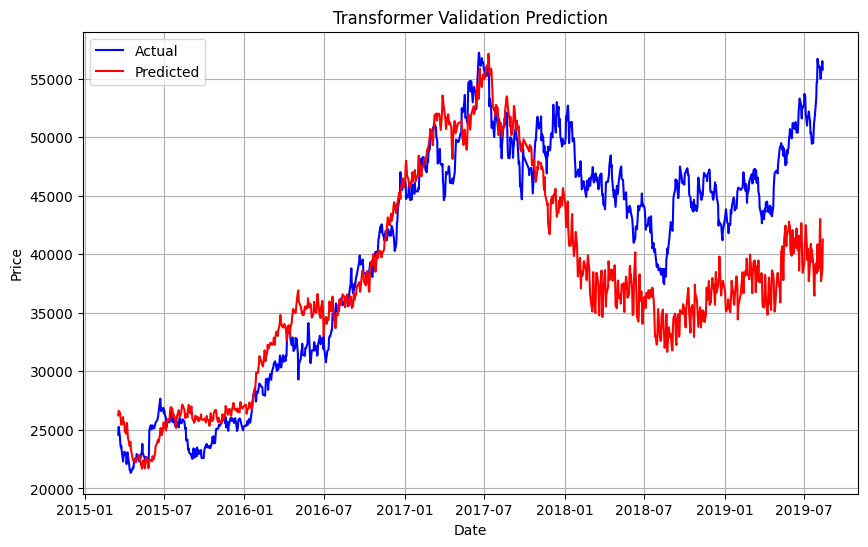

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step
Mean Absolute Error (MAE): 23558.528935185197
Root Mean Squared Error (RMSE): 24824.28056323417


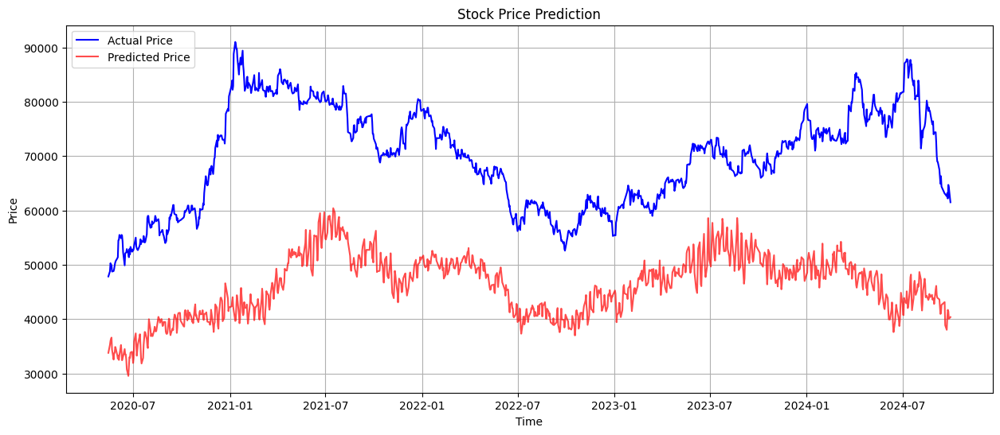

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

###25

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.2, lr=0.000015,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=100, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100


In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int0.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

In [ ]:
predictplot(model, x_test, y_test, y_scaler_int0, dates)  ###테스트데이터 예측하는거
# model.save_weights(path+ 'ver0_int7.weights.h5')
# model.save(path+'ver0_int7Model.h5')
# model.save(path+'ver0_int7Model.keras')

# !! Before Outlier: Same (1)

In [ ]:
seq_length = 90
x_train, y_train = create_sequences(x_train_same1, y_train_same1, seq_length)
x_val, y_val = create_sequences(x_val_same1, y_val_same1, seq_length)
x_test, y_test = create_sequences(x_test_same1, y_test_same1, seq_length)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.2, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=80, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/80
108/108 - 36s - 338ms/step - loss: 0.2770 - mae: 0.3786 - val_loss: 0.8149 - val_mae: 0.6591
Epoch 2/80
108/108 - 1s - 10ms/step - loss: 0.0521 - mae: 0.1809 - val_loss: 0.8592 - val_mae: 0.6755
Epoch 3/80
108/108 - 1s - 11ms/step - loss: 0.0279 - mae: 0.1333 - val_loss: 0.8568 - val_mae: 0.6690
Epoch 4/80
108/108 - 1s - 12ms/step - loss: 0.0183 - mae: 0.1084 - val_loss: 0.8121 - val_mae: 0.6537
Epoch 5/80
108/108 - 1s - 9ms/step - loss: 0.0137 - mae: 0.0933 - val_loss: 0.8134 - val_mae: 0.6466
Epoch 6/80
108/108 - 1s - 10ms/step - loss: 0.0103 - mae: 0.0799 - val_loss: 0.7869 - val_mae: 0.6416
Epoch 7/80
108/108 - 1s - 12ms/step - loss: 0.0088 - mae: 0.0735 - val_loss: 0.7463 - val_mae: 0.6265
Epoch 8/80
108/108 - 1s - 12ms/step - loss: 0.0077 - mae: 0.0681 - val_loss: 0.7046 - val_mae: 0.6130
Epoch 9/80
108/108 - 1s - 12ms/step - loss: 0.0068 - mae: 0.0652 - val_loss: 0.6998 - val_mae: 0.6142
Epoch 10/80
108/108 - 1s - 12ms/step - loss: 0.0058 - mae: 0.0596 - val_loss: 0.6

34/34 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.4822789778883214
Root Mean Squared Error (RMSE): 0.6944630860516068
Mean Absolute Error (MAE): 0.5242636054766905
R^2 Score: -3.043524172476455

### After Inverse Transform
Mean Squared Error (MSE): 397802224.0865041
Root Mean Squared Error (RMSE): 19944.979921937855
Mean Absolute Error (MAE): 15056.8507365247
R^2 Score: -3.043524209185774


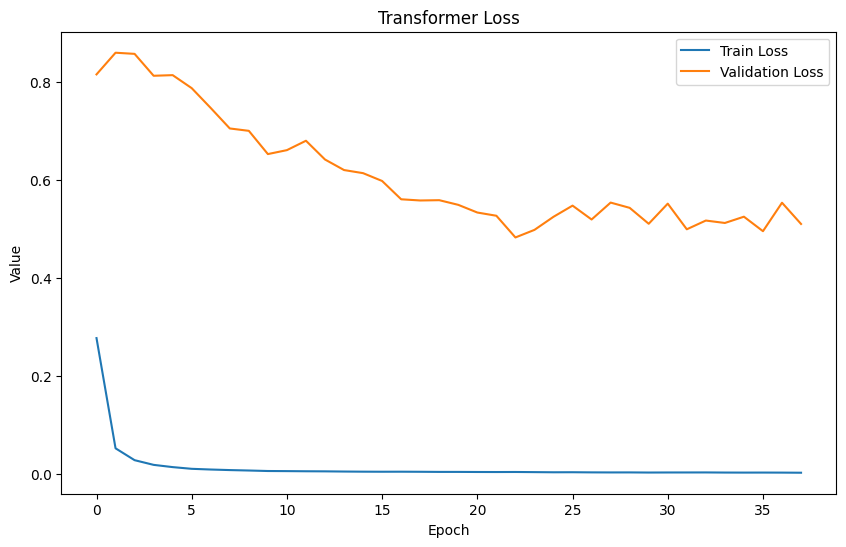

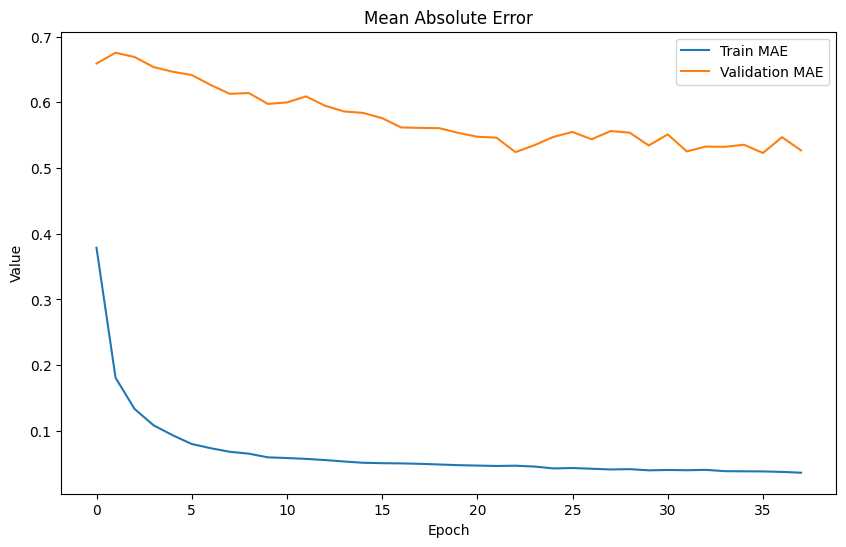

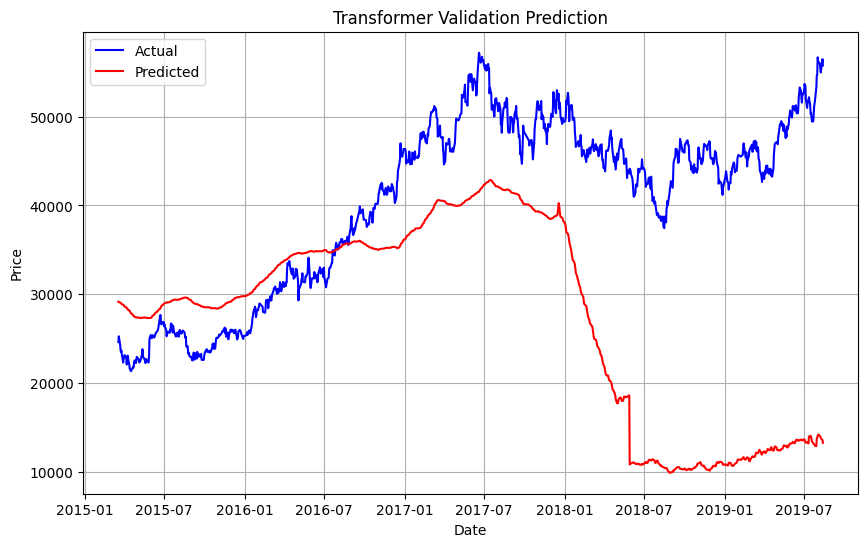

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = y_scaler_same1.inverse_transform(y_pred)
y_val_rev = y_scaler_same1.inverse_transform(y_val)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=128, ff_dim=256, num_blocks=2, dropout_rate=0.2, lr=0.0002,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=80, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/80
108/108 - 35s - 326ms/step - loss: 0.1127 - mae: 0.2477 - val_loss: 0.9535 - val_mae: 0.7073
Epoch 2/80
108/108 - 12s - 115ms/step - loss: 0.0201 - mae: 0.1130 - val_loss: 0.8437 - val_mae: 0.6803
Epoch 3/80
108/108 - 1s - 7ms/step - loss: 0.0108 - mae: 0.0820 - val_loss: 0.7590 - val_mae: 0.6515
Epoch 4/80
108/108 - 1s - 12ms/step - loss: 0.0083 - mae: 0.0712 - val_loss: 0.6983 - val_mae: 0.6321
Epoch 5/80
108/108 - 1s - 7ms/step - loss: 0.0071 - mae: 0.0659 - val_loss: 0.7262 - val_mae: 0.6437
Epoch 6/80
108/108 - 1s - 11ms/step - loss: 0.0062 - mae: 0.0613 - val_loss: 0.6735 - val_mae: 0.6200
Epoch 7/80
108/108 - 1s - 12ms/step - loss: 0.0057 - mae: 0.0586 - val_loss: 0.6392 - val_mae: 0.6098
Epoch 8/80
108/108 - 1s - 7ms/step - loss: 0.0054 - mae: 0.0567 - val_loss: 0.5922 - val_mae: 0.5922
Epoch 9/80
108/108 - 1s - 7ms/step - loss: 0.0053 - mae: 0.0560 - val_loss: 0.5990 - val_mae: 0.5943
Epoch 10/80
108/108 - 1s - 12ms/step - loss: 0.0046 - mae: 0.0518 - val_loss: 0.60

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.5905374114426831
Root Mean Squared Error (RMSE): 0.7684643202144672
Mean Absolute Error (MAE): 0.5917653174282753
R^2 Score: -3.951184703043608

### After Inverse Transform
Mean Squared Error (MSE): 0.5905374114426831
Root Mean Squared Error (RMSE): 0.7684643202144672
Mean Absolute Error (MAE): 0.5917653174282753
R^2 Score: -3.951184703043608


<ipython-input-24-eca5c5ebe605>:2: RuntimeWarning: overflow encountered in exp
  y_pred_rev = np.round(np.exp(y_scaler_same1.inverse_transform(y_pred)), 4)
<ipython-input-24-eca5c5ebe605>:3: RuntimeWarning: overflow encountered in exp
  y_val_rev = np.round(np.exp(y_scaler_same1.inverse_transform(y_val)), 4)


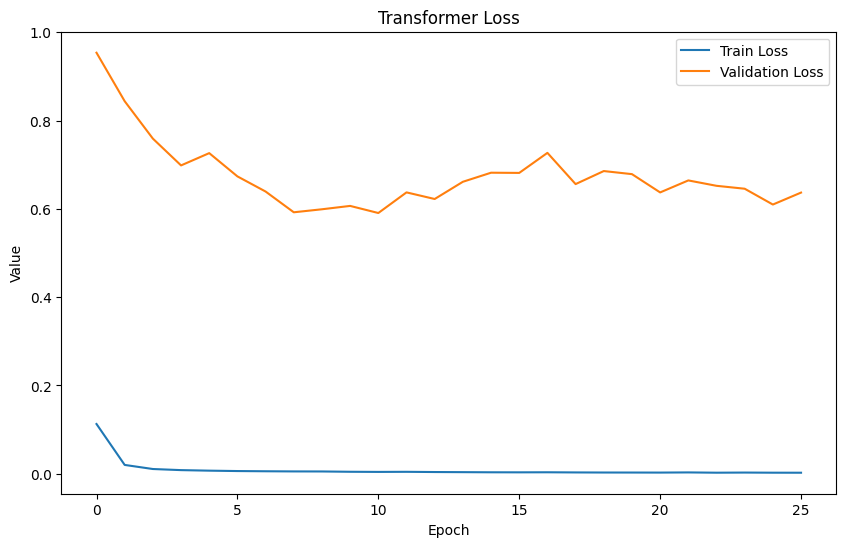

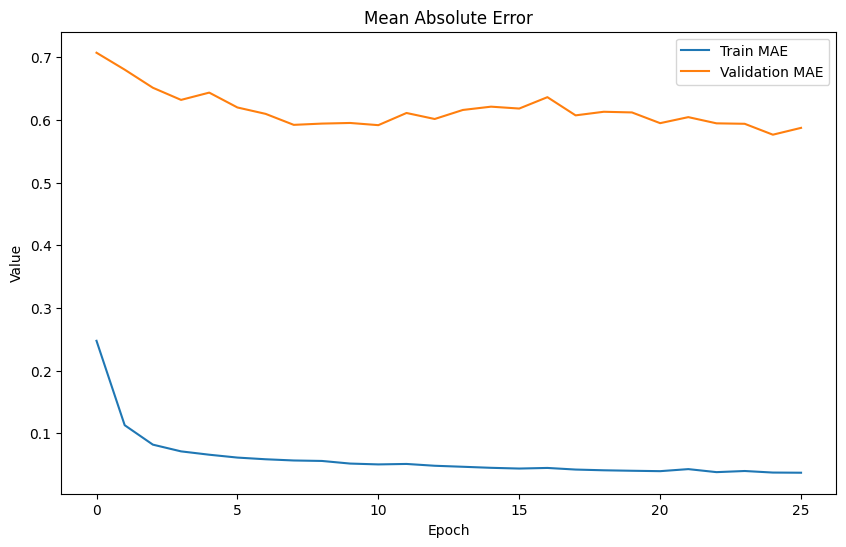

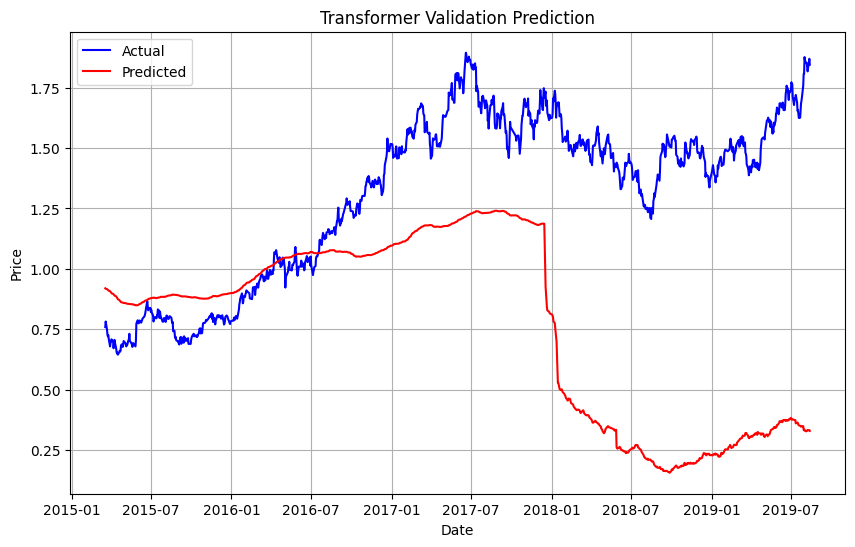

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = y_scaler_same1.inverse_transform(y_pred)
y_val_rev = y_scaler_same1.inverse_transform(y_val)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

# !! Before Outlier: Interp (1)

In [ ]:
seq_length = 90
x_train, y_train = create_sequences(x_train_int1, y_train_int1, seq_length)
x_val, y_val = create_sequences(x_val_int1, y_val_int1, seq_length)
x_test, y_test = create_sequences(x_test_int1, y_test_int1, seq_length)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=128, ff_dim=256, num_blocks=2, dropout_rate=0.2, lr=0.0005,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=80, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/80
108/108 - 28s - 262ms/step - loss: 0.1344 - mae: 0.2577 - val_loss: 0.6736 - val_mae: 0.6605
Epoch 2/80
108/108 - 1s - 12ms/step - loss: 0.0261 - mae: 0.1280 - val_loss: 0.6859 - val_mae: 0.6612
Epoch 3/80
108/108 - 1s - 12ms/step - loss: 0.0137 - mae: 0.0925 - val_loss: 0.6589 - val_mae: 0.6461
Epoch 4/80
108/108 - 3s - 23ms/step - loss: 0.0100 - mae: 0.0793 - val_loss: 0.7051 - val_mae: 0.6876
Epoch 5/80
108/108 - 1s - 12ms/step - loss: 0.0081 - mae: 0.0714 - val_loss: 0.5607 - val_mae: 0.5986
Epoch 6/80
108/108 - 1s - 13ms/step - loss: 0.0070 - mae: 0.0655 - val_loss: 0.5729 - val_mae: 0.6261
Epoch 7/80
108/108 - 2s - 15ms/step - loss: 0.0060 - mae: 0.0599 - val_loss: 0.4268 - val_mae: 0.5194
Epoch 8/80
108/108 - 3s - 32ms/step - loss: 0.0047 - mae: 0.0535 - val_loss: 0.3914 - val_mae: 0.5012
Epoch 9/80
108/108 - 4s - 40ms/step - loss: 0.0042 - mae: 0.0505 - val_loss: 0.3642 - val_mae: 0.4778
Epoch 10/80
108/108 - 2s - 17ms/step - loss: 0.0037 - mae: 0.0470 - val_loss: 0.

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.1852527338360062
Root Mean Squared Error (RMSE): 0.43040996019609745
Mean Absolute Error (MAE): 0.34514711239301876
R^2 Score: -0.5531962652883802

### After Inverse Transform
Mean Squared Error (MSE): 152803564.81612965
Root Mean Squared Error (RMSE): 12361.373904875205
Mean Absolute Error (MAE): 9912.624944093375
R^2 Score: -0.5531962271019126


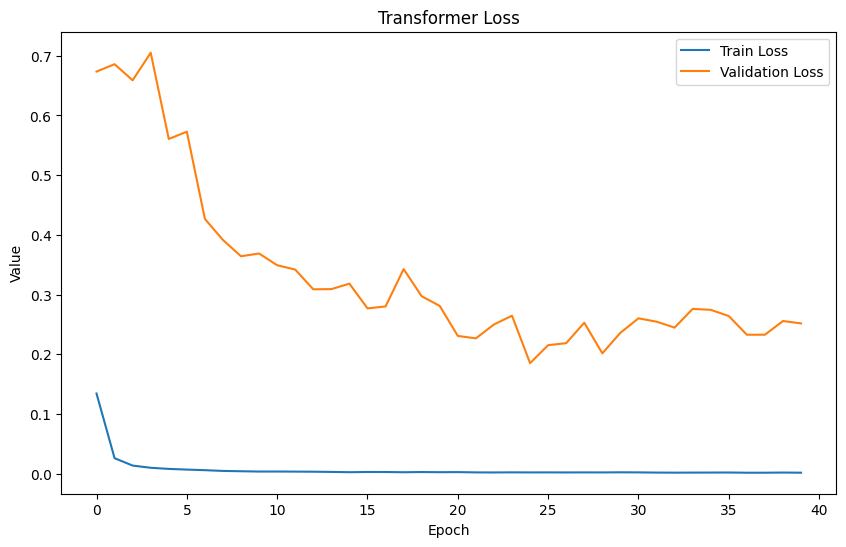

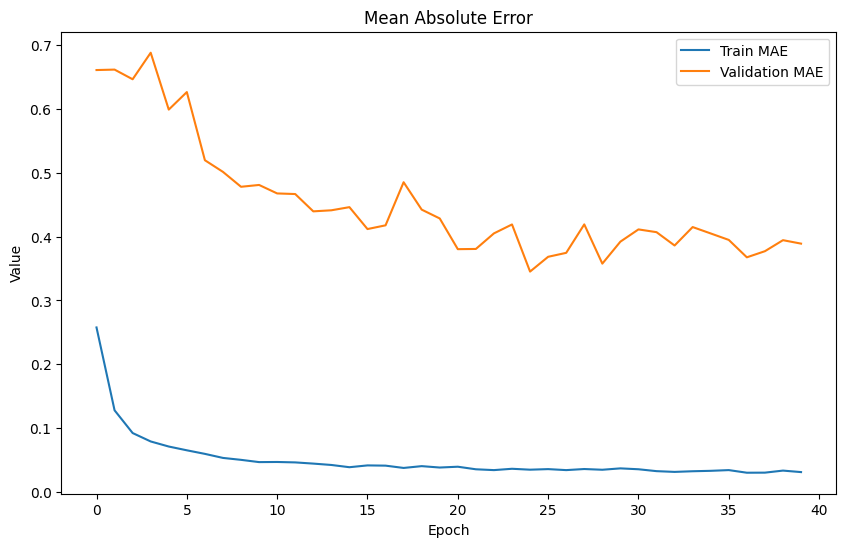

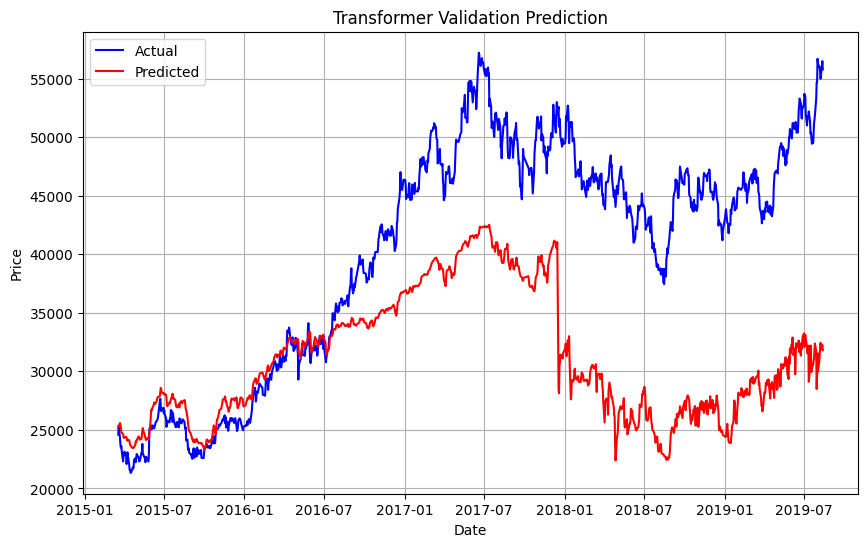

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = y_scaler_int1.inverse_transform(y_pred)
y_val_rev = y_scaler_int1.inverse_transform(y_val)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=2, key_dim=64, ff_dim=128, num_blocks=3, dropout_rate=0.2, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=80, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/80
108/108 - 89s - 825ms/step - loss: 0.1726 - mae: 0.3165 - val_loss: 0.6241 - val_mae: 0.6572
Epoch 2/80
108/108 - 13s - 125ms/step - loss: 0.0509 - mae: 0.1764 - val_loss: 0.6332 - val_mae: 0.6491
Epoch 3/80
108/108 - 1s - 7ms/step - loss: 0.0284 - mae: 0.1326 - val_loss: 0.5916 - val_mae: 0.6239
Epoch 4/80
108/108 - 1s - 7ms/step - loss: 0.0189 - mae: 0.1090 - val_loss: 0.5781 - val_mae: 0.6032
Epoch 5/80
108/108 - 1s - 7ms/step - loss: 0.0144 - mae: 0.0946 - val_loss: 0.5658 - val_mae: 0.5918
Epoch 6/80
108/108 - 1s - 12ms/step - loss: 0.0120 - mae: 0.0865 - val_loss: 0.5210 - val_mae: 0.5633
Epoch 7/80
108/108 - 1s - 8ms/step - loss: 0.0104 - mae: 0.0805 - val_loss: 0.5198 - val_mae: 0.5579
Epoch 8/80
108/108 - 1s - 8ms/step - loss: 0.0089 - mae: 0.0748 - val_loss: 0.4944 - val_mae: 0.5440
Epoch 9/80
108/108 - 1s - 8ms/step - loss: 0.0082 - mae: 0.0713 - val_loss: 0.4673 - val_mae: 0.5330
Epoch 10/80
108/108 - 1s - 12ms/step - loss: 0.0080 - mae: 0.0702 - val_loss: 0.4487

34/34 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.3842235046052464
Root Mean Squared Error (RMSE): 0.6198576486623735
Mean Absolute Error (MAE): 0.484714219506995
R^2 Score: -2.221407317622487

### After Inverse Transform
Mean Squared Error (MSE): 316922294.19158953
Root Mean Squared Error (RMSE): 17802.311484512047
Mean Absolute Error (MAE): 13920.992221765351
R^2 Score: -2.221407250643534


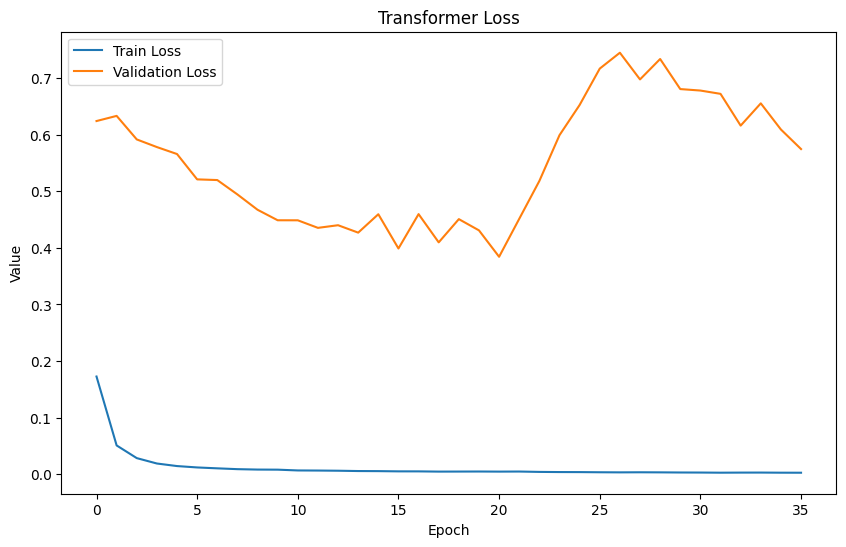

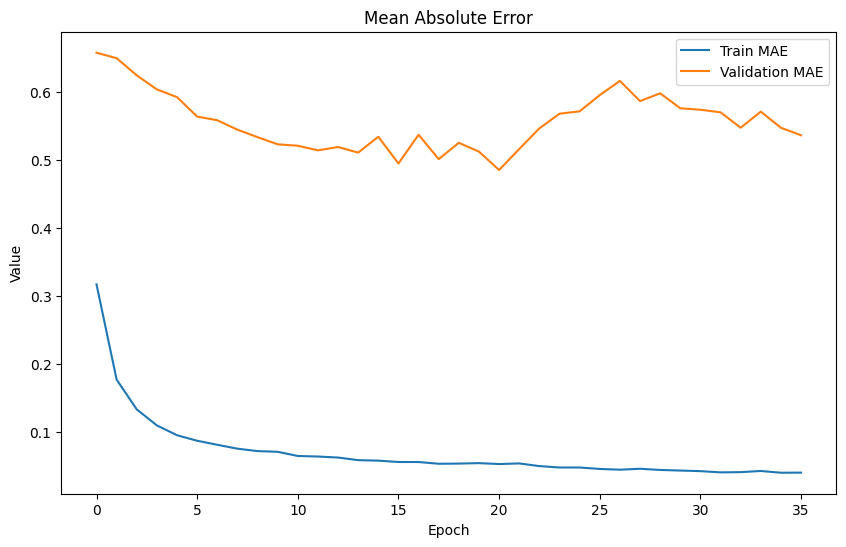

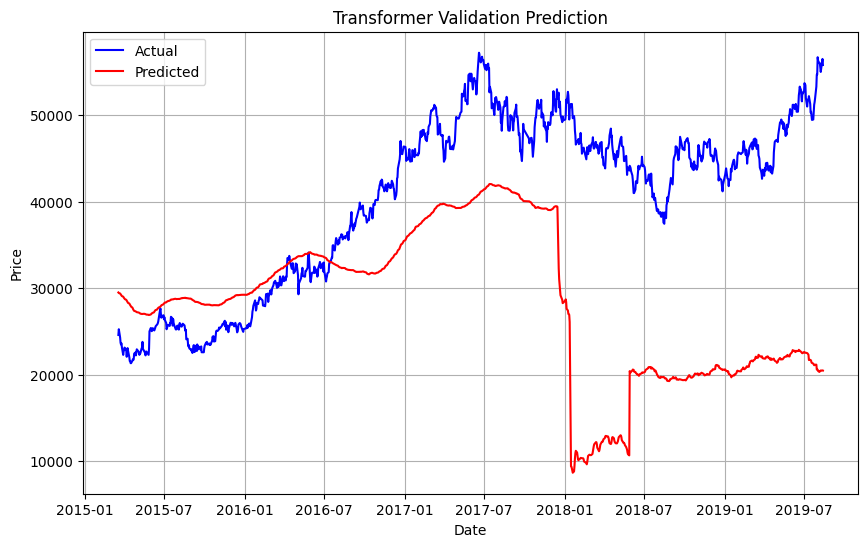

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = y_scaler_int1.inverse_transform(y_pred)
y_val_rev = y_scaler_int1.inverse_transform(y_val)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=32, ff_dim=128, num_blocks=4, dropout_rate=0.2, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=80, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/80
108/108 - 49s - 454ms/step - loss: 0.3805 - mae: 0.4414 - val_loss: 1.3983 - val_mae: 0.9537
Epoch 2/80
108/108 - 5s - 46ms/step - loss: 0.0618 - mae: 0.1974 - val_loss: 1.3098 - val_mae: 0.9172
Epoch 3/80
108/108 - 1s - 8ms/step - loss: 0.0366 - mae: 0.1525 - val_loss: 1.2476 - val_mae: 0.8964
Epoch 4/80
108/108 - 1s - 8ms/step - loss: 0.0253 - mae: 0.1265 - val_loss: 1.0930 - val_mae: 0.8432
Epoch 5/80
108/108 - 1s - 8ms/step - loss: 0.0200 - mae: 0.1127 - val_loss: 0.9353 - val_mae: 0.7886
Epoch 6/80
108/108 - 1s - 8ms/step - loss: 0.0166 - mae: 0.1024 - val_loss: 0.8654 - val_mae: 0.7562
Epoch 7/80
108/108 - 1s - 8ms/step - loss: 0.0144 - mae: 0.0944 - val_loss: 0.7717 - val_mae: 0.7176
Epoch 8/80
108/108 - 1s - 9ms/step - loss: 0.0118 - mae: 0.0867 - val_loss: 0.6902 - val_mae: 0.6773
Epoch 9/80
108/108 - 1s - 8ms/step - loss: 0.0112 - mae: 0.0839 - val_loss: 0.6510 - val_mae: 0.6619
Epoch 10/80
108/108 - 1s - 12ms/step - loss: 0.0096 - mae: 0.0779 - val_loss: 0.5634 - 

34/34 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.0824837218845394
Root Mean Squared Error (RMSE): 0.2871997943671607
Mean Absolute Error (MAE): 0.24820752127940643
R^2 Score: 0.3084398479562327

### After Inverse Transform
Mean Squared Error (MSE): 68035737.05411917
Root Mean Squared Error (RMSE): 8248.377843801723
Mean Absolute Error (MAE): 7128.51987029663
R^2 Score: 0.3084398899481626


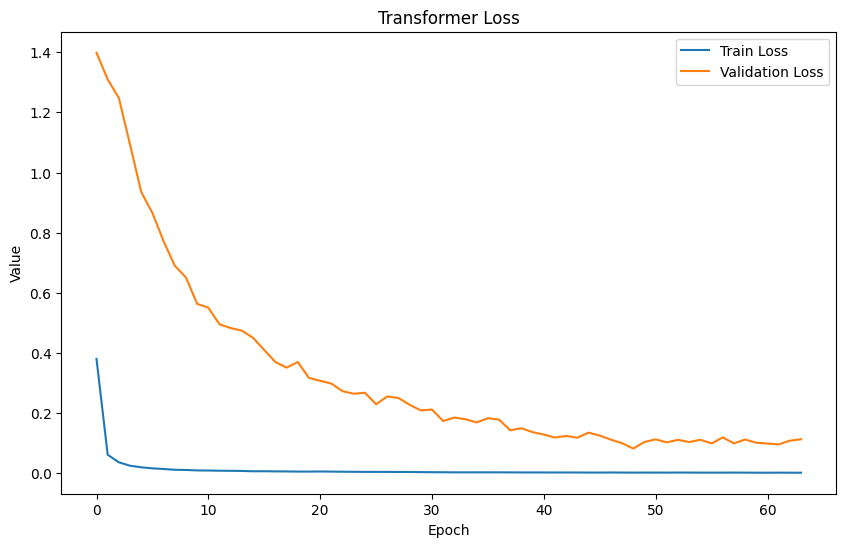

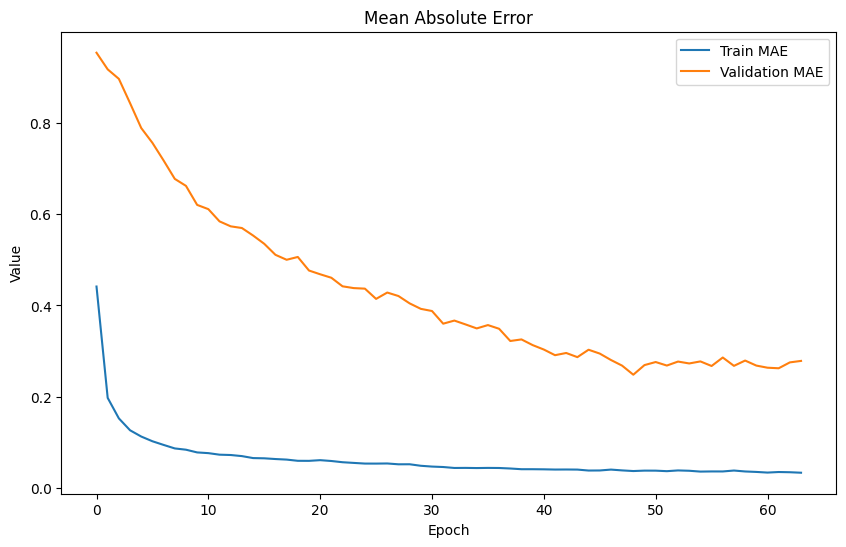

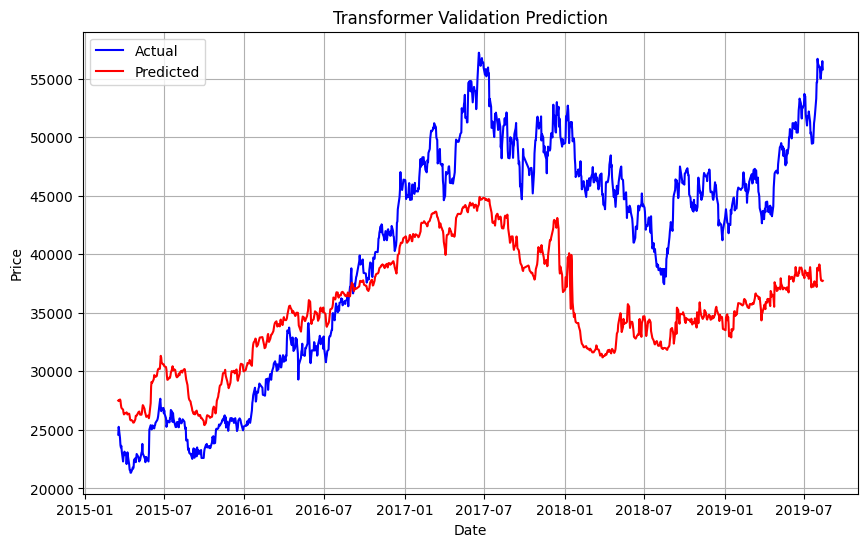

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = y_scaler_int1.inverse_transform(y_pred)
y_val_rev = y_scaler_int1.inverse_transform(y_val)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

# !! Before Outlier+ Selection: Same (2)

In [ ]:
seq_length = 90
x_train, y_train = create_sequences(x_train_same2, y_train_same2, seq_length)
x_val, y_val = create_sequences(x_val_same2, y_val_same2, seq_length)
x_test, y_test = create_sequences(x_test_same2, y_test_same2, seq_length)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.2, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=80, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/80
108/108 - 43s - 394ms/step - loss: 0.1987 - mae: 0.3067 - val_loss: 1.1945 - val_mae: 0.8022
Epoch 2/80
108/108 - 11s - 103ms/step - loss: 0.0331 - mae: 0.1424 - val_loss: 1.1535 - val_mae: 0.7705
Epoch 3/80
108/108 - 1s - 11ms/step - loss: 0.0258 - mae: 0.1248 - val_loss: 1.1479 - val_mae: 0.7246
Epoch 4/80
108/108 - 1s - 11ms/step - loss: 0.0216 - mae: 0.1156 - val_loss: 1.2651 - val_mae: 0.7609
Epoch 5/80
108/108 - 1s - 12ms/step - loss: 0.0183 - mae: 0.1069 - val_loss: 1.3668 - val_mae: 0.7989
Epoch 6/80
108/108 - 1s - 11ms/step - loss: 0.0147 - mae: 0.0947 - val_loss: 1.4580 - val_mae: 0.8176
Epoch 7/80
108/108 - 1s - 10ms/step - loss: 0.0133 - mae: 0.0893 - val_loss: 1.5160 - val_mae: 0.8263
Epoch 8/80
108/108 - 1s - 10ms/step - loss: 0.0131 - mae: 0.0881 - val_loss: 1.6219 - val_mae: 0.8454
Epoch 9/80
108/108 - 1s - 12ms/step - loss: 0.0114 - mae: 0.0827 - val_loss: 1.6072 - val_mae: 0.8254
Epoch 10/80
108/108 - 1s - 10ms/step - loss: 0.0103 - mae: 0.0770 - val_loss: 

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 1.147907386530293
Root Mean Squared Error (RMSE): 1.0714043991557496
Mean Absolute Error (MAE): 0.7246117699844062
R^2 Score: -8.624286933514941

### After Inverse Transform
Mean Squared Error (MSE): 1.147907386530293
Root Mean Squared Error (RMSE): 1.0714043991557496
Mean Absolute Error (MAE): 0.7246117699844062
R^2 Score: -8.624286933514941


<ipython-input-56-fe4f8e784a29>:2: RuntimeWarning: overflow encountered in exp
  y_pred_rev = np.round(np.exp(y_scaler_same2.inverse_transform(y_pred)), 4)
<ipython-input-56-fe4f8e784a29>:3: RuntimeWarning: overflow encountered in exp
  y_val_rev = np.round(np.exp(y_scaler_same2.inverse_transform(y_val)), 4)


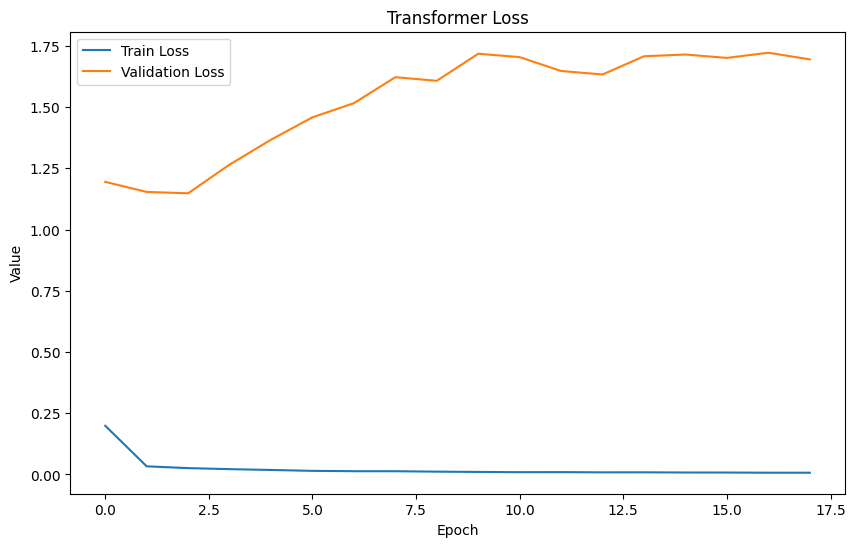

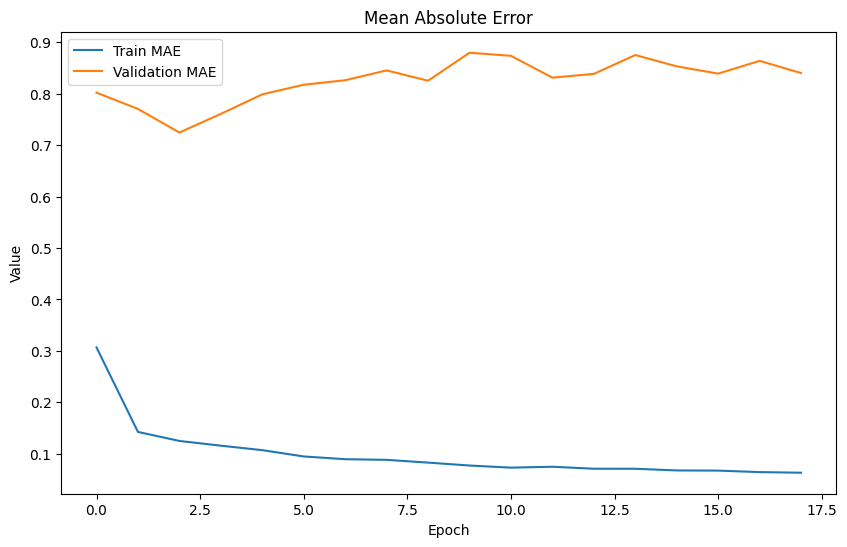

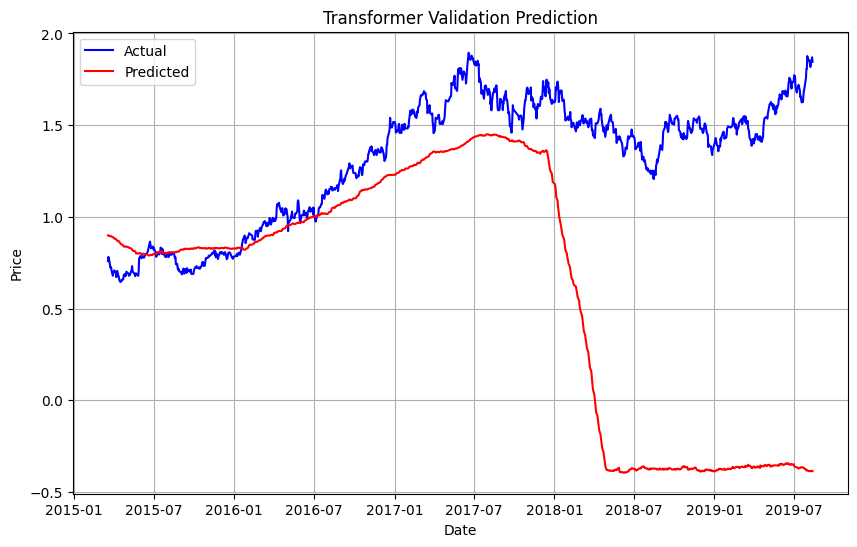

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_same2.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_same2.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val, y_pred)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=2, key_dim=64, ff_dim=64, num_blocks=4, dropout_rate=0.2, lr=0.0008,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=80, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/80
108/108 - 57s - 527ms/step - loss: 0.0665 - mae: 0.1639 - val_loss: 0.4744 - val_mae: 0.4837
Epoch 2/80
108/108 - 2s - 15ms/step - loss: 0.0129 - mae: 0.0866 - val_loss: 0.4602 - val_mae: 0.4520
Epoch 3/80
108/108 - 2s - 20ms/step - loss: 0.0108 - mae: 0.0804 - val_loss: 0.4481 - val_mae: 0.4441
Epoch 4/80
108/108 - 1s - 10ms/step - loss: 0.0095 - mae: 0.0748 - val_loss: 0.4231 - val_mae: 0.4392
Epoch 5/80
108/108 - 1s - 8ms/step - loss: 0.0082 - mae: 0.0693 - val_loss: 0.4331 - val_mae: 0.4323
Epoch 6/80
108/108 - 1s - 7ms/step - loss: 0.0080 - mae: 0.0674 - val_loss: 0.4473 - val_mae: 0.4361
Epoch 7/80
108/108 - 1s - 12ms/step - loss: 0.0067 - mae: 0.0624 - val_loss: 0.4552 - val_mae: 0.4469
Epoch 8/80
108/108 - 1s - 8ms/step - loss: 0.0065 - mae: 0.0613 - val_loss: 0.4248 - val_mae: 0.4458
Epoch 9/80
108/108 - 1s - 7ms/step - loss: 0.0063 - mae: 0.0606 - val_loss: 0.4314 - val_mae: 0.4337
Epoch 10/80
108/108 - 1s - 12ms/step - loss: 0.0054 - mae: 0.0555 - val_loss: 0.4212

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.08543027133703346
Root Mean Squared Error (RMSE): 0.2922845725265592
Mean Absolute Error (MAE): 0.22157297395000042
R^2 Score: 0.2837353833562518

### After Inverse Transform
Mean Squared Error (MSE): 0.08543027133703346
Root Mean Squared Error (RMSE): 0.2922845725265592
Mean Absolute Error (MAE): 0.22157297395000042
R^2 Score: 0.2837353833562518


<ipython-input-58-fe4f8e784a29>:2: RuntimeWarning: overflow encountered in exp
  y_pred_rev = np.round(np.exp(y_scaler_same2.inverse_transform(y_pred)), 4)
<ipython-input-58-fe4f8e784a29>:3: RuntimeWarning: overflow encountered in exp
  y_val_rev = np.round(np.exp(y_scaler_same2.inverse_transform(y_val)), 4)


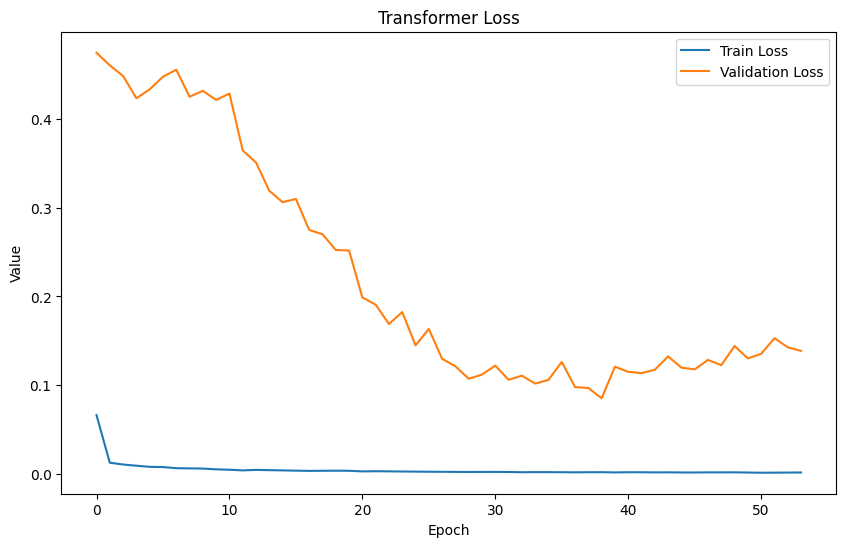

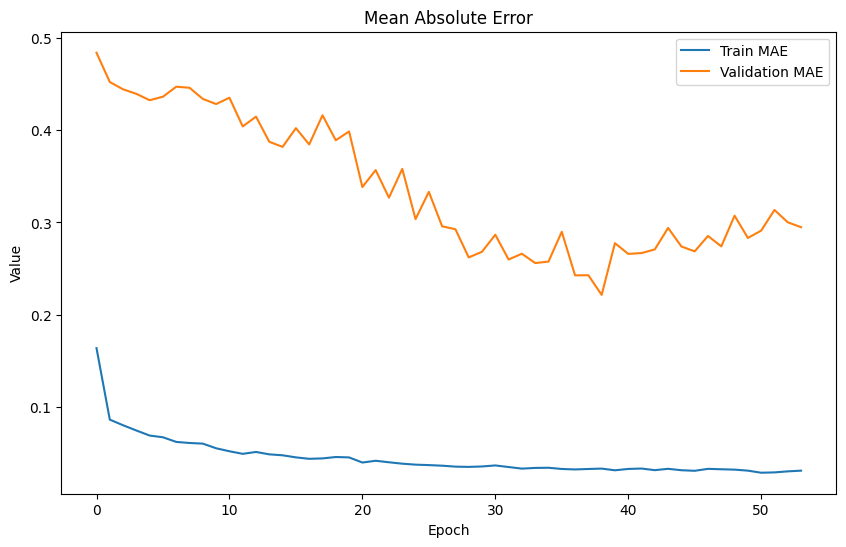

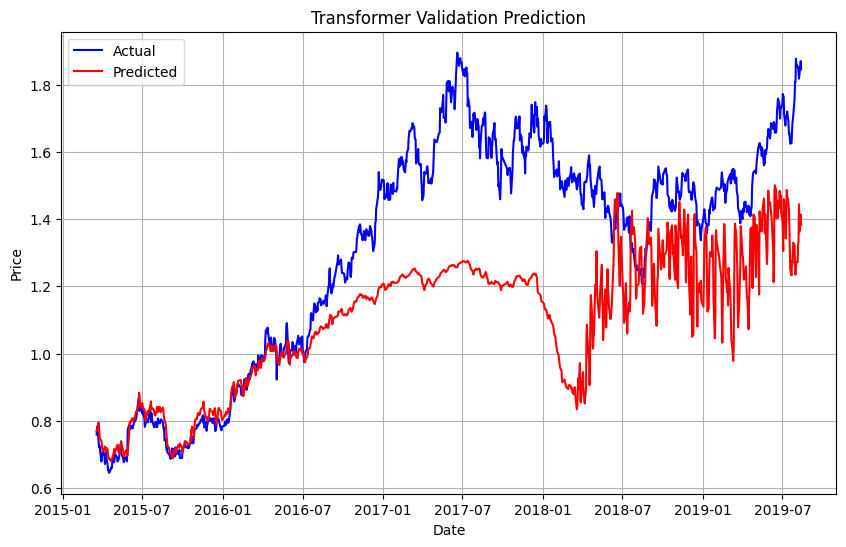

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_same2.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_same2.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val, y_pred)

# !! Before Outlier+Selection: Interp (2)

In [ ]:
seq_length = 90
x_train, y_train = create_sequences(x_train_int2, y_train_int2, seq_length)
x_val, y_val = create_sequences(x_val_int2, y_val_int2, seq_length)
x_test, y_test = create_sequences(x_test_int2, y_test_int2, seq_length)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=32, ff_dim=128, num_blocks=2, dropout_rate=0.2, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=80, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/80
108/108 - 25s - 230ms/step - loss: 0.1844 - mae: 0.3351 - val_loss: 1.8084 - val_mae: 1.1132
Epoch 2/80
108/108 - 2s - 19ms/step - loss: 0.0580 - mae: 0.1908 - val_loss: 1.7585 - val_mae: 1.0781
Epoch 3/80
108/108 - 1s - 5ms/step - loss: 0.0290 - mae: 0.1348 - val_loss: 1.6411 - val_mae: 0.9913
Epoch 4/80
108/108 - 1s - 6ms/step - loss: 0.0207 - mae: 0.1115 - val_loss: 1.5710 - val_mae: 0.9391
Epoch 5/80
108/108 - 1s - 8ms/step - loss: 0.0165 - mae: 0.1000 - val_loss: 1.5430 - val_mae: 0.9044
Epoch 6/80
108/108 - 1s - 13ms/step - loss: 0.0138 - mae: 0.0910 - val_loss: 1.4916 - val_mae: 0.8860
Epoch 7/80
108/108 - 1s - 10ms/step - loss: 0.0138 - mae: 0.0905 - val_loss: 1.3835 - val_mae: 0.8258
Epoch 8/80
108/108 - 2s - 15ms/step - loss: 0.0120 - mae: 0.0847 - val_loss: 1.3529 - val_mae: 0.8197
Epoch 9/80
108/108 - 1s - 8ms/step - loss: 0.0111 - mae: 0.0802 - val_loss: 1.3295 - val_mae: 0.8169
Epoch 10/80
108/108 - 1s - 9ms/step - loss: 0.0106 - mae: 0.0782 - val_loss: 1.2537 

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.27790769021539063
Root Mean Squared Error (RMSE): 0.5271695080478296
Mean Absolute Error (MAE): 0.3294560185542548
R^2 Score: -1.3300340977400955

### After Inverse Transform
Mean Squared Error (MSE): 229228930.58747327
Root Mean Squared Error (RMSE): 15140.308140439985
Mean Absolute Error (MAE): 9461.976746450831
R^2 Score: -1.330034057513605


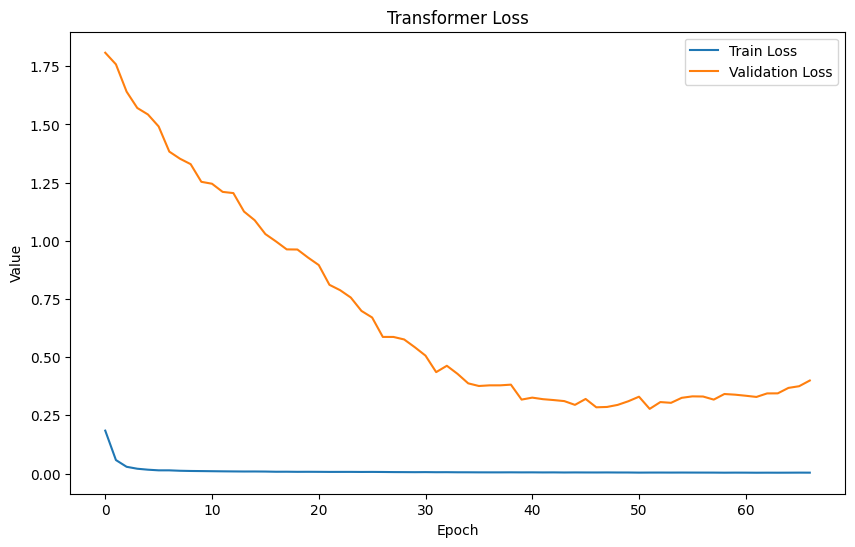

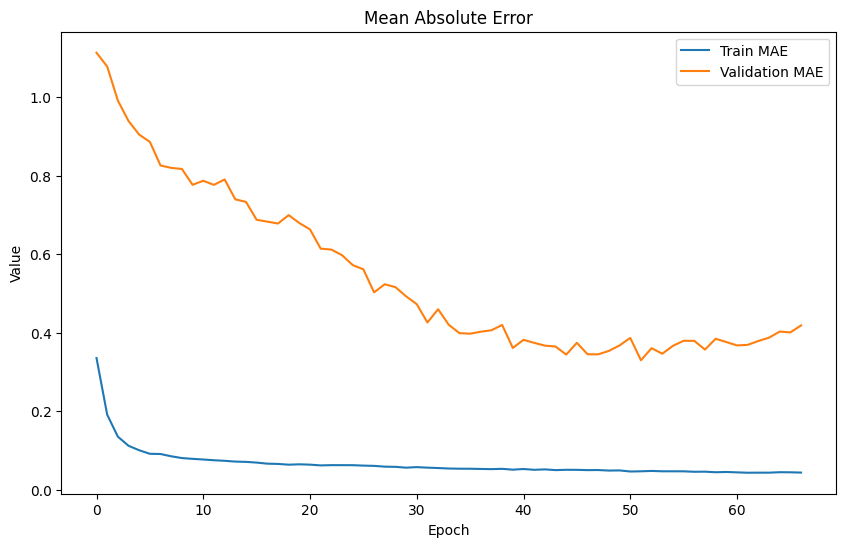

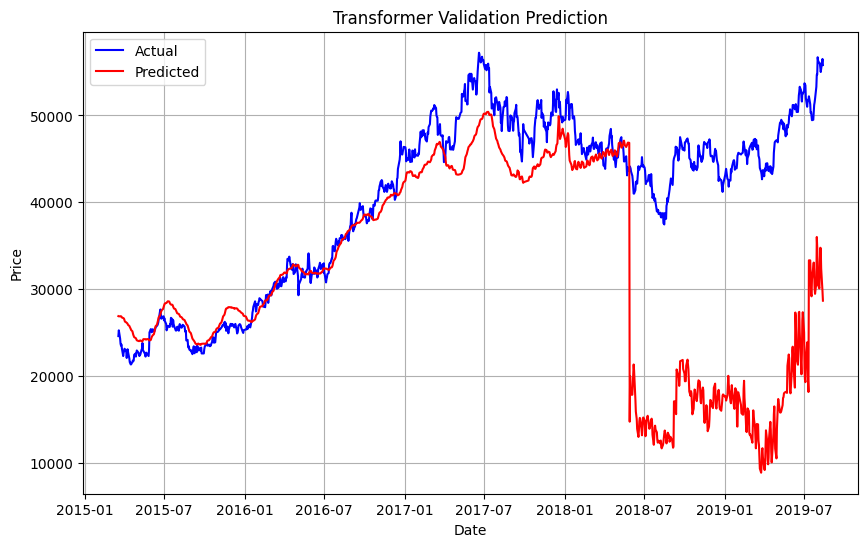

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = y_scaler_int1.inverse_transform(y_pred)
y_val_rev = y_scaler_int1.inverse_transform(y_val)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=2, key_dim=64, ff_dim=64, num_blocks=4, dropout_rate=0.2, lr=0.0003,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=80, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/80
108/108 - 32s - 292ms/step - loss: 0.0746 - mae: 0.2037 - val_loss: 1.0125 - val_mae: 0.6582
Epoch 2/80
108/108 - 1s - 8ms/step - loss: 0.0228 - mae: 0.1162 - val_loss: 1.1736 - val_mae: 0.7104
Epoch 3/80
108/108 - 1s - 12ms/step - loss: 0.0159 - mae: 0.0974 - val_loss: 1.1222 - val_mae: 0.7073
Epoch 4/80
108/108 - 1s - 12ms/step - loss: 0.0132 - mae: 0.0879 - val_loss: 1.0790 - val_mae: 0.6645
Epoch 5/80
108/108 - 1s - 9ms/step - loss: 0.0124 - mae: 0.0856 - val_loss: 0.9194 - val_mae: 0.6262
Epoch 6/80
108/108 - 1s - 9ms/step - loss: 0.0109 - mae: 0.0794 - val_loss: 0.8842 - val_mae: 0.6071
Epoch 7/80
108/108 - 1s - 7ms/step - loss: 0.0102 - mae: 0.0757 - val_loss: 0.9098 - val_mae: 0.6047
Epoch 8/80
108/108 - 1s - 7ms/step - loss: 0.0100 - mae: 0.0759 - val_loss: 0.9597 - val_mae: 0.6416
Epoch 9/80
108/108 - 1s - 12ms/step - loss: 0.0089 - mae: 0.0710 - val_loss: 0.9443 - val_mae: 0.6198
Epoch 10/80
108/108 - 1s - 7ms/step - loss: 0.0085 - mae: 0.0704 - val_loss: 0.9269 -

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.1590111879574175
Root Mean Squared Error (RMSE): 0.398762069356424
Mean Absolute Error (MAE): 0.31539856753977874
R^2 Score: -0.3331818546503236

### After Inverse Transform
Mean Squared Error (MSE): 131158530.13560118
Root Mean Squared Error (RMSE): 11452.446469449276
Mean Absolute Error (MAE): 9058.246710526315
R^2 Score: -0.33318181682463277


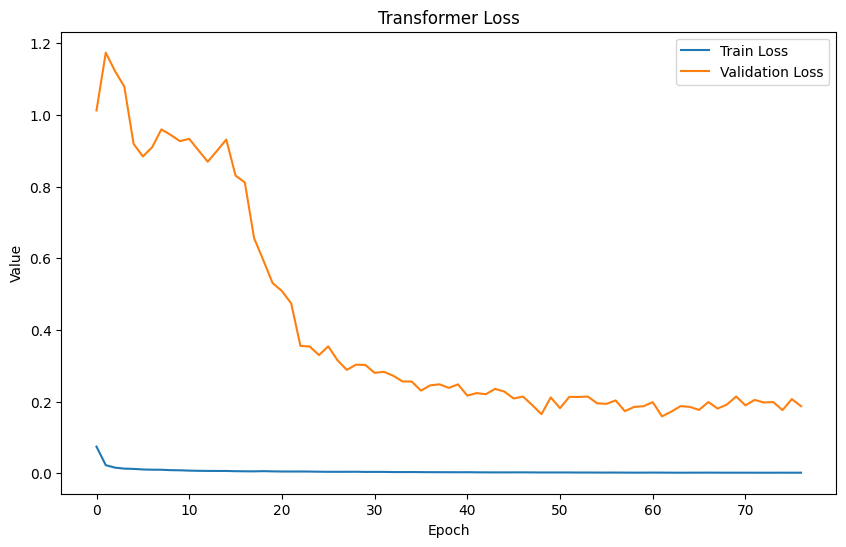

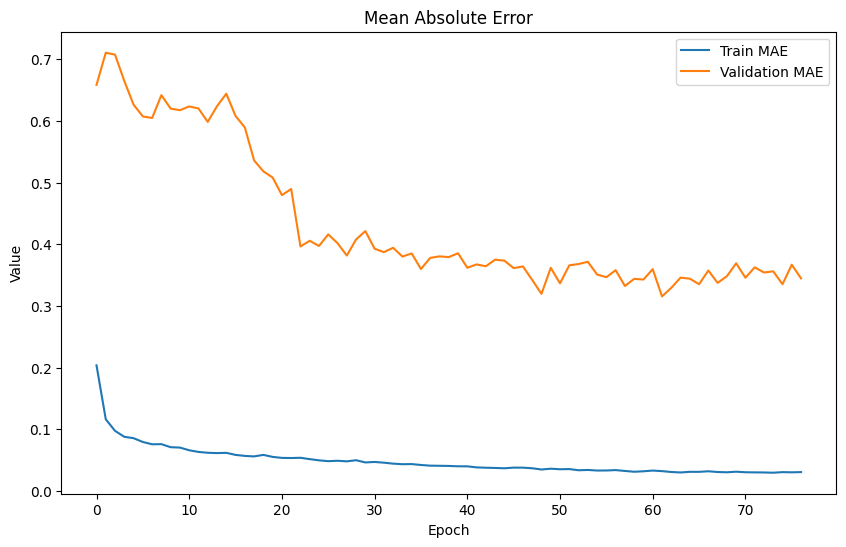

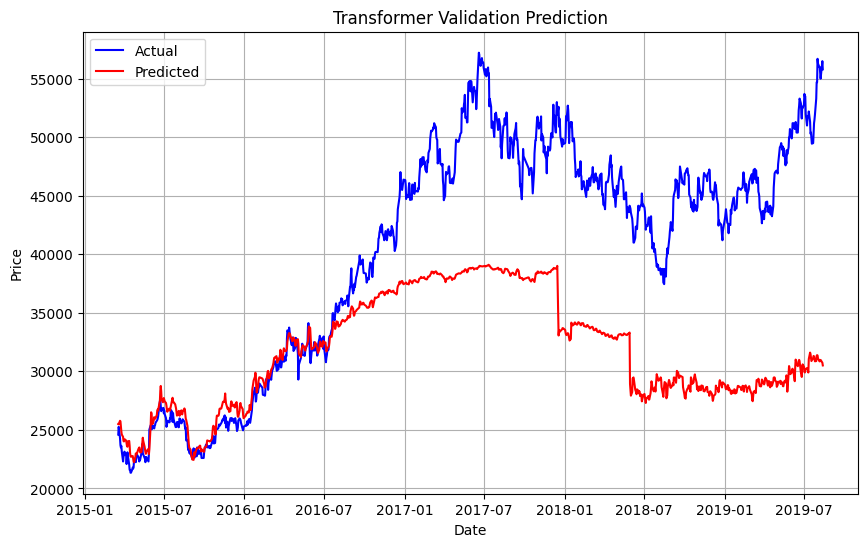

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = y_scaler_int1.inverse_transform(y_pred)
y_val_rev = y_scaler_int1.inverse_transform(y_val)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=2, key_dim=128, ff_dim=64, num_blocks=3, dropout_rate=0.1, lr=0.0005,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=80, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/80
108/108 - 32s - 293ms/step - loss: 0.0427 - mae: 0.1485 - val_loss: 0.3867 - val_mae: 0.4945
Epoch 2/80
108/108 - 17s - 154ms/step - loss: 0.0151 - mae: 0.0937 - val_loss: 0.5417 - val_mae: 0.6081
Epoch 3/80
108/108 - 1s - 7ms/step - loss: 0.0105 - mae: 0.0797 - val_loss: 0.6704 - val_mae: 0.6639
Epoch 4/80
108/108 - 1s - 9ms/step - loss: 0.0080 - mae: 0.0694 - val_loss: 0.6209 - val_mae: 0.5672
Epoch 5/80
108/108 - 1s - 8ms/step - loss: 0.0064 - mae: 0.0614 - val_loss: 0.6948 - val_mae: 0.5934
Epoch 6/80
108/108 - 1s - 9ms/step - loss: 0.0054 - mae: 0.0567 - val_loss: 0.6856 - val_mae: 0.6176
Epoch 7/80
108/108 - 1s - 11ms/step - loss: 0.0046 - mae: 0.0517 - val_loss: 0.6939 - val_mae: 0.6154
Epoch 8/80
108/108 - 1s - 7ms/step - loss: 0.0043 - mae: 0.0495 - val_loss: 0.5472 - val_mae: 0.5507
Epoch 9/80
108/108 - 1s - 11ms/step - loss: 0.0038 - mae: 0.0465 - val_loss: 0.4960 - val_mae: 0.5201
Epoch 10/80
108/108 - 1s - 7ms/step - loss: 0.0035 - mae: 0.0448 - val_loss: 0.4938

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.38667501849766894
Root Mean Squared Error (RMSE): 0.6218319857466879
Mean Absolute Error (MAE): 0.49450898383818526
R^2 Score: -2.2419613042933886

### After Inverse Transform
Mean Squared Error (MSE): 318944394.2535327
Root Mean Squared Error (RMSE): 17859.014369598695
Mean Absolute Error (MAE): 14202.297728026893
R^2 Score: -2.2419612095175427


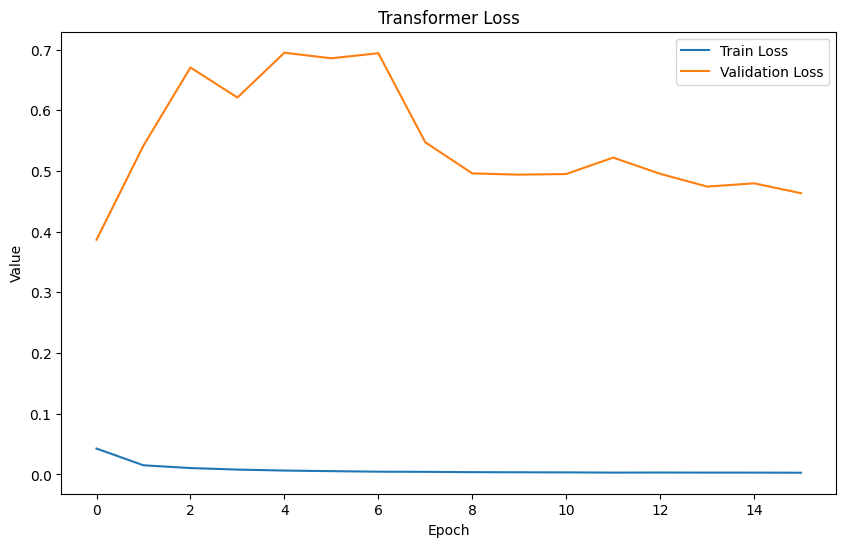

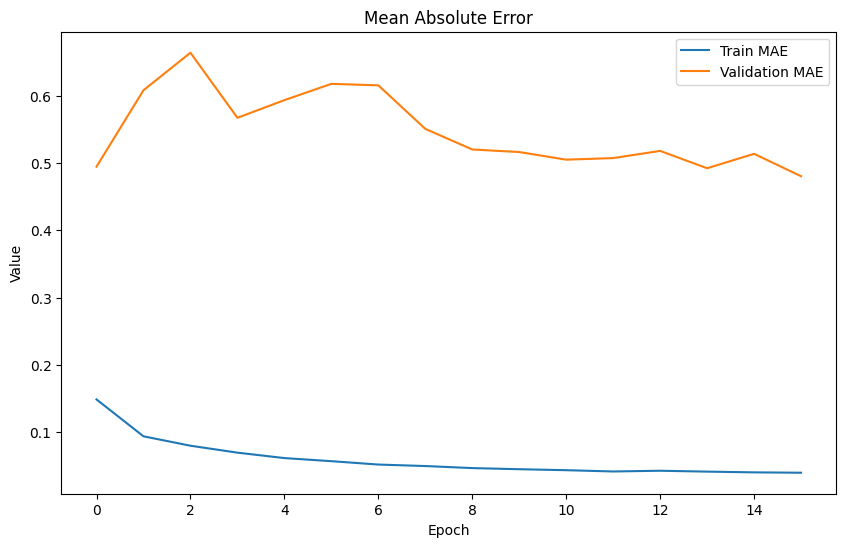

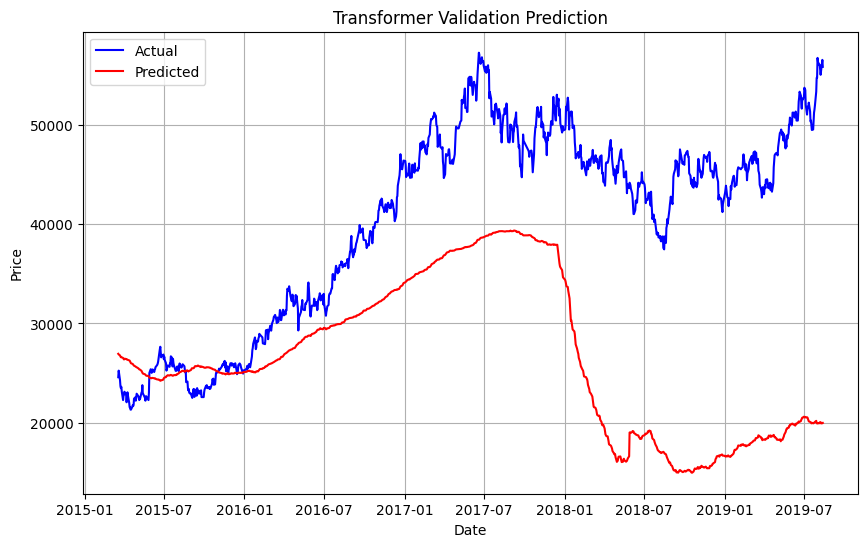

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = y_scaler_int1.inverse_transform(y_pred)
y_val_rev = y_scaler_int1.inverse_transform(y_val)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=128, ff_dim=64, num_blocks=3, dropout_rate=0.3, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=80, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/80
54/54 - 28s - 526ms/step - loss: 0.3323 - mae: 0.4318 - val_loss: 0.1140 - val_mae: 0.2695
Epoch 2/80
54/54 - 2s - 45ms/step - loss: 0.0532 - mae: 0.1824 - val_loss: 0.1755 - val_mae: 0.3560
Epoch 3/80
54/54 - 1s - 23ms/step - loss: 0.0336 - mae: 0.1449 - val_loss: 0.2107 - val_mae: 0.3836
Epoch 4/80
54/54 - 1s - 15ms/step - loss: 0.0283 - mae: 0.1328 - val_loss: 0.2253 - val_mae: 0.3863
Epoch 5/80
54/54 - 1s - 16ms/step - loss: 0.0270 - mae: 0.1302 - val_loss: 0.2580 - val_mae: 0.4084
Epoch 6/80
54/54 - 1s - 21ms/step - loss: 0.0242 - mae: 0.1220 - val_loss: 0.2637 - val_mae: 0.4096
Epoch 7/80
54/54 - 1s - 23ms/step - loss: 0.0245 - mae: 0.1223 - val_loss: 0.3499 - val_mae: 0.4643
Epoch 8/80
54/54 - 1s - 25ms/step - loss: 0.0220 - mae: 0.1159 - val_loss: 0.3502 - val_mae: 0.4559
Epoch 9/80
54/54 - 1s - 22ms/step - loss: 0.0211 - mae: 0.1126 - val_loss: 0.3882 - val_mae: 0.4696
Epoch 10/80
54/54 - 1s - 13ms/step - loss: 0.0209 - mae: 0.1131 - val_loss: 0.4566 - val_mae: 0.50

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.11401446664304006
Root Mean Squared Error (RMSE): 0.33766028289249544
Mean Absolute Error (MAE): 0.2694634186930155
R^2 Score: 0.0440797276677094

### After Inverse Transform
Mean Squared Error (MSE): 94043505.68736202
Root Mean Squared Error (RMSE): 9697.603089803275
Mean Absolute Error (MAE): 7738.98918116632
R^2 Score: 0.04407977397115492


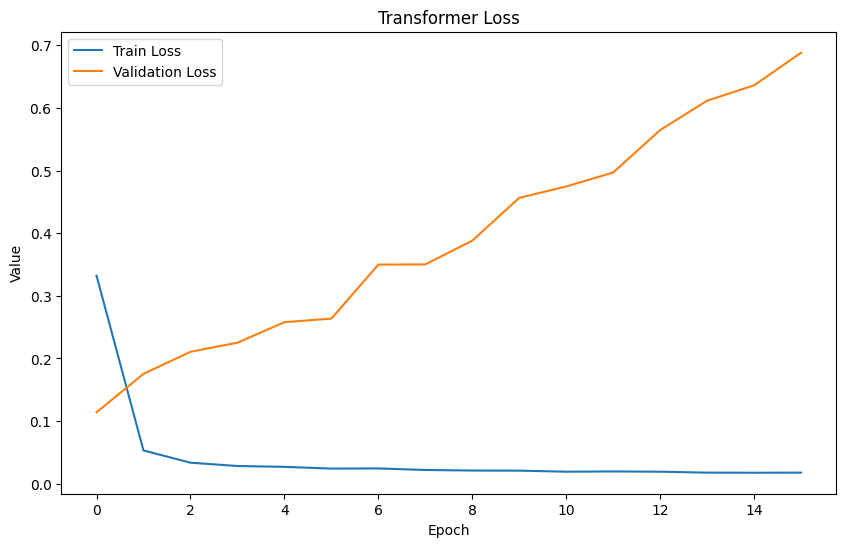

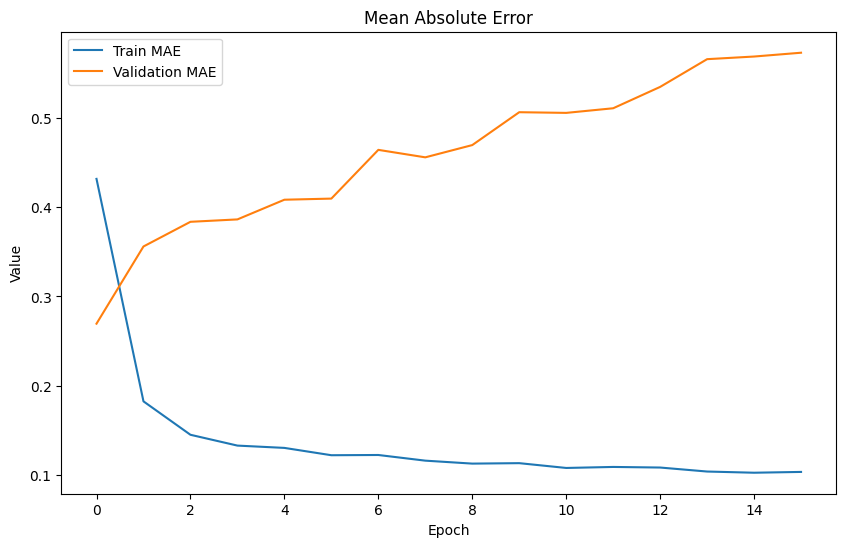

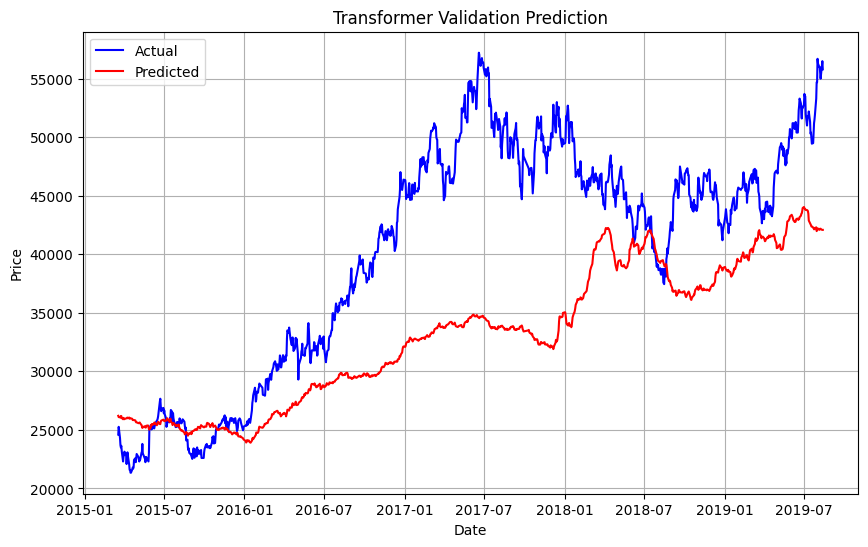

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = y_scaler_int1.inverse_transform(y_pred)
y_val_rev = y_scaler_int1.inverse_transform(y_val)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

# !! Before Outlier+Scailing: Same (3)

In [ ]:
seq_length = 90
x_train, y_train = create_sequences(x_train_same3, y_train_same3, seq_length)
x_val, y_val = create_sequences(x_val_same3, y_val_same3, seq_length)
x_test, y_test = create_sequences(x_test_same3, y_test_same3, seq_length)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=2, key_dim=128, ff_dim=128, num_blocks=2, dropout_rate=0.1, lr=0.0005,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=80, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/80
108/108 - 39s - 363ms/step - loss: 0.1379 - mae: 0.2624 - val_loss: 0.0078 - val_mae: 0.0699
Epoch 2/80
108/108 - 7s - 67ms/step - loss: 0.0214 - mae: 0.1153 - val_loss: 0.0049 - val_mae: 0.0554
Epoch 3/80
108/108 - 1s - 6ms/step - loss: 0.0110 - mae: 0.0822 - val_loss: 0.0177 - val_mae: 0.1189
Epoch 4/80
108/108 - 1s - 5ms/step - loss: 0.0079 - mae: 0.0697 - val_loss: 0.0099 - val_mae: 0.0896
Epoch 5/80
108/108 - 1s - 7ms/step - loss: 0.0063 - mae: 0.0630 - val_loss: 0.0151 - val_mae: 0.1096
Epoch 6/80
108/108 - 1s - 12ms/step - loss: 0.0047 - mae: 0.0539 - val_loss: 0.0207 - val_mae: 0.1262
Epoch 7/80
108/108 - 1s - 12ms/step - loss: 0.0039 - mae: 0.0495 - val_loss: 0.0130 - val_mae: 0.1029
Epoch 8/80
108/108 - 1s - 7ms/step - loss: 0.0038 - mae: 0.0483 - val_loss: 0.0179 - val_mae: 0.1177
Epoch 9/80
108/108 - 1s - 6ms/step - loss: 0.0032 - mae: 0.0446 - val_loss: 0.0178 - val_mae: 0.1171
Epoch 10/80
108/108 - 1s - 6ms/step - loss: 0.0031 - mae: 0.0442 - val_loss: 0.0259 -

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.004888559786984599
Root Mean Squared Error (RMSE): 0.06991823644074983
Mean Absolute Error (MAE): 0.05535799235984459
R^2 Score: 0.6195049093313526

### After Inverse Transform
Mean Squared Error (MSE): 37273159.57393288
Root Mean Squared Error (RMSE): 6105.174819276912
Mean Absolute Error (MAE): 4943.67116264139
R^2 Score: 0.621131019475476


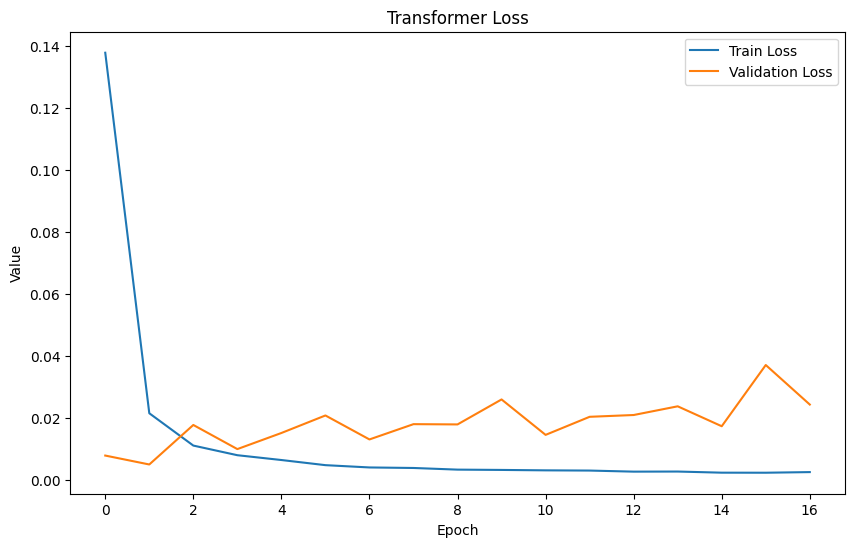

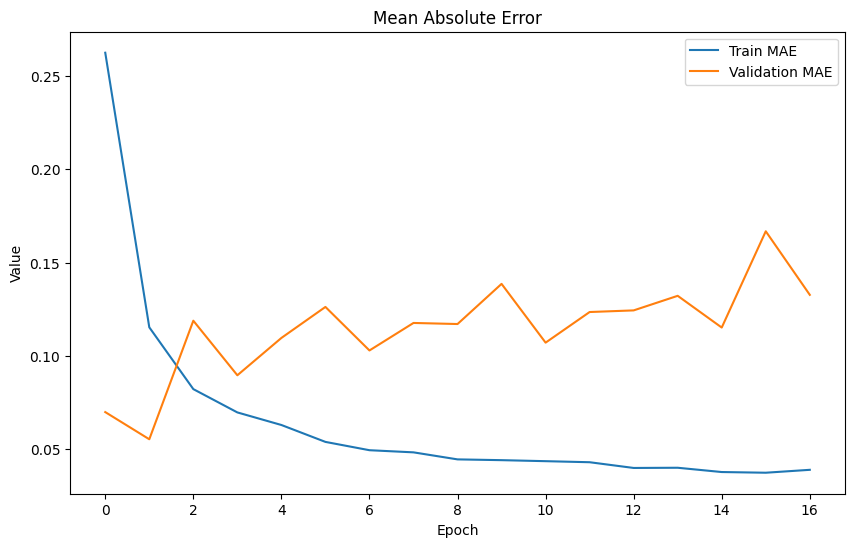

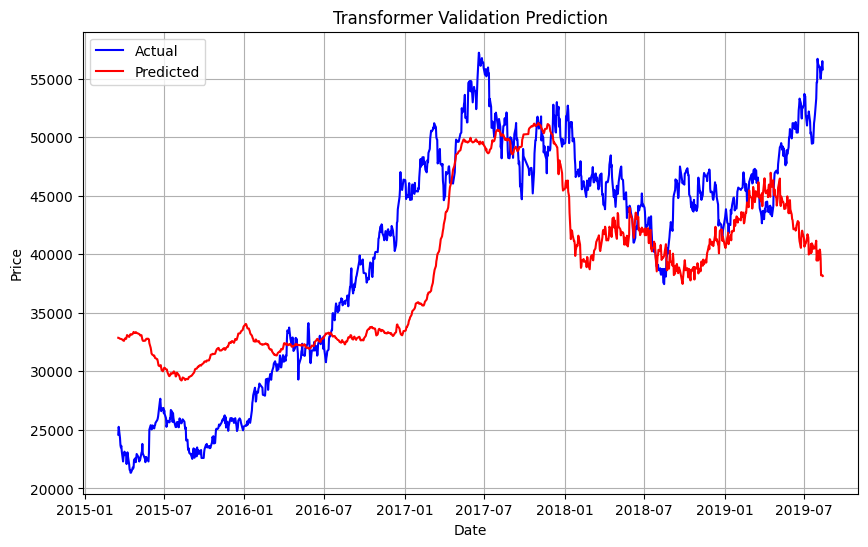

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = y_scaler_same3.inverse_transform(y_pred)
y_val_rev = y_scaler_same3.inverse_transform(y_val)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=2, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.3, lr=0.0008,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=80, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/80
108/108 - 35s - 327ms/step - loss: 0.2878 - mae: 0.3353 - val_loss: 0.0461 - val_mae: 0.1754
Epoch 2/80
108/108 - 15s - 138ms/step - loss: 0.0236 - mae: 0.1217 - val_loss: 0.0250 - val_mae: 0.1405
Epoch 3/80
108/108 - 1s - 9ms/step - loss: 0.0139 - mae: 0.0946 - val_loss: 0.0364 - val_mae: 0.1597
Epoch 4/80
108/108 - 1s - 8ms/step - loss: 0.0111 - mae: 0.0829 - val_loss: 0.0162 - val_mae: 0.1156
Epoch 5/80
108/108 - 1s - 8ms/step - loss: 0.0110 - mae: 0.0831 - val_loss: 0.0306 - val_mae: 0.1479
Epoch 6/80
108/108 - 1s - 12ms/step - loss: 0.0099 - mae: 0.0792 - val_loss: 0.0147 - val_mae: 0.1089
Epoch 7/80
108/108 - 1s - 8ms/step - loss: 0.0080 - mae: 0.0698 - val_loss: 0.0134 - val_mae: 0.1031
Epoch 8/80
108/108 - 1s - 8ms/step - loss: 0.0087 - mae: 0.0740 - val_loss: 0.0130 - val_mae: 0.1041
Epoch 9/80
108/108 - 1s - 12ms/step - loss: 0.0074 - mae: 0.0681 - val_loss: 0.0118 - val_mae: 0.0976
Epoch 10/80
108/108 - 1s - 8ms/step - loss: 0.0067 - mae: 0.0636 - val_loss: 0.0132

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.0108902254864324
Root Mean Squared Error (RMSE): 0.10435624315982442
Mean Absolute Error (MAE): 0.09620395879854206
R^2 Score: 0.1523725771147728

### After Inverse Transform
Mean Squared Error (MSE): 0.06383037792990216
Root Mean Squared Error (RMSE): 0.2526467453380355
Mean Absolute Error (MAE): 0.2329100222933554
R^2 Score: 0.1523726880877676


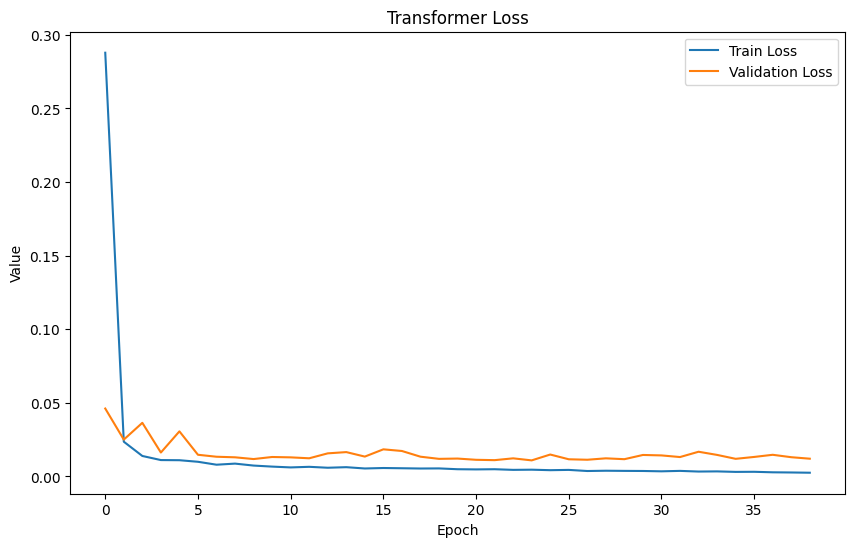

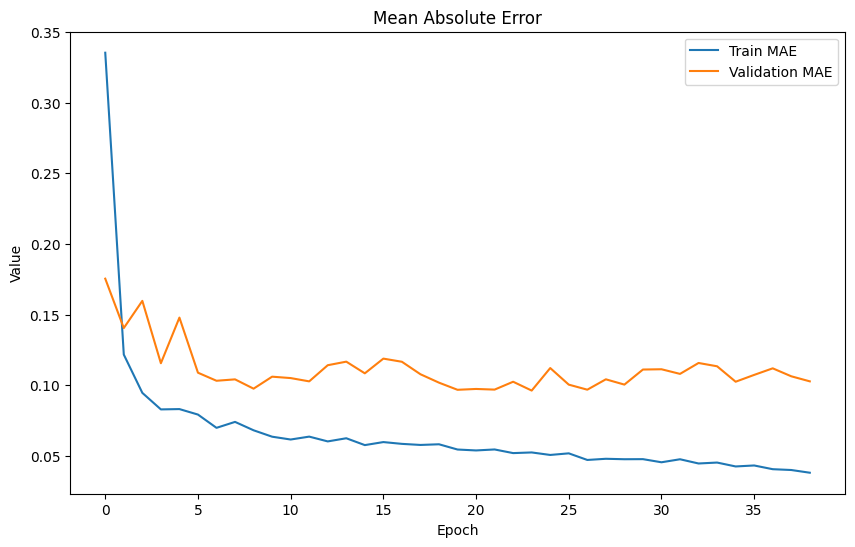

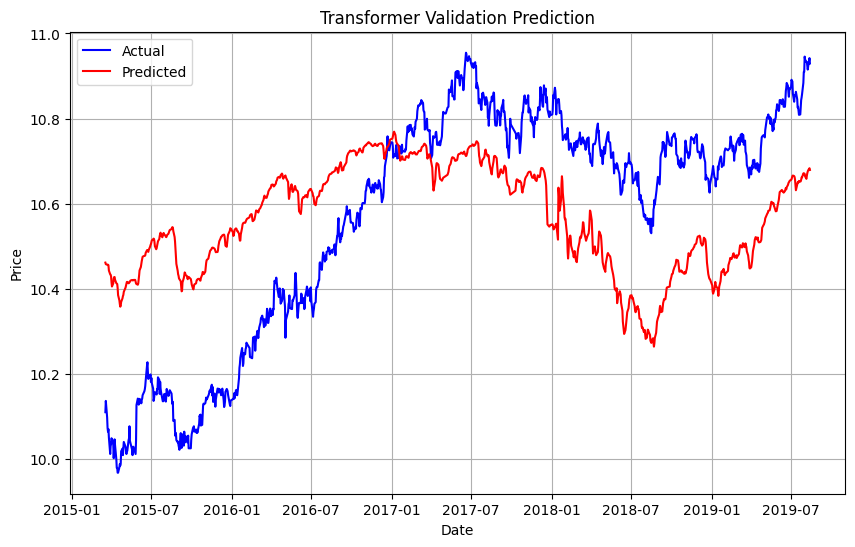

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = y_scaler_same3.inverse_transform(y_pred)
y_val_rev = y_scaler_same3.inverse_transform(y_val)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=2, key_dim=64, ff_dim=64, num_blocks=2, dropout_rate=0.3, lr=0.001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=80, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/80
108/108 - 24s - 224ms/step - loss: 0.2932 - mae: 0.3720 - val_loss: 0.1145 - val_mae: 0.2830
Epoch 2/80
108/108 - 1s - 14ms/step - loss: 0.0325 - mae: 0.1418 - val_loss: 0.0483 - val_mae: 0.1965
Epoch 3/80
108/108 - 1s - 10ms/step - loss: 0.0161 - mae: 0.1021 - val_loss: 0.0338 - val_mae: 0.1618
Epoch 4/80
108/108 - 1s - 5ms/step - loss: 0.0132 - mae: 0.0907 - val_loss: 0.0209 - val_mae: 0.1320
Epoch 5/80
108/108 - 1s - 5ms/step - loss: 0.0106 - mae: 0.0821 - val_loss: 0.0307 - val_mae: 0.1561
Epoch 6/80
108/108 - 1s - 6ms/step - loss: 0.0104 - mae: 0.0813 - val_loss: 0.0319 - val_mae: 0.1539
Epoch 7/80
108/108 - 0s - 5ms/step - loss: 0.0091 - mae: 0.0759 - val_loss: 0.0312 - val_mae: 0.1531
Epoch 8/80
108/108 - 0s - 5ms/step - loss: 0.0084 - mae: 0.0722 - val_loss: 0.0294 - val_mae: 0.1479
Epoch 9/80
108/108 - 1s - 6ms/step - loss: 0.0072 - mae: 0.0674 - val_loss: 0.0236 - val_mae: 0.1375
Epoch 10/80
108/108 - 1s - 5ms/step - loss: 0.0075 - mae: 0.0677 - val_loss: 0.0251 - 

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.01822514118548338
Root Mean Squared Error (RMSE): 0.13500052290818498
Mean Absolute Error (MAE): 0.12225545261165367
R^2 Score: -0.41853164326273706

### After Inverse Transform
Mean Squared Error (MSE): 0.10682218737150131
Root Mean Squared Error (RMSE): 0.3268366371316125
Mean Absolute Error (MAE): 0.2959807851044271
R^2 Score: -0.41853152794624626


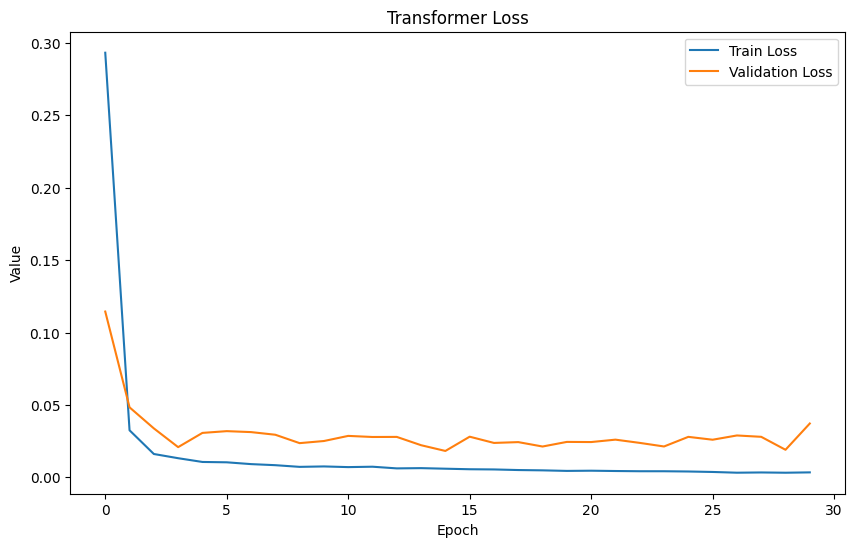

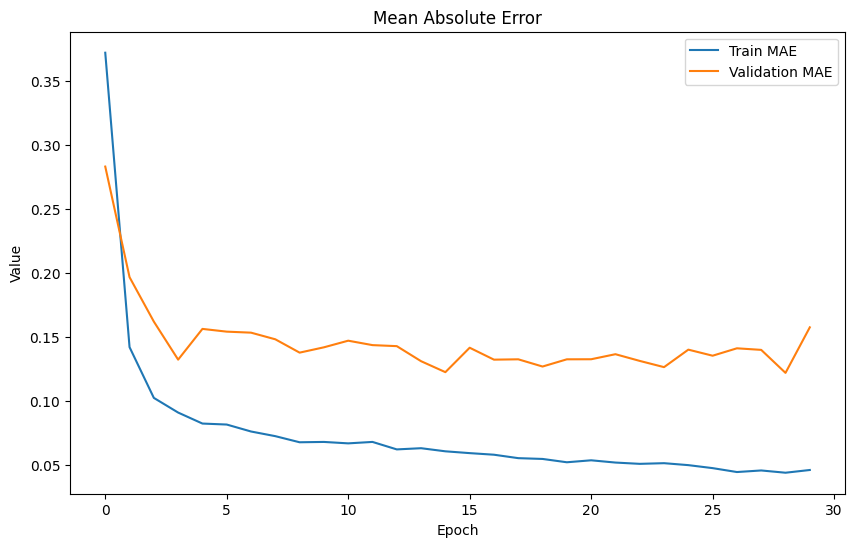

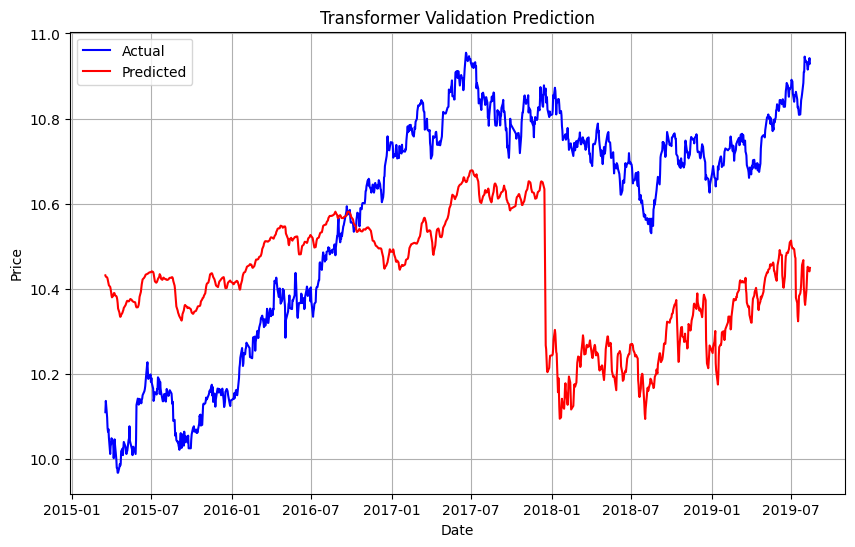

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = y_scaler_same3.inverse_transform(y_pred)
y_val_rev = y_scaler_same3.inverse_transform(y_val)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

# !! Before Outlier+Scailing: Interp (3)

In [ ]:
seq_length = 90
x_train, y_train = create_sequences(x_train_int3, y_train_int3, seq_length)
x_val, y_val = create_sequences(x_val_int3, y_val_int3, seq_length)
x_test, y_test = create_sequences(x_test_int3, y_test_int3, seq_length)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=2, key_dim=16, ff_dim=64, num_blocks=4, dropout_rate=0.1, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=80, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/80
108/108 - 46s - 424ms/step - loss: 0.3216 - mae: 0.4162 - val_loss: 0.0234 - val_mae: 0.1347
Epoch 2/80
108/108 - 1s - 8ms/step - loss: 0.0934 - mae: 0.2411 - val_loss: 0.0272 - val_mae: 0.1444
Epoch 3/80
108/108 - 1s - 10ms/step - loss: 0.0573 - mae: 0.1901 - val_loss: 0.0299 - val_mae: 0.1529
Epoch 4/80
108/108 - 1s - 12ms/step - loss: 0.0401 - mae: 0.1563 - val_loss: 0.0282 - val_mae: 0.1482
Epoch 5/80
108/108 - 1s - 6ms/step - loss: 0.0293 - mae: 0.1359 - val_loss: 0.0290 - val_mae: 0.1512
Epoch 6/80
108/108 - 1s - 12ms/step - loss: 0.0213 - mae: 0.1146 - val_loss: 0.0264 - val_mae: 0.1412
Epoch 7/80
108/108 - 1s - 6ms/step - loss: 0.0166 - mae: 0.1014 - val_loss: 0.0248 - val_mae: 0.1378
Epoch 8/80
108/108 - 1s - 6ms/step - loss: 0.0138 - mae: 0.0921 - val_loss: 0.0253 - val_mae: 0.1436
Epoch 9/80
108/108 - 1s - 12ms/step - loss: 0.0110 - mae: 0.0824 - val_loss: 0.0278 - val_mae: 0.1502
Epoch 10/80
108/108 - 1s - 7ms/step - loss: 0.0101 - mae: 0.0797 - val_loss: 0.0201 

34/34 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.010975738959808298
Root Mean Squared Error (RMSE): 0.104765161002159
Mean Absolute Error (MAE): 0.09665334564372938
R^2 Score: 0.145716740176421

### After Inverse Transform
Mean Squared Error (MSE): 93808727.72039025
Root Mean Squared Error (RMSE): 9685.490577166975
Mean Absolute Error (MAE): 9008.711382949561
R^2 Score: 0.04646621209480739


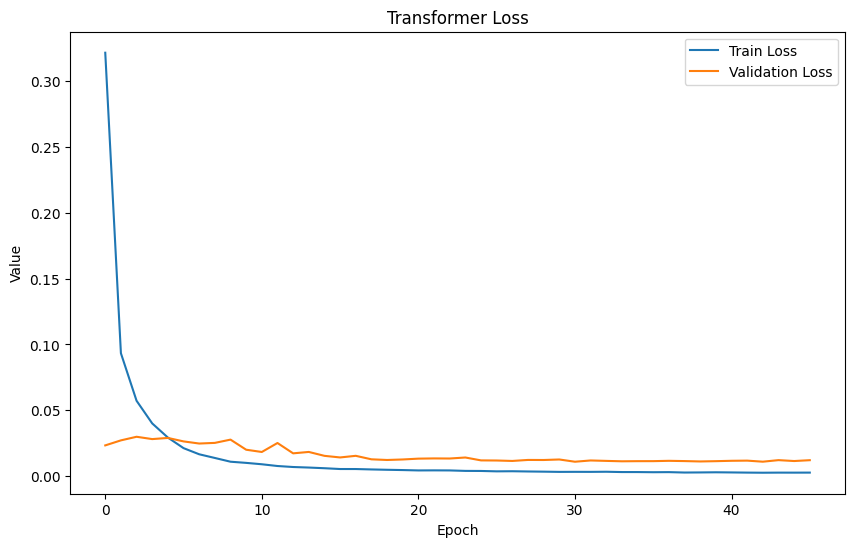

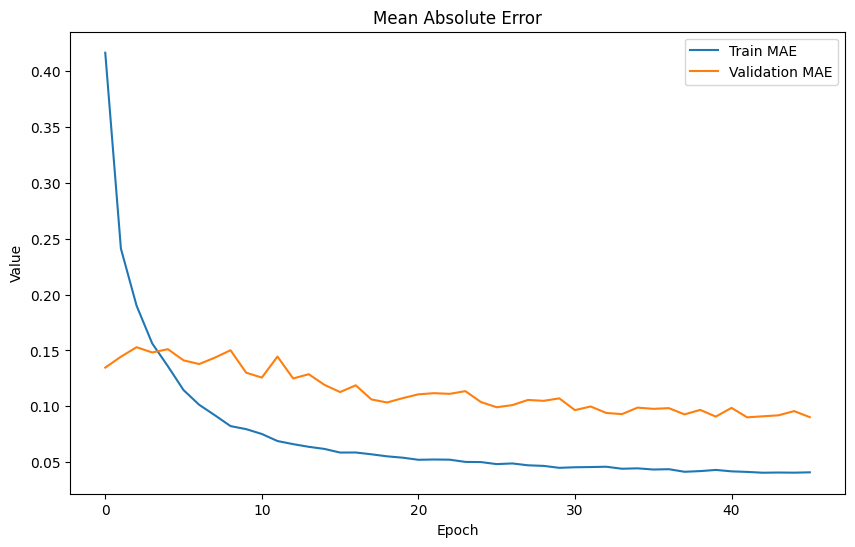

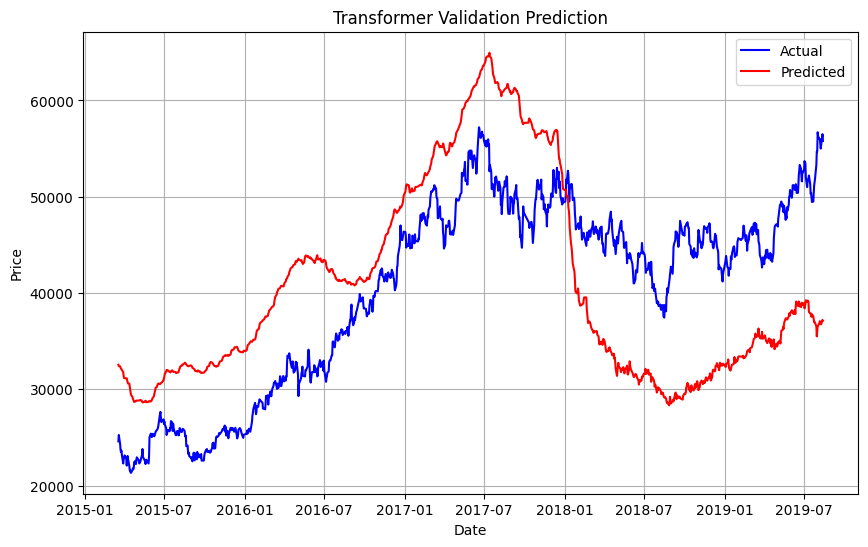

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int3.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int3.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=2, key_dim=128, ff_dim=64, num_blocks=2, dropout_rate=0.1, lr=0.0003,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=80, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/80
108/108 - 23s - 214ms/step - loss: 0.1773 - mae: 0.2962 - val_loss: 0.1095 - val_mae: 0.2733
Epoch 2/80
108/108 - 3s - 27ms/step - loss: 0.0343 - mae: 0.1441 - val_loss: 0.1272 - val_mae: 0.2941
Epoch 3/80
108/108 - 1s - 11ms/step - loss: 0.0182 - mae: 0.1053 - val_loss: 0.1410 - val_mae: 0.3079
Epoch 4/80
108/108 - 1s - 7ms/step - loss: 0.0115 - mae: 0.0851 - val_loss: 0.1227 - val_mae: 0.2931
Epoch 5/80
108/108 - 1s - 10ms/step - loss: 0.0094 - mae: 0.0761 - val_loss: 0.1177 - val_mae: 0.2838
Epoch 6/80
108/108 - 1s - 6ms/step - loss: 0.0070 - mae: 0.0670 - val_loss: 0.1180 - val_mae: 0.2801
Epoch 7/80
108/108 - 1s - 6ms/step - loss: 0.0066 - mae: 0.0650 - val_loss: 0.0797 - val_mae: 0.2415
Epoch 8/80
108/108 - 1s - 5ms/step - loss: 0.0053 - mae: 0.0574 - val_loss: 0.0898 - val_mae: 0.2456
Epoch 9/80
108/108 - 1s - 6ms/step - loss: 0.0044 - mae: 0.0525 - val_loss: 0.0935 - val_mae: 0.2494
Epoch 10/80
108/108 - 1s - 6ms/step - loss: 0.0044 - mae: 0.0532 - val_loss: 0.0797 -

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.027866973346810327
Root Mean Squared Error (RMSE): 0.16693403891001476
Mean Absolute Error (MAE): 0.14316720874855476
R^2 Score: -1.1689918937855022

### After Inverse Transform
Mean Squared Error (MSE): 206439589.43035293
Root Mean Squared Error (RMSE): 14368.00575690144
Mean Absolute Error (MAE): 12303.318563163666
R^2 Score: -1.098388161385655


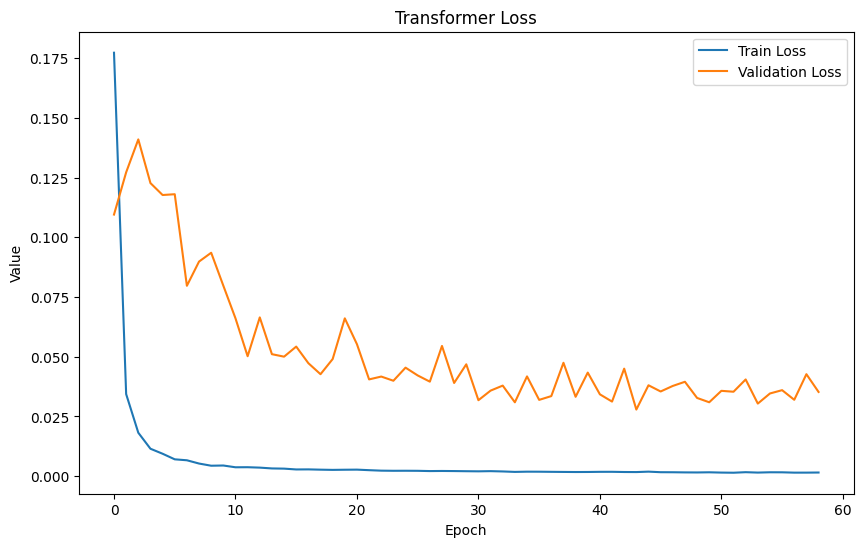

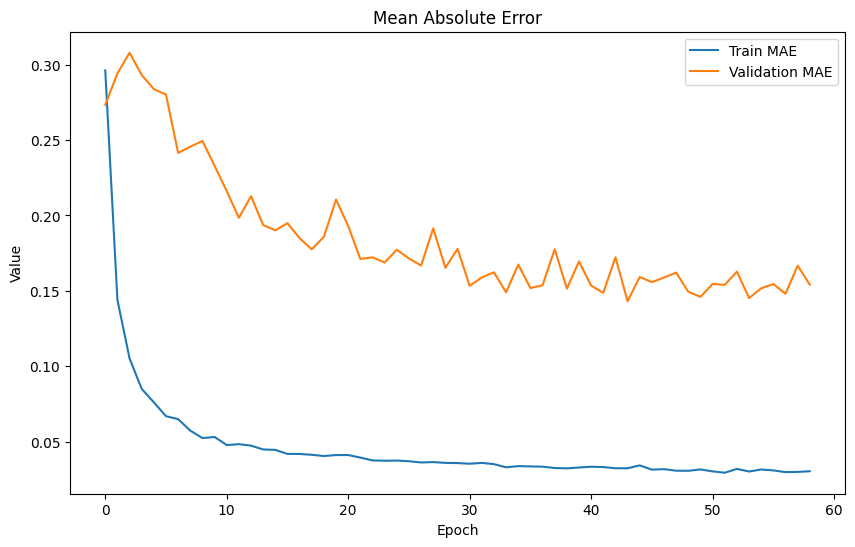

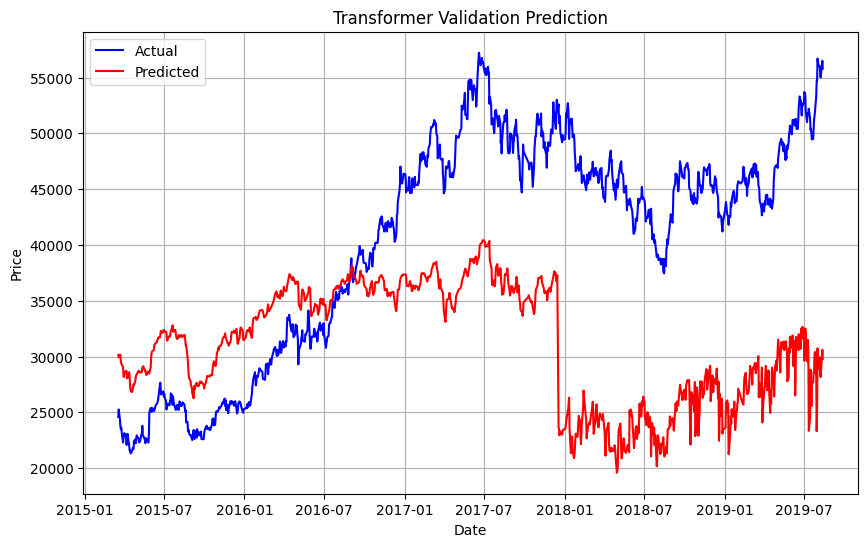

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int3.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int3.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=32, ff_dim=32, num_blocks=3, dropout_rate=0.2, lr=0.0003,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=80, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/80
108/108 - 34s - 316ms/step - loss: 0.1742 - mae: 0.3024 - val_loss: 0.0802 - val_mae: 0.2671
Epoch 2/80
108/108 - 1s - 9ms/step - loss: 0.0306 - mae: 0.1387 - val_loss: 0.0287 - val_mae: 0.1561
Epoch 3/80
108/108 - 1s - 8ms/step - loss: 0.0186 - mae: 0.1085 - val_loss: 0.0290 - val_mae: 0.1300
Epoch 4/80
108/108 - 1s - 10ms/step - loss: 0.0144 - mae: 0.0949 - val_loss: 0.0299 - val_mae: 0.1190
Epoch 5/80
108/108 - 1s - 7ms/step - loss: 0.0124 - mae: 0.0886 - val_loss: 0.0181 - val_mae: 0.1263
Epoch 6/80
108/108 - 1s - 6ms/step - loss: 0.0097 - mae: 0.0788 - val_loss: 0.0181 - val_mae: 0.1193
Epoch 7/80
108/108 - 1s - 12ms/step - loss: 0.0082 - mae: 0.0722 - val_loss: 0.0128 - val_mae: 0.0991
Epoch 8/80
108/108 - 1s - 11ms/step - loss: 0.0077 - mae: 0.0693 - val_loss: 0.0127 - val_mae: 0.0870
Epoch 9/80
108/108 - 1s - 12ms/step - loss: 0.0074 - mae: 0.0689 - val_loss: 0.0145 - val_mae: 0.1124
Epoch 10/80
108/108 - 1s - 6ms/step - loss: 0.0072 - mae: 0.0678 - val_loss: 0.0148 

34/34 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.00807463750007222
Root Mean Squared Error (RMSE): 0.08985898675186707
Mean Absolute Error (MAE): 0.08165442671158941
R^2 Score: 0.3715204351419913

### After Inverse Transform
Mean Squared Error (MSE): 66189700.32639255
Root Mean Squared Error (RMSE): 8135.705275290677
Mean Absolute Error (MAE): 7433.077127697946
R^2 Score: 0.3272042249559667


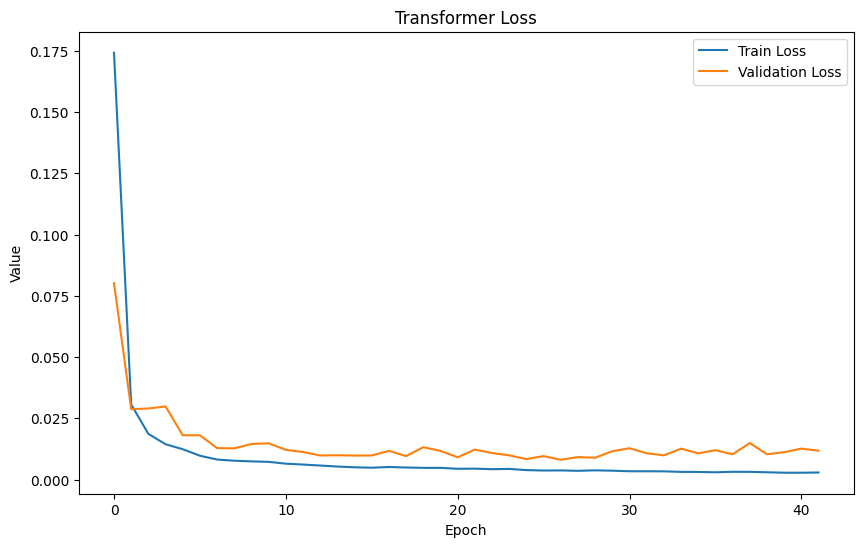

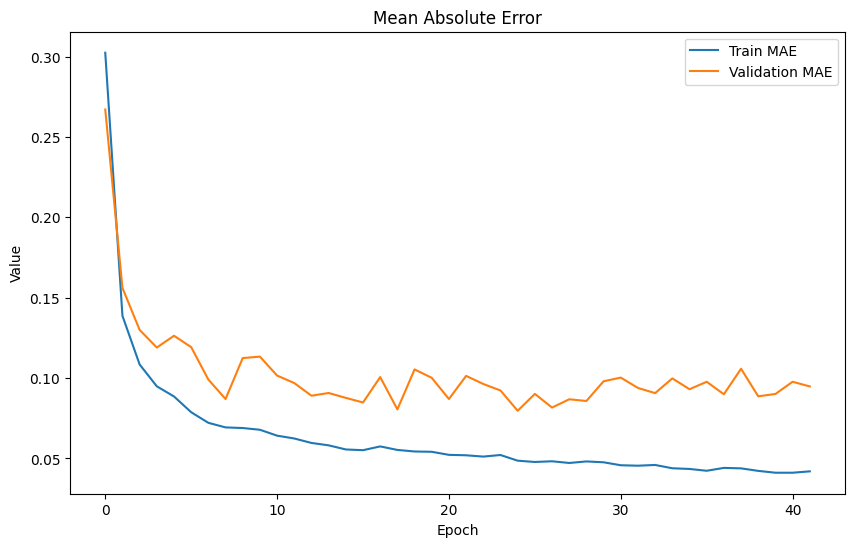

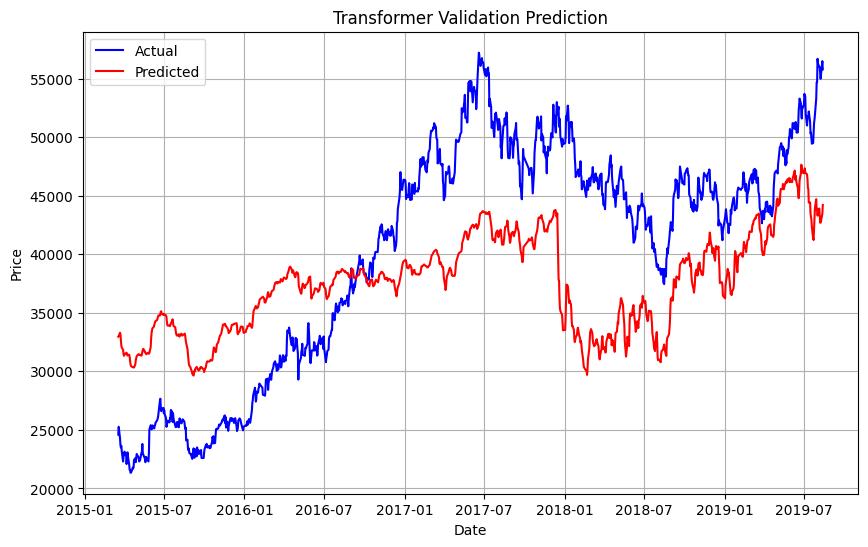

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int3.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int3.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

# !! Before Outlier+Scailing+Selection: Interp (4)

In [ ]:
seq_length = 90
x_train, y_train = create_sequences(x_train_int4, y_train_int4, seq_length)
x_val, y_val = create_sequences(x_val_int4, y_val_int4, seq_length)
x_test, y_test = create_sequences(x_test_int4, y_test_int4, seq_length)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=64, ff_dim=128, num_blocks=2, dropout_rate=0.1, lr=0.0002,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=80, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/80
108/108 - 23s - 212ms/step - loss: 0.2658 - mae: 0.3524 - val_loss: 0.3378 - val_mae: 0.4859
Epoch 2/80
108/108 - 1s - 6ms/step - loss: 0.0340 - mae: 0.1405 - val_loss: 0.3896 - val_mae: 0.4699
Epoch 3/80
108/108 - 1s - 5ms/step - loss: 0.0217 - mae: 0.1119 - val_loss: 0.3936 - val_mae: 0.4528
Epoch 4/80
108/108 - 1s - 6ms/step - loss: 0.0175 - mae: 0.1019 - val_loss: 0.3741 - val_mae: 0.4301
Epoch 5/80
108/108 - 1s - 5ms/step - loss: 0.0146 - mae: 0.0932 - val_loss: 0.3035 - val_mae: 0.3786
Epoch 6/80
108/108 - 1s - 5ms/step - loss: 0.0126 - mae: 0.0876 - val_loss: 0.3302 - val_mae: 0.4109
Epoch 7/80
108/108 - 1s - 6ms/step - loss: 0.0108 - mae: 0.0812 - val_loss: 0.2718 - val_mae: 0.3575
Epoch 8/80
108/108 - 1s - 7ms/step - loss: 0.0103 - mae: 0.0788 - val_loss: 0.2366 - val_mae: 0.3274
Epoch 9/80
108/108 - 1s - 6ms/step - loss: 0.0094 - mae: 0.0747 - val_loss: 0.2396 - val_mae: 0.3375
Epoch 10/80
108/108 - 1s - 7ms/step - loss: 0.0087 - mae: 0.0729 - val_loss: 0.2017 - va

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.043217595169986876
Root Mean Squared Error (RMSE): 0.2078884199997366
Mean Absolute Error (MAE): 0.14243329043463593
R^2 Score: -2.363788827225989

### After Inverse Transform
Mean Squared Error (MSE): 242489312.89957184
Root Mean Squared Error (RMSE): 15572.06835650203
Mean Absolute Error (MAE): 10882.923024692695
R^2 Score: -1.4648213303227426


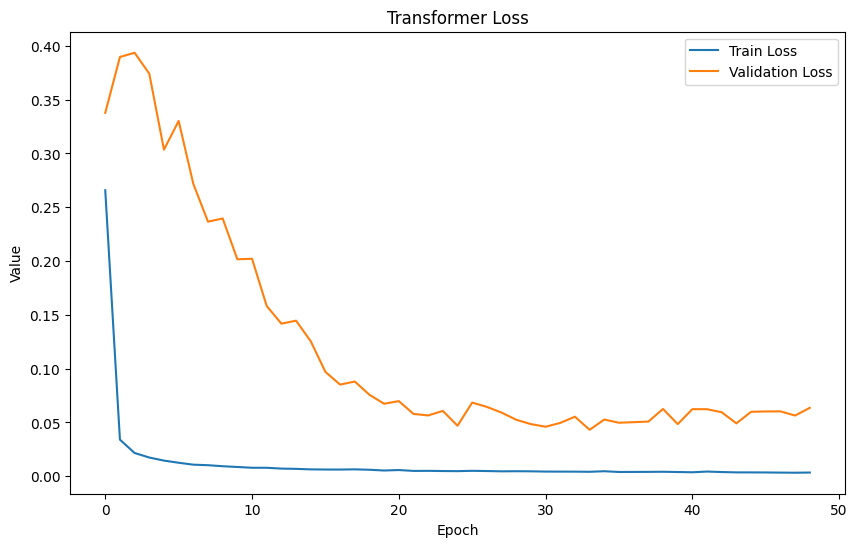

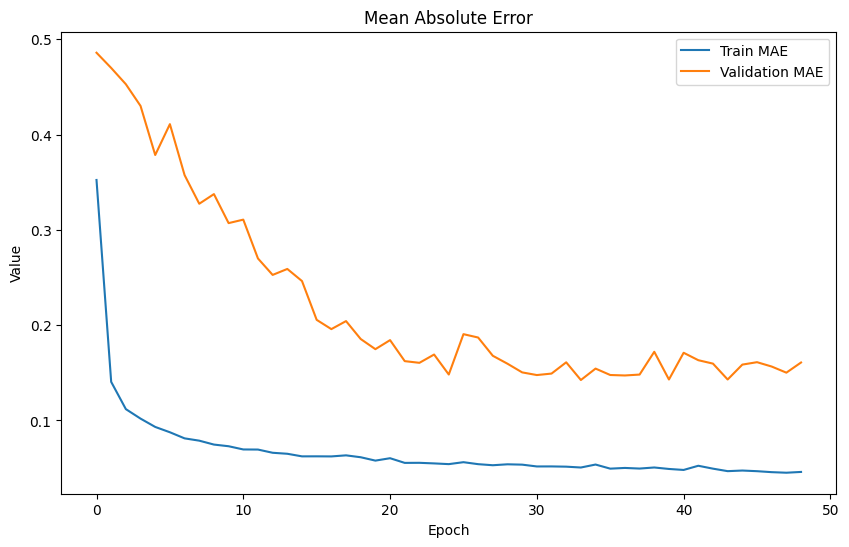

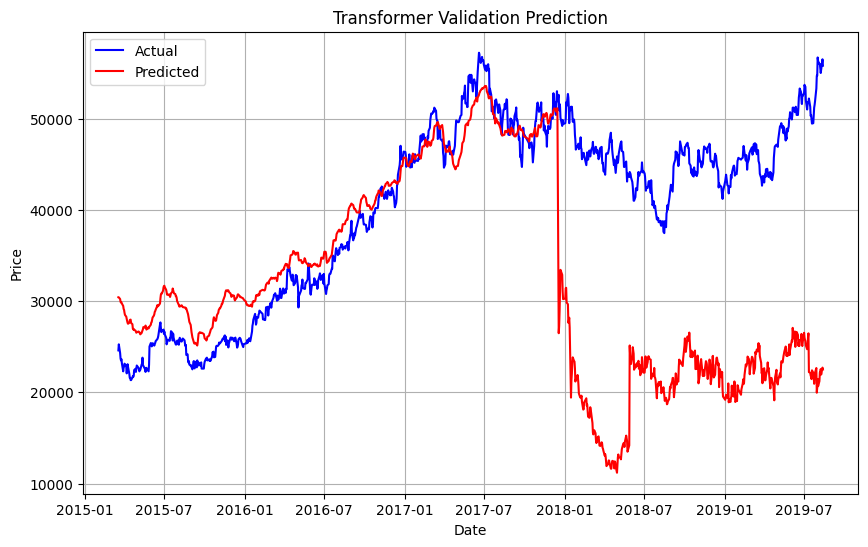

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int4.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int4.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=2, key_dim=64, ff_dim=32, num_blocks=5, dropout_rate=0.1, lr=0.0004,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=80, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/80
108/108 - 48s - 447ms/step - loss: 0.1274 - mae: 0.2510 - val_loss: 0.1420 - val_mae: 0.2659
Epoch 2/80
108/108 - 1s - 11ms/step - loss: 0.0227 - mae: 0.1161 - val_loss: 0.3063 - val_mae: 0.3754
Epoch 3/80
108/108 - 1s - 11ms/step - loss: 0.0133 - mae: 0.0920 - val_loss: 0.1879 - val_mae: 0.2767
Epoch 4/80
108/108 - 1s - 11ms/step - loss: 0.0094 - mae: 0.0762 - val_loss: 0.1905 - val_mae: 0.2750
Epoch 5/80
108/108 - 1s - 9ms/step - loss: 0.0086 - mae: 0.0732 - val_loss: 0.1396 - val_mae: 0.2371
Epoch 6/80
108/108 - 1s - 8ms/step - loss: 0.0083 - mae: 0.0716 - val_loss: 0.1333 - val_mae: 0.2337
Epoch 7/80
108/108 - 1s - 12ms/step - loss: 0.0073 - mae: 0.0675 - val_loss: 0.1314 - val_mae: 0.2376
Epoch 8/80
108/108 - 1s - 9ms/step - loss: 0.0072 - mae: 0.0675 - val_loss: 0.0797 - val_mae: 0.1845
Epoch 9/80
108/108 - 1s - 9ms/step - loss: 0.0065 - mae: 0.0634 - val_loss: 0.0532 - val_mae: 0.1756
Epoch 10/80
108/108 - 1s - 9ms/step - loss: 0.0062 - mae: 0.0624 - val_loss: 0.0440 

34/34 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.00615057831077891
Root Mean Squared Error (RMSE): 0.07842562279496995
Mean Absolute Error (MAE): 0.06399726750820392
R^2 Score: 0.5212772362413964

### After Inverse Transform
Mean Squared Error (MSE): 52067652.432665
Root Mean Squared Error (RMSE): 7215.791878419513
Mean Absolute Error (MAE): 5761.043585526316
R^2 Score: 0.470750035120042


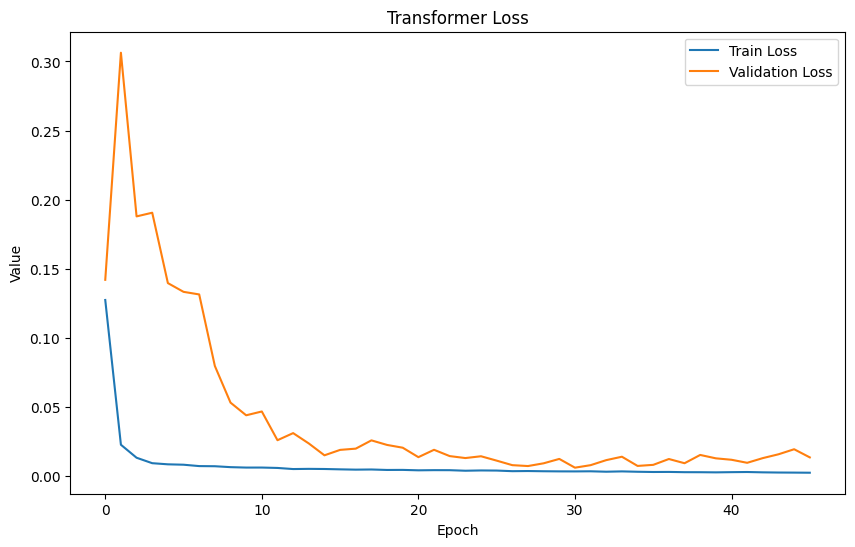

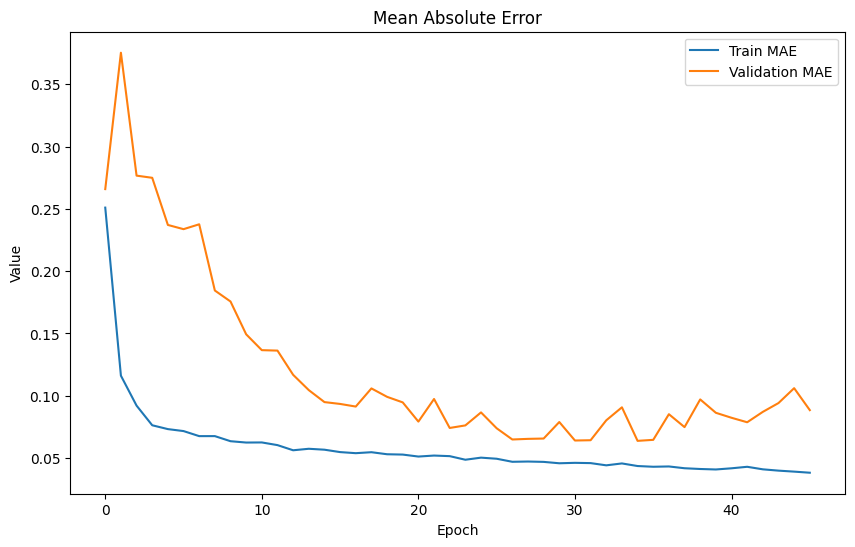

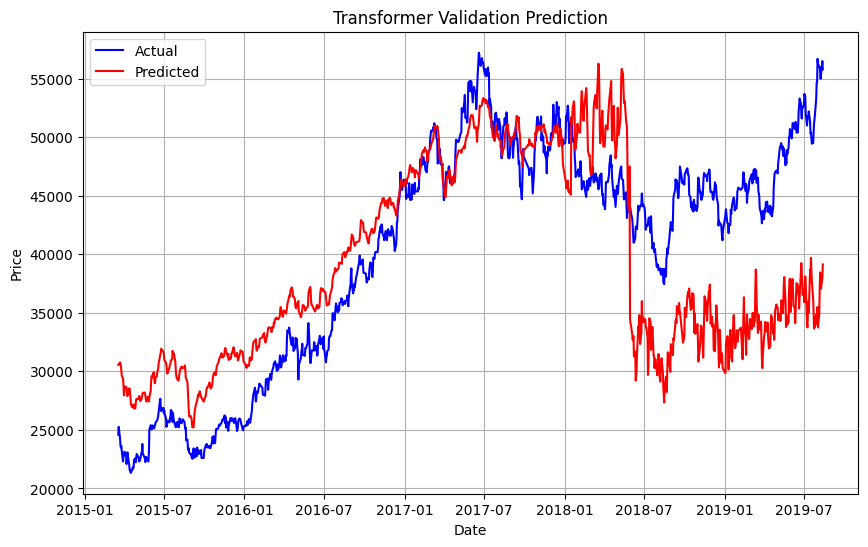

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int4.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int4.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=64, ff_dim=64, num_blocks=3, dropout_rate=0.1, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=80, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/80
108/108 - 43s - 401ms/step - loss: 0.2088 - mae: 0.3294 - val_loss: 0.1916 - val_mae: 0.3215
Epoch 2/80
108/108 - 1s - 10ms/step - loss: 0.0430 - mae: 0.1552 - val_loss: 0.2135 - val_mae: 0.3105
Epoch 3/80
108/108 - 1s - 8ms/step - loss: 0.0301 - mae: 0.1313 - val_loss: 0.2645 - val_mae: 0.3601
Epoch 4/80
108/108 - 1s - 10ms/step - loss: 0.0226 - mae: 0.1148 - val_loss: 0.2481 - val_mae: 0.3426
Epoch 5/80
108/108 - 1s - 7ms/step - loss: 0.0176 - mae: 0.1029 - val_loss: 0.2295 - val_mae: 0.3321
Epoch 6/80
108/108 - 2s - 14ms/step - loss: 0.0142 - mae: 0.0934 - val_loss: 0.1707 - val_mae: 0.2783
Epoch 7/80
108/108 - 1s - 11ms/step - loss: 0.0119 - mae: 0.0861 - val_loss: 0.1418 - val_mae: 0.2569
Epoch 8/80
108/108 - 2s - 15ms/step - loss: 0.0101 - mae: 0.0797 - val_loss: 0.1462 - val_mae: 0.2598
Epoch 9/80
108/108 - 2s - 15ms/step - loss: 0.0090 - mae: 0.0744 - val_loss: 0.1262 - val_mae: 0.2411
Epoch 10/80
108/108 - 1s - 11ms/step - loss: 0.0088 - mae: 0.0738 - val_loss: 0.12

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.01341143846523159
Root Mean Squared Error (RMSE): 0.11580776513356775
Mean Absolute Error (MAE): 0.08442318220317446
R^2 Score: -0.04386296111414545

### After Inverse Transform
Mean Squared Error (MSE): 104750532.26836336
Root Mean Squared Error (RMSE): 10234.770748207473
Mean Absolute Error (MAE): 7463.061686648776
R^2 Score: -0.064753506908793


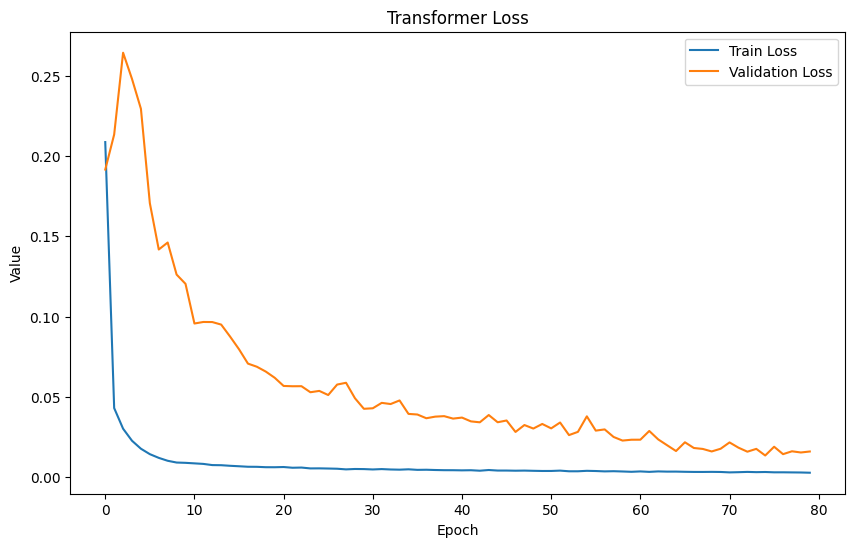

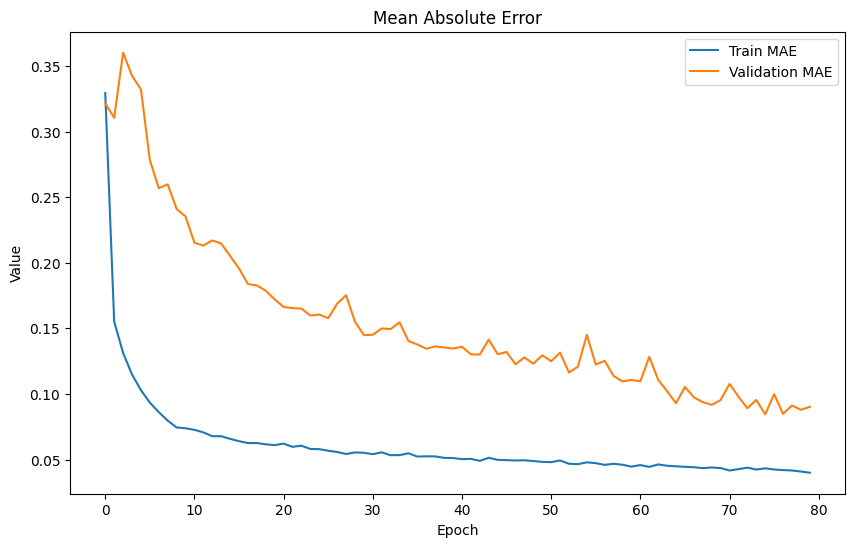

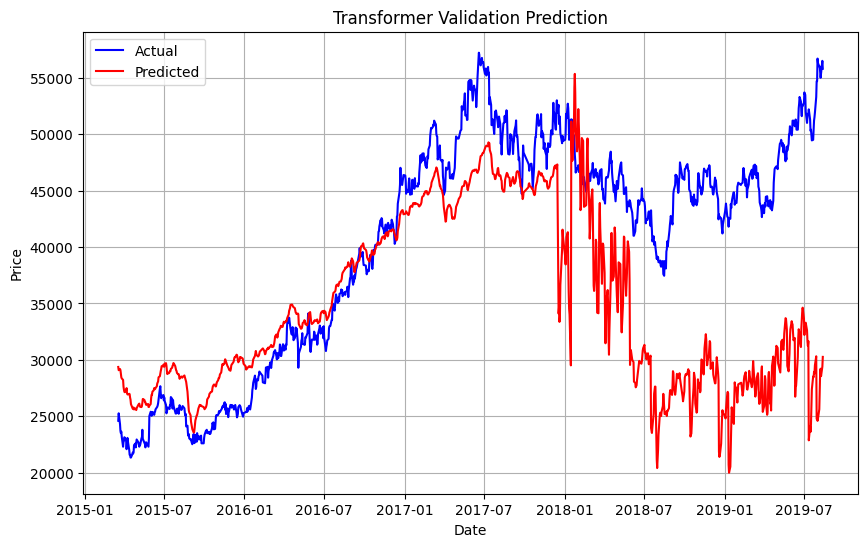

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int4.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int4.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=4, key_dim=32, ff_dim=64, num_blocks=4, dropout_rate=0.1, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=80, batch_size=64
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/80
54/54 - 37s - 677ms/step - loss: 0.2631 - mae: 0.3856 - val_loss: 0.1216 - val_mae: 0.2790
Epoch 2/80
54/54 - 1s - 13ms/step - loss: 0.0543 - mae: 0.1770 - val_loss: 0.0812 - val_mae: 0.1991
Epoch 3/80
54/54 - 1s - 11ms/step - loss: 0.0421 - mae: 0.1549 - val_loss: 0.0828 - val_mae: 0.2060
Epoch 4/80
54/54 - 1s - 12ms/step - loss: 0.0328 - mae: 0.1370 - val_loss: 0.0746 - val_mae: 0.1994
Epoch 5/80
54/54 - 1s - 11ms/step - loss: 0.0297 - mae: 0.1285 - val_loss: 0.0719 - val_mae: 0.1970
Epoch 6/80
54/54 - 1s - 12ms/step - loss: 0.0231 - mae: 0.1141 - val_loss: 0.0653 - val_mae: 0.1875
Epoch 7/80
54/54 - 1s - 11ms/step - loss: 0.0221 - mae: 0.1134 - val_loss: 0.0671 - val_mae: 0.1891
Epoch 8/80
54/54 - 1s - 11ms/step - loss: 0.0217 - mae: 0.1112 - val_loss: 0.0630 - val_mae: 0.1837
Epoch 9/80
54/54 - 1s - 13ms/step - loss: 0.0194 - mae: 0.1064 - val_loss: 0.0649 - val_mae: 0.1870
Epoch 10/80
54/54 - 1s - 12ms/step - loss: 0.0183 - mae: 0.1028 - val_loss: 0.0637 - val_mae: 0.18

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.015747743907919835
Root Mean Squared Error (RMSE): 0.12549001517220337
Mean Absolute Error (MAE): 0.09484724126434603
R^2 Score: -0.22570644671742746

### After Inverse Transform
Mean Squared Error (MSE): 122883342.14554285
Root Mean Squared Error (RMSE): 11085.27591652742
Mean Absolute Error (MAE): 8363.594455144852
R^2 Score: -0.2490673475046019


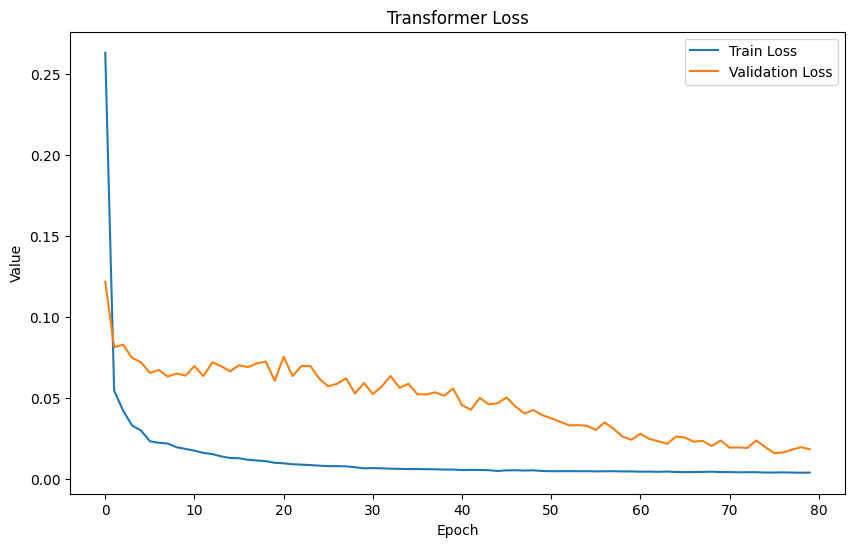

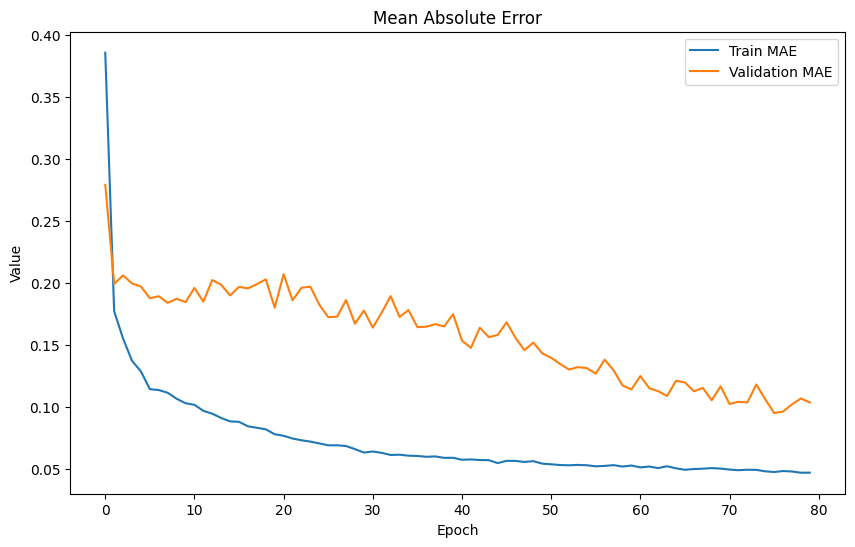

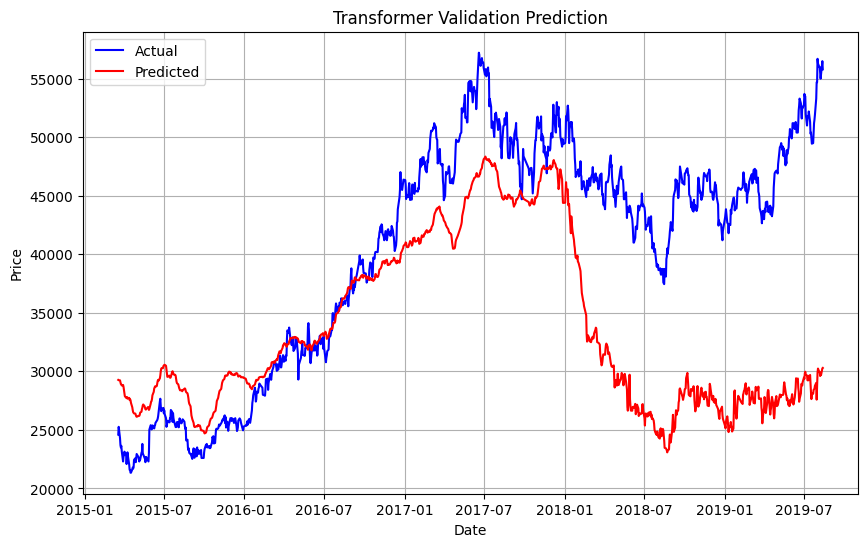

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int4.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int4.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

# !! Final: same (-1)

In [ ]:
seq_length = 90 # 예: 30일간의 데이터를 기반으로 예측
x_train, y_train = create_sequences(x_train_same_df, y_train_same_df, seq_length)
x_val, y_val = create_sequences(x_val_same_df, y_val_same_df, seq_length)
x_test, y_test = create_sequences(x_test_same_df, y_test_same_df, seq_length)

###1 너무ㄱㅊ게 나와서 폐기

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.2, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=50, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/100
108/108 - 57s - 529ms/step - loss: 0.2873 - mae: 0.4029 - val_loss: 0.1812 - val_mae: 0.3380
Epoch 2/100
108/108 - 2s - 16ms/step - loss: 0.0645 - mae: 0.2010 - val_loss: 0.0604 - val_mae: 0.2008
Epoch 3/100
108/108 - 2s - 20ms/step - loss: 0.0335 - mae: 0.1457 - val_loss: 0.0327 - val_mae: 0.1508
Epoch 4/100
108/108 - 1s - 9ms/step - loss: 0.0236 - mae: 0.1216 - val_loss: 0.0364 - val_mae: 0.1593
Epoch 5/100
108/108 - 1s - 10ms/step - loss: 0.0165 - mae: 0.1020 - val_loss: 0.0098 - val_mae: 0.0882
Epoch 6/100
108/108 - 1s - 12ms/step - loss: 0.0145 - mae: 0.0957 - val_loss: 0.0132 - val_mae: 0.0979
Epoch 7/100
108/108 - 1s - 11ms/step - loss: 0.0119 - mae: 0.0858 - val_loss: 0.0136 - val_mae: 0.0998
Epoch 8/100
108/108 - 1s - 13ms/step - loss: 0.0103 - mae: 0.0809 - val_loss: 0.0102 - val_mae: 0.0877
Epoch 9/100
108/108 - 1s - 13ms/step - loss: 0.0086 - mae: 0.0739 - val_loss: 0.0147 - val_mae: 0.1037
Epoch 10/100
108/108 - 3s - 25ms/step - loss: 0.0077 - mae: 0.0696 - val

34/34 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.0029020304426655677
Root Mean Squared Error (RMSE): 0.053870496959519204
Mean Absolute Error (MAE): 0.04353212833573943
R^2 Score: 0.7741239987807704

### After Inverse Transform
Mean Squared Error (MSE): 19548032.102392804
Root Mean Squared Error (RMSE): 4421.315652878994
Mean Absolute Error (MAE): 3814.82835042994
R^2 Score: 0.8013009071794991


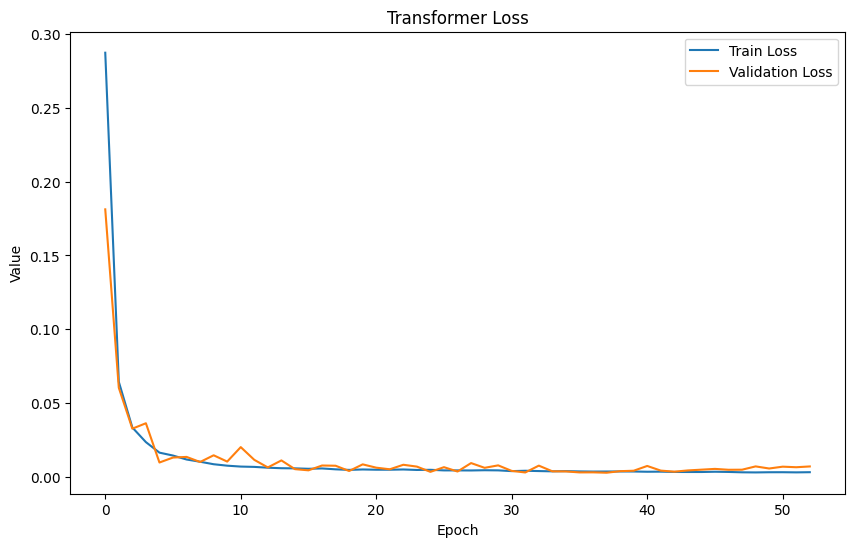

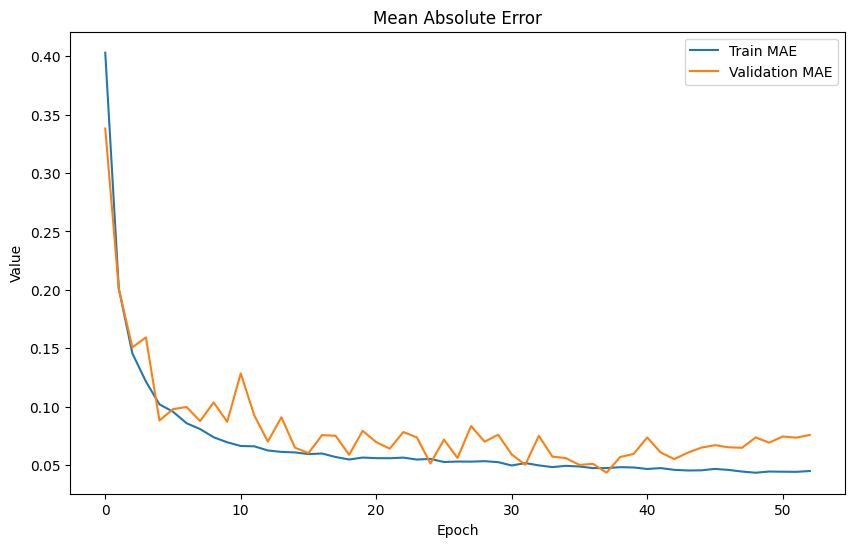

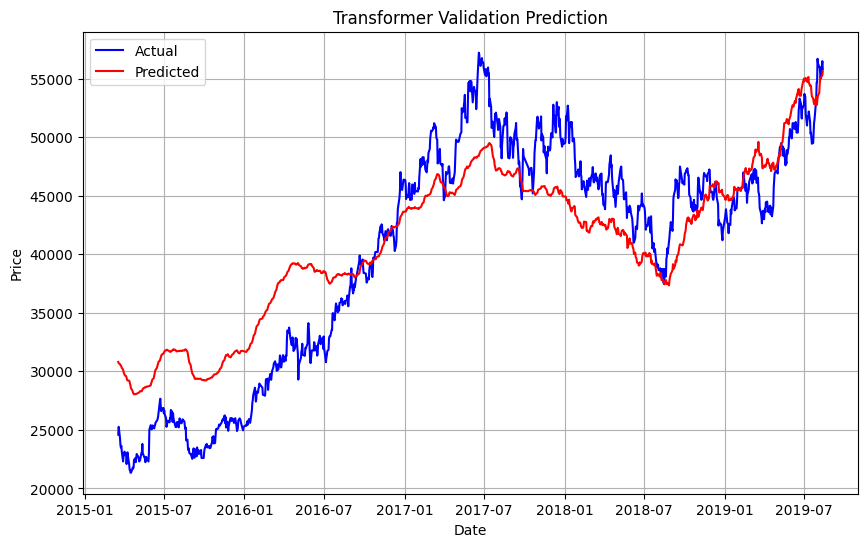

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_same_df.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_same_df.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=64, ff_dim=64, num_blocks=2, dropout_rate=0.1, lr=0.0003,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=50, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/50
108/108 - 25s - 230ms/step - loss: 0.1026 - mae: 0.2375 - val_loss: 0.0532 - val_mae: 0.1862
Epoch 2/50
108/108 - 1s - 7ms/step - loss: 0.0234 - mae: 0.1203 - val_loss: 0.0275 - val_mae: 0.1355
Epoch 3/50
108/108 - 1s - 10ms/step - loss: 0.0132 - mae: 0.0903 - val_loss: 0.0364 - val_mae: 0.1550
Epoch 4/50
108/108 - 1s - 6ms/step - loss: 0.0086 - mae: 0.0731 - val_loss: 0.0297 - val_mae: 0.1440
Epoch 5/50
108/108 - 1s - 6ms/step - loss: 0.0067 - mae: 0.0649 - val_loss: 0.0363 - val_mae: 0.1556
Epoch 6/50
108/108 - 1s - 12ms/step - loss: 0.0055 - mae: 0.0590 - val_loss: 0.0390 - val_mae: 0.1637
Epoch 7/50
108/108 - 1s - 11ms/step - loss: 0.0046 - mae: 0.0539 - val_loss: 0.0265 - val_mae: 0.1386
Epoch 8/50
108/108 - 1s - 12ms/step - loss: 0.0044 - mae: 0.0525 - val_loss: 0.0300 - val_mae: 0.1456
Epoch 9/50
108/108 - 2s - 22ms/step - loss: 0.0042 - mae: 0.0507 - val_loss: 0.0244 - val_mae: 0.1336
Epoch 10/50
108/108 - 2s - 16ms/step - loss: 0.0038 - mae: 0.0490 - val_loss: 0.027

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.01563003417643666
Root Mean Squared Error (RMSE): 0.1250201350840602
Mean Absolute Error (MAE): 0.11462001777115574
R^2 Score: -0.21654465328441774

### After Inverse Transform
Mean Squared Error (MSE): 132634787.63003594
Root Mean Squared Error (RMSE): 11516.717745522634
Mean Absolute Error (MAE): 10340.895041623384
R^2 Score: -0.34818747178658405


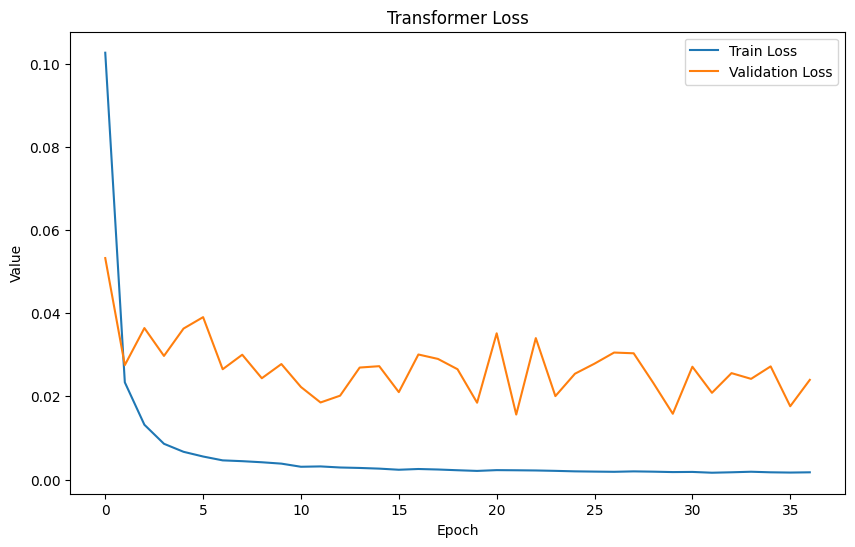

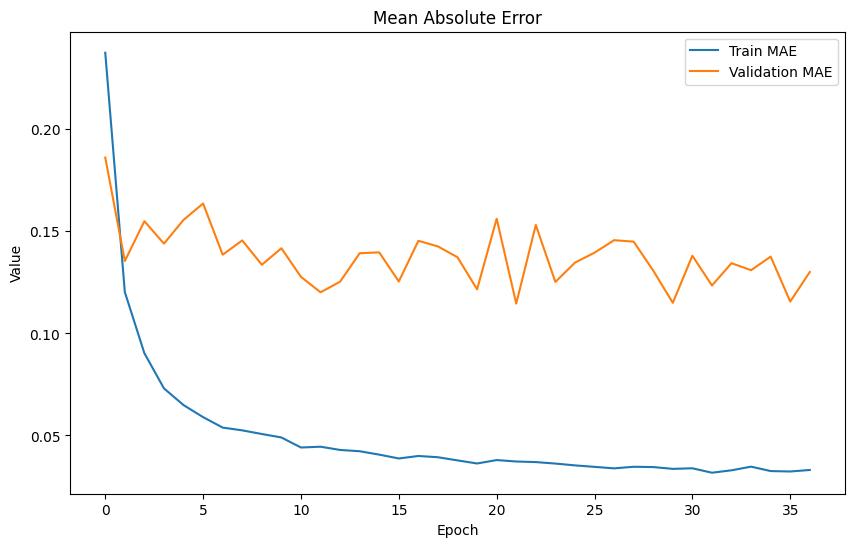

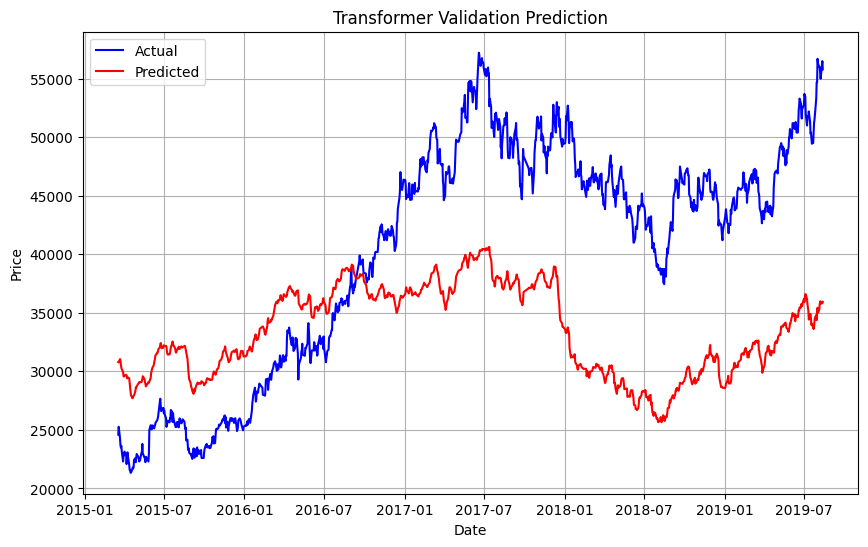

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_same_df.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_same_df.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

###2

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=2, key_dim=128, ff_dim=256, num_blocks=2, dropout_rate=0.2, lr=0.0005,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=50, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/50
108/108 - 44s - 403ms/step - loss: 0.1335 - mae: 0.2548 - val_loss: 0.1002 - val_mae: 0.2956
Epoch 2/50
108/108 - 1s - 13ms/step - loss: 0.0181 - mae: 0.1065 - val_loss: 0.0616 - val_mae: 0.2223
Epoch 3/50
108/108 - 2s - 23ms/step - loss: 0.0095 - mae: 0.0773 - val_loss: 0.0272 - val_mae: 0.1420
Epoch 4/50
108/108 - 2s - 19ms/step - loss: 0.0077 - mae: 0.0695 - val_loss: 0.0314 - val_mae: 0.1527
Epoch 5/50
108/108 - 1s - 8ms/step - loss: 0.0065 - mae: 0.0641 - val_loss: 0.0481 - val_mae: 0.1942
Epoch 6/50
108/108 - 1s - 8ms/step - loss: 0.0062 - mae: 0.0620 - val_loss: 0.0165 - val_mae: 0.1156
Epoch 7/50
108/108 - 1s - 7ms/step - loss: 0.0055 - mae: 0.0597 - val_loss: 0.0204 - val_mae: 0.1242
Epoch 8/50
108/108 - 1s - 7ms/step - loss: 0.0054 - mae: 0.0577 - val_loss: 0.0228 - val_mae: 0.1306
Epoch 9/50
108/108 - 1s - 7ms/step - loss: 0.0048 - mae: 0.0552 - val_loss: 0.0411 - val_mae: 0.1805
Epoch 10/50
108/108 - 1s - 12ms/step - loss: 0.0049 - mae: 0.0553 - val_loss: 0.0176 

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.0135425970107569
Root Mean Squared Error (RMSE): 0.11637266436219848
Mean Absolute Error (MAE): 0.10361939568909598
R^2 Score: -0.054071526590728114

### After Inverse Transform
Mean Squared Error (MSE): 123573161.71090215
Root Mean Squared Error (RMSE): 11116.34659908111
Mean Absolute Error (MAE): 9600.1314617238
R^2 Score: -0.25607912859483006


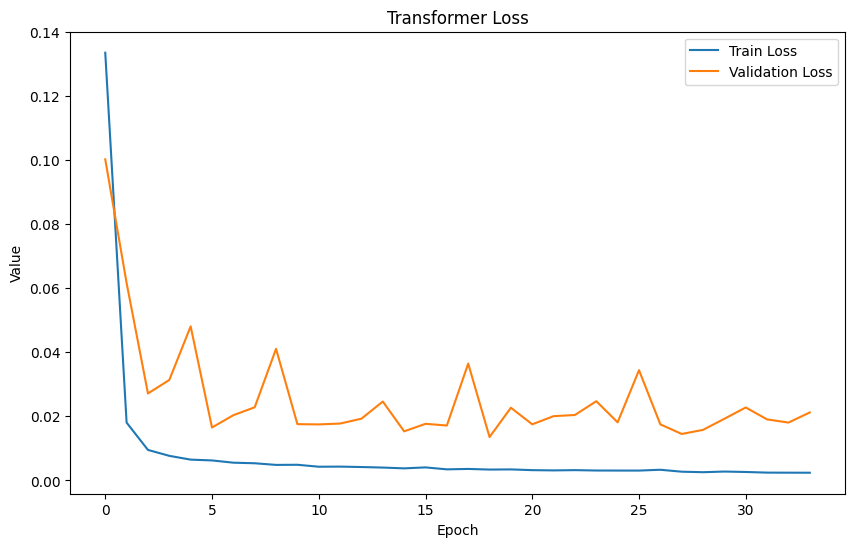

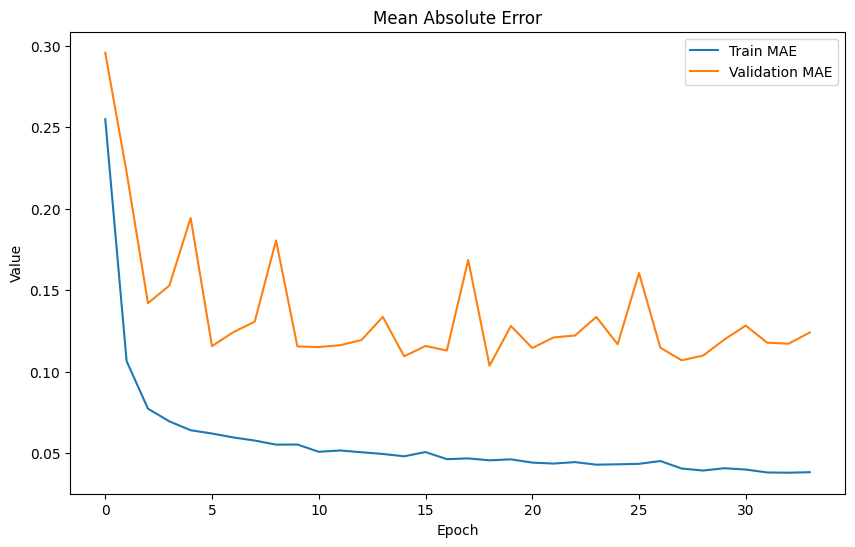

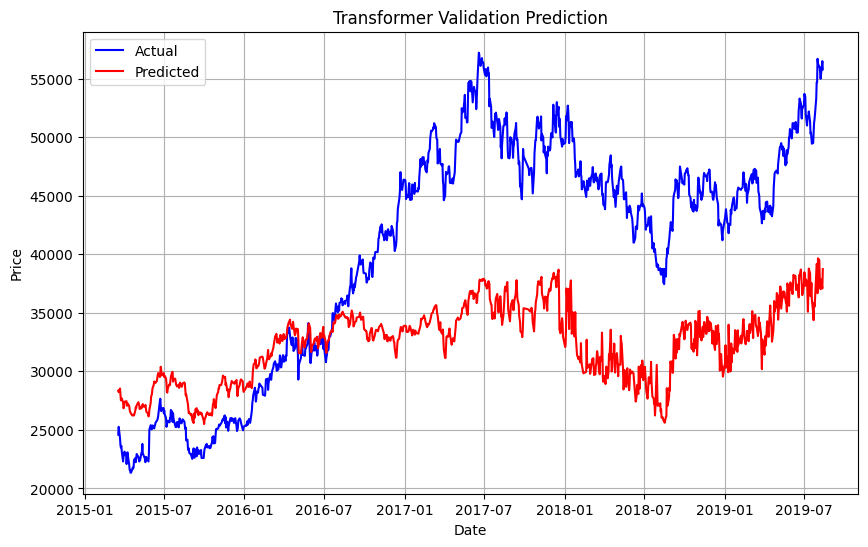

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_same_df.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_same_df.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

#!! Final: interp (-1)

In [ ]:
seq_length = 90  # 예: 30일간의 데이터를 기반으로 예측
x_train, y_train = create_sequences(x_train_int_df, y_train_int_df, seq_length)
x_val, y_val = create_sequences(x_val_int_df, y_val_int_df, seq_length)
x_test, y_test = create_sequences(x_test_int_df, y_test_int_df, seq_length)

###1

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=3, key_dim=128, ff_dim=256, num_blocks=3, dropout_rate=0.2, lr=0.0001,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=50, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/50
108/108 - 41s - 378ms/step - loss: 0.2068 - mae: 0.3512 - val_loss: 0.0770 - val_mae: 0.2460
Epoch 2/50
108/108 - 14s - 125ms/step - loss: 0.0689 - mae: 0.2093 - val_loss: 0.0535 - val_mae: 0.2065
Epoch 3/50
108/108 - 2s - 17ms/step - loss: 0.0431 - mae: 0.1656 - val_loss: 0.0114 - val_mae: 0.0930
Epoch 4/50
108/108 - 3s - 27ms/step - loss: 0.0288 - mae: 0.1353 - val_loss: 0.0107 - val_mae: 0.0927
Epoch 5/50
108/108 - 2s - 16ms/step - loss: 0.0210 - mae: 0.1155 - val_loss: 0.0083 - val_mae: 0.0760
Epoch 6/50
108/108 - 1s - 12ms/step - loss: 0.0175 - mae: 0.1048 - val_loss: 0.0110 - val_mae: 0.0952
Epoch 7/50
108/108 - 2s - 16ms/step - loss: 0.0147 - mae: 0.0960 - val_loss: 0.0147 - val_mae: 0.1121
Epoch 8/50
108/108 - 2s - 19ms/step - loss: 0.0126 - mae: 0.0892 - val_loss: 0.0119 - val_mae: 0.1031
Epoch 9/50
108/108 - 1s - 13ms/step - loss: 0.0104 - mae: 0.0815 - val_loss: 0.0113 - val_mae: 0.1003
Epoch 10/50
108/108 - 3s - 26ms/step - loss: 0.0095 - mae: 0.0777 - val_loss: 

34/34 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.008344019166602845
Root Mean Squared Error (RMSE): 0.09134560288597829
Mean Absolute Error (MAE): 0.07603878017152901
R^2 Score: 0.3505534415697873

### After Inverse Transform
Mean Squared Error (MSE): 64164961.28190682
Root Mean Squared Error (RMSE): 8010.3034450579225
Mean Absolute Error (MAE): 6921.985386729571
R^2 Score: 0.3477850081892987


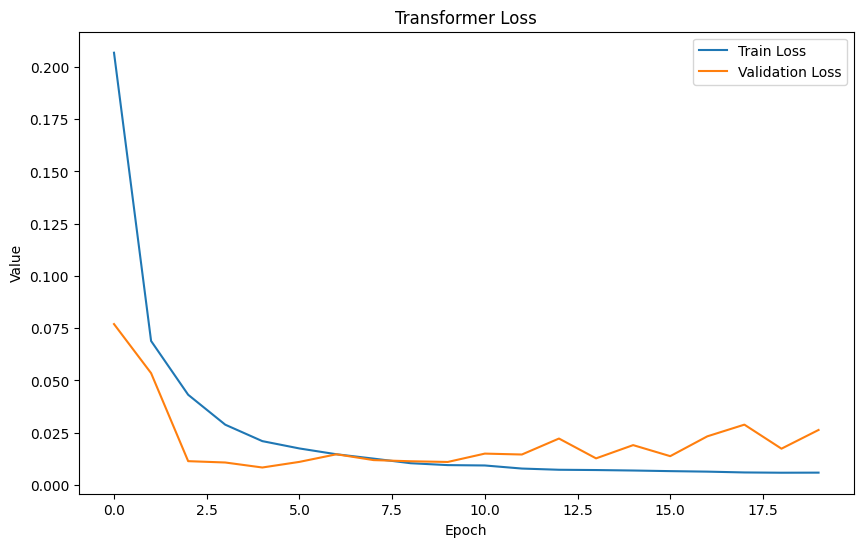

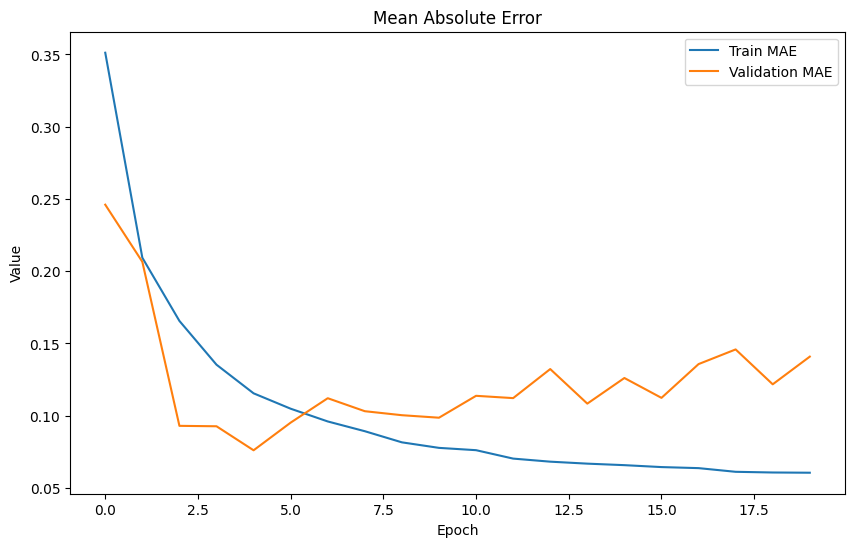

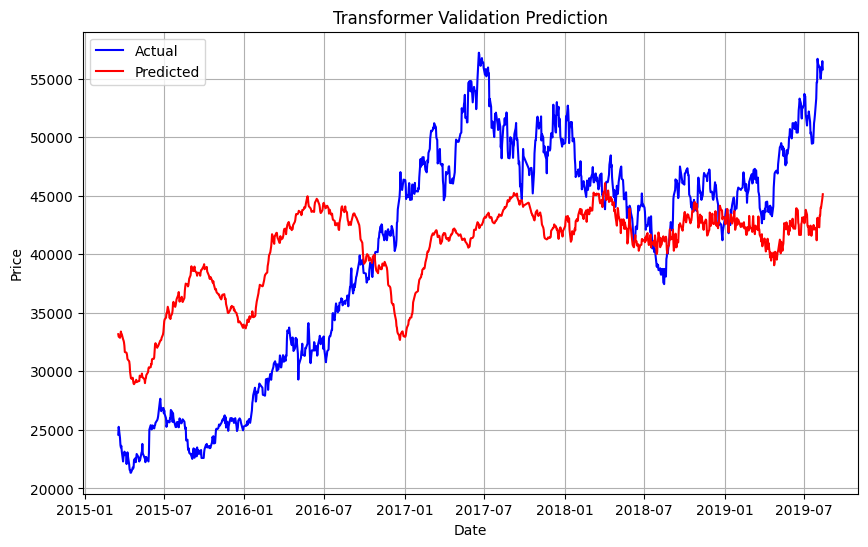

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int_df.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int_df.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)

###2

In [ ]:
history, model = train_model(
    x_train=x_train, y_train=y_train,
    x_val=x_val, y_val=y_val,
    num_heads=2, key_dim=128, ff_dim=256, num_blocks=2, dropout_rate=0.2, lr=0.0005,
    initial_learning_rate=0.0005, decay_steps=5000, decay_rate=0.95, staircase=False, ##
    epochs=70, batch_size=32
)
#lossplot(history)
#predictplot(model, x_test, y_test, y_scaler)

Epoch 1/70
108/108 - 31s - 283ms/step - loss: 0.1122 - mae: 0.2344 - val_loss: 0.0816 - val_mae: 0.2243
Epoch 2/70
108/108 - 20s - 185ms/step - loss: 0.0176 - mae: 0.1045 - val_loss: 0.0488 - val_mae: 0.1841
Epoch 3/70
108/108 - 1s - 10ms/step - loss: 0.0107 - mae: 0.0818 - val_loss: 0.0368 - val_mae: 0.1655
Epoch 4/70
108/108 - 1s - 8ms/step - loss: 0.0078 - mae: 0.0700 - val_loss: 0.0380 - val_mae: 0.1675
Epoch 5/70
108/108 - 1s - 11ms/step - loss: 0.0066 - mae: 0.0642 - val_loss: 0.0295 - val_mae: 0.1516
Epoch 6/70
108/108 - 1s - 7ms/step - loss: 0.0060 - mae: 0.0615 - val_loss: 0.0270 - val_mae: 0.1459
Epoch 7/70
108/108 - 1s - 12ms/step - loss: 0.0055 - mae: 0.0581 - val_loss: 0.0225 - val_mae: 0.1357
Epoch 8/70
108/108 - 1s - 8ms/step - loss: 0.0050 - mae: 0.0565 - val_loss: 0.0258 - val_mae: 0.1420
Epoch 9/70
108/108 - 1s - 13ms/step - loss: 0.0048 - mae: 0.0546 - val_loss: 0.0267 - val_mae: 0.1436
Epoch 10/70
108/108 - 3s - 26ms/step - loss: 0.0049 - mae: 0.0559 - val_loss: 0.0

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step
### Scaled Data (Before Inverse Transform)
Mean Squared Error (MSE): 0.022503555291789584
Root Mean Squared Error (RMSE): 0.1500118505045171
Mean Absolute Error (MAE): 0.13566331034605134
R^2 Score: -0.7515367887927547

### After Inverse Transform
Mean Squared Error (MSE): 184830694.2351947
Root Mean Squared Error (RMSE): 13595.245280435169
Mean Absolute Error (MAE): 12014.558503578024
R^2 Score: -0.8787410966764844


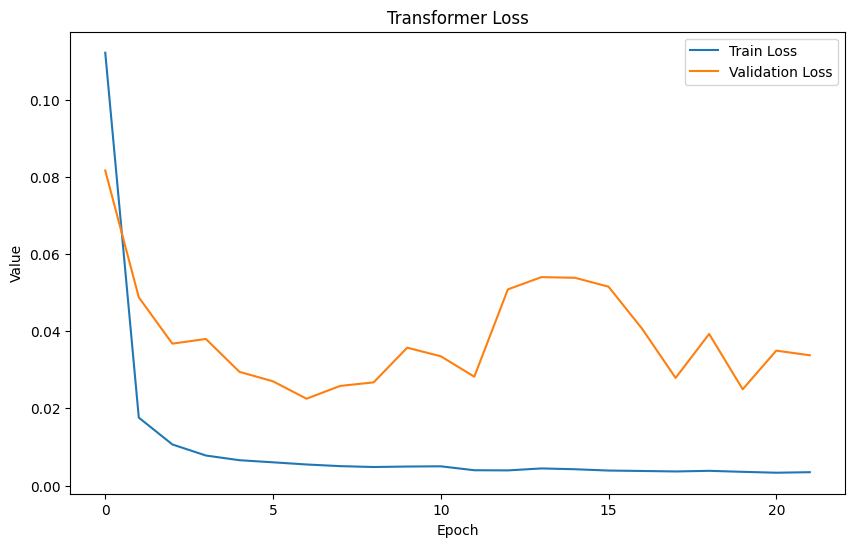

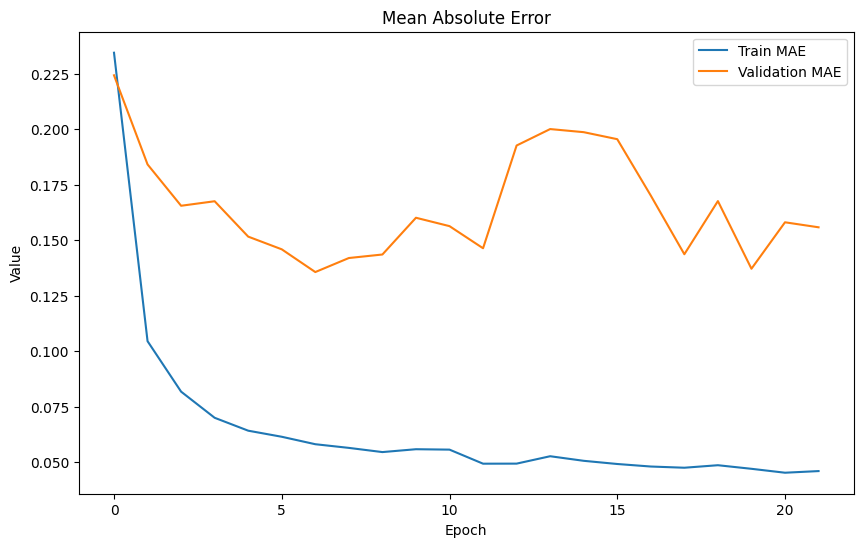

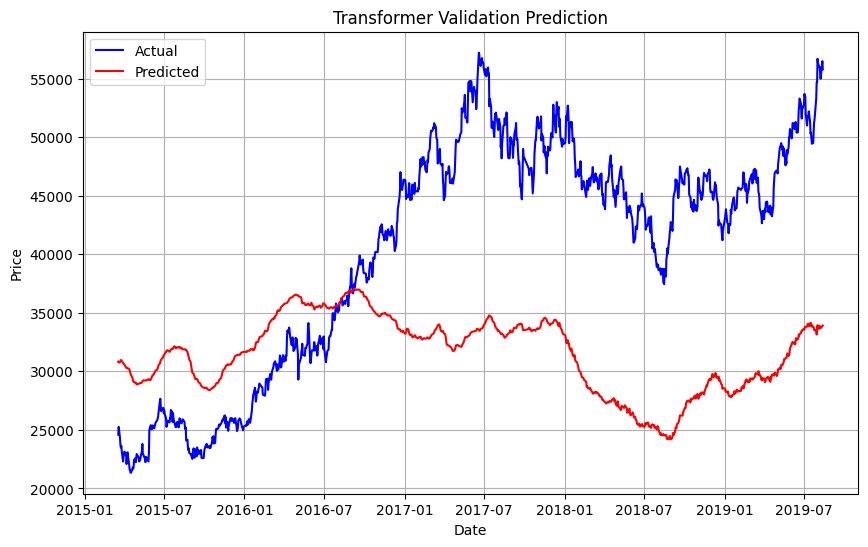

In [ ]:
y_pred = model.predict(x_val)
y_pred_rev = np.round(np.exp(y_scaler_int_df.inverse_transform(y_pred)), 4)
y_val_rev = np.round(np.exp(y_scaler_int_df.inverse_transform(y_val)), 4)

lossplot_merge(history, y_val, y_pred, y_val_rev, y_pred_rev)